## Проверка датасета (LLM + Spacy)

построение сцены (json) по заранее сгенерированному тексту


По сгенерированному jsonl отрисуем по каждой строчке граф и выведем все параметры
(убедимся что все хорошо перед большой генерацией)


In [10]:
import os
import json
import time
import random
import spacy
import re

from spacy.matcher import Matcher, DependencyMatcher
from dotenv import load_dotenv
from tqdm import tqdm

from collections import Counter, defaultdict
from openai import OpenAI

import networkx as nx
import matplotlib.pyplot as plt

BATCH_NUM = 15 # или 1

In [11]:
# граф со spacial связями
def build_scene_graph_sp(objects, attributes, spatial_relations=None):
    """
    Создаёт ориентированный граф сцены.
    Объекты, признаки и пространственные связи представлены вершинами и рёбрами.
    """
    G = nx.DiGraph()

    # Добавляем все объекты
    for obj in objects:
        G.add_node(obj, type="object")

    # Добавляем признаки и рёбра к ним
    for obj, attrs in attributes.items():
        for attr in attrs:
            G.add_node(attr, type="attribute")
            G.add_edge(obj, attr, relation_type="attribute")

    # Добавляем пространственные связи между объектами если они заданы
    if spatial_relations:
        for subj, prep, obj in spatial_relations:
            label = prep
            G.add_edge(subj, obj, relation_type="spatial", label=label)

    return G

def draw_scene_graph_sp(G, figsize=(12, 8)):
    """
    Визуализирует граф сцены с цветовой разметкой:
    - Объекты — синие узлы
    - Признаки — зелёные узлы
    - Связи объект-признак — серые стрелки
    - Пространственные связи между объектами — красные стрелки
    """
    #pos = nx.spring_layout(G, seed=42)
    pos = nx.spring_layout(G, seed=42, k=1.5)
    
    node_colors = []

    for node in G.nodes(data=True):
        if node[1].get("type") == "object":
            node_colors.append("skyblue")
        else:
            node_colors.append("lightgreen")

    #plt.figure(figsize=figsize)
    plt.figure(figsize=figsize, dpi=120)    

    # Разделяем рёбра по типам
    attr_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get("relation_type") == "attribute"]
    spatial_edges = [(u, v) for u, v, d in G.edges(data=True) if d.get("relation_type") == "spatial"]
    spatial_labels = {(u, v): d.get("label", "") for u, v, d in G.edges(data=True) if d.get("relation_type") == "spatial"}

    # Рисуем узлы
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=1800)
    nx.draw_networkx_labels(G, pos, font_size=8)

    # Рисуем рёбра
    nx.draw_networkx_edges(
        G, pos,
        edgelist=spatial_edges,
        edge_color='red',
        arrows=True,
        arrowstyle='-|>',
        connectionstyle='arc3,rad=0.15',
        min_source_margin=20,
        min_target_margin=20,        
        width=2
    )    
    
    nx.draw_networkx_edges(
        G, pos,
        edgelist=attr_edges,
        edge_color='gray',
        arrows=True,
        arrowstyle='-|>',
        connectionstyle='arc3,rad=0.05',
        min_source_margin=20,
        min_target_margin=20, 
        width=2
    )

    # Подписи для пространственных рёбер
    nx.draw_networkx_edge_labels(G, pos, edge_labels=spatial_labels, font_color='red')

    plt.title("Scene Graph")
    plt.axis('off')
    plt.show()


{"src_text": "На полке стоит старинный граммофон и рядом с ним старый радиоприемник. Оба предмета покрыты слоем пыли.", "norm_text": "На полке стоит старинный пыльный граммофон и рядом с ним старый пыльный радиоприемник.", "objects": ["полка", "граммофон", "радиоприёмник"], "attributes": {"граммофон": ["пыльный", "старинный"], "радиоприёмник": ["пыльный", "старый"]}, "relations": []}



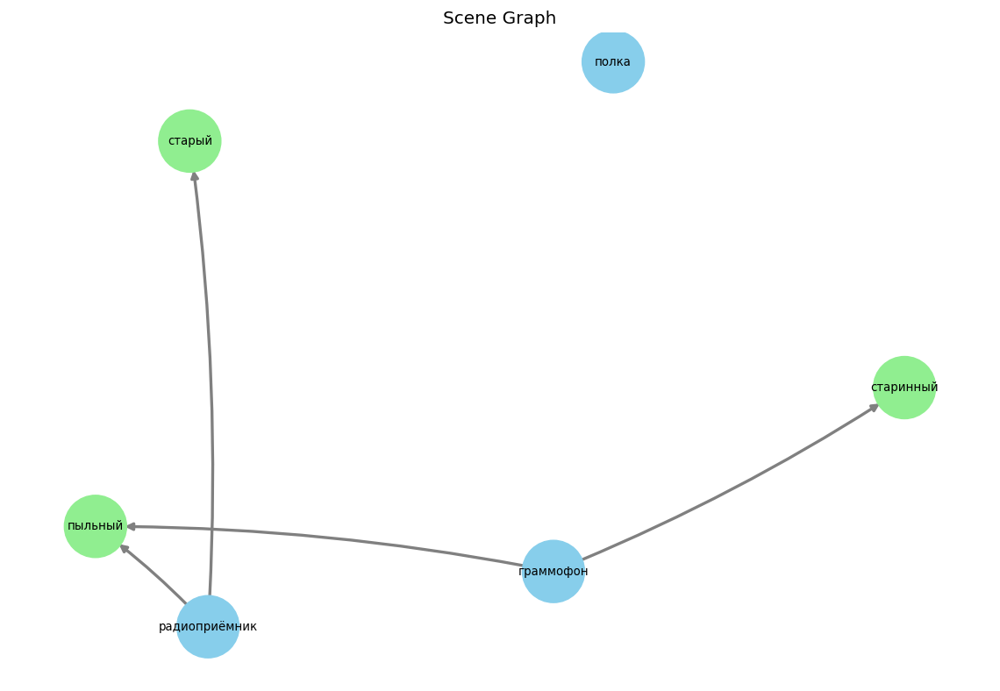


{"src_text": "На кушетке покоится белый медицинский халат. На столике справа стоит компьютер, экран немного наклонён вниз. Под ним лежит стопка журналов, аккуратно сложенная.", "norm_text": "На кушетке покоится белый медицинский халат. На столике справа стоит компьютер с немного наклонённым вниз экраном. Под компьютером лежит аккуратно сложенная стопка журналов.", "objects": ["кушетка", "халат", "столик", "компьютер", "экран", "стопка", "журнал"], "attributes": {"халат": ["белый", "медицинский"], "экран": ["немного вниз наклонённым"], "стопка": ["аккуратно сложенная"]}, "relations": [["стопка", "под", "компьютер"], ["компьютер", "на", "столик"], ["халат", "на", "кушетка"]]}



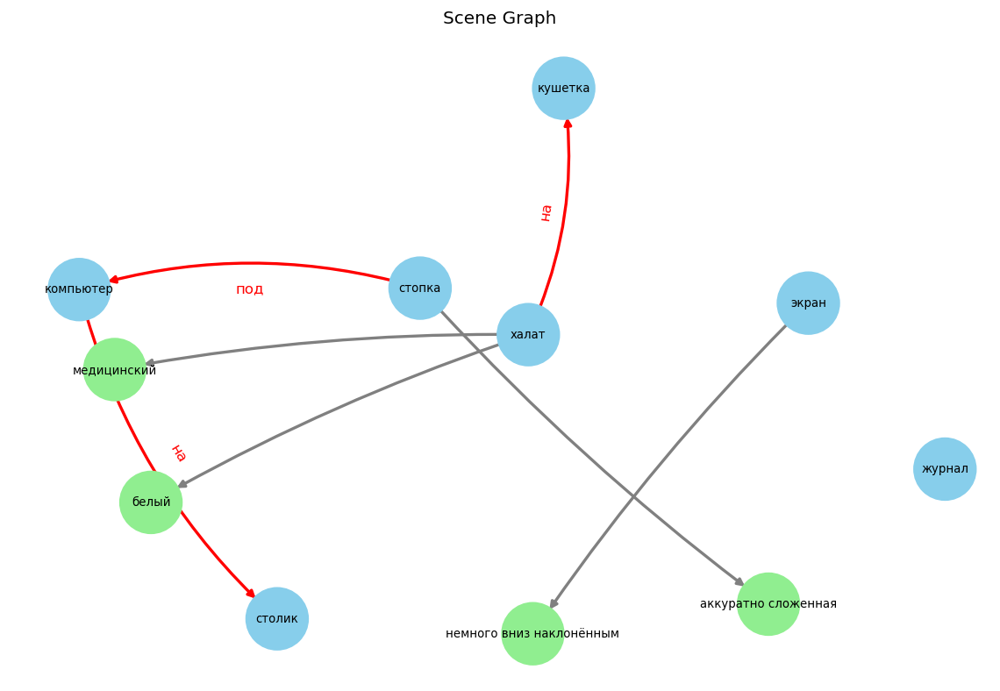


{"src_text": "Корзина для белья почти полна, покрыта легкой тканью. У двери стоит ведро с шваброй, пластик немного поцарапан. В углу свернута полосатая занавеска.", "norm_text": "Корзина для белья почти полна и покрыта легкой тканью. У двери стоит поцарапанное пластиковое ведро с шваброй. В углу свернута полосатая занавеска.", "objects": ["корзина", "бельё", "ткань", "дверь", "ведро", "швабра", "угол", "занавеска"], "attributes": {"корзина": ["почти полна"], "ткань": ["легкой"], "ведро": ["пластиковое", "поцарапанное"], "занавеска": ["полосатая"]}, "relations": [["ведро", "у", "дверь"]]}



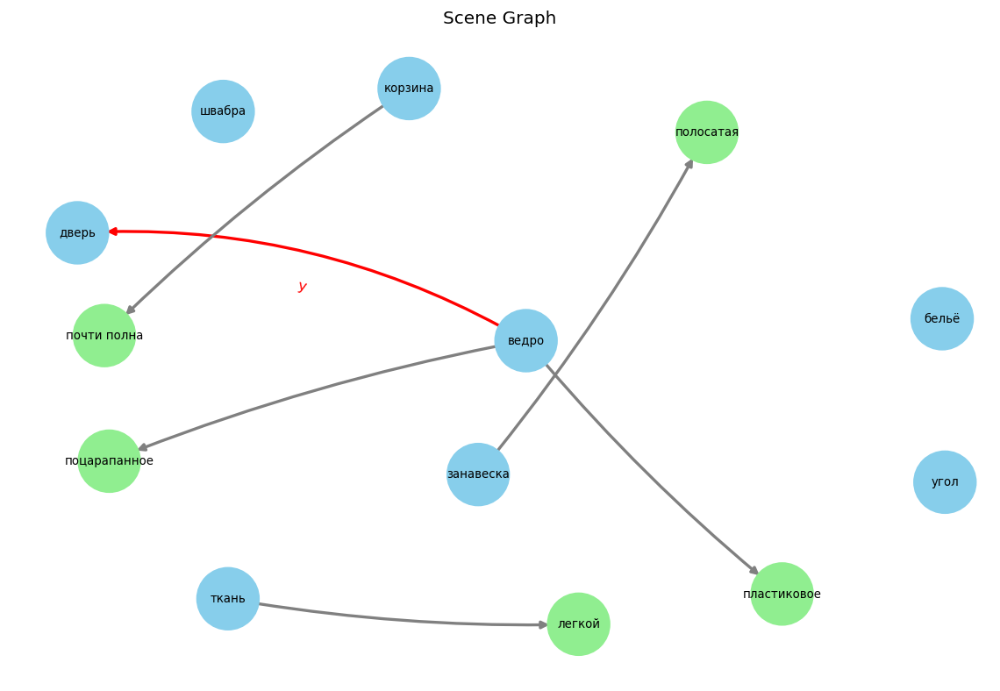


{"src_text": "На письменном столе стоят два ноутбука: один серебристый, другой темный. Рядом с ними лежит блокнот с заметками, а на полу у кровати — тапочки.", "norm_text": "На письменном столе стоят серебристый ноутбук 1 и тёмный ноутбук 2. Рядом с ноутбуками лежит блокнот с заметками, а на полу у кровати находятся тапочки.", "objects": ["стол", "ноутбук 1", "ноутбук 2", "ноутбук", "блокнот", "заметками", "пол", "кровать", "тапочки"], "attributes": {"стол": ["письменном"], "ноутбук": ["серебристый", "тёмный"], "ноутбук 1": ["серебристый"], "ноутбук 2": ["тёмный"]}, "relations": [["блокнот", "рядом с", "ноутбук"], ["тапочки", "на", "пол"], ["ноутбук 2", "на", "стол"], ["тапочки", "у", "кровать"], ["ноутбук 1", "на", "стол"]]}



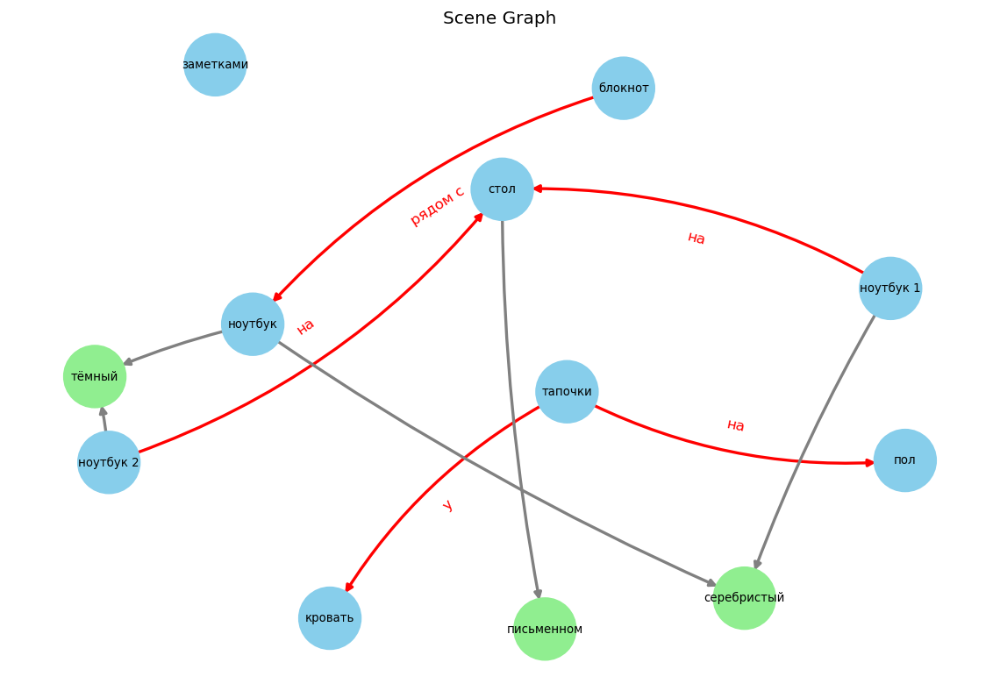


{"src_text": "На лавочке отдыхает кот, рыжий и пушистый. Под ним тихо урчит и щурится от солнечных лучей.", "norm_text": "На лавочке отдыхает рыжий пушистый кот, который тихо урчит и щурится от солнечных лучей.", "objects": ["лавочка", "кот", "луч"], "attributes": {"кот": ["пушистый", "рыжий"], "луч": ["солнечных"]}, "relations": [["кот", "на", "лавочка"]]}



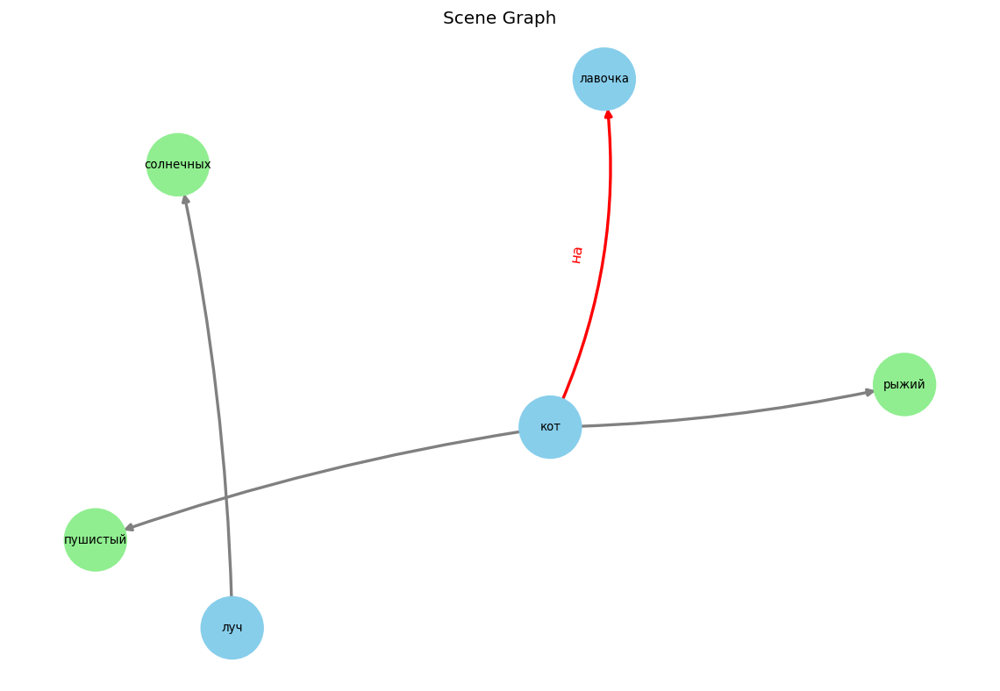


{"src_text": "На фоне комнаты выделяется картонная коробка с игрушками, она аккуратно сложена около стены. Над ней закреплены часы с простым циферблатом.", "norm_text": "На фоне комнаты выделяется аккуратно сложенная картонная коробка с игрушками около стены. Над коробкой закреплены часы с простым циферблатом.", "objects": ["фон", "комната", "коробка", "игрушка", "стена", "час", "циферблат"], "attributes": {"коробка": ["аккуратно сложенная", "картонная"], "циферблат": ["простым"]}, "relations": []}



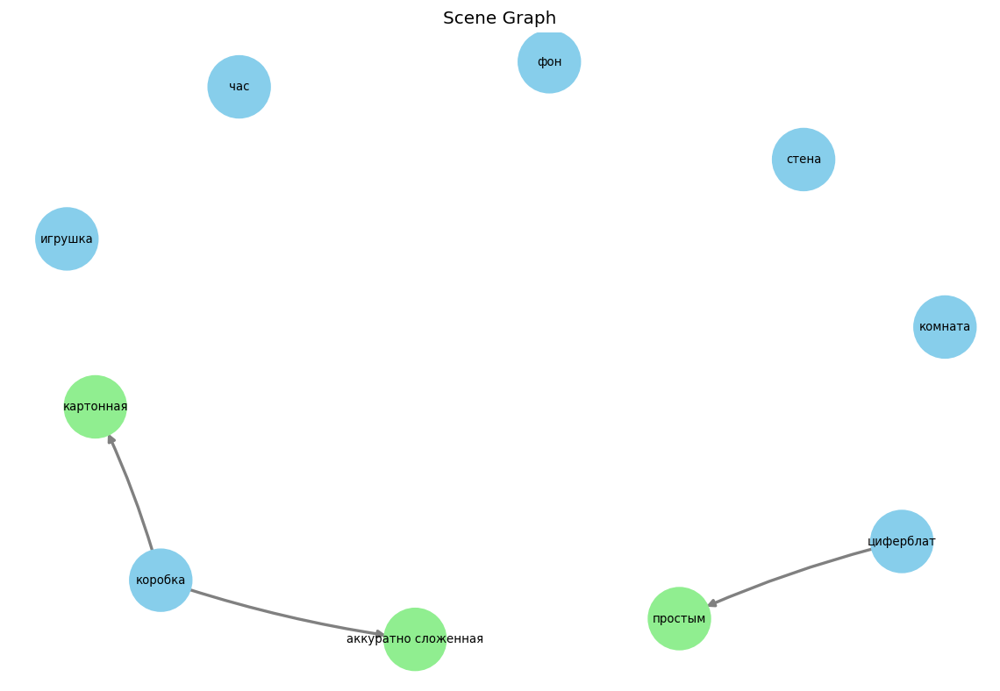


{"src_text": "На подносе три тарелки: керамическая с трещиной по краю, фарфоровая без повреждений и металлическая с потемневшей поверхностью. Они аккуратно расположены рядом с салфеткой.", "norm_text": "На подносе аккуратно расположены керамическая тарелка 1 с трещиной по краю, фарфоровая тарелка 2 без повреждений и металлическая тарелка 3 с потемневшей поверхностью рядом с салфеткой.", "objects": ["поднос", "тарелка 1", "трещина", "край", "тарелка 2", "повреждение", "тарелка 3", "поверхность", "салфетка"], "attributes": {"поверхность": ["потемневшей"], "тарелка 1": ["аккуратно расположены", "аккуратно расположены с поверхностью", "керамическая"], "тарелка 2": ["фарфоровая"], "тарелка 3": ["металлическая"]}, "relations": []}



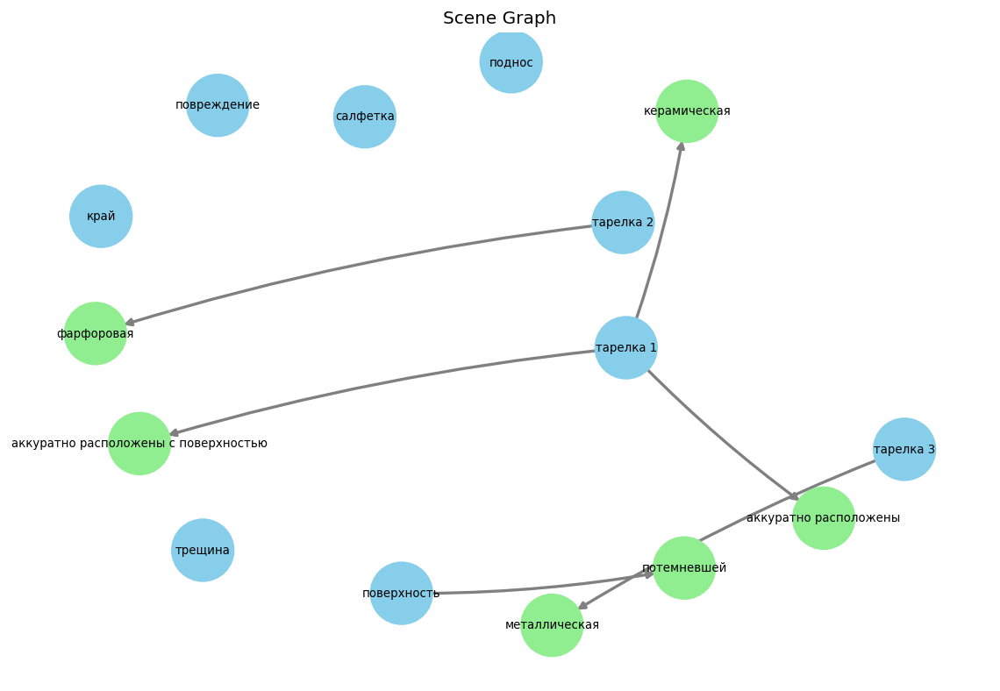


{"src_text": "На картинке висит картина с пейзажем, в стильной раме. Над кроватью размещен небольшой светильник.", "norm_text": "На картинке висит картина с пейзажем в стильной раме. Над кроватью размещен небольшой светильник.", "objects": ["картинка", "картина", "пейзаж", "рама", "кровать", "светильник"], "attributes": {"рама": ["стильной"], "светильник": ["небольшой"]}, "relations": [["картина", "на", "картинка"]]}



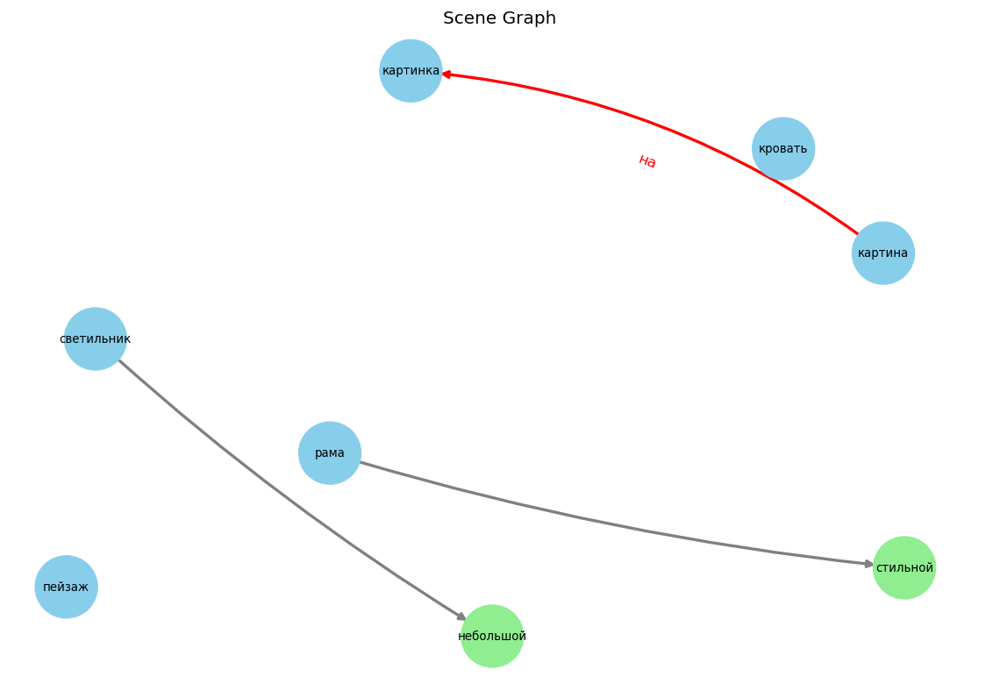


{"src_text": "На плите стоит металлическая кастрюля, блестящая и большая. Рядом с ней оставлен светло-коричневый хлеб, свежий и ароматный.", "norm_text": "На плите стоит большая блестящая металлическая кастрюля. Рядом с кастрюлей оставлен свежий ароматный светло-коричневый хлеб.", "objects": ["плита", "кастрюля", "хлеб"], "attributes": {"кастрюля": ["блестящая", "большая", "металлическая"], "хлеб": ["-", "ароматный", "коричневый", "свежий", "светло"]}, "relations": [["кастрюля", "на", "плита"]]}



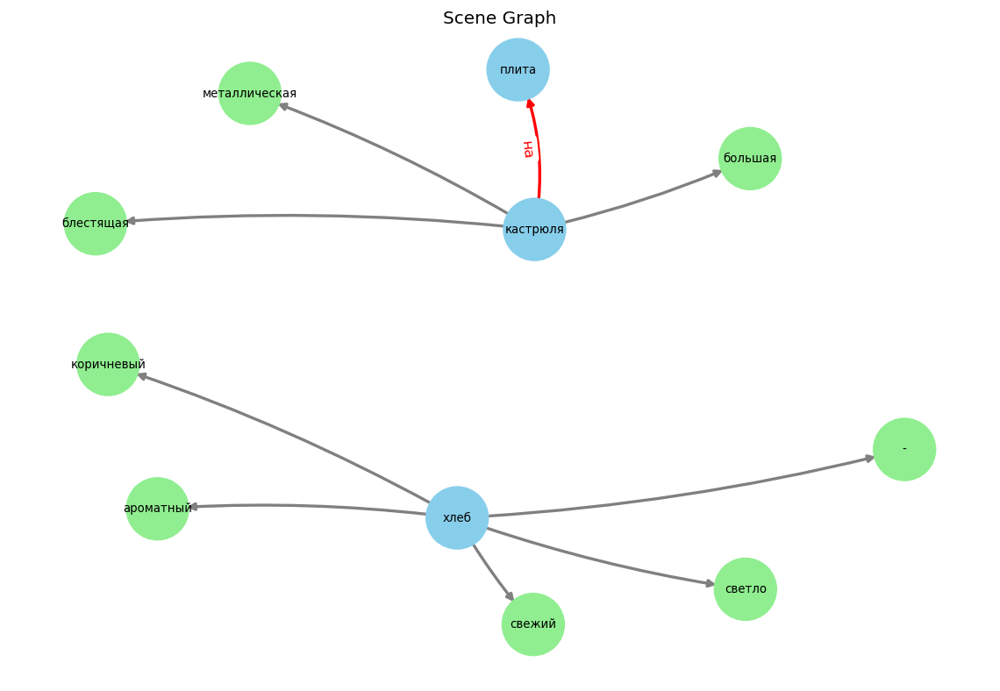


{"src_text": "На полке стоит стеклянная банка с крышкой, чистая и прозрачная. Рядом с ней темный кожаный рюкзак с небольшими потертостями.", "norm_text": "На полке стоит чистая прозрачная стеклянная банка с крышкой. Рядом с банкой находится тёмный кожаный рюкзак с небольшими потертостями.", "objects": ["полка", "банк", "крышка", "банка", "рюкзак", "потертостями"], "attributes": {"банк": ["прозрачная", "стеклянная", "чистая"], "рюкзак": ["кожаный", "тёмный"], "потертостями": ["небольшими"]}, "relations": []}



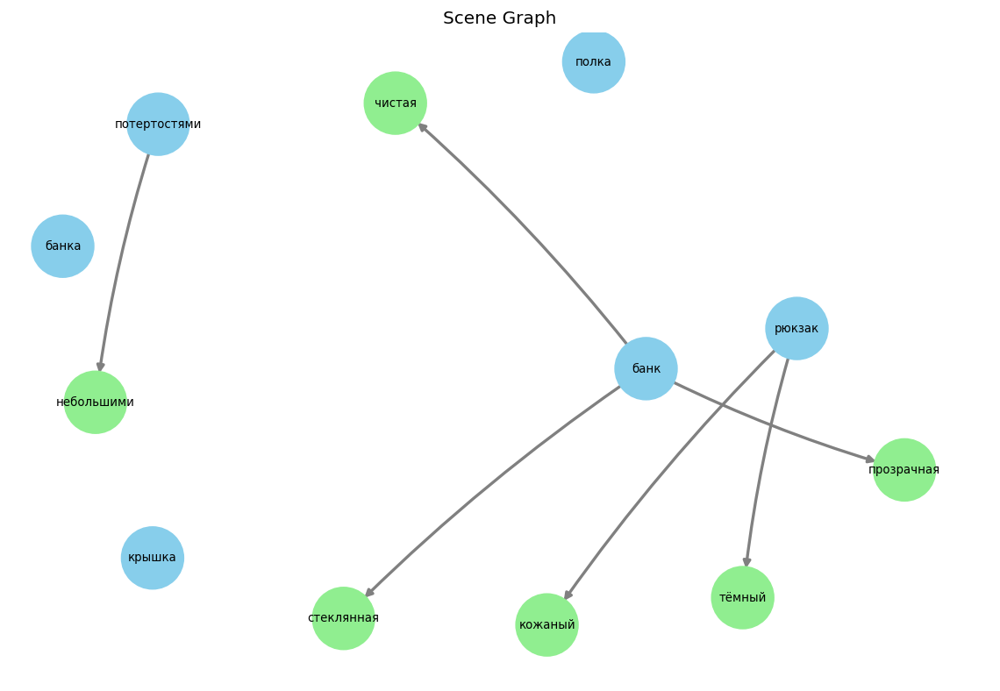


{"src_text": "На кухне на столе стоит керамическая миска с фруктами. Она блестит на солнце, придавая комнате уют.", "norm_text": "На кухне на столе стоит блестящая керамическая миска с фруктами, придавая комнате уют.", "objects": ["кухня", "стол", "миска", "фрукт", "комната", "уют"], "attributes": {"миска": ["блестящая", "керамическая"]}, "relations": [["миска", "на", "стол"], ["миска", "на", "кухня"]]}



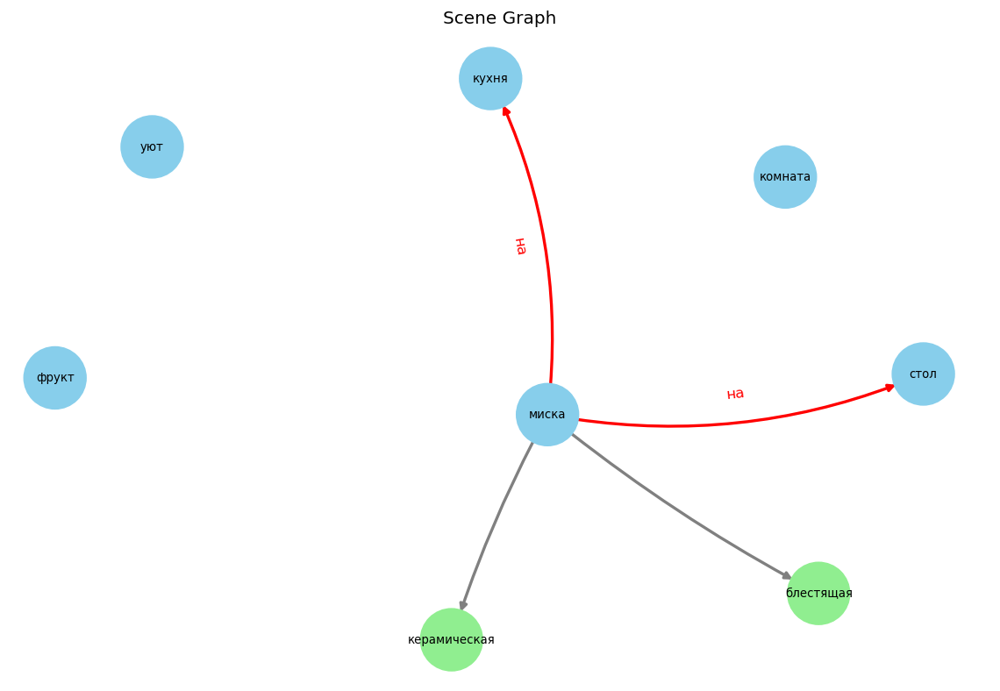


{"src_text": "На полке стоит кофейник из керамики, цвета слоновой кости. Рядом с ним красуется медная турка, аккуратно начищенная.", "norm_text": "На полке стоит керамический кофейник цвета слоновой кости. Рядом с кофейником красуется аккуратно начищенная медная турка.", "objects": ["полка", "кофейник", "цвет", "кость", "турка"], "attributes": {"кофейник": ["керамический"], "кость": ["слоновой"]}, "relations": []}



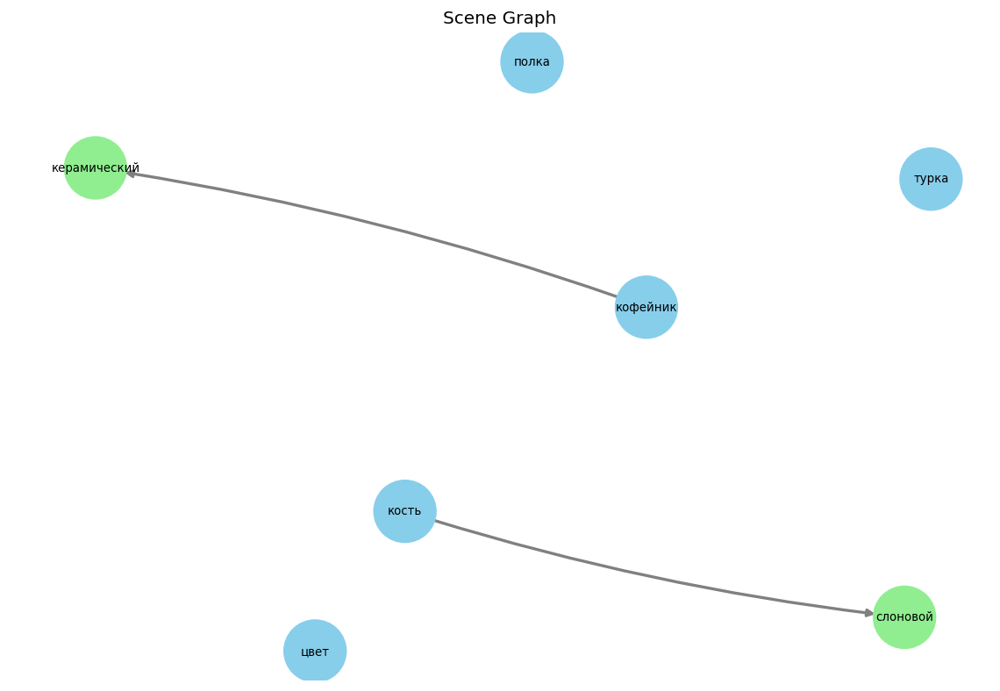


{"src_text": "На полке стоит коричневая коробка, слегка потрепанная временем. В углу котелок из нержавейки, блестящий и без единой царапины.", "norm_text": "На полке стоит коричневая слегка потрепанная временем коробка. В углу находится блестящий котелок из нержавейки без единой царапины.", "objects": ["полка", "время", "коробка", "угол", "котелок", "нержавейка", "царапина"], "attributes": {"коробка": ["коричневая", "слегка потрепанная временем"], "котелок": ["блестящий"], "царапина": ["единой"]}, "relations": [["котелок", "без", "царапина"], ["котелок", "в", "угол"]]}



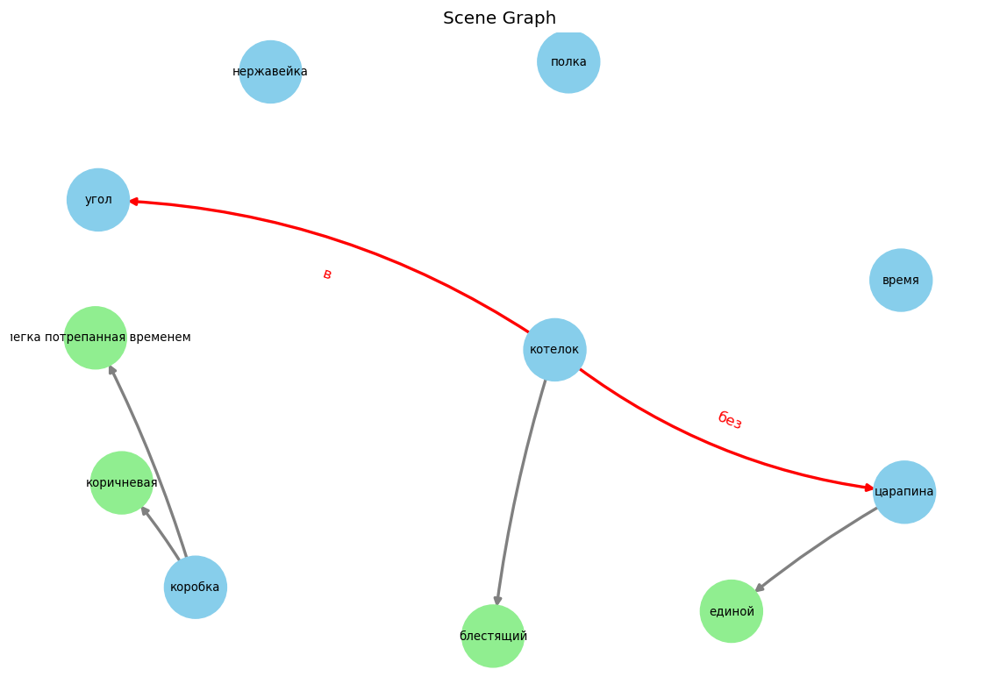


{"src_text": "На мягкой земле покоится рыжая шишка, сияющая свежестью после дождя. Она окружена опавшими листьями.", "norm_text": "На мягкой земле покоится рыжая сияющая свежая шишка после дождя. Шишка окружена опавшими листьями.", "objects": ["земля", "шишка", "дождь", "лист"], "attributes": {"земля": ["мягкой"], "шишка": ["рыжая", "свежая", "сияющая"], "лист": ["опавшими"]}, "relations": [["шишка", "на", "земля"]]}



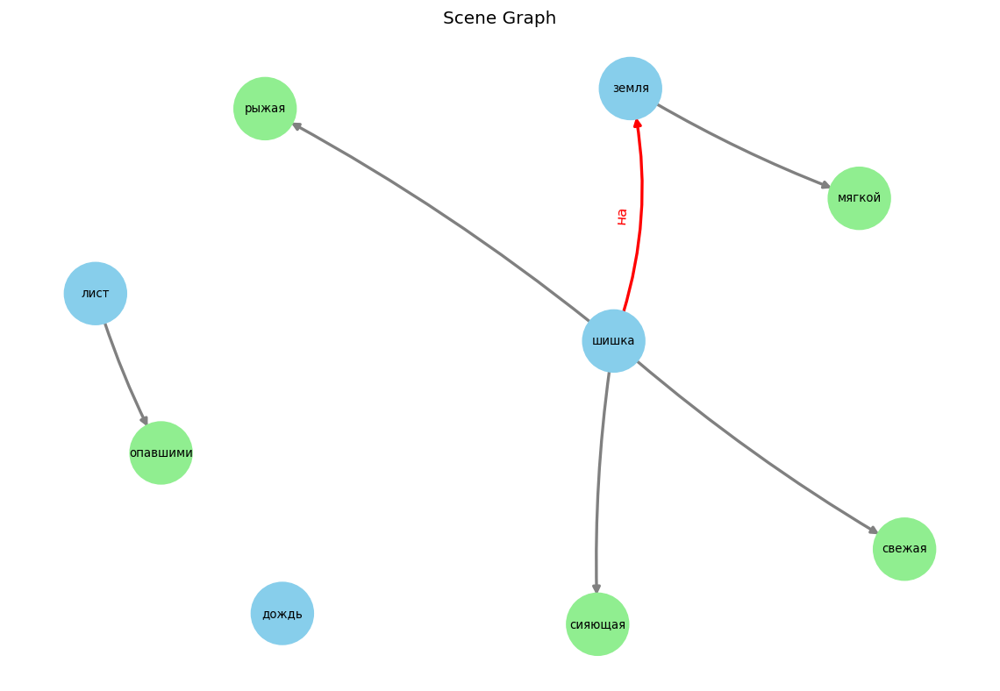


{"src_text": "На диване разложены три подушки: одна оранжевая, другая зелёная и третья в клетку. У стены стоит высокий торшер, слегка наклонённый.", "norm_text": "На диване разложены оранжевая подушка 1, зелёная подушка 2 и подушка 3 в клетку. У стены стоит высокий слегка наклонённый торшер.", "objects": ["диван", "подушка 1", "подушка 2", "подушка 3", "клетка", "стена", "торшер"], "attributes": {"торшер": ["высокий", "слегка наклонённый"], "подушка 1": ["оранжевая"], "подушка 2": ["зелёная"]}, "relations": [["торшер", "у", "стена"]]}



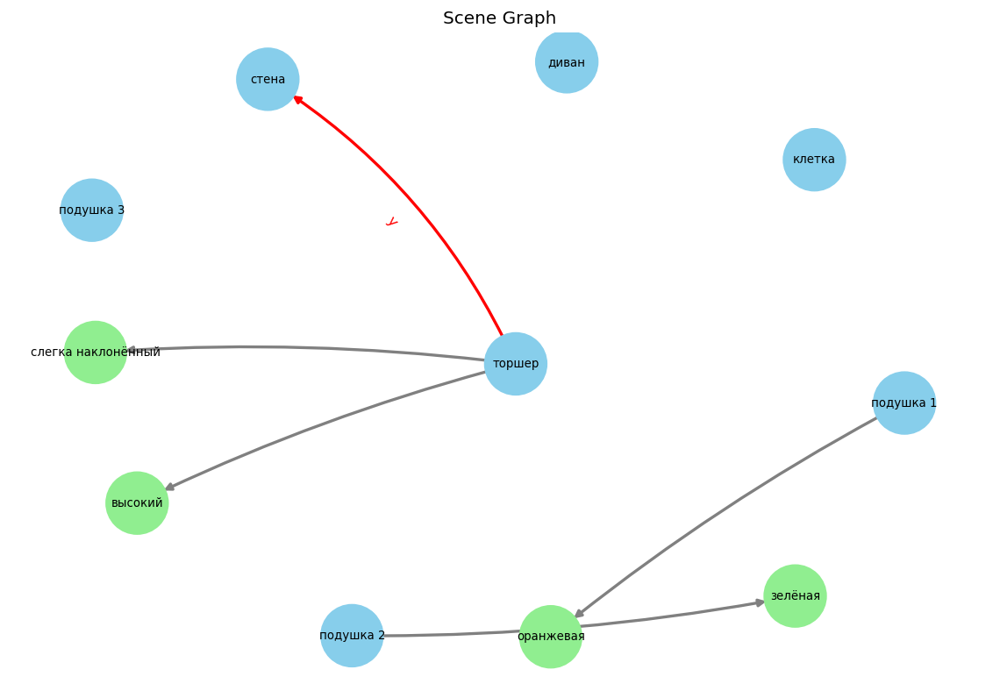


{"src_text": "На витрине стоит большая серебристая кофеварка, блестящая и стильная. Рядом с ней расположены три керамические чашки: одна синяя, другая белая и третья зеленая.", "norm_text": "На витрине стоит большая блестящая стильная серебристая кофеварка. Рядом с кофеваркой расположены синяя керамическая чашка 1, белая керамическая чашка 2 и зеленая керамическая чашка 3.", "objects": ["витрина", "кофеварка", "чашка 1", "чашка 2", "чашка 3"], "attributes": {"кофеварка": ["блестящая", "большая", "серебристая", "стильная"], "чашка 1": ["керамическая", "рядом расположены", "синяя"], "чашка 2": ["белая", "керамическая"], "чашка 3": ["зеленая", "керамическая"]}, "relations": [["кофеварка", "на", "витрина"]]}



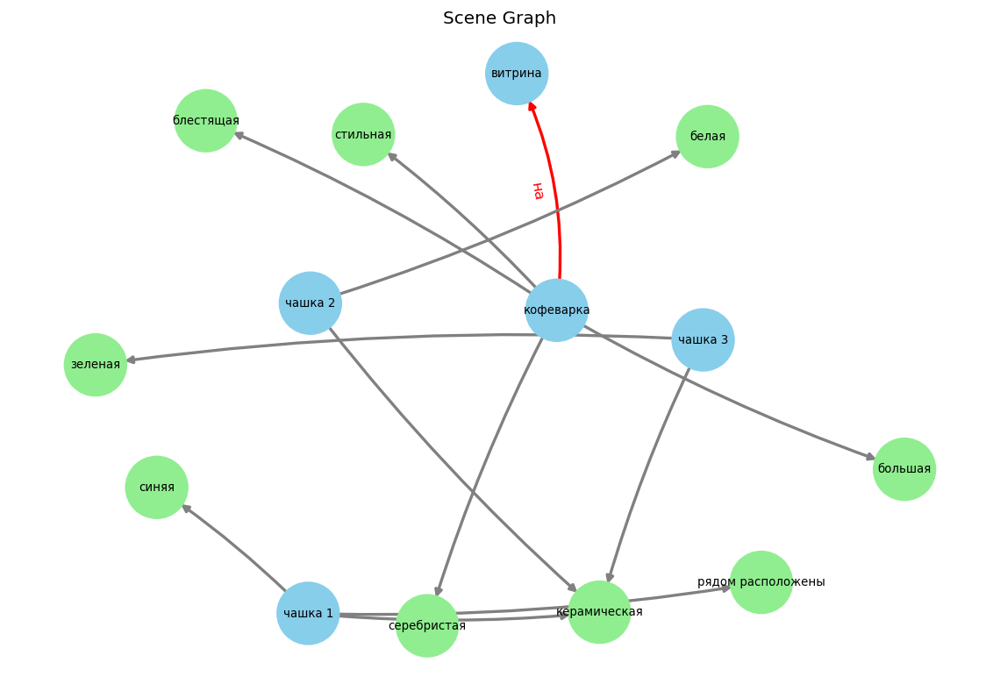


{"src_text": "На верстаке лежит молоток, покрытый пятнами ржавчины. Рядом стоит коробка с разноцветными гайками и болтами. Под верстаком находится старая жестяная банка с гвоздями.", "norm_text": "На верстаке лежит покрытый пятнами ржавчины молоток. Рядом стоит коробка с разноцветными гайками и болтами. Под верстаком находится старая жестяная банка с гвоздями.", "objects": ["верстак", "пятно", "ржавчина", "молоток", "коробка", "гайка", "болт", "банк", "гвоздями"], "attributes": {"гайка": ["разноцветными"], "банк": ["жестяная", "старая"], "молоток": ["покрытый пятнами"]}, "relations": [["банк", "под", "верстак"], ["молоток", "на", "верстак"]]}



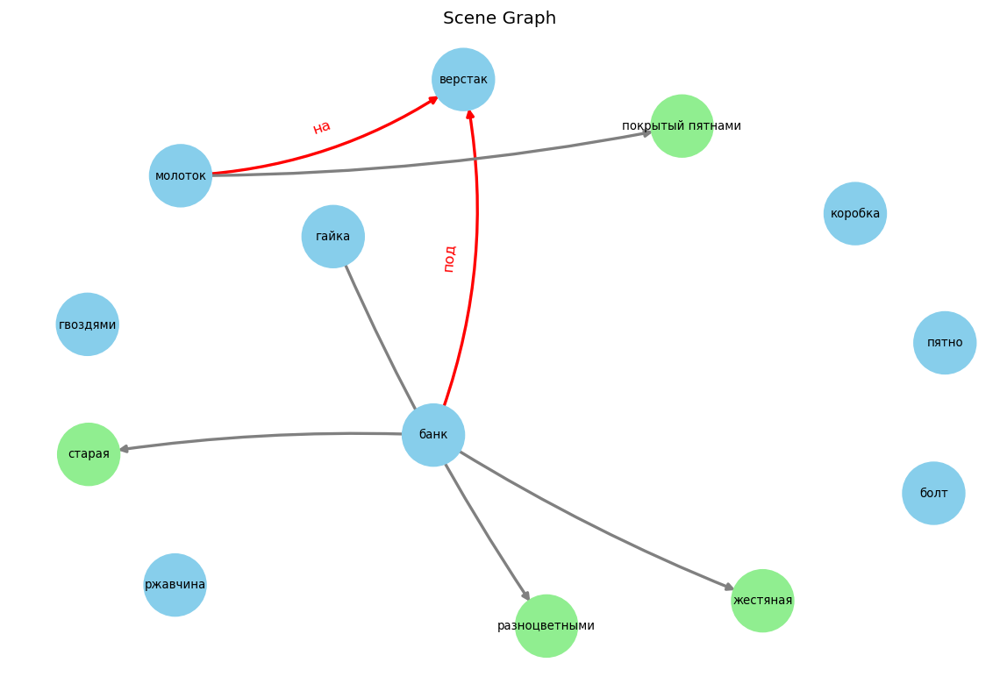


{"src_text": "На пляже под зонтом покоится голубая бейсболка, чистая и свежая. Рядом стоит красное солнцезащитное кресло, немного выцветшее от солнца, и увлажненная стопка журналов с яркими обложками.", "norm_text": "На пляже под зонтом покоится чистая свежая голубая бейсболка. Рядом стоит немного выцветшее от солнца красное солнцезащитное кресло и увлажненная стопка журналов с яркими обложками.", "objects": ["пляж", "зонт", "бейсболка", "солнце", "кресло", "стопка", "журнал", "обложками"], "attributes": {"бейсболка": ["голубая", "свежая", "чистая"], "кресло": ["красное", "немного выцветшее от солнца", "солнцезащитное"], "стопка": ["увлажненная"], "обложками": ["яркими"]}, "relations": [["бейсболка", "на", "пляж"]]}



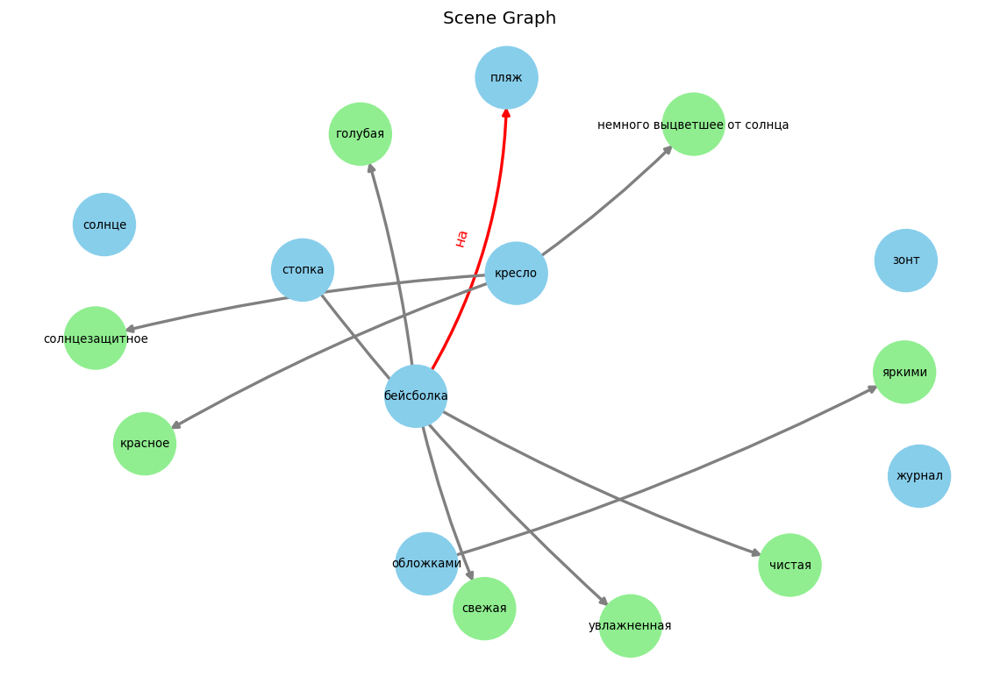


{"src_text": "На скамейке стоит коричневая сумка, потертая и вместительная. Рядом с ней — желтая куртка, аккуратно сложенная.", "norm_text": "На скамейке стоит коричневая потертая вместительная сумка. Рядом с сумкой — аккуратно сложенная желтая куртка.", "objects": ["скамейка", "сумка", "куртка"], "attributes": {"сумка": ["вместительная", "коричневая", "потертая"], "куртка": ["аккуратно сложенная", "желтая"]}, "relations": [["сумка", "на", "скамейка"]]}



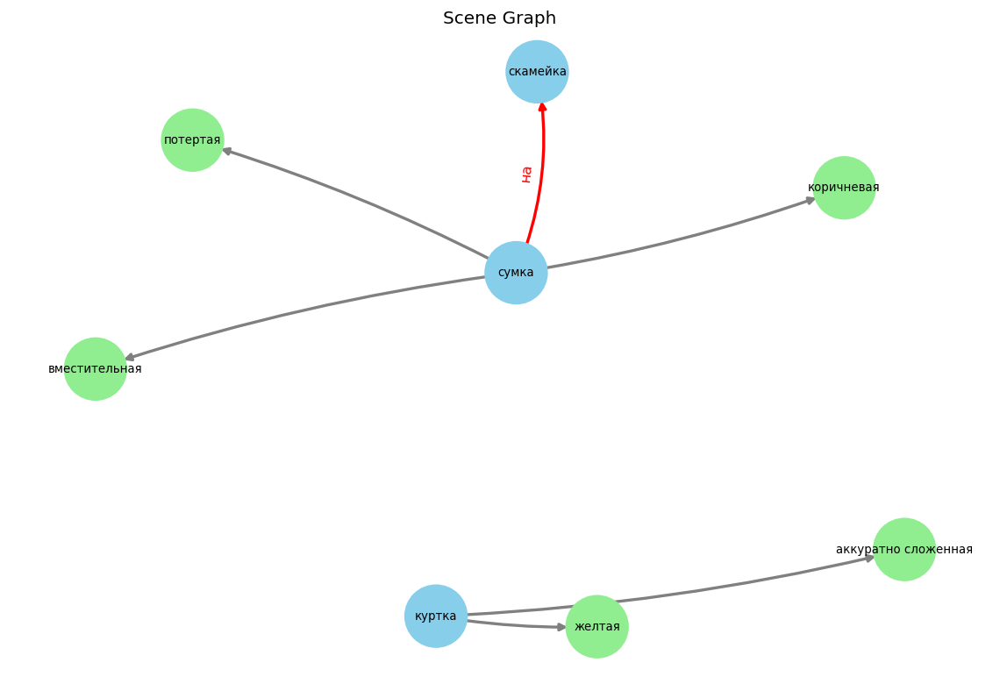


{"src_text": "На кушетке разложен белый халат, аккуратный и выглаженный. Под ним лежит стетоскоп.", "norm_text": "На кушетке разложен аккуратный выглаженный белый халат. Под халатом лежит стетоскоп.", "objects": ["кушетка", "халат", "стетоскоп"], "attributes": {"халат": ["аккуратный", "белый", "выглаженный"]}, "relations": [["стетоскоп", "под", "халат"]]}



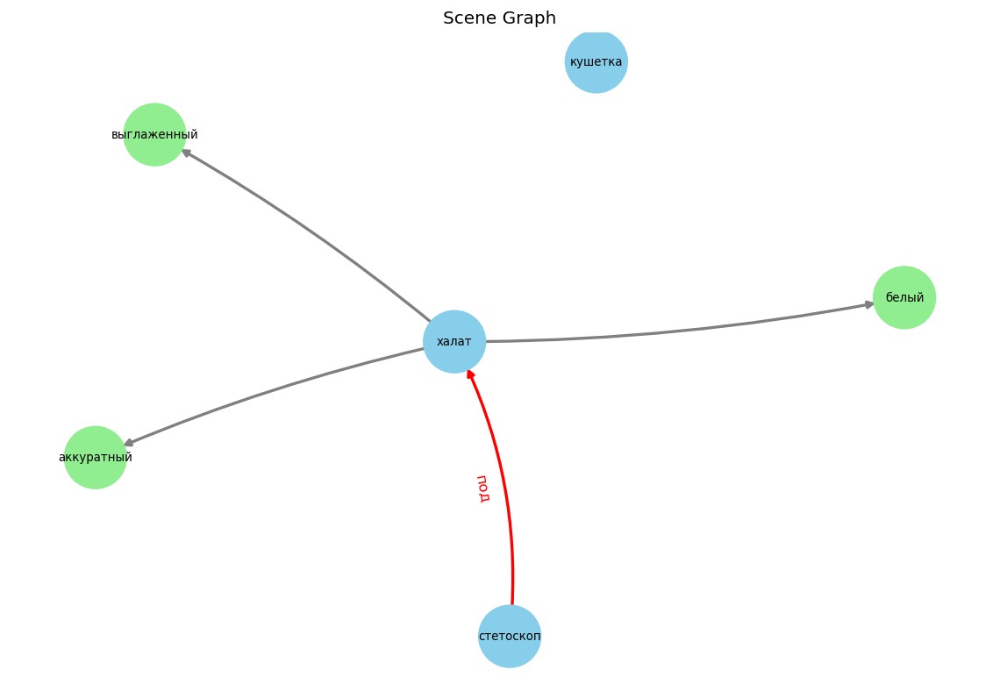


{"src_text": "На полке стоит керамическая мыльница, изящная и гладкая. Рядом с раковиной висит полотенце, пушистое и светлое. В углу расположена корзина для белья, плетеная и вместительная.", "norm_text": "На полке стоит изящная гладкая керамическая мыльница. Рядом с раковиной висит пушистое светлое полотенце. В углу расположена вместительная плетеная корзина для белья.", "objects": ["полка", "мыльница", "раковина", "полотенце", "угол", "корзина", "бельё"], "attributes": {"мыльница": ["гладкая", "изящная", "керамическая"], "полотенце": ["пушистое", "светлое"], "корзина": ["вместительная", "плетеная", "расположена"]}, "relations": [["полотенце", "рядом с", "раковина"]]}



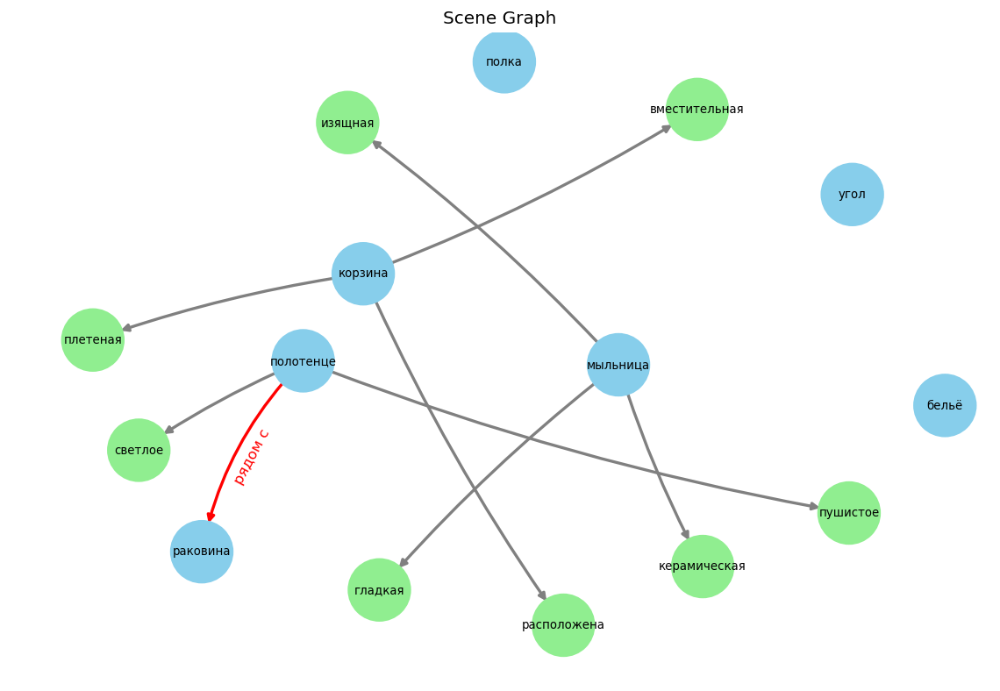


{"src_text": "На кровати расположена подушка с голубой наволочкой, аккуратно уложенная и чистая. Рядом стоит тумба с плоским экраном монитора.", "norm_text": "На кровати расположена аккуратно уложенная чистая подушка с голубой наволочкой. Рядом стоит тумба с плоским экраном монитора.", "objects": ["кровать", "подушка", "наволочка", "тумба", "экран", "монитор"], "attributes": {"подушка": ["аккуратно уложенная", "расположена", "чистая"], "наволочка": ["голубой"], "экран": ["плоским"]}, "relations": []}



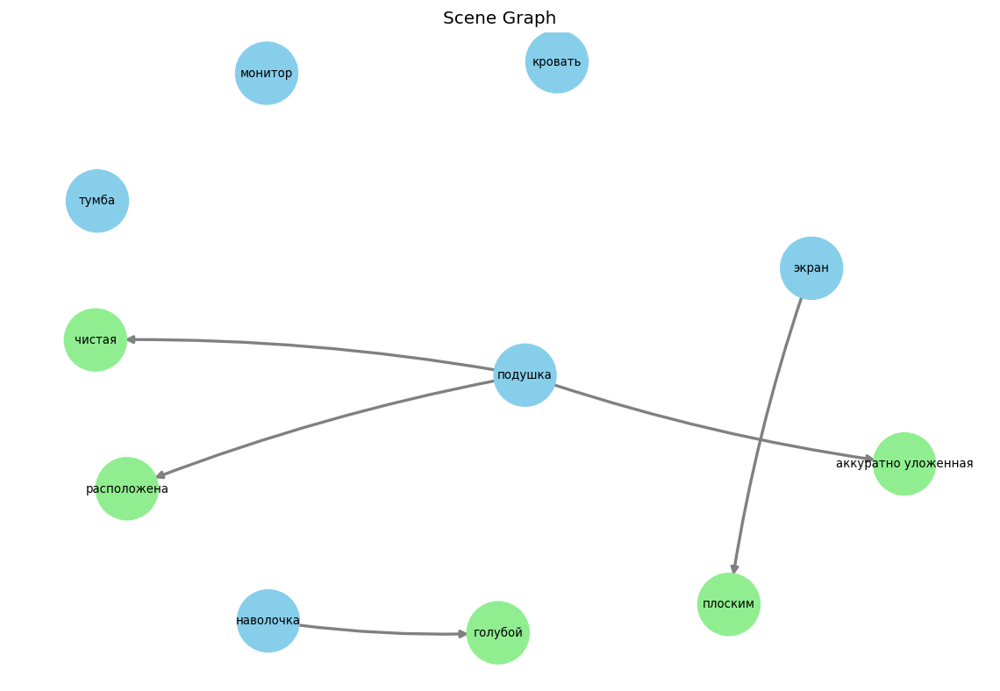


{"src_text": "Под высокой сосной стоит бурый рюкзак, молча охраняемый. Рядом на траве покоится потертый кожаный ботинок и старая лесная фляга.", "norm_text": "Под высокой сосной стоит молча охраняемый бурый рюкзак. Рядом на траве покоится потертый кожаный ботинок и старая лесная фляга.", "objects": ["сосна", "рюкзак", "трава", "ботинок", "фляга"], "attributes": {"сосна": ["высокой"], "рюкзак": ["бурый", "молча охраняемый"], "ботинок": ["кожаный", "потертый"], "фляга": ["лесная", "старая"]}, "relations": [["фляга", "на", "трава"], ["рюкзак", "под", "сосна"], ["ботинок", "на", "трава"]]}



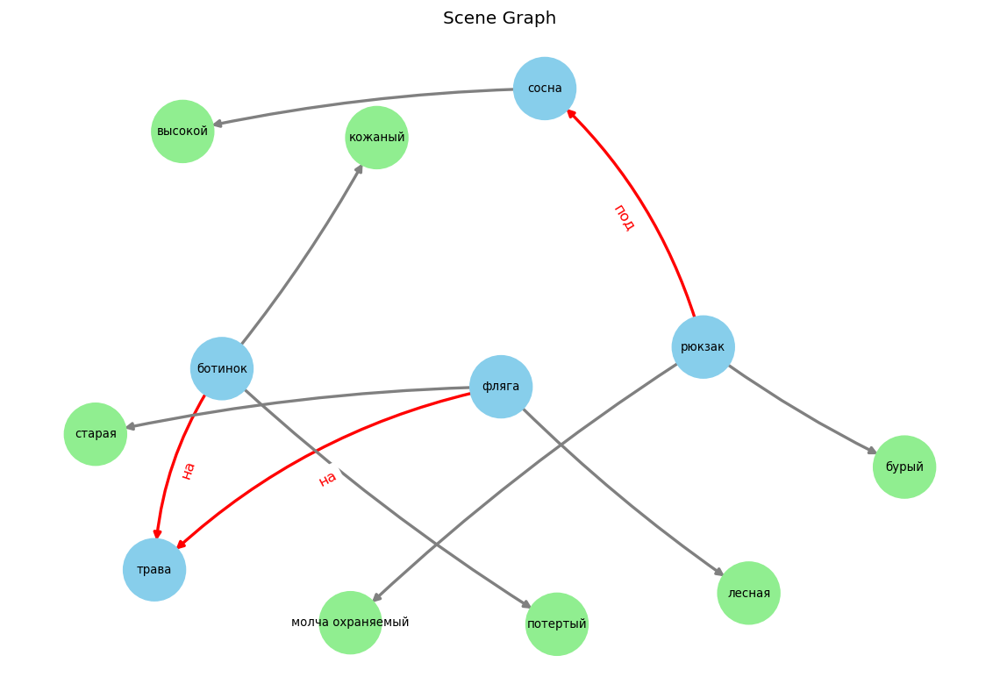


{"src_text": "На стеллаже разместились три коробки: одна из картона, другая из пластика и третья из металла. Под стеллажом стоит потертая обувь.", "norm_text": "На стеллаже разместились картонная коробка 1, пластиковая коробка 2 и металлическая коробка 3. Под стеллажом стоит потертая обувь.", "objects": ["стеллаж", "коробка 1", "коробка 2", "коробка 3", "обувь"], "attributes": {"обувь": ["потертая"], "коробка 1": ["картонная"], "коробка 2": ["пластиковая"], "коробка 3": ["металлическая"]}, "relations": [["коробка 3", "на", "стеллаж"], ["коробка 2", "на", "стеллаж"], ["коробка 1", "на", "стеллаж"], ["обувь", "под", "стеллаж"]]}



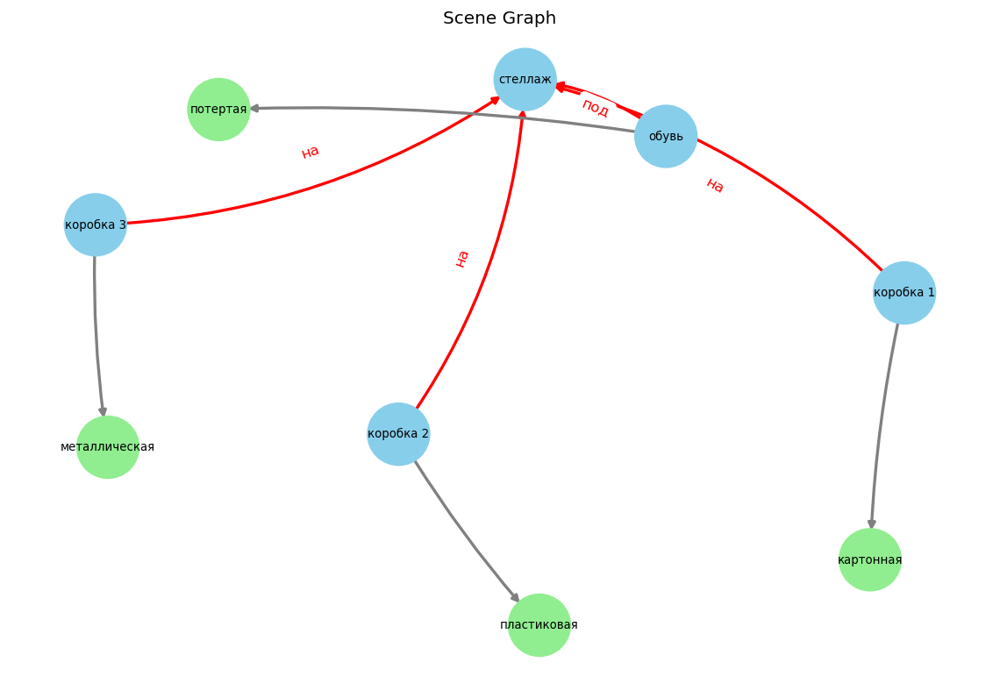


{"src_text": "На подоконнике стоит глиняный горшок с выцветшими цветами. Рядом лежат три старых садовых инструмента.", "norm_text": "На подоконнике стоит глиняный горшок с выцветшими цветами. Рядом лежат три старых садовых инструмента: старый садовый инструмент 1, старый садовый инструмент 2 и старый садовый инструмент 3.", "objects": ["подоконник", "горшок", "цвет", "инструмент", "инструмент 1", "инструмент 2", "инструмент 3"], "attributes": {"горшок": ["глиняный"], "цвет": ["выцветшими"], "инструмент": ["садовый", "садовых", "старый", "старых"], "инструмент 1": ["садовый", "старый"], "инструмент 2": ["садовый", "старый"], "инструмент 3": ["садовый", "старый"]}, "relations": [["горшок", "на", "подоконник"]]}



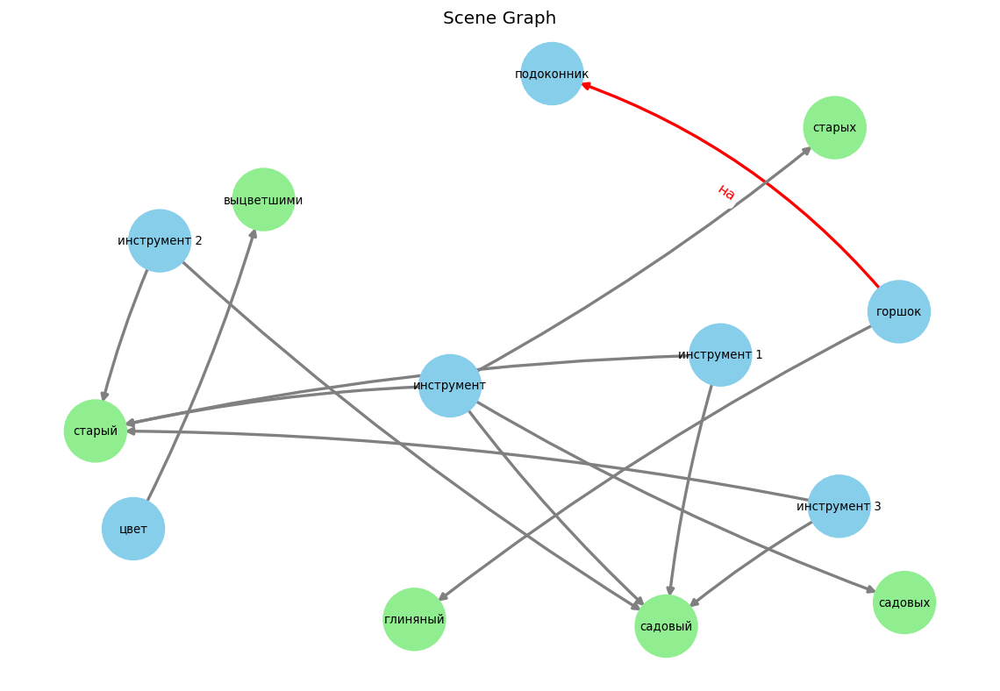


{"src_text": "На тумбе стоит телевизор, большой и современный. На столике у кровати — ваза с цветами, рядом лежит журнал.", "norm_text": "На тумбе стоит большой современный телевизор. На столике у кровати стоит ваза с цветами, рядом с вазой лежит журнал.", "objects": ["тумба", "телевизор", "столик", "кровать", "ваза", "цвет", "журнал"], "attributes": {"телевизор": ["большой", "современный"]}, "relations": [["телевизор", "на", "тумба"], ["ваза", "на", "столик"], ["ваза", "у", "кровать"], ["журнал", "рядом с", "ваза"]]}



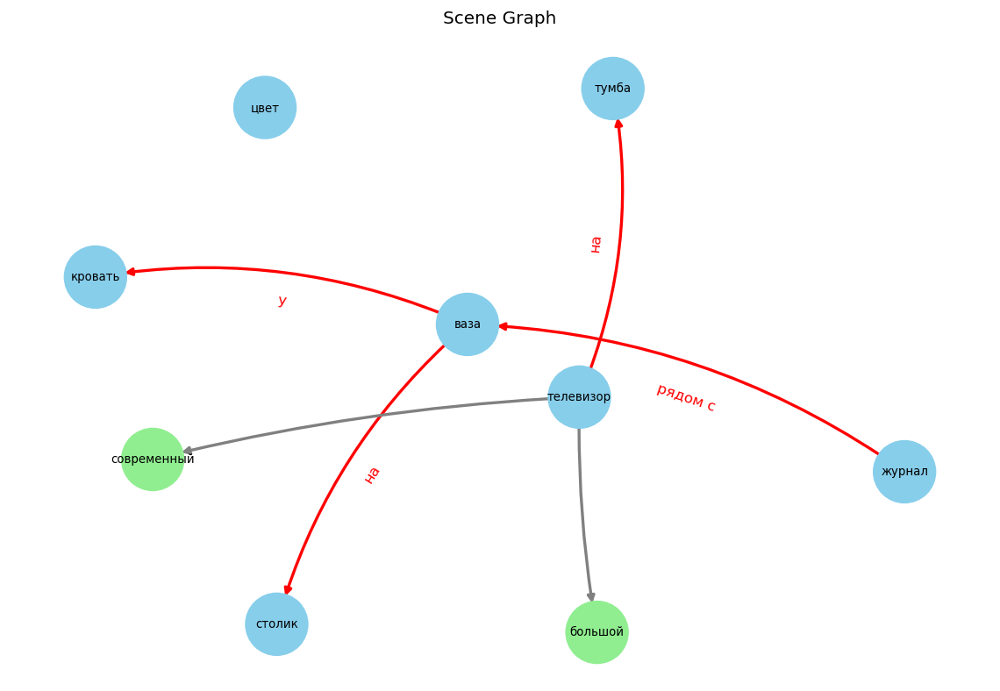


{"src_text": "На пляже видны три предмета: ведерко, шезлонг и ракушка. Ведерко перевернуто на мокром песке, шезлонг слегка откинут назад, а ракушка блестит на солнце.", "norm_text": "На пляже видны перевёрнутое на мокром песке ведёрко, слегка откинутый назад шезлонг и блестящая на солнце ракушка.", "objects": ["пляж", "песок", "ведёрко", "шезлонг", "солнце", "ракушка"], "attributes": {"песок": ["мокром"], "ракушка": ["блестящая"], "ведёрко": ["видны"], "шезлонг": ["слегка назад откинутый"]}, "relations": []}



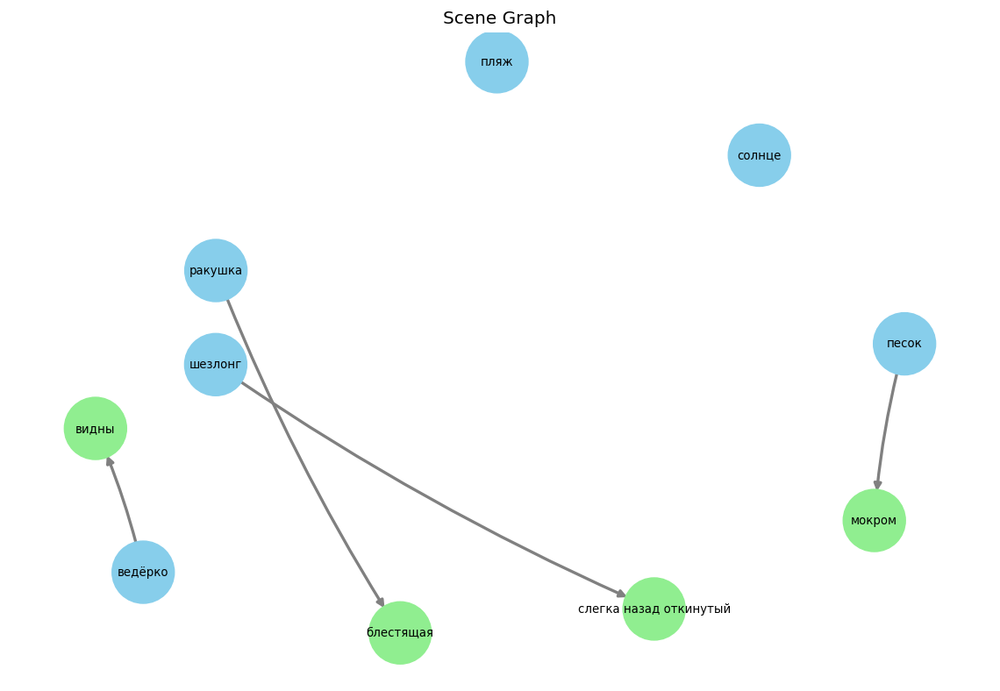


{"src_text": "На столе в кабинете стоит маленький глобус, слегка запылённый. Он окрашен в землистые и океанские оттенки.", "norm_text": "На столе в кабинете стоит маленький слегка запылённый глобус, окрашенный в землистые и океанские оттенки.", "objects": ["стол", "кабинет", "глобус", "оттенок"], "attributes": {"глобус": ["маленький", "окрашенный в оттенки", "слегка запылённый"], "оттенок": ["землистые", "океанские"]}, "relations": [["глобус", "в", "кабинет"], ["глобус", "на", "стол"]]}



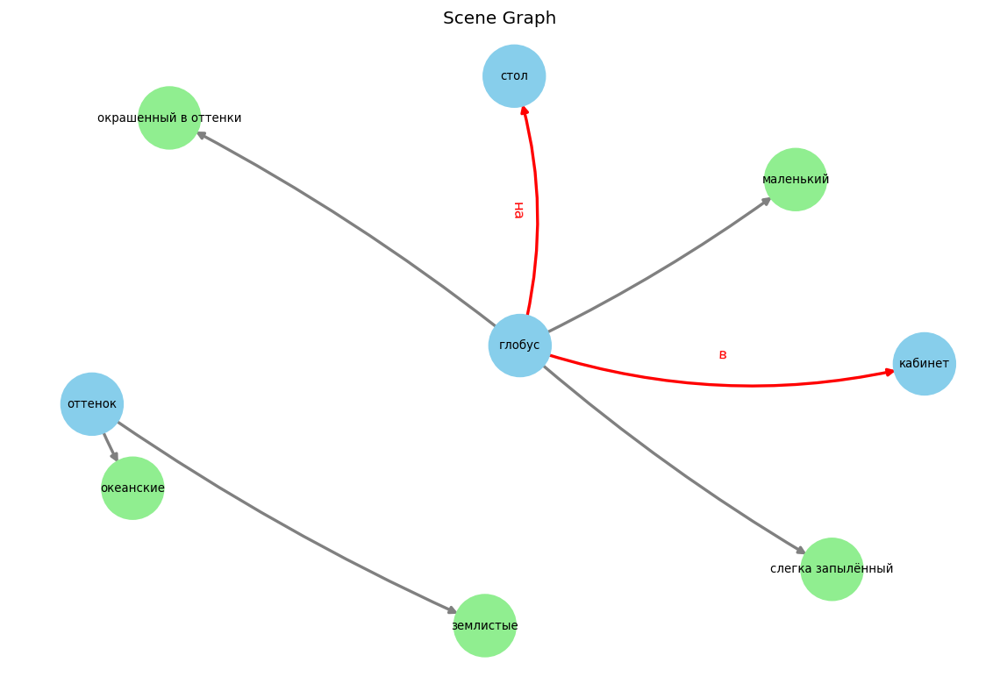


{"src_text": "На полке сервант стоит изящная фарфоровая статуэтка, чуть обветренная временем. Рядом с ней — прозрачная хрустальная ваза с яркими искусственными цветами. У двери — старинный напольный часы с массивным маятником. Под окном уютно разместился плетеный стул с декоративной подушкой.", "norm_text": "На полке серванта стоит изящная фарфоровая статуэтка, чуть обветренная временем. Рядом с фарфоровой статуэткой — прозрачная хрустальная ваза с яркими искусственными цветами. У двери — старинные напольные часы с массивным маятником. Под окном уютно разместился плетеный стул с декоративной подушкой.", "objects": ["полка", "сервант", "статуэтка", "время", "ваза", "цвет", "дверь", "час", "маятник", "окно", "стул", "подушка"], "attributes": {"статуэтка": ["изящная", "фарфоровая", "фарфоровой", "чуть обветренная временем"], "ваза": ["прозрачная", "хрустальная"], "цвет": ["искусственными", "яркими"], "час": ["напольные", "старинные"], "маятник": ["массивным"], "стул": ["плетеный"], "поду

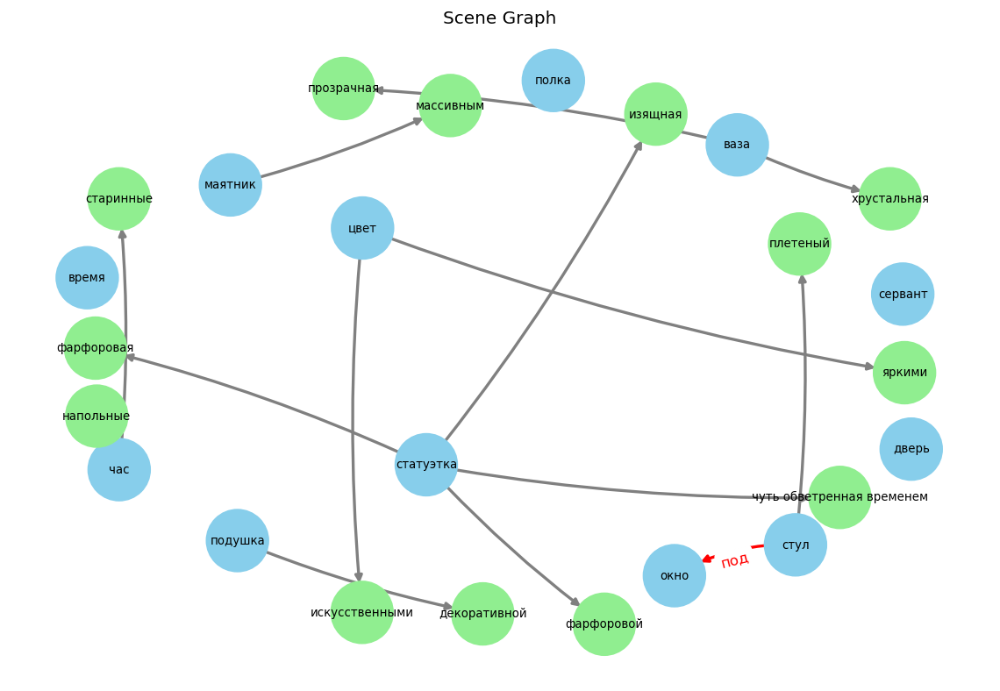


{"src_text": "На балконе стоит большая глиняная ваза, на ее вершине красуется свежий букет цветов. Рядом на столике лежит молодежный журнал, а в углу на табурете стоит стакан с холодным лимонадом.", "norm_text": "На балконе стоит большая глиняная ваза, на вершине вазы красуется свежий букет цветов. Рядом на столике лежит молодежный журнал, а в углу на табурете стоит стакан с холодным лимонадом.", "objects": ["балкон", "ваза", "вершина", "букет", "цвет", "столик", "журнал", "угол", "табурет", "стакан", "лимонад"], "attributes": {"ваза": ["большая", "глиняная"], "букет": ["свежий"], "журнал": ["молодежный"], "лимонад": ["холодным"]}, "relations": [["букет", "на", "вершина"], ["журнал", "на", "столик"], ["стакан", "в", "угол"], ["ваза", "на", "балкон"]]}



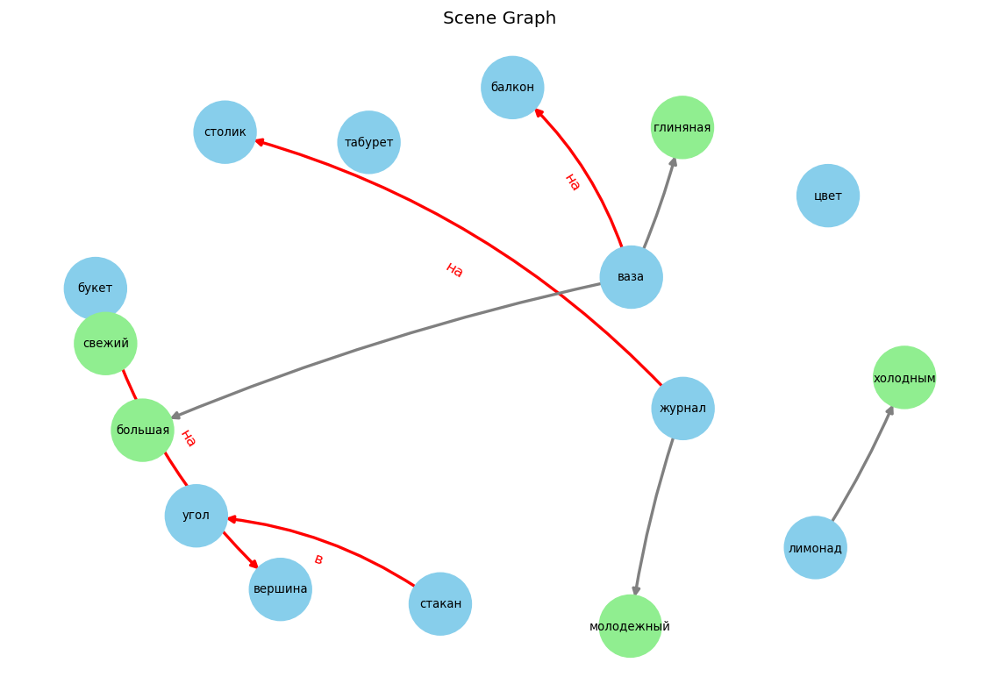


{"src_text": "На стуле сложено чистое мягкое одеяло бежевого цвета. Рядом стоит кушетка.", "norm_text": "На стуле сложено чистое мягкое бежевое одеяло. Рядом стоит кушетка.", "objects": ["стул", "одеяло", "кушетка"], "attributes": {"одеяло": ["бежевое", "мягкое", "чистое"]}, "relations": []}



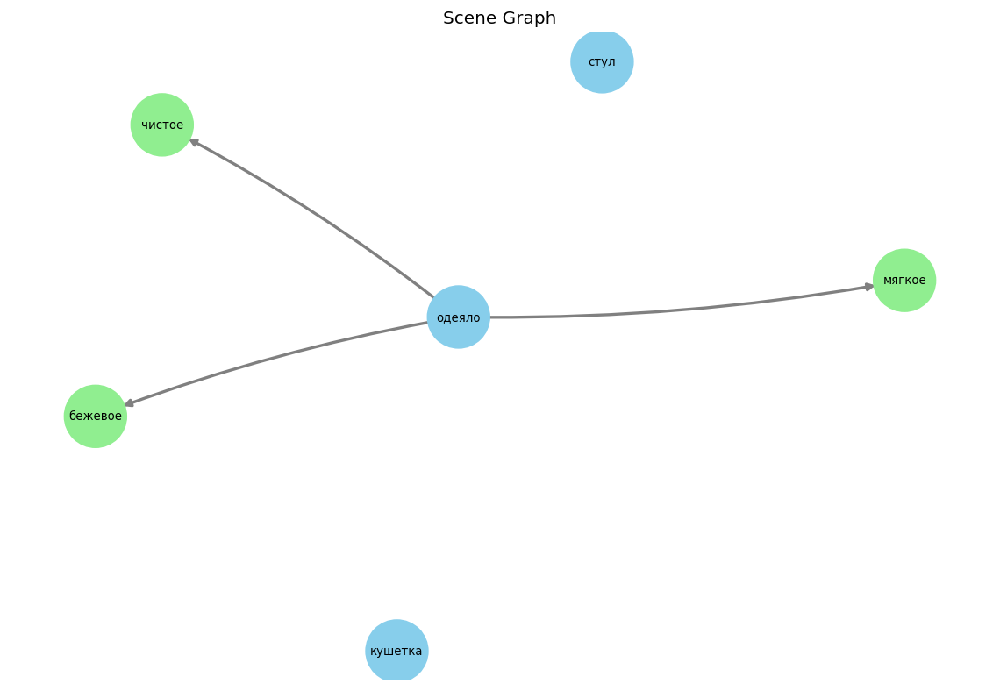


{"src_text": "На раковине стоит зубная паста в зеленом тюбике и красная щетка, обе почти новые. Рядом мыло в мыльнице, немного намыленное.", "norm_text": "На раковине стоит почти новая зубная паста в зелёном тюбике и почти новая красная щётка. Рядом находится немного намыленное мыло в мыльнице.", "objects": ["раковина", "паста", "тюбик", "щётка", "мыло", "мыльница"], "attributes": {"паста": ["зубная", "почти новая"], "тюбик": ["зелёном"], "щётка": ["красная", "почти новая"], "мыло": ["немного намыленное"]}, "relations": [["щётка", "на", "раковина"], ["паста", "на", "раковина"]]}



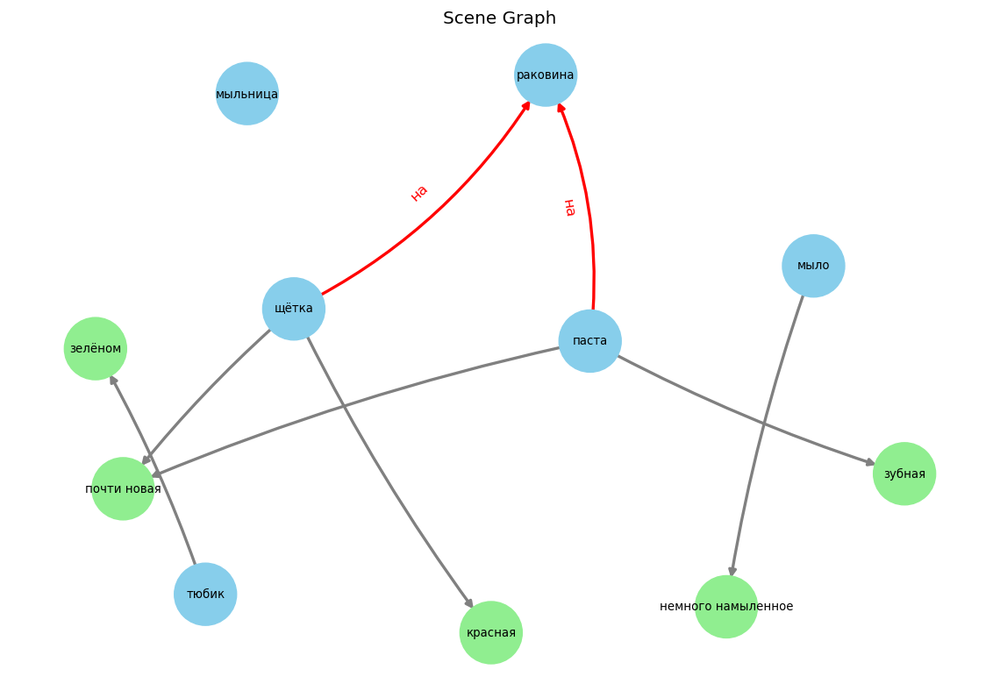


{"src_text": "На кухонном столе находится большая кастрюля из нержавеющей стали. Рядом с ней стоит керамическая миска с фруктами и старый чайник с облезлой эмалью.", "norm_text": "На кухонном столе находится большая кастрюля из нержавеющей стали. Рядом с кастрюлей стоит керамическая миска с фруктами и старый чайник с облезлой эмалью.", "objects": ["стол", "кастрюля", "сталь", "миска", "фрукт", "чайник", "эмаль"], "attributes": {"стол": ["кухонном"], "кастрюля": ["большая"], "сталь": ["нержавеющей"], "миска": ["керамическая"], "чайник": ["старый"], "эмаль": ["облезлой"]}, "relations": [["миска", "рядом с", "кастрюля"], ["чайник", "рядом с", "кастрюля"], ["кастрюля", "на", "стол"]]}



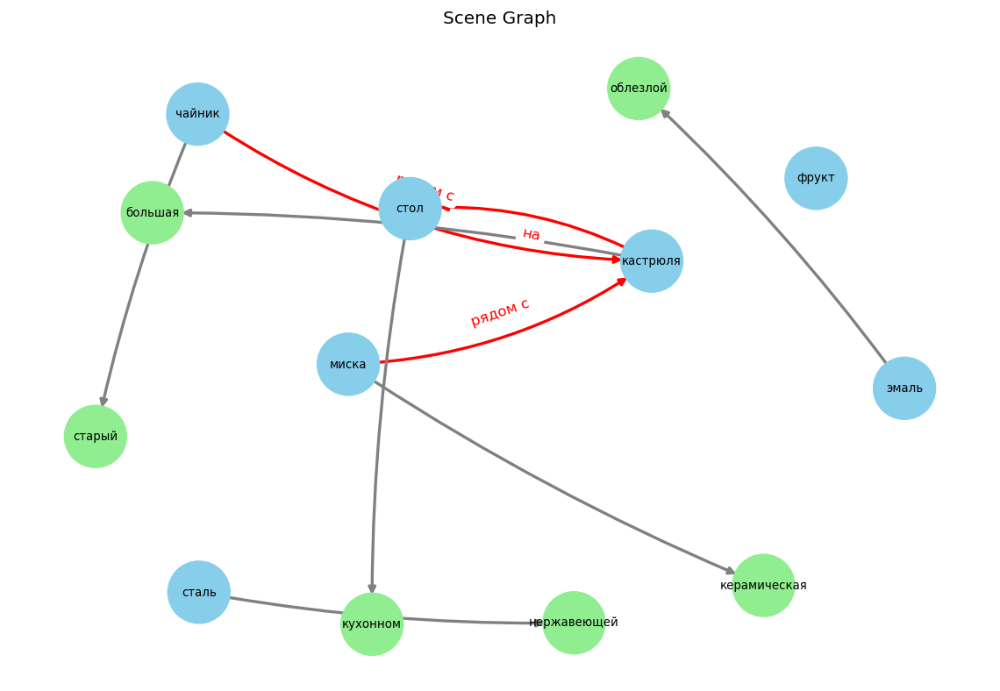


{"src_text": "На ослепительно белом медицинском столике расположены хирургические инструменты, сверкающие и аккуратно разложенные. Все предметы идеально чисты и выстроены в ровный ряд.", "norm_text": "На ослепительно белом медицинском столике расположены сверкающие аккуратно разложенные хирургические инструменты. Все идеально чистые предметы выстроены в ровный ряд.", "objects": ["столик", "инструмент", "предмет", "ряд"], "attributes": {"столик": ["медицинском", "ослепительно белом"], "инструмент": ["аккуратно разложенные", "расположены", "сверкающие", "хирургические"], "предмет": ["идеально чистые"], "ряд": ["ровный"]}, "relations": []}



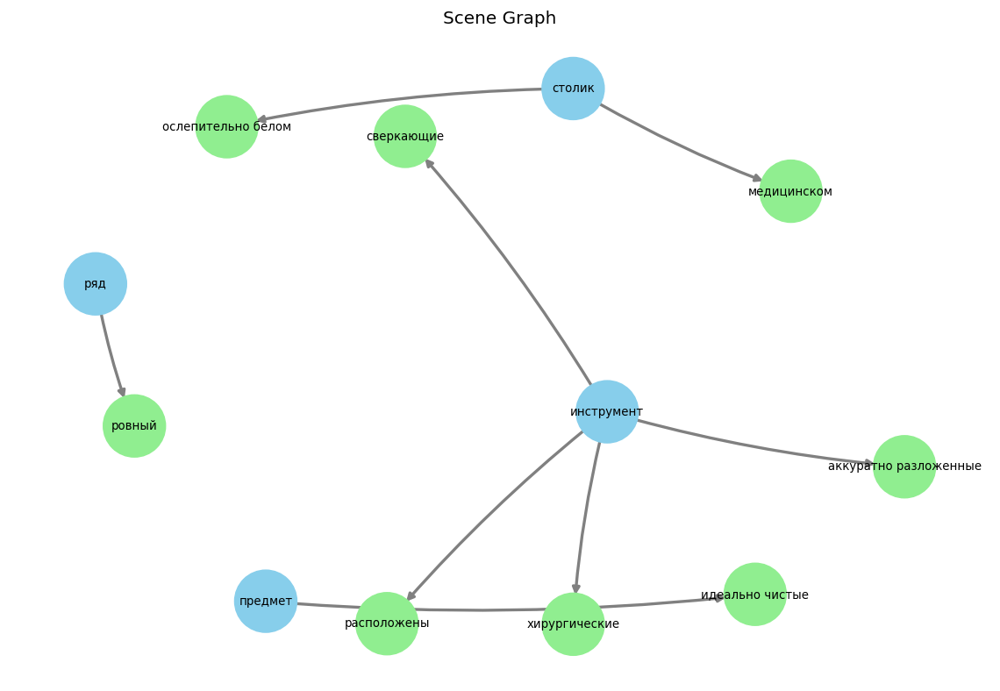


{"src_text": "На батарее сушатся носки: разноцветные, пара дырявых и одна целая. На полке стоит ржавая банка с гвоздями.", "norm_text": "На батарее сушатся разноцветные носки 1, пара дырявых носков 2 и целые носки 3. На полке стоит ржавая банка с гвоздями.", "objects": ["батарея", "носок 1", "пара", "носок 2", "носок 3", "полка", "банка", "гвоздями"], "attributes": {"носок 1": ["разноцветные"], "носок 2": ["дырявых"], "носок 3": ["целые"]}, "relations": [["носок 3", "на", "батарея"], ["носок 1", "на", "батарея"], ["пара", "на", "батарея"]]}



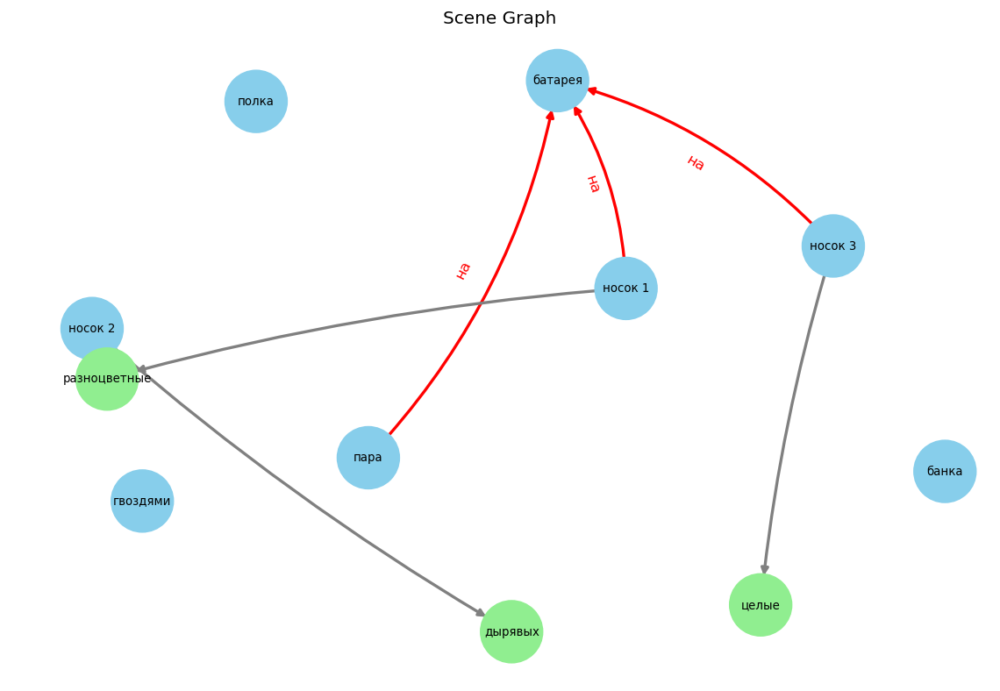


{"src_text": "На столике расположены два предмета: серебристая ложка и золотистая вилочка. Они аккуратно уложены на чистой белой салфетке.", "norm_text": "На столике расположены серебристая ложка 1 и золотистая вилочка 2. Ложка 1 и вилочка 2 аккуратно уложены на чистой белой салфетке.", "objects": ["столик", "ложка 1", "вилочка 2", "салфетка"], "attributes": {"салфетка": ["белой", "чистой"], "ложка 1": ["расположены", "серебристая"], "вилочка 2": ["золотистая"]}, "relations": []}



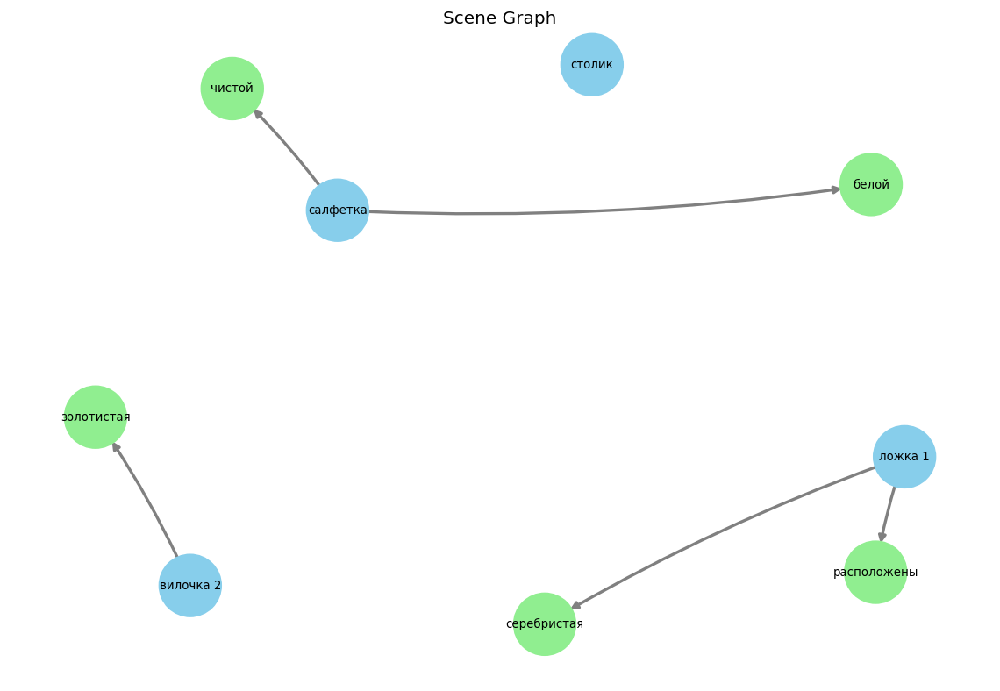


{"src_text": "На полке стоят кроссовки: одни темные и изношенные, другие светлые и чистые.", "norm_text": "На полке стоят тёмные изношенные кроссовки 1 и светлые чистые кроссовки 2.", "objects": ["полка", "кроссовки 1", "кроссовки 2"], "attributes": {"кроссовки 1": ["изношенные", "тёмные"], "кроссовки 2": ["светлые", "чистые"]}, "relations": []}



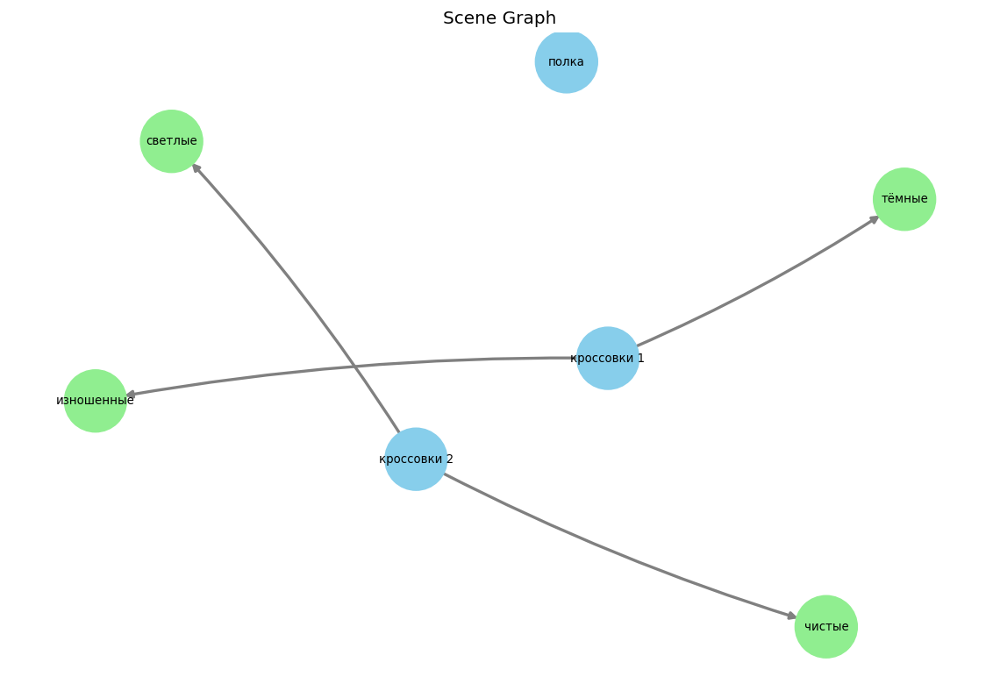


{"src_text": "На кровати свернут в клубок плюшевый медведь, пушистый и коричневый. Напротив него стоит музыкальная шкатулка, украшенная цветами, и чуть поодаль — модель парусника, сделанная из бумаги, с яркими парусами.", "norm_text": "На кровати свернут в клубок пушистый коричневый плюшевый медведь. Напротив медведя стоит музыкальная шкатулка, украшенная цветами, и чуть поодаль — модель парусника, сделанная из бумаги, с яркими парусами.", "objects": ["кровать", "клубок", "медведь", "шкатулка", "цвет", "модель", "парусник", "бумага", "парус"], "attributes": {"медведь": ["коричневый", "плюшевый", "пушистый"], "шкатулка": ["музыкальная", "украшенная цветами"], "парус": ["яркими"], "модель": ["сделанная из бумаги с парусами"]}, "relations": [["медведь", "на", "кровать"], ["шкатулка", "напротив", "медведь"], ["медведь", "в", "клубок"]]}



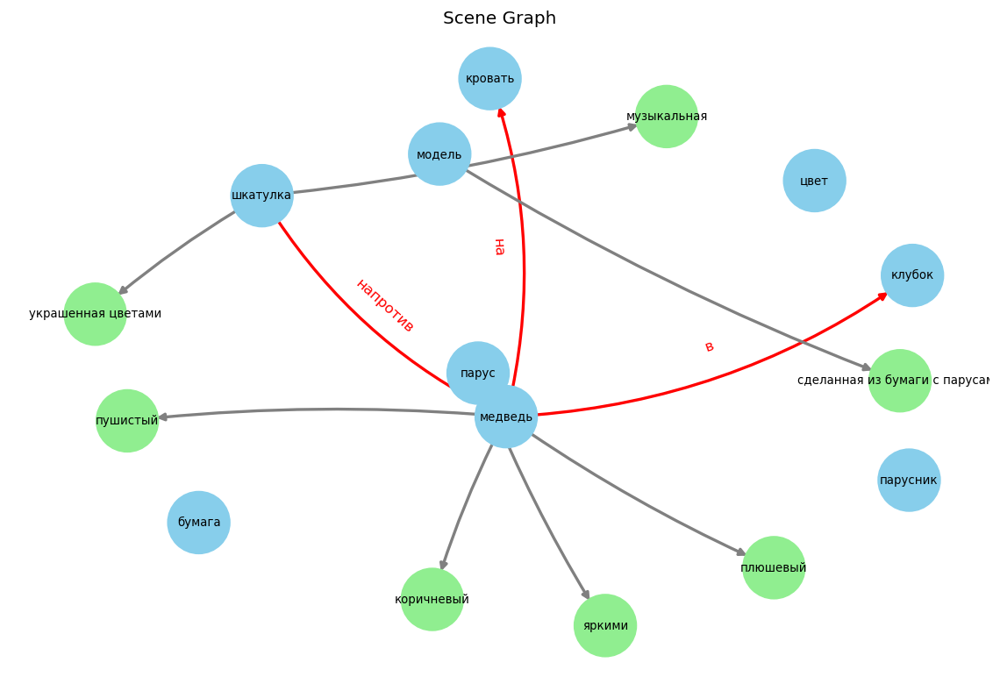


{"src_text": "На балконе стоят столик и три стула: один коричневый, остальные два светлых. На столике цветущий горшок с фиалками.", "norm_text": "На балконе стоят столик, коричневый стул 1 и два светлых стула 2 и 3. На столике находится цветущий горшок с фиалками.", "objects": ["балкон", "столик", "стул 1", "стул 2", "горшок", "фиалками"], "attributes": {"горшок": ["цветущий"], "стул 1": ["коричневый"], "стул 2": ["светлых"]}, "relations": [["горшок", "на", "столик"], ["столик", "на", "балкон"], ["стул 1", "на", "балкон"]]}



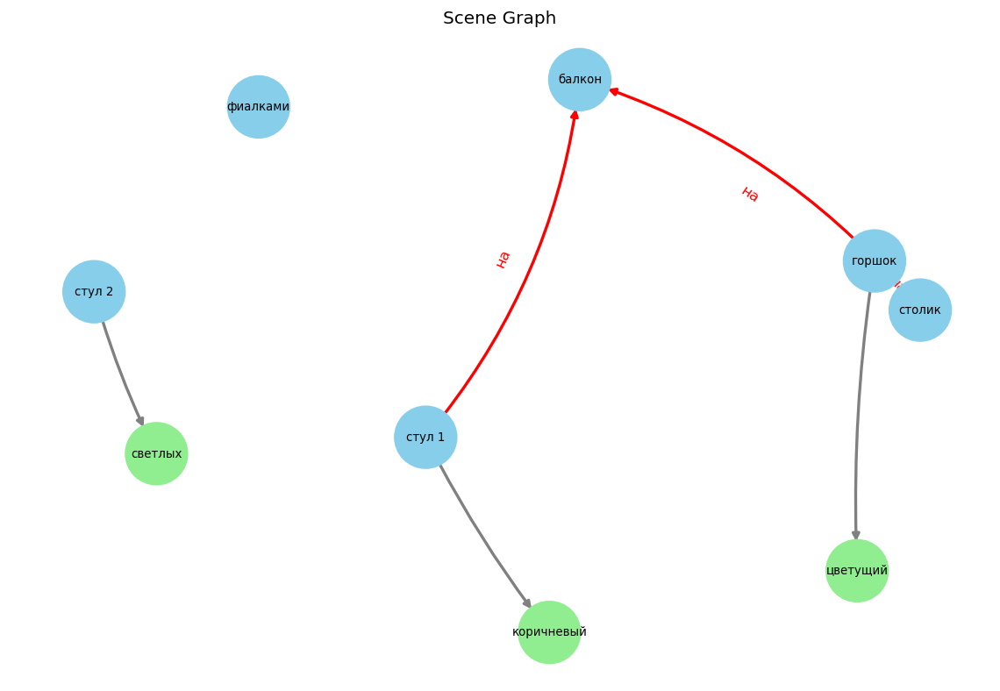


{"src_text": "На полу разбросаны инструменты, среди которых выделяется большой ржавый гаечный ключ. Он кажется массивным и немного погнутым, лежит неподалеку от старой картонной коробки.", "norm_text": "На полу разбросаны инструменты, среди которых выделяется большой ржавый массивный немного погнутый гаечный ключ. Гаечный ключ лежит неподалеку от старой картонной коробки.", "objects": ["пол", "инструмент", "ключ", "коробка"], "attributes": {"ключ": ["большой", "гаечный", "массивный", "немного погнутый", "ржавый"], "коробка": ["картонной", "старой"]}, "relations": [["ключ", "неподалеку от", "коробка"]]}



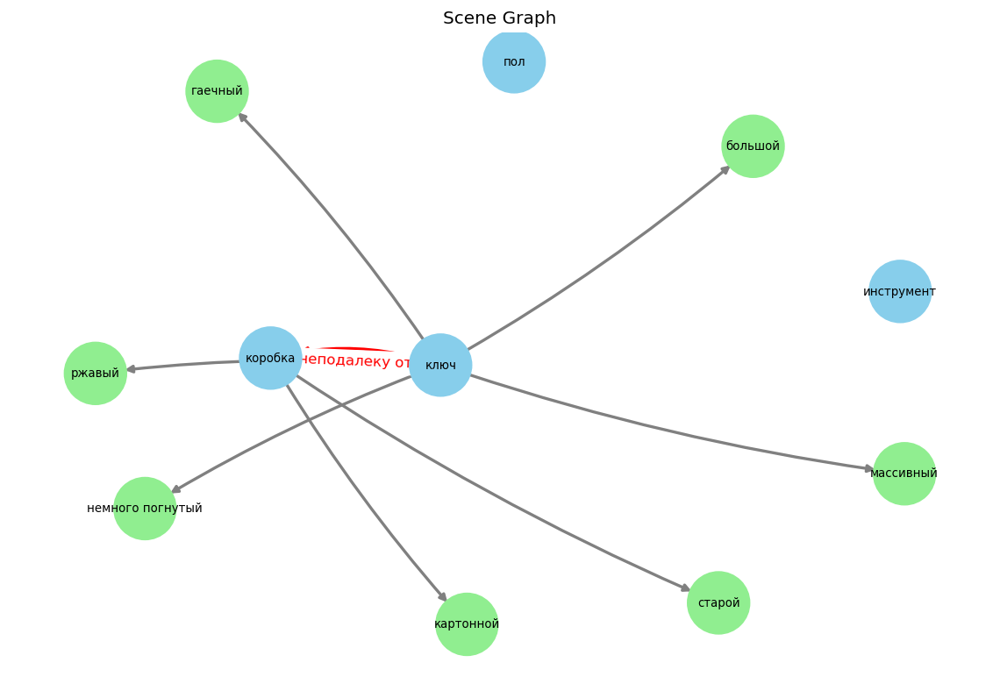


{"src_text": "На траве расположены два предмета. Один из них — яркий мяч, а другой — потертый мячик, оба забавные и прыгают.", "norm_text": "На траве расположены яркий забавный прыгающий мяч 1 и потертый забавный прыгающий мяч 2.", "objects": ["трава", "мяч 1", "мяч 2"], "attributes": {"мяч 1": ["забавный", "расположены", "яркий"], "мяч 2": ["забавный"]}, "relations": []}



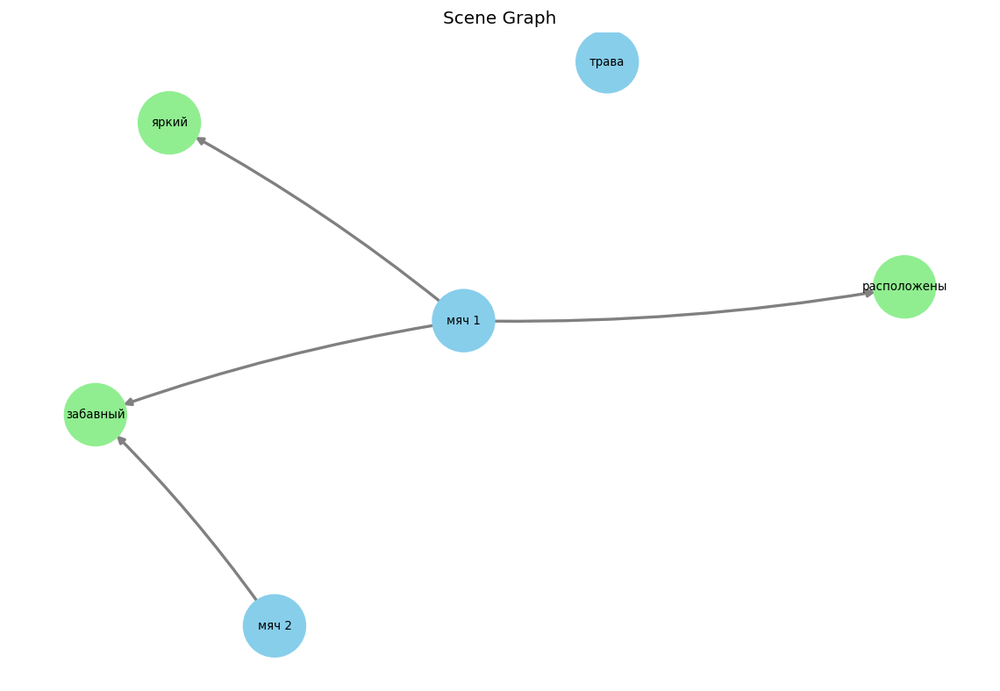


{"src_text": "На полочке расположены три предмета: мыло, расческа и зубная щетка. Мыло розовое и еще не распакованное, расческа длинная и серебристая, а щетка изогнутая и голубая.", "norm_text": "На полочке расположены розовое нераспакованное мыло, длинная серебристая расческа и изогнутая голубая зубная щетка.", "objects": ["полочка", "мыло", "расчёска", "щётка"], "attributes": {"мыло": ["нераспакованное", "расположены", "розовое"], "расчёска": ["длинная", "серебристая"], "щётка": ["голубая", "зубная", "изогнутая"]}, "relations": []}



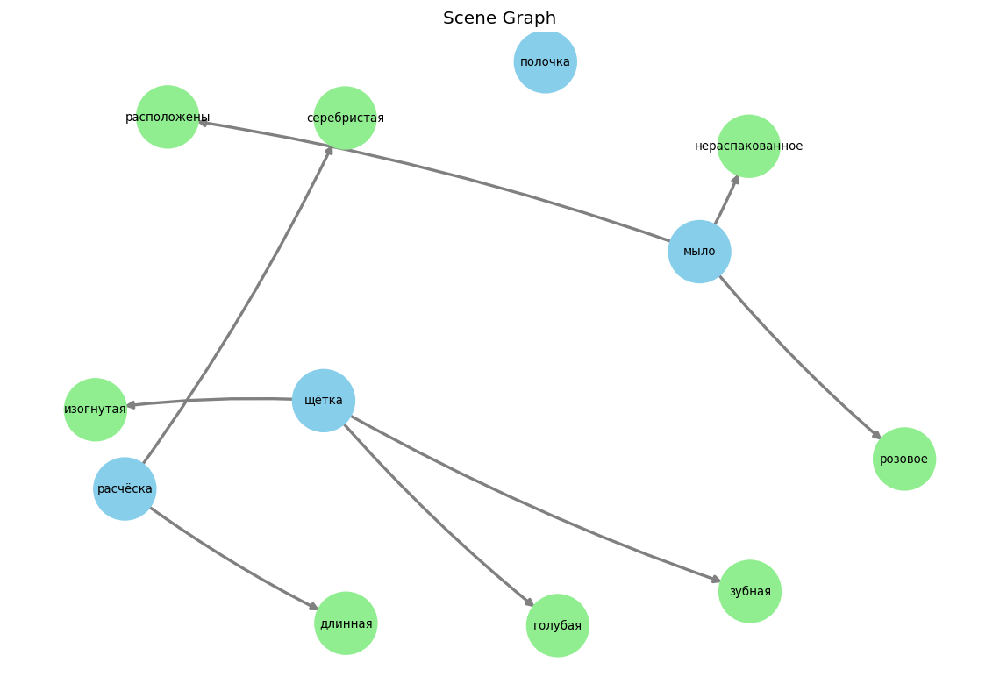


{"src_text": "На балконе находятся две глиняные кашпо, одно большое, другое меньше, оба с цветущими растениями. Под ними стоит черный железный стул с коричневым износом, рядом стоит открытка с видом на море.", "norm_text": "На балконе находятся большое глиняное кашпо 1 с цветущими растениями и меньшее глиняное кашпо 2 с цветущими растениями. Под кашпо 1 и кашпо 2 стоит черный железный стул с коричневым износом, рядом с которым находится открытка с видом на море.", "objects": ["балкон", "кашпо 1", "растение", "кашпо 2", "стул", "износ", "открытка", "вид", "море"], "attributes": {"растение": ["цветущими"], "стул": ["железный", "черный"], "износ": ["коричневым"], "кашпо 1": ["большое", "глиняное"], "кашпо 2": ["глиняное", "меньшее"]}, "relations": [["стул", "под", "кашпо 1"], ["кашпо 2", "на", "балкон"], ["стул", "под", "кашпо 2"], ["кашпо 1", "на", "балкон"]]}



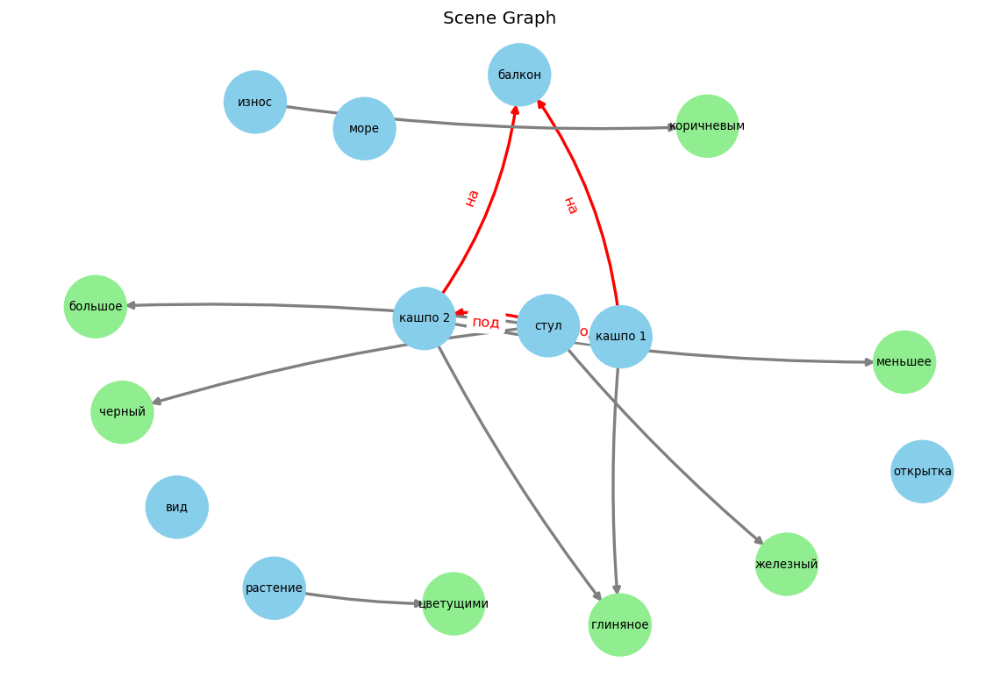


{"src_text": "На тумбе стоит монитор с большим экраном, чуть пыльный. Под ним коробка с бинтами и стерильными салфетками.", "norm_text": "На тумбе стоит чуть пыльный монитор с большим экраном. Под монитором находится коробка с бинтами и стерильными салфетками.", "objects": ["тумба", "монитор", "экран", "коробка", "бинт", "салфетка"], "attributes": {"монитор": ["чуть пыльный"], "экран": ["большим"], "салфетка": ["стерильными"]}, "relations": [["монитор", "на", "тумба"], ["коробка", "под", "монитор"]]}



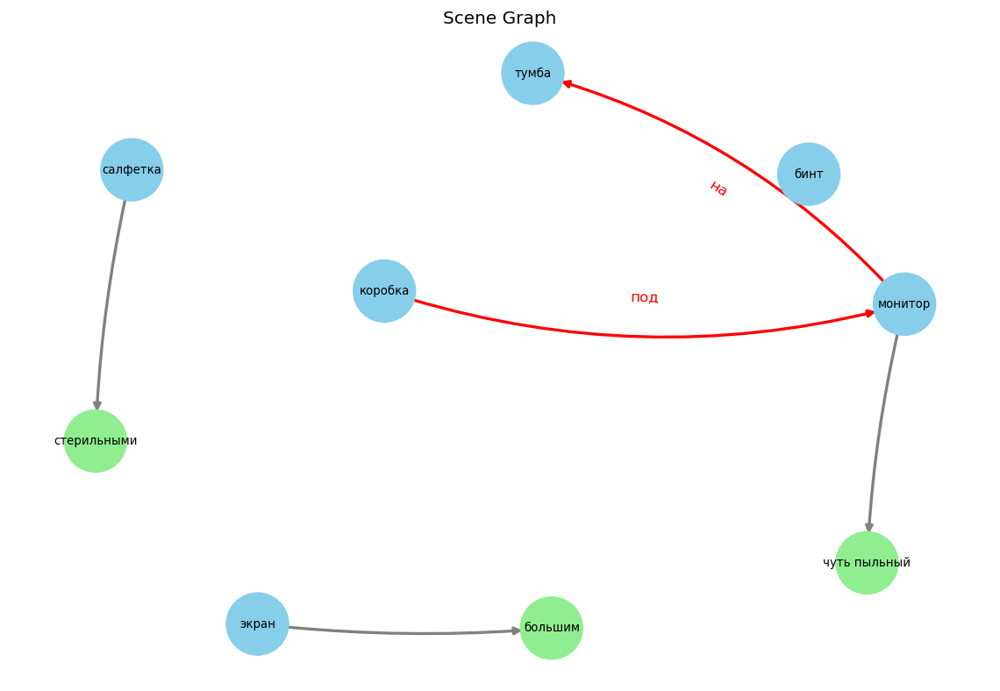


{"src_text": "На верстаке лежит большая коробка с инструментами. Рядом с ней — потертая кожаная перчатка, а под ней — металлическая гайка.", "norm_text": "На верстаке лежит большая коробка с инструментами. Рядом с коробкой — потертая кожаная перчатка, а под коробкой — металлическая гайка.", "objects": ["верстак", "коробка", "инструмент", "перчатка", "гайка"], "attributes": {"коробка": ["большая"], "перчатка": ["кожаная", "потертая"], "гайка": ["металлическая"]}, "relations": [["коробка", "на", "верстак"]]}



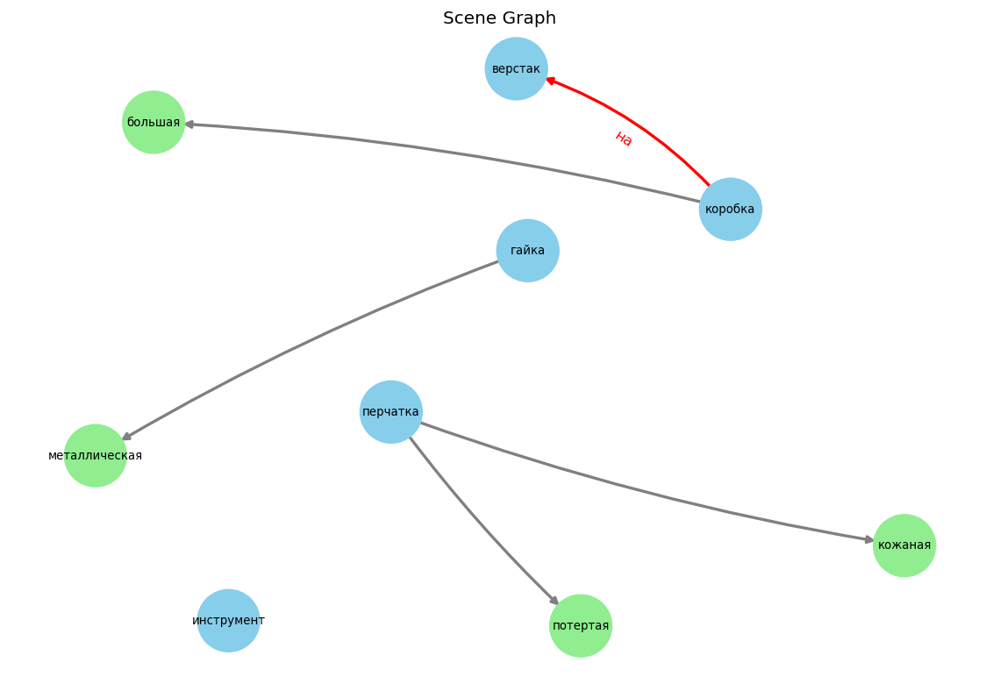


{"src_text": "На кровати лежит плед, теплый и уютный. На нем покоится подушка, набитая пухом и немного помятая.", "norm_text": "На кровати лежит теплый уютный плед. На пледе покоится набитая пухом немного помятая подушка.", "objects": ["кровать", "плед", "пух", "подушка"], "attributes": {"плед": ["теплый", "уютный"], "пух": ["набитая"], "подушка": ["немного помятая"]}, "relations": [["плед", "на", "кровать"], ["пух", "на", "плед"], ["подушка", "на", "плед"]]}



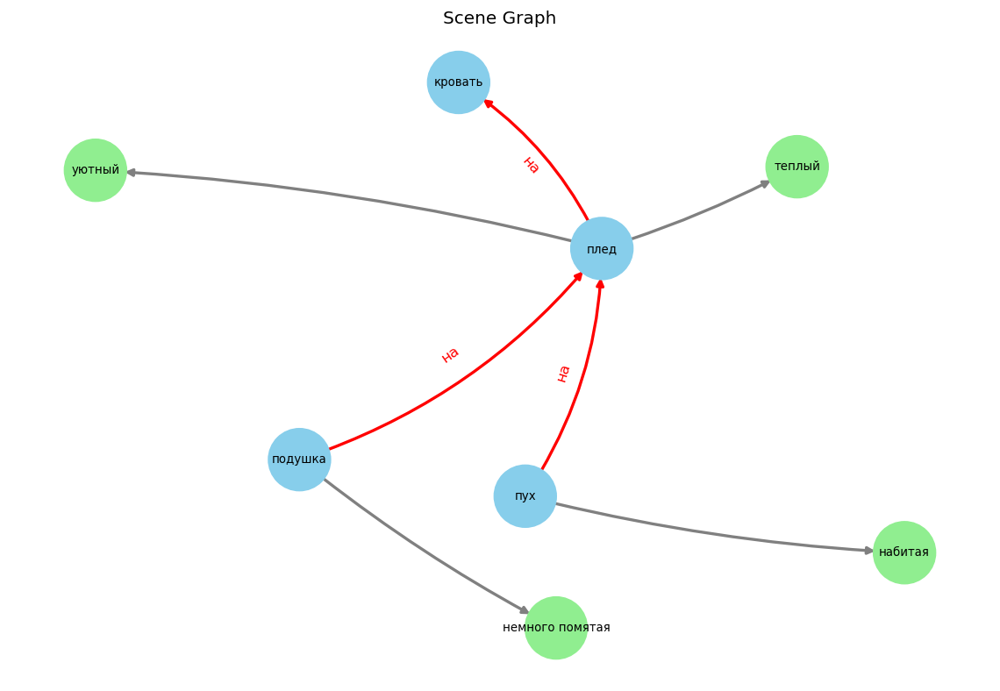


{"src_text": "На скамье покоится старый зонтик, полностью раскрытый от недавнего дождя. Рядом пристроилась пёстрая подушка, еще сухая и чистая.", "norm_text": "На скамье покоится старый полностью раскрытый зонтик от недавнего дождя. Рядом пристроилась пёстрая сухая чистая подушка.", "objects": ["скамья", "зонтик", "дождь", "подушка"], "attributes": {"зонтик": ["полностью раскрытый", "старый"], "дождь": ["недавнего"], "подушка": ["пёстрая", "сухая", "чистая"]}, "relations": [["зонтик", "на", "скамья"]]}



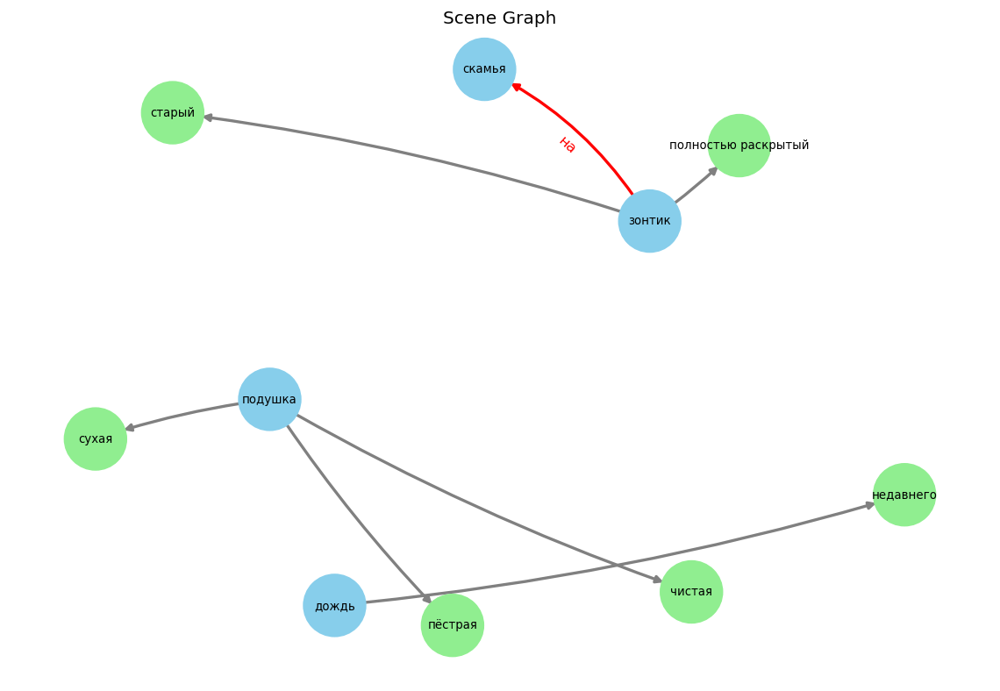


{"src_text": "На берегу виднеется зонтик синий и стул пляжный, оба в хорошем состоянии. Один предмет наклонен над другим.", "norm_text": "На берегу виднеется синий зонтик и пляжный стул, оба в хорошем состоянии. Зонтик наклонен над стулом.", "objects": ["берег", "зонтик", "стул", "состояние"], "attributes": {"зонтик": ["наклонен", "синий"], "стул": ["пляжный"], "состояние": ["хорошем"]}, "relations": [["зонтик", "на", "берег"], ["стул", "на", "берег"]]}



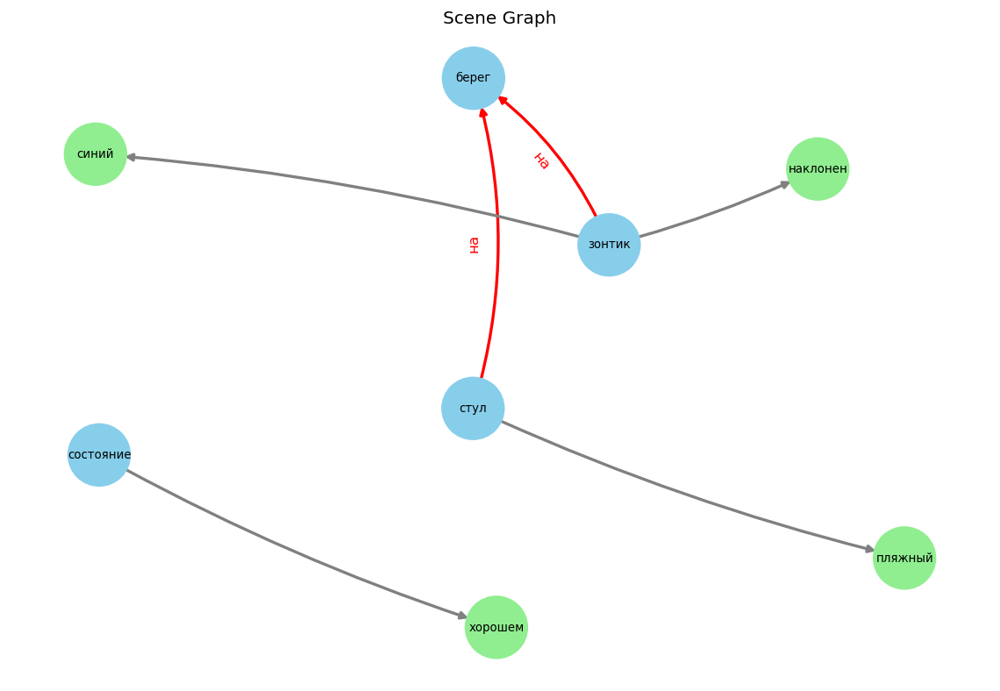


{"src_text": "На скамейке уютно расположились два цветочных горшка: один из терракотовой глины с яркими маргаритками, другой из керамики с нежной зеленью. Рядом стоит небольшая садовая лейка, красочная и аккуратная.", "norm_text": "На скамейке уютно расположились цветочный горшок 1 из терракотовой глины с яркими маргаритками и цветочный горшок 2 из керамики с нежной зеленью. Рядом стоит красочная аккуратная небольшая садовая лейка.", "objects": ["скамейка", "горшок 1", "глина", "маргаритками", "горшок 2", "керамика", "зелень", "лейка"], "attributes": {"глина": ["терракотовой"], "маргаритками": ["яркими"], "зелень": ["нежной"], "лейка": ["аккуратная", "красочная", "небольшая", "садовая"], "горшок 1": ["цветочный"], "горшок 2": ["цветочный"]}, "relations": [["горшок 1", "на", "скамейка"], ["горшок 2", "на", "скамейка"]]}



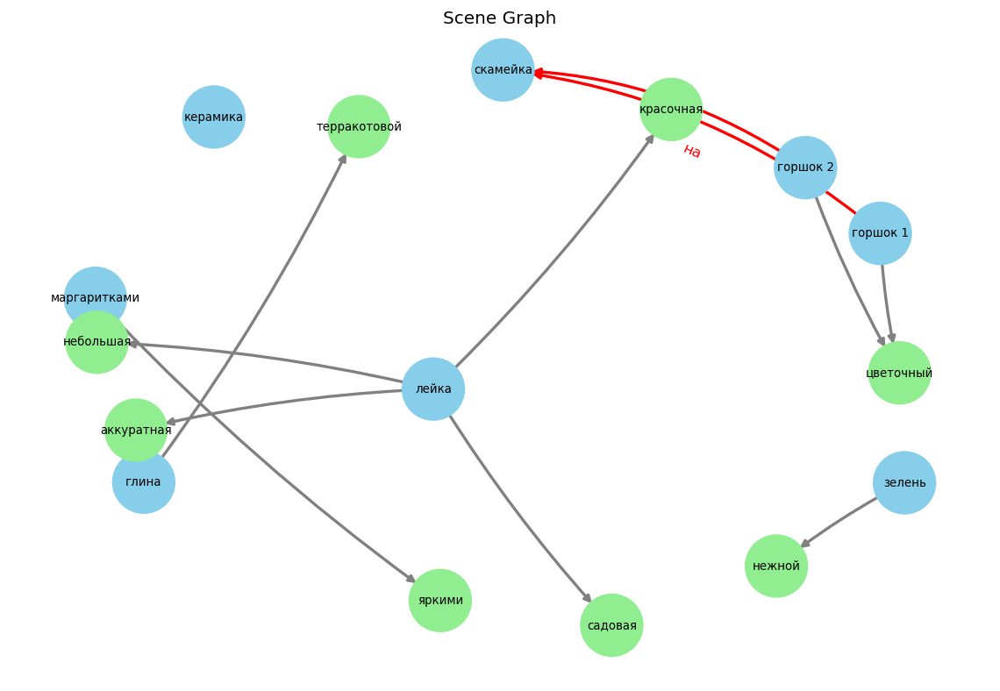


{"src_text": "На тропинке стоит детская коляска, в ней мягкий плед и игрушка. Коляска немного запылена, но выглядит вполне ухоженной.", "norm_text": "На тропинке стоит немного запыленная, но ухоженная детская коляска. В детской коляске лежат мягкий плед и игрушка.", "objects": ["тропинка", "коляска", "плед", "игрушка"], "attributes": {"коляска": ["детская", "детской", "немного запыленная", "ухоженная"], "плед": ["мягкий"]}, "relations": [["плед", "в", "коляска"], ["игрушка", "в", "коляска"], ["коляска", "на", "тропинка"]]}



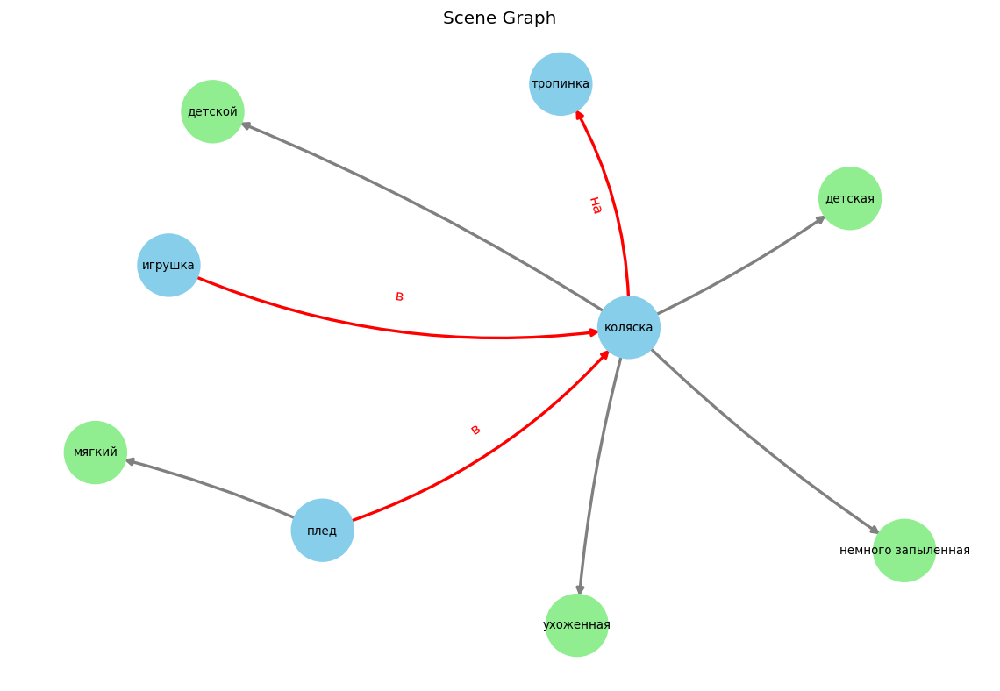


{"src_text": "На балконе стоит клетка с попугаем, цветная и ухоженная. Рядом — глиняный горшок с цветком, немного опавший.", "norm_text": "На балконе стоит цветная ухоженная клетка с попугаем. Рядом — немного опавший глиняный горшок с цветком.", "objects": ["балкон", "клетка", "попугай", "горшок", "цветок"], "attributes": {"клетка": ["ухоженная", "цветная"], "горшок": ["глиняный"]}, "relations": [["клетка", "на", "балкон"]]}



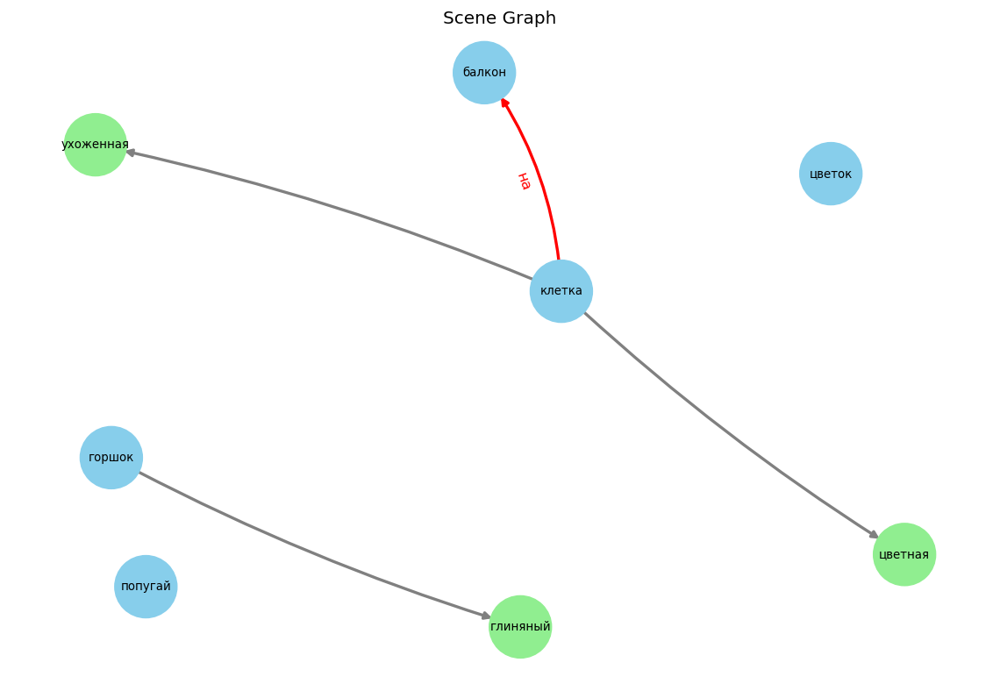


{"src_text": "На скамейке лежит газетный сверток. Рядом стоит чемодан: один коричневый, другой розовый.", "norm_text": "На скамейке лежит газетный сверток. Рядом стоит коричневый чемодан 1 и розовый чемодан 2.", "objects": ["скамейка", "свёрток", "чемодан 1", "чемодан 2"], "attributes": {"свёрток": ["газетный"], "чемодан 1": ["коричневый"], "чемодан 2": ["розовый"]}, "relations": [["свёрток", "на", "скамейка"]]}



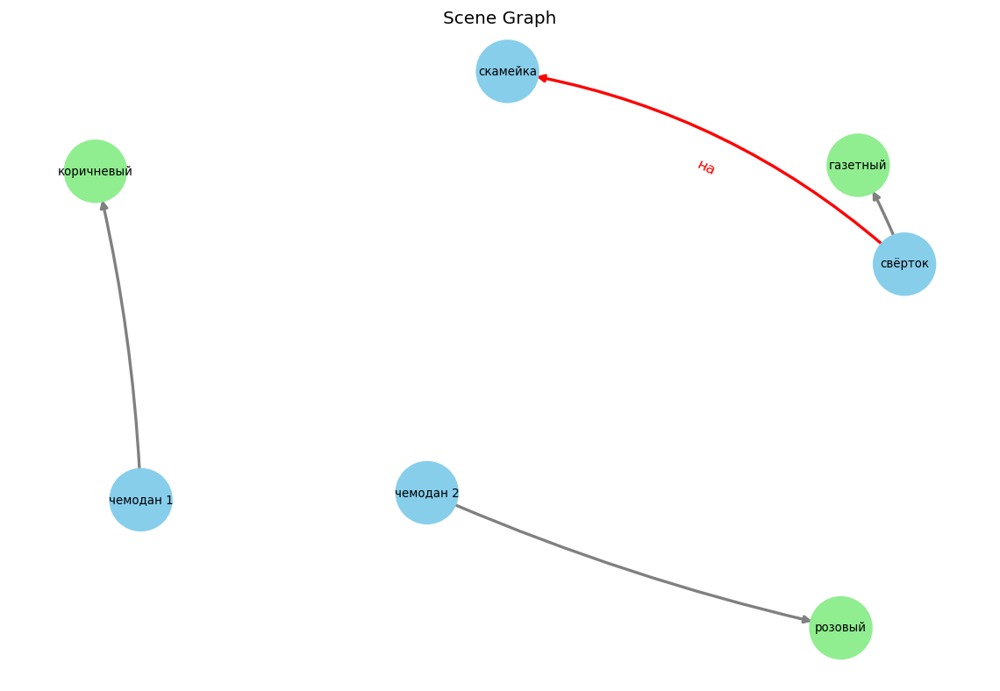


{"src_text": "На полке стоит фарфоровая фигурка, гладкая и блестящая. Рядом с ней старый граммофон с латунной трубой и потертый картонный ящик.", "norm_text": "На полке стоит гладкая блестящая фарфоровая фигурка. Рядом с фарфоровой фигуркой находится старый граммофон с латунной трубой и потертый картонный ящик.", "objects": ["полка", "фигурка", "граммофон", "труба", "ящик"], "attributes": {"фигурка": ["блестящая", "гладкая", "фарфоровая", "фарфоровой"], "граммофон": ["старый"], "труба": ["латунной"], "ящик": ["картонный", "потертый"]}, "relations": [["ящик", "рядом с", "фигурка"], ["граммофон", "рядом с", "фигурка"]]}



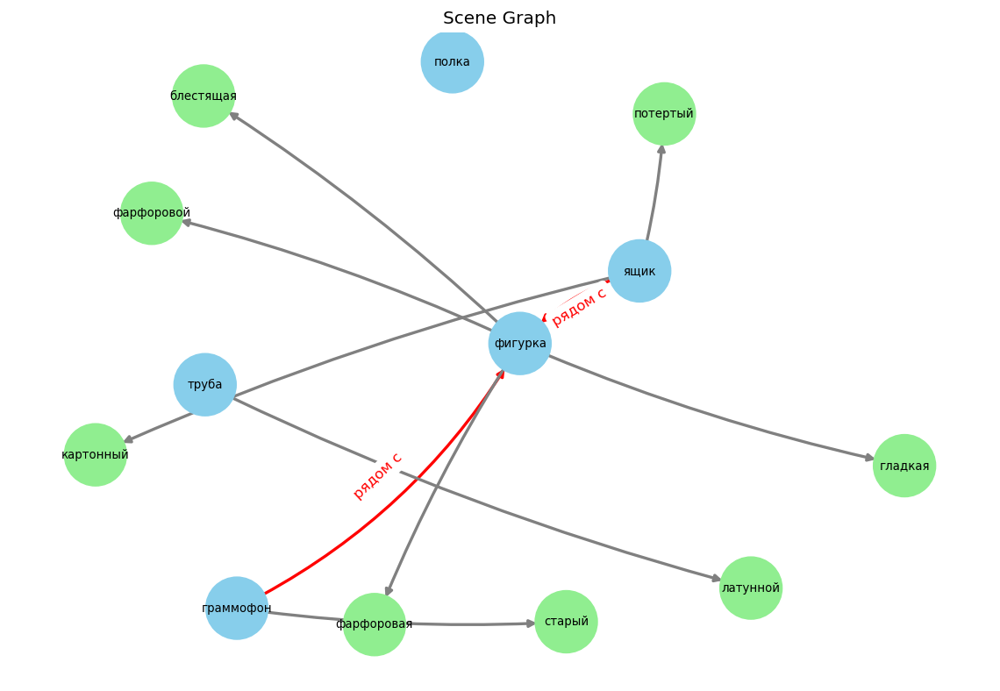


{"src_text": "На столе стоит металлический стетоскоп, слегка изогнутый. Рядом размещена фарфоровая статуэтка, гладкая и без сколов. На полке над столом лежит толстая медицинская книга.", "norm_text": "На столе стоит слегка изогнутый металлический стетоскоп. Рядом размещена гладкая фарфоровая статуэтка без сколов. На полке над столом лежит толстая медицинская книга.", "objects": ["стол", "стетоскоп", "статуэтка", "скол", "полка", "книга"], "attributes": {"стетоскоп": ["металлический", "слегка изогнутый"], "статуэтка": ["гладкая", "фарфоровая"], "книга": ["медицинская", "толстая"]}, "relations": [["стетоскоп", "на", "стол"]]}



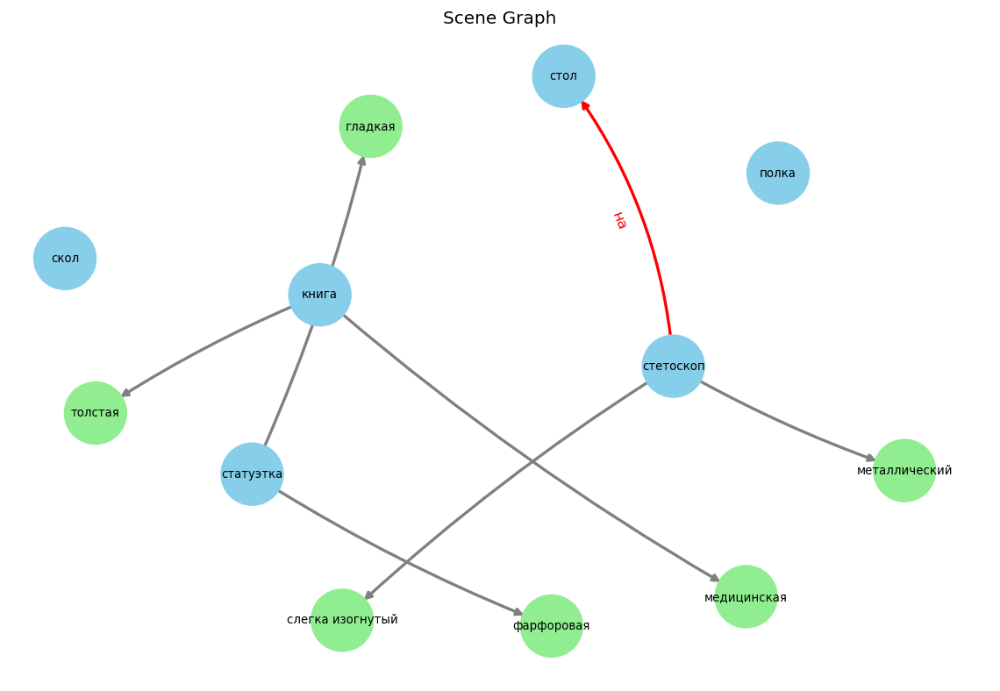


{"src_text": "На столе в центре зала стоят три тарелки: одна из них глубокая с голубым узором, другая мелкая, белоснежная и блестит, третья оранжевая с небольшим сколом на краю. Все тарелки аккуратно расставлены вокруг салфетки.", "norm_text": "На столе в центре зала стоят глубокая тарелка 1 с голубым узором, белоснежная блестящая мелкая тарелка 2 и оранжевая тарелка 3 с небольшим сколом на краю. Все тарелки аккуратно расставлены вокруг салфетки.", "objects": ["стол", "центр", "зал", "тарелка 1", "узор", "тарелка 2", "тарелка 3", "скол", "край", "тарелка", "салфетка"], "attributes": {"тарелка": ["белоснежная", "блестящая", "глубокая", "мелкая", "оранжевая"], "узор": ["голубым"], "скол": ["небольшим"], "тарелка 1": ["глубокая"], "тарелка 2": ["белоснежная", "блестящая", "мелкая"], "тарелка 3": ["оранжевая"]}, "relations": [["тарелка 1", "на", "стол"], ["тарелка 3", "на", "стол"], ["тарелка 2", "на", "стол"]]}



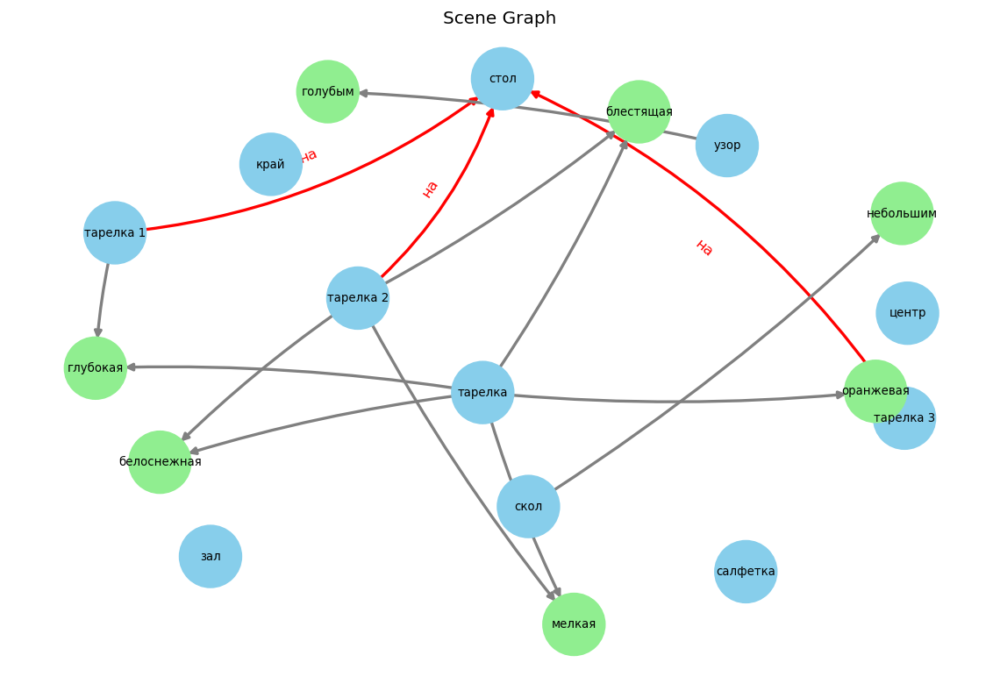


{"src_text": "На ковре стоит рваный ботинок, а рядом пара зонтов — один из них полосатый, второй однотонный. Зонты склонились друг к другу и смотрятся стильно.", "norm_text": "На ковре стоит рваный ботинок, а рядом полосатый стильный зонт 1 и однотонный стильный зонт 2. Зонты 1 и 2 склонились друг к другу.", "objects": ["ковёр", "ботинок", "зонт 1", "зонт 2"], "attributes": {"ботинок": ["рваный"], "зонт 1": ["полосатый", "стильный"], "зонт 2": ["однотонный", "стильный"]}, "relations": [["ботинок", "на", "ковёр"]]}



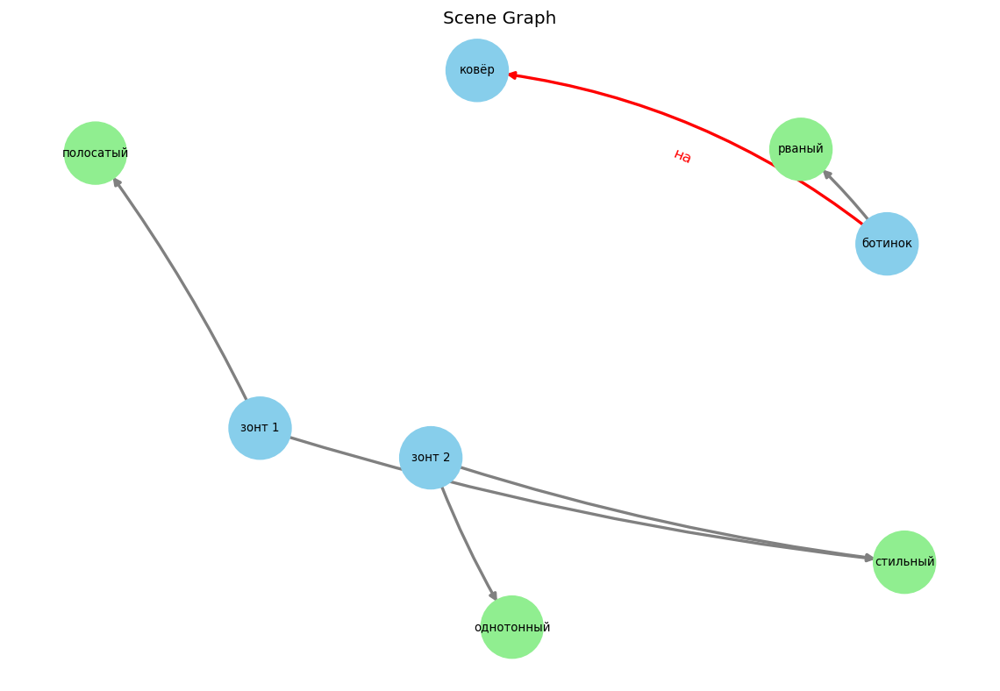


{"src_text": "На журнальном столике стоит керамическая фигурка, аккуратная и сделанная с большим мастерством. Рядом с ней — красочный альбом для рисования, слегка измятый по краям.", "norm_text": "На журнальном столике стоит аккуратная керамическая фигурка, сделанная с большим мастерством. Рядом с керамической фигуркой — красочный альбом для рисования, слегка измятый по краям.", "objects": ["столик", "фигурка", "мастерство", "альбом", "рисование", "край"], "attributes": {"столик": ["журнальном"], "фигурка": ["аккуратная", "керамическая", "керамической", "сделанная с мастерством"], "мастерство": ["большим"], "альбом": ["красочный", "слегка измятый по краям"]}, "relations": [["фигурка", "на", "столик"]]}



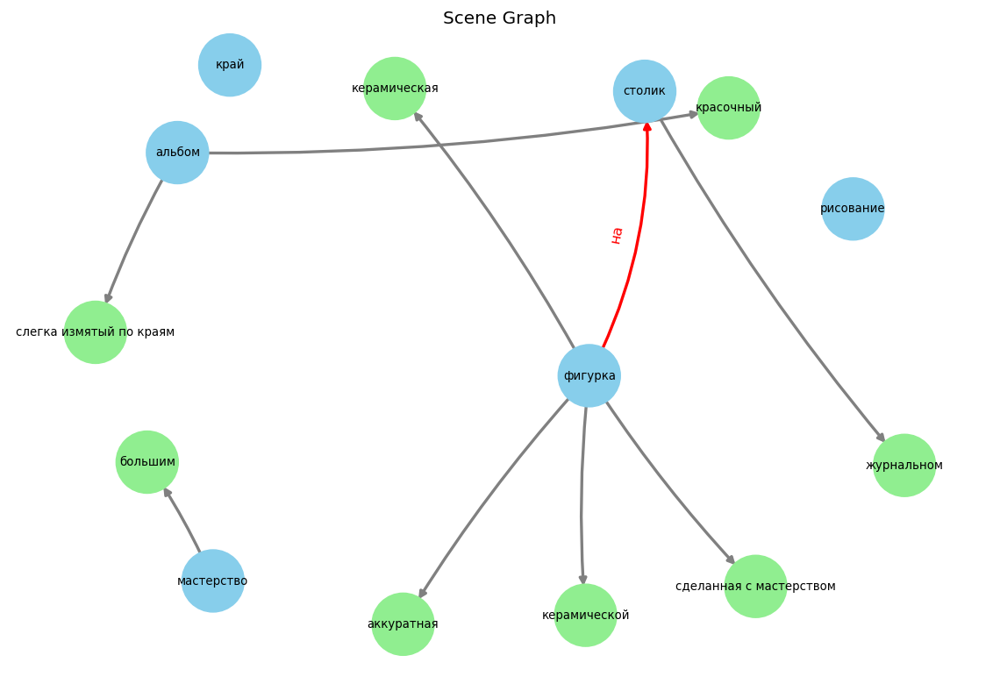


{"src_text": "На кухонном столе стоит серебристый чайник, свежевымытый и блестящий. Рядом с ним лежат три ложки разных размеров: большая, средняя и маленькая.", "norm_text": "На кухонном столе стоит свежевымытый блестящий серебристый чайник. Рядом с чайником лежат большая ложка 1, средняя ложка 2 и маленькая ложка 3.", "objects": ["стол", "чайник", "ложка 1", "ложка 2", "ложка 3"], "attributes": {"стол": ["кухонном"], "чайник": ["блестящий", "свежевымытый", "серебристый"], "ложка 1": ["большая"], "ложка 2": ["средняя"], "ложка 3": ["маленькая"]}, "relations": [["ложка 2", "рядом с", "чайник"], ["ложка 3", "рядом с", "чайник"], ["чайник", "на", "стол"], ["ложка 1", "рядом с", "чайник"]]}



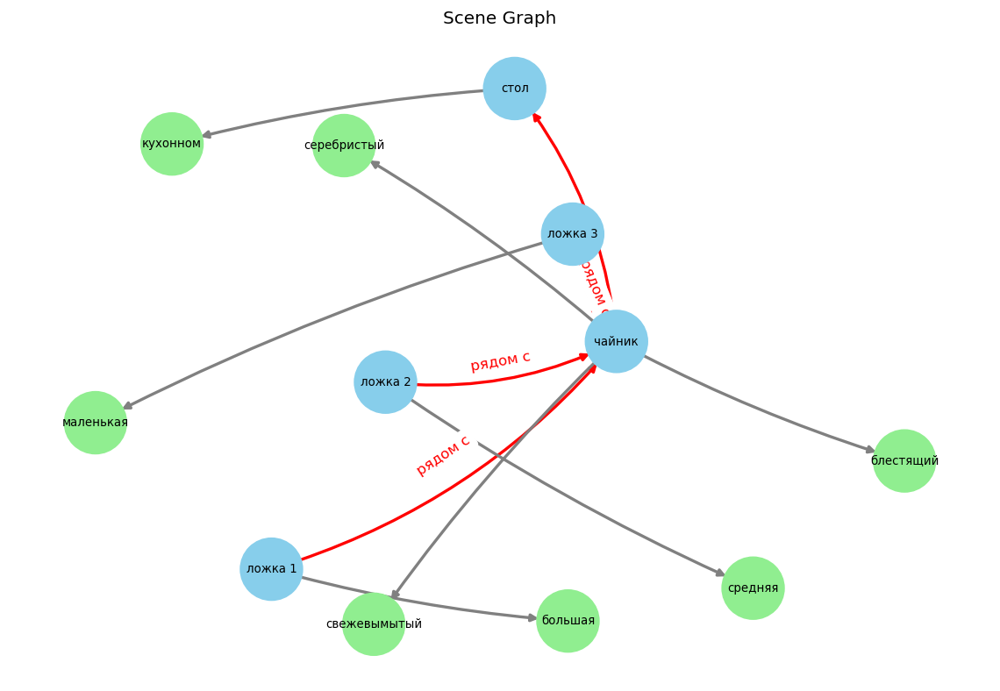


{"src_text": "На игровой площадке стоит высокая горка, она немного поцарапана и краска местами облупилась. Рядом с ней установлен вертящаяся карусель ярких цветов.", "norm_text": "На игровой площадке стоит высокая поцарапанная горка с облупившейся местами краской. Рядом с горкой установлена яркая вертящаяся карусель.", "objects": ["площадка", "горка", "место", "краска", "карусель"], "attributes": {"площадка": ["игровой"], "горка": ["высокая", "поцарапанная"], "карусель": ["вертящаяся", "яркая"], "краска": ["облупившейся местами"]}, "relations": [["горка", "на", "площадка"]]}



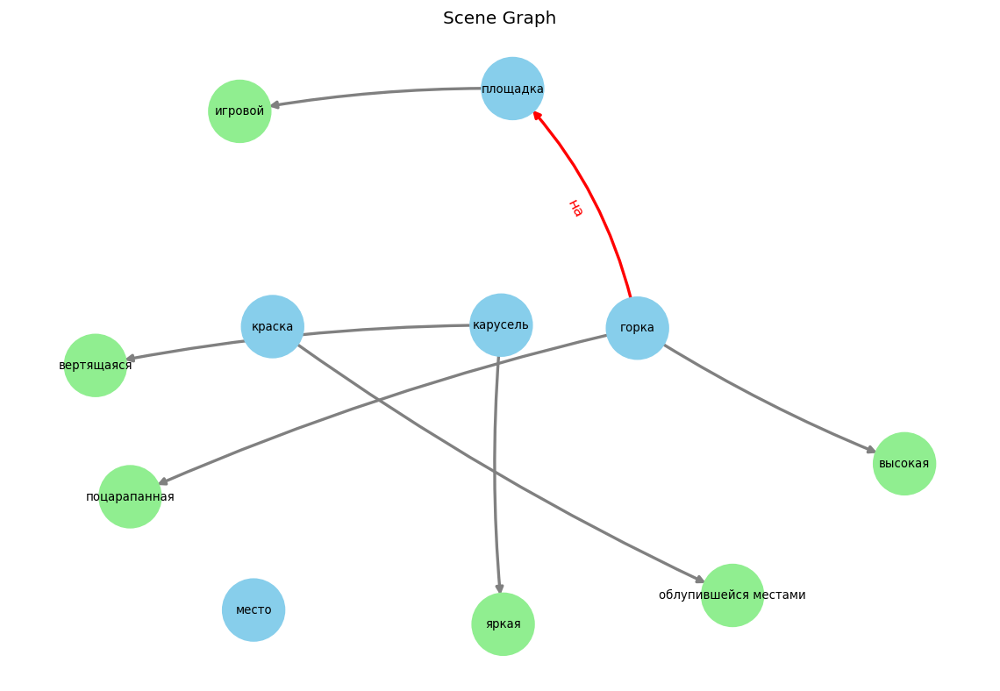


{"src_text": "На чердаке стоит антикварный сундук, покрытый пылью, с резными узорами. Рядом с ним на полу лежит картонная коробка с разбросанными журналами. В дальнем углу собрана стопка старых виниловых пластинок, некоторые из них помяты.", "norm_text": "На чердаке стоит антикварный пыльный сундук с резными узорами. Рядом с сундуком на полу лежит картонная коробка с разбросанными журналами. В дальнем углу собрана стопка старых помятых виниловых пластинок.", "objects": ["чердак", "сундук", "узор", "пол", "коробка", "журнал", "угол", "стопка", "пластинка"], "attributes": {"сундук": ["антикварный", "пыльный"], "узор": ["резными"], "коробка": ["картонная"], "журнал": ["разбросанными"], "угол": ["дальнем"], "пластинка": ["виниловых", "помятых", "старых"]}, "relations": [["сундук", "на", "чердак"], ["коробка", "рядом с", "сундук"]]}



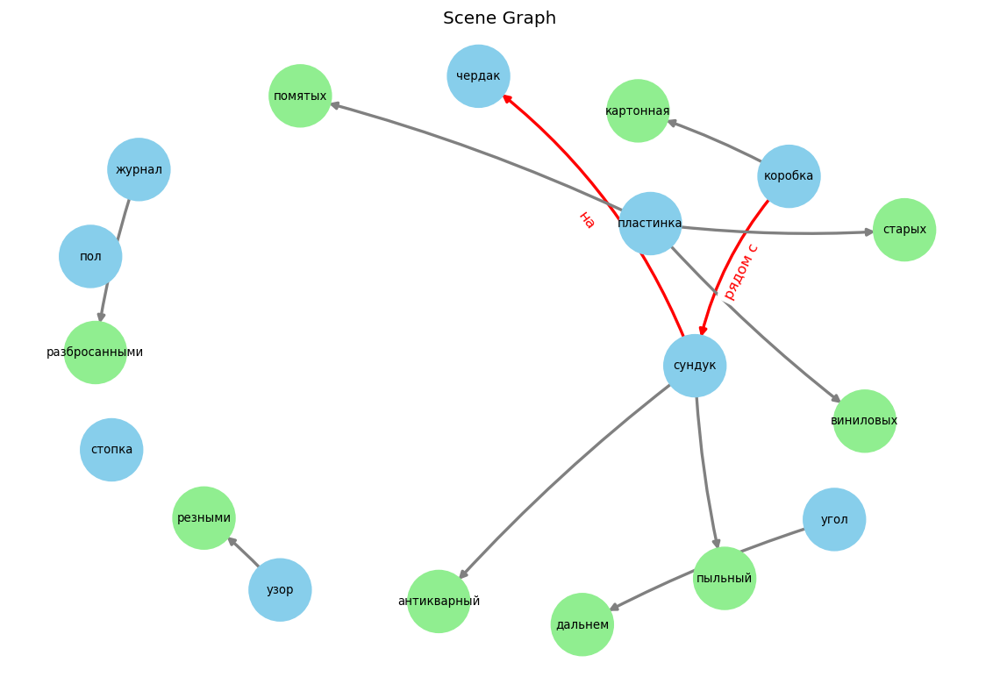


{"src_text": "На кухонном столе стоит серебристый чайник, блестящий и современный. Он слегка наклонен в сторону раковины.", "norm_text": "На кухонном столе стоит блестящий современный серебристый чайник, слегка наклонённый в сторону раковины.", "objects": ["стол", "чайник", "сторона", "раковина"], "attributes": {"стол": ["кухонном"], "чайник": ["блестящий", "серебристый", "современный"]}, "relations": [["чайник", "на", "стол"]]}



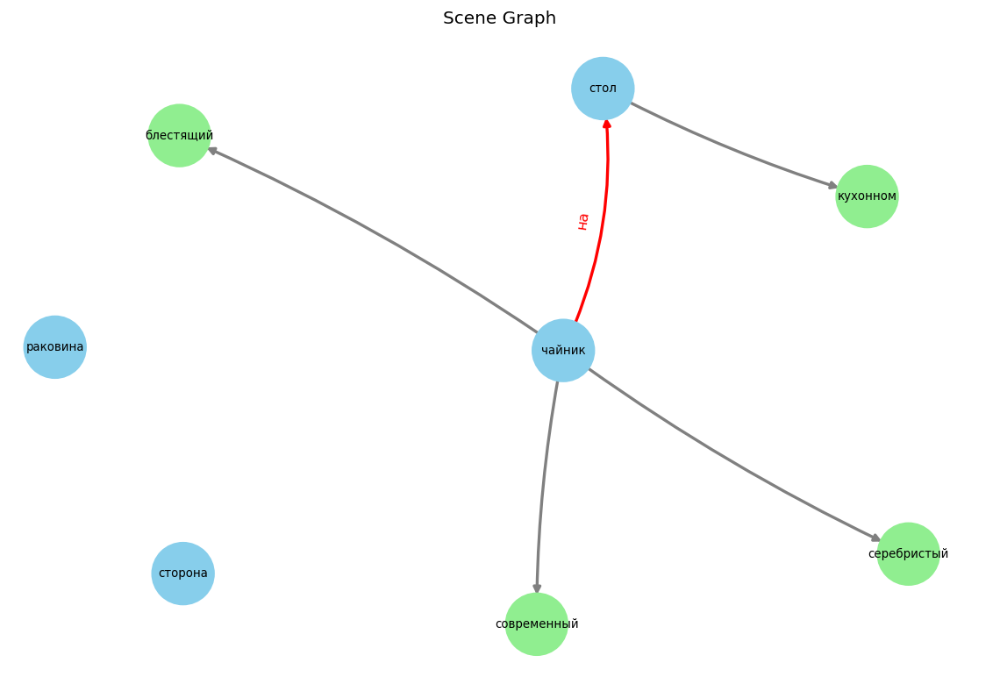


{"src_text": "На сцене оставлены три предмета: потертая бархатная занавеска позади, поблекшие кулисы сбоку и поцарапанный прожектор сверху. Они создают атмосферу давно забытого времени.", "norm_text": "На сцене оставлены три предмета: потертая бархатная занавеска позади, поблекшие кулисы сбоку и поцарапанный прожектор сверху. Эти предметы создают атмосферу давно забытого времени.", "objects": ["сцена", "предмет", "занавеска", "кулиса", "прожектор", "атмосфера", "время"], "attributes": {"занавеска": ["бархатная", "потертая"], "прожектор": ["поцарапанный"], "предмет": ["сбоку поблекшие кулисы"], "время": ["давно забытого"]}, "relations": []}



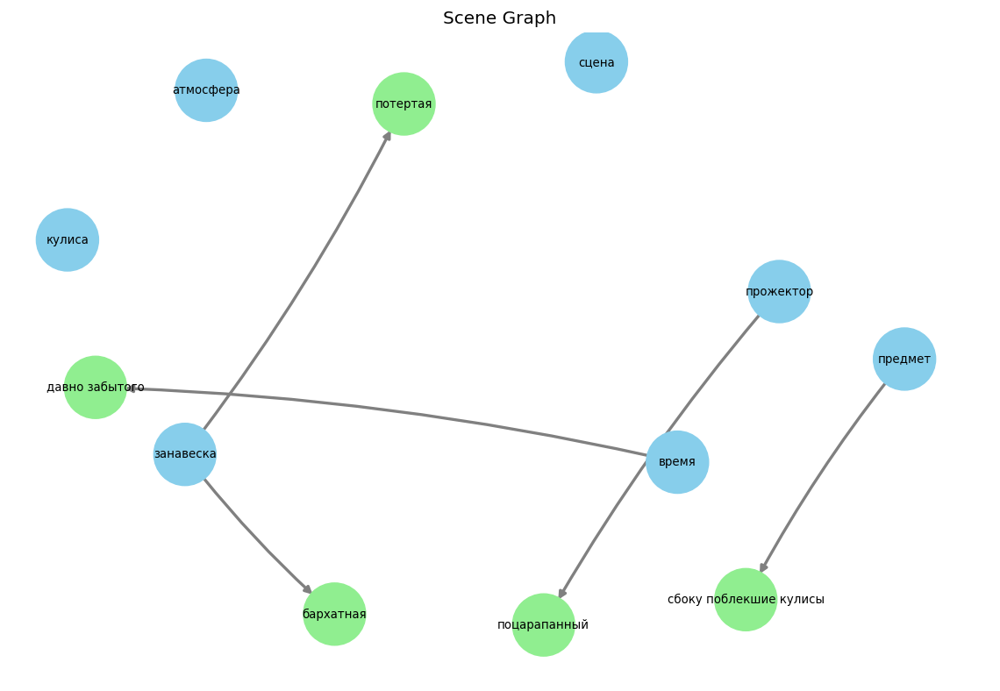


{"src_text": "На полке в ванной комнате стоят три бутылки: одна зеленая, другая белая и третья розовая. Зеленая бутылка почти пустая, остальные — полные.", "norm_text": "На полке в ванной комнате стоят почти пустая зеленая бутылка 1, полная белая бутылка 2 и полная розовая бутылка 3.", "objects": ["полка", "комната", "бутылка 1", "бутылка 2", "бутылка 3"], "attributes": {"комната": ["ванной"], "бутылка 1": ["зеленая", "почти пустая"], "бутылка 2": ["белая", "полная"], "бутылка 3": ["полная", "розовая"]}, "relations": []}



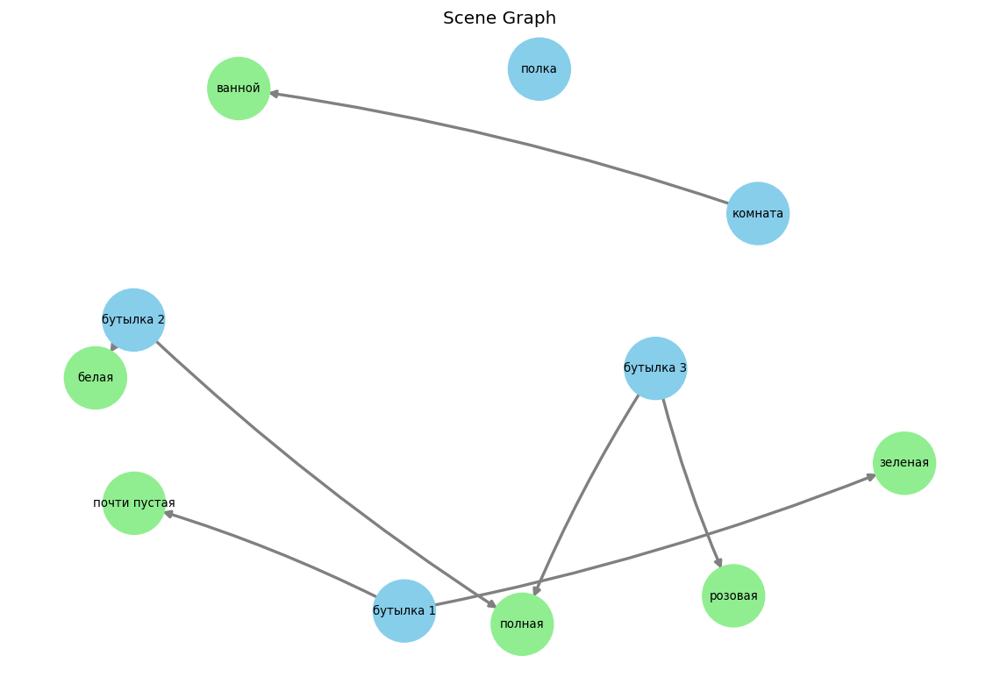


{"src_text": "На верстаке аккуратно размещена шлифовальная машина, красная и слегка запыленная.", "norm_text": "На верстаке аккуратно размещена красная слегка запыленная шлифовальная машина.", "objects": ["верстак", "машина"], "attributes": {"машина": ["красная", "слегка запыленная", "шлифовальная"]}, "relations": []}



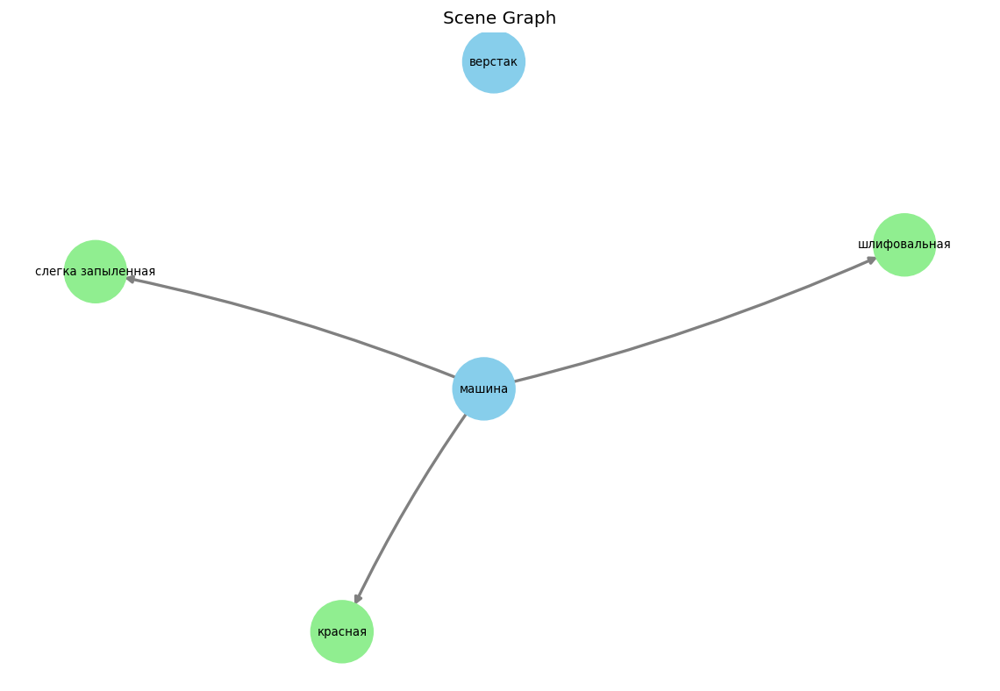


{"src_text": "На клумбе растет куст с розовыми цветами. В тени расправил крылья бабочка, а на ветке по соседству сидит воробей и чистит перья.", "norm_text": "На клумбе растет куст с розовыми цветами. В тени расправила крылья бабочка, а на ветке куста сидит воробей и чистит перья.", "objects": ["клумба", "куст", "цвет", "тень", "крыло", "бабочка", "ветка", "воробей", "перо"], "attributes": {"цвет": ["розовыми"]}, "relations": [["воробей", "на", "ветка"], ["куст", "на", "клумба"], ["бабочка", "в", "тень"]]}



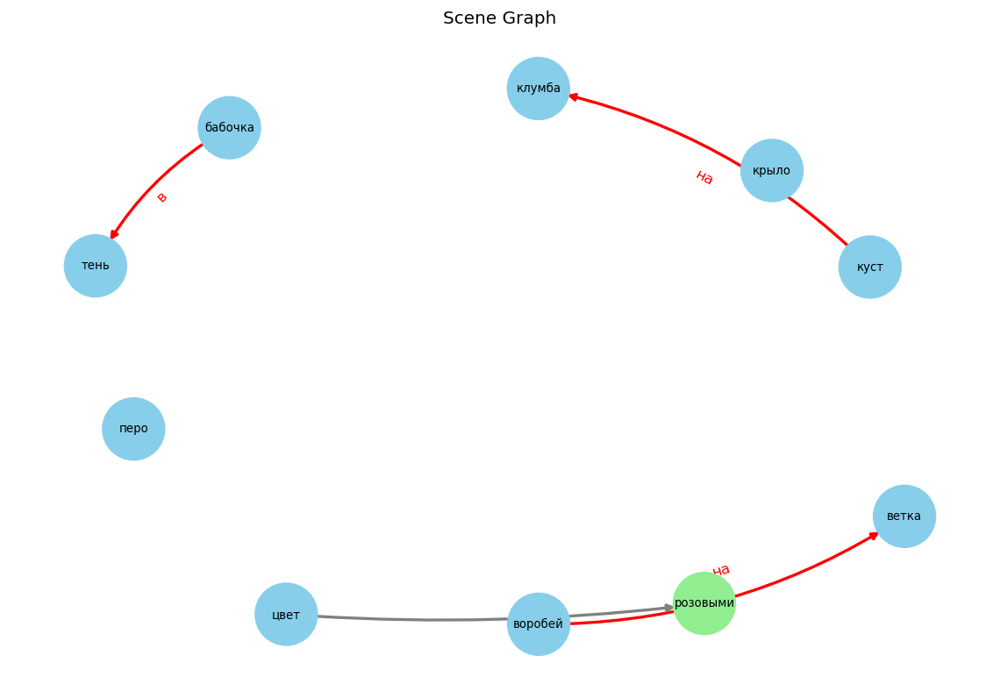


{"src_text": "На полке стоит большая керамическая ваза, вокруг которой разбросаны мелкие ракушки. Ваза выглядит стильной и безупречно чистой.", "norm_text": "На полке стоит большая стильная безупречно чистая керамическая ваза, вокруг которой разбросаны мелкие ракушки.", "objects": ["полка", "ваза", "ракушка"], "attributes": {"ваза": ["безупречно чистая", "большая", "керамическая", "стильная"], "ракушка": ["мелкие"]}, "relations": []}



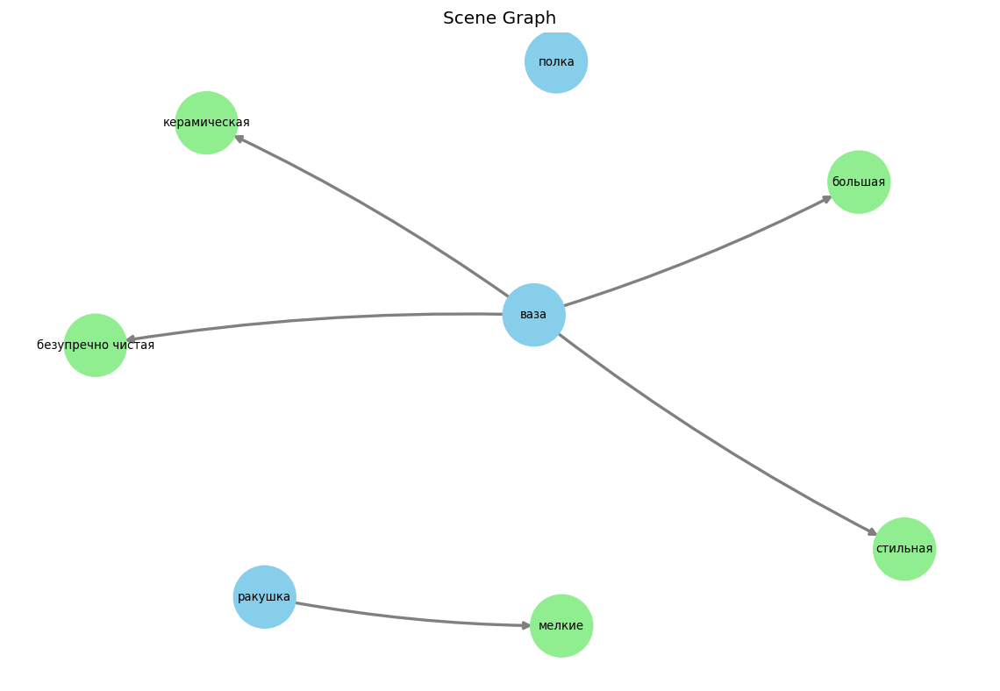


{"src_text": "На кровати лежит плед теплого оттенка, мягкий на ощупь. Выглядит уютно и привлекательно.", "norm_text": "На кровати лежит мягкий уютный привлекательный плед теплого оттенка.", "objects": ["кровать", "плед", "оттенок"], "attributes": {"плед": ["мягкий", "привлекательный", "уютный"], "оттенок": ["теплого"]}, "relations": [["плед", "на", "кровать"]]}



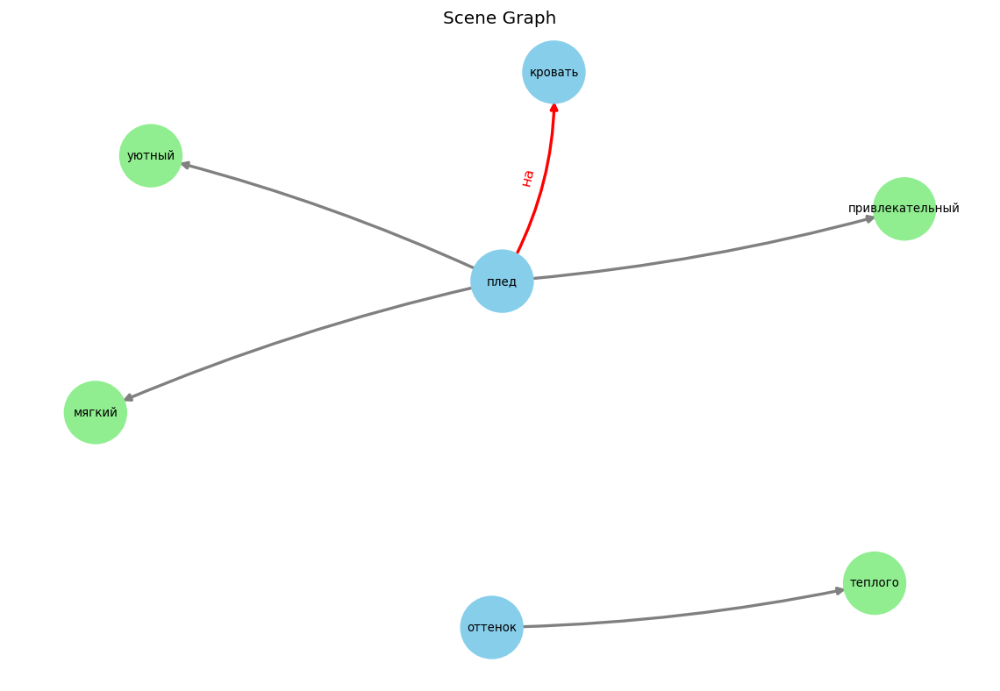


{"src_text": "На крючке висит длинный серый плащ, слегка поношенный. В углу приютилась большая картонная коробка, а рядом с ней стоит старая баночка с краской.", "norm_text": "На крючке висит длинный серый слегка поношенный плащ. В углу приютилась большая картонная коробка, а рядом с коробкой стоит старая баночка с краской.", "objects": ["крючок", "плащ", "угол", "коробка", "баночка", "краска"], "attributes": {"плащ": ["длинный", "серый", "слегка поношенный"], "коробка": ["большая", "картонная"], "баночка": ["старая"]}, "relations": [["плащ", "на", "крючок"], ["коробка", "в", "угол"], ["баночка", "рядом с", "коробка"]]}



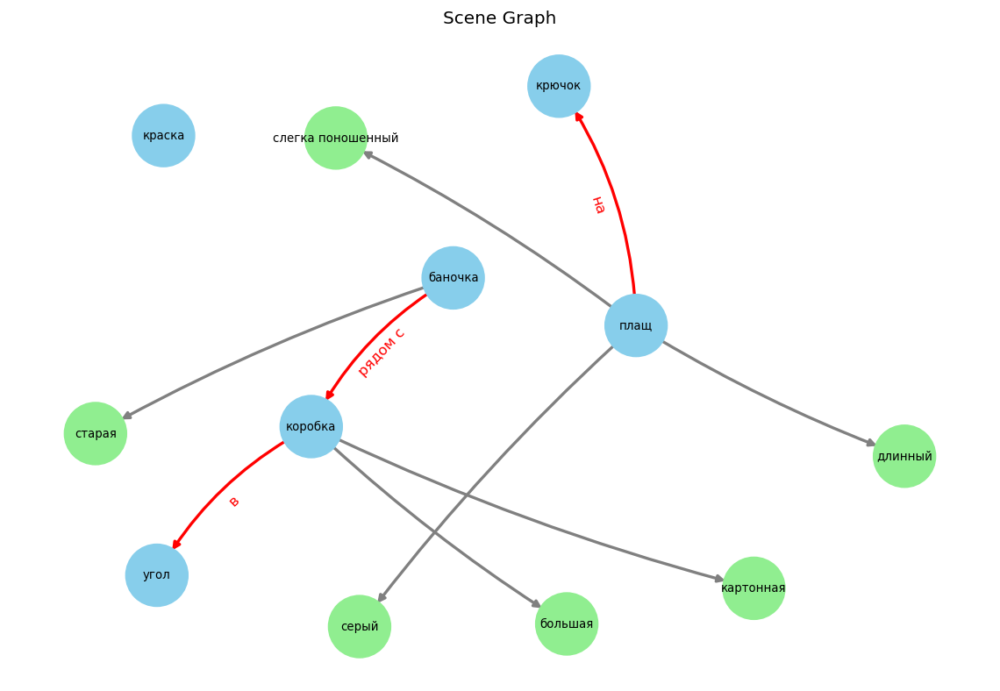


{"src_text": "На дорожке стоит зеленая лейка, чуть наклоненная. Рядом с ней металлический грабельки и красные перчатки.", "norm_text": "На дорожке стоит зеленая слегка наклоненная лейка. Рядом с лейкой находятся металлические грабельки и красные перчатки.", "objects": ["дорожка", "лейка", "грабельки", "перчатка"], "attributes": {"лейка": ["зеленая", "слегка наклоненная"], "грабельки": ["металлические"], "перчатка": ["красные"]}, "relations": [["лейка", "на", "дорожка"], ["перчатка", "рядом с", "лейка"], ["грабельки", "рядом с", "лейка"]]}



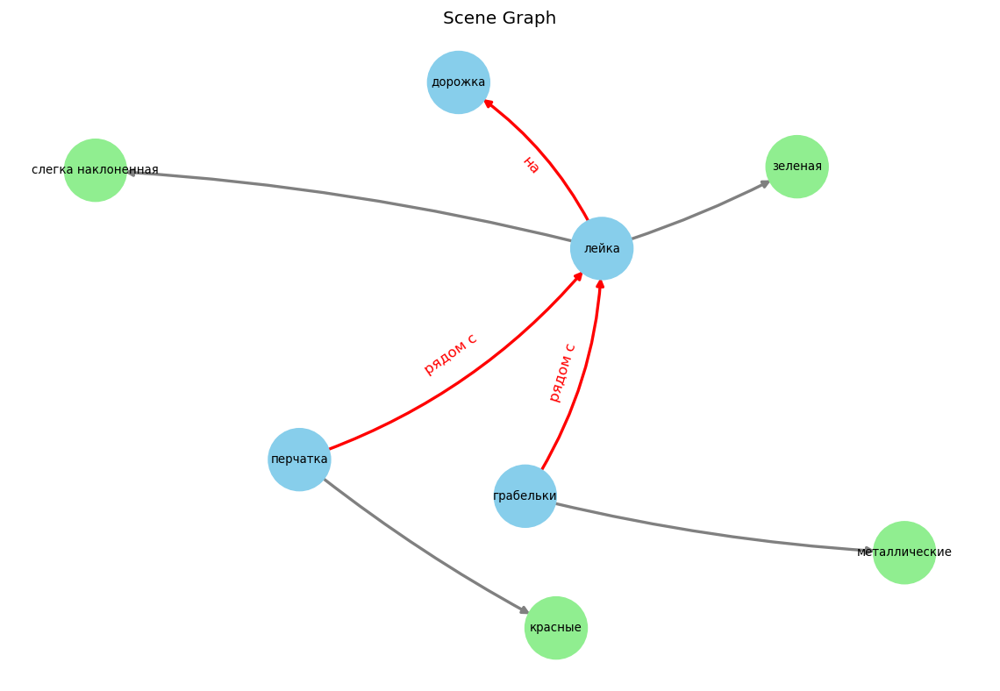


{"src_text": "На столике у окна стоит графин изящной формы. Рядом бокалы, один чистый, другой с потускневшими гранями.", "norm_text": "На столике у окна стоит графин изящной формы. Рядом с графином находятся чистый бокал 1 и бокал 2 с потускневшими гранями.", "objects": ["столик", "окно", "графин", "форма", "бокал 1", "бокал 2", "грань"], "attributes": {"форма": ["изящной"], "грань": ["потускневшими"], "бокал 1": ["чистый"]}, "relations": [["бокал 2", "рядом с", "графин"], ["бокал 1", "рядом с", "графин"], ["графин", "на", "столик"], ["графин", "у", "окно"]]}



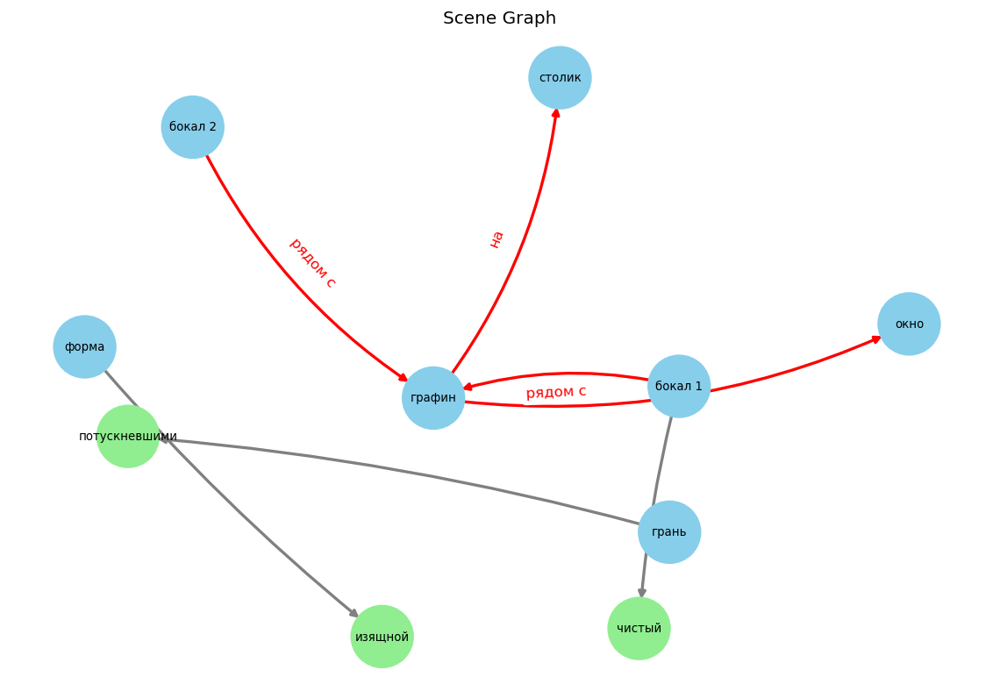


{"src_text": "На деревянном стуле сидит плюшевый тигр, слегка потрепанный. Рядом стоит большая картонная коробка с цветными лентами.", "norm_text": "На деревянном стуле сидит слегка потрёпанный плюшевый тигр. Рядом стоит большая картонная коробка с цветными лентами.", "objects": ["стул", "тигр", "коробка", "лента"], "attributes": {"стул": ["деревянном"], "тигр": ["плюшевый", "слегка потрёпанный"], "коробка": ["большая", "картонная"], "лента": ["цветными"]}, "relations": [["тигр", "на", "стул"]]}



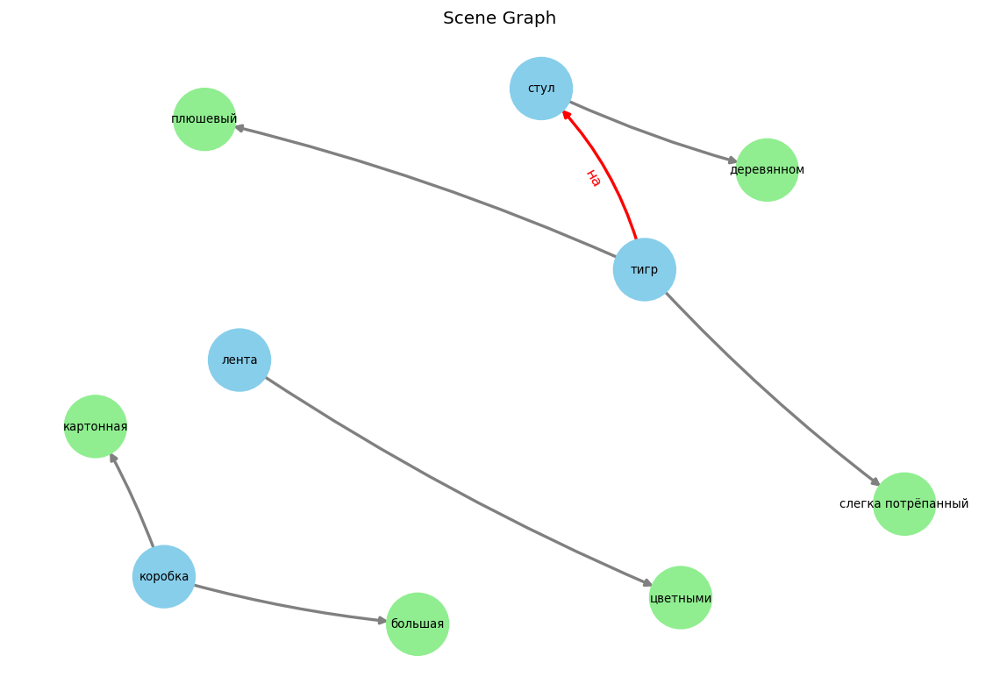


{"src_text": "На пляже стоит синяя раковина, гладкая и блестящая, с мелким песком внутри. Рядом с ней цветной камень, гладкий и слегка влажный от волн.", "norm_text": "На пляже стоит синяя гладкая блестящая раковина с мелким песком внутри. Рядом с раковиной находится цветной гладкий слегка влажный от волн камень.", "objects": ["пляж", "раковина", "песок", "волна", "камень"], "attributes": {"раковина": ["блестящая", "гладкая", "синяя"], "песок": ["мелким"], "камень": ["гладкий", "цветной"]}, "relations": [["раковина", "на", "пляж"], ["камень", "рядом с", "раковина"]]}



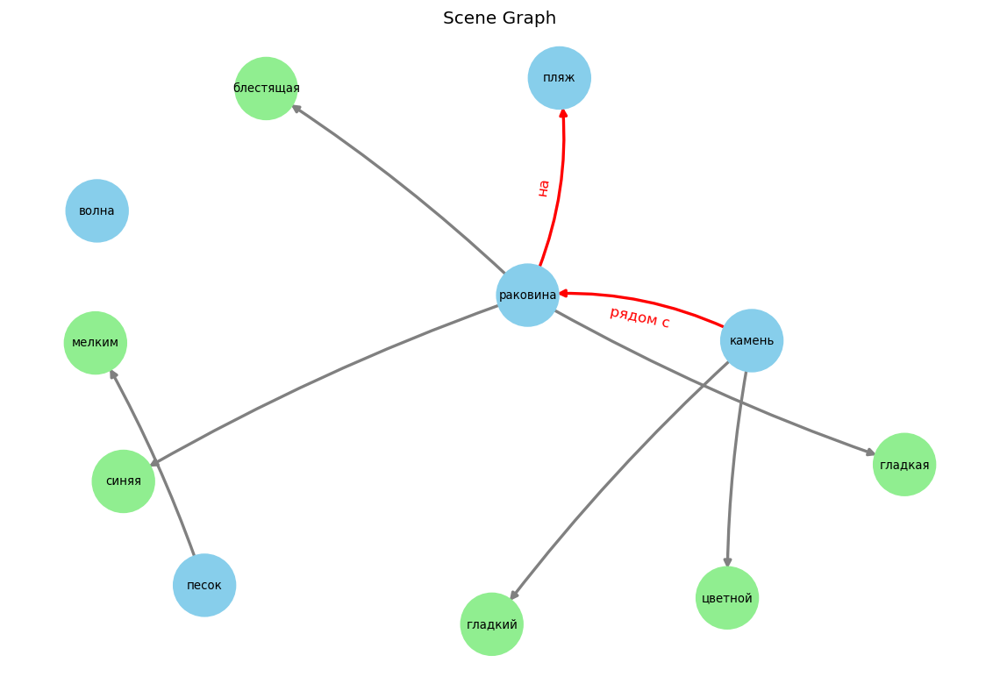


{"src_text": "На пеньке стоит большая корзина, полная спелых ягод. Рядом с ней покоится гладкий камень, покрытый мхом.", "norm_text": "На пеньке стоит большая корзина, полная спелых ягод. Рядом с корзиной покоится гладкий камень, покрытый мхом.", "objects": ["пенёк", "корзина", "ягода", "камень", "мох"], "attributes": {"корзина": ["большая"], "ягода": ["полная", "спелых"], "камень": ["гладкий", "покрытый мхом"]}, "relations": [["камень", "рядом с", "корзина"], ["корзина", "на", "пенёк"]]}



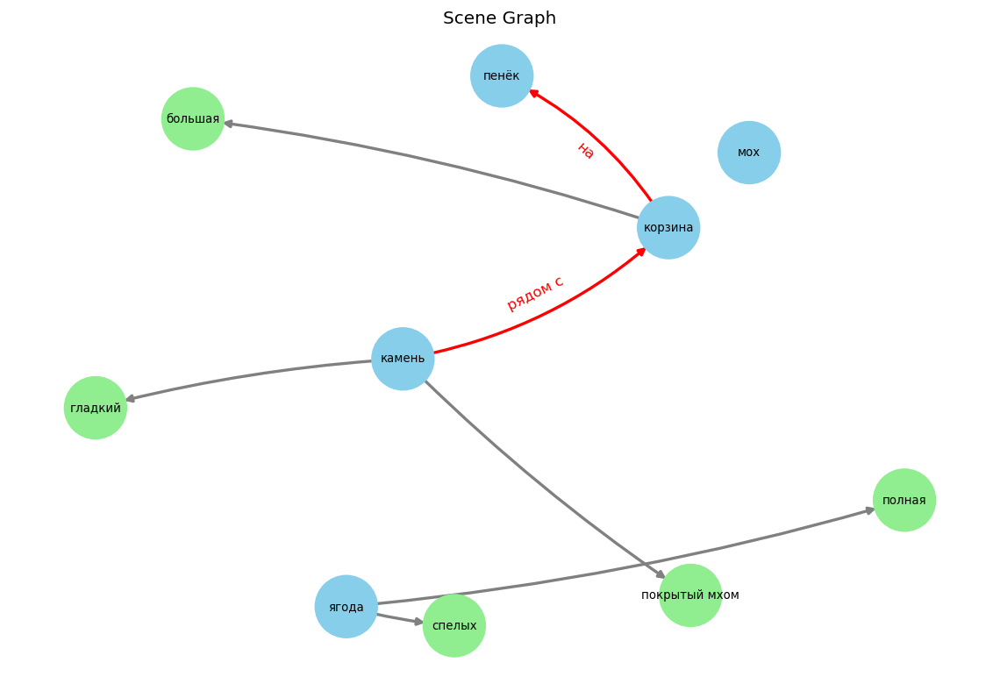


{"src_text": "На кушетке лежит темно-серый плед, немного поношенный. Рядом стоит небольшая банковская лампа зеленого цвета.", "norm_text": "На кушетке лежит немного поношенный темно-серый плед. Рядом стоит небольшая зеленая банковская лампа.", "objects": ["кушетка", "плед", "лампа"], "attributes": {"плед": ["-", "немного поношенный", "серый", "темно"], "лампа": ["банковская", "зеленая", "небольшая"]}, "relations": [["плед", "на", "кушетка"]]}



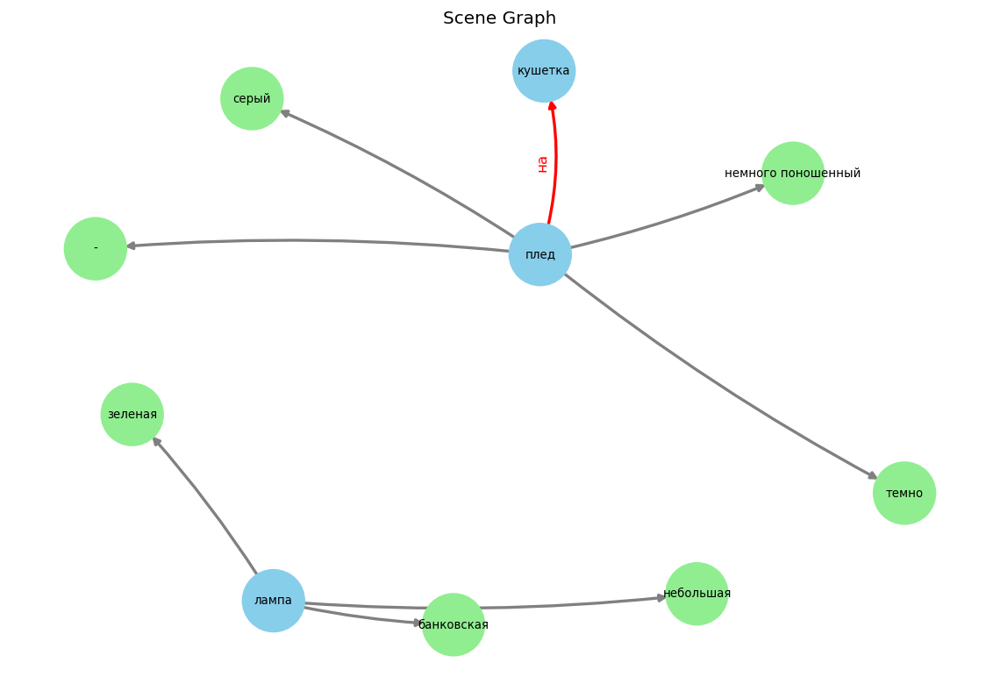


{"src_text": "На берегу моря стоит шезлонг, с выцветшей тканью и сломанной ножкой. Рядом лежит кожаная сумка, полная песка.", "norm_text": "На берегу моря стоит шезлонг с выцветшей тканью и сломанной ножкой. Рядом лежит кожаная сумка, полная песка.", "objects": ["берег", "море", "шезлонг", "ткань", "ножка", "сумка", "песок"], "attributes": {"ткань": ["выцветшей"], "ножка": ["сломанной"], "сумка": ["кожаная"], "песок": ["полная"]}, "relations": [["шезлонг", "на", "берег"]]}



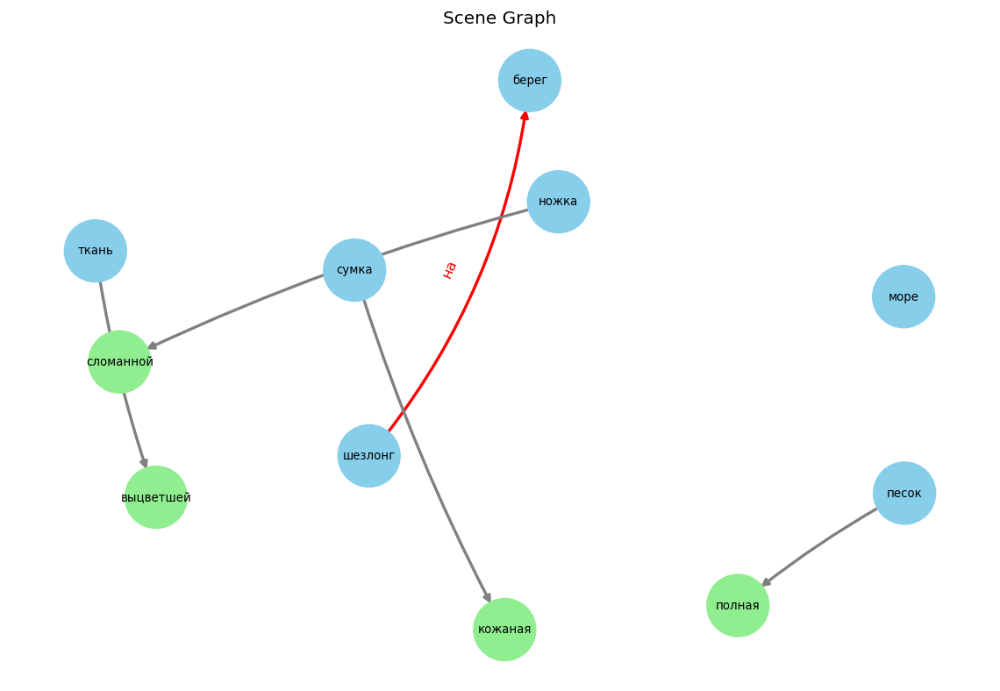


{"src_text": "На длинной бархатной занавесе видны золотистые кисти, местами потертые. Она слегка приподнята, открывая вид на сцену.", "norm_text": "На длинной бархатной занавесе видны местами потертые золотистые кисти. Бархатная занавеса слегка приподнята, открывая вид на сцену.", "objects": ["занавес", "место", "кисть", "вид", "сцена"], "attributes": {"занавес": ["бархатная", "бархатной", "длинной"], "кисть": ["видны", "золотистые", "потертые"], "место": ["видны"]}, "relations": []}



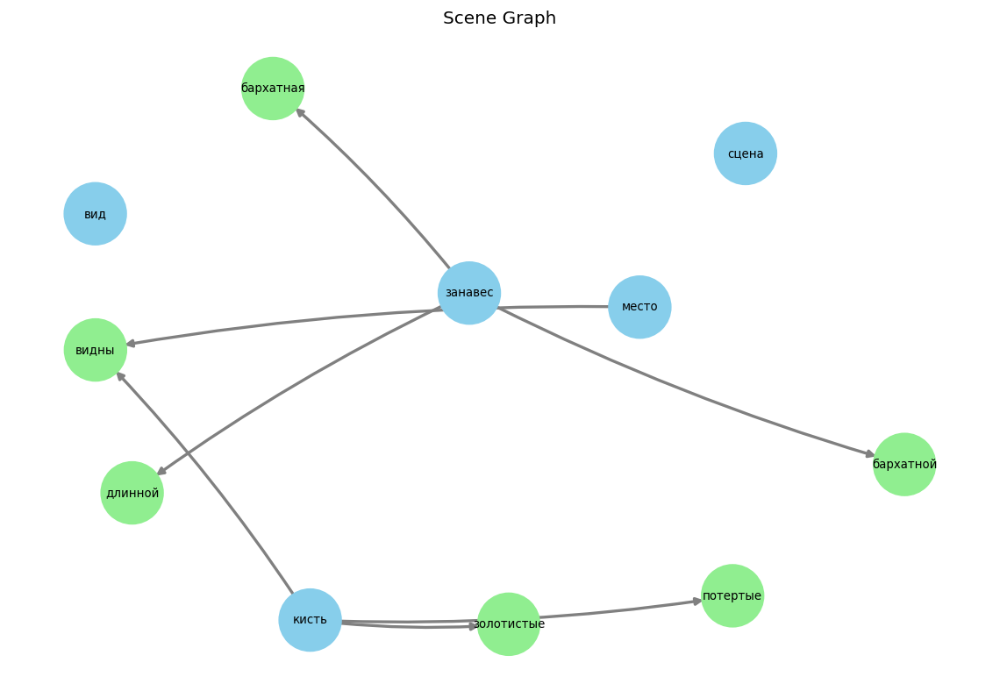


{"src_text": "На полке стоит пыльная статуэтка слона из мрамора. Справа лежит старый кожаный мяч, а левее — рваный картонный коробок.", "norm_text": "На полке стоит пыльная мраморная статуэтка слона. Справа лежит старый кожаный мяч, а левее — рваный картонный коробок.", "objects": ["полка", "статуэтка", "слон", "мяч", "коробка"], "attributes": {"статуэтка": ["мраморная", "пыльная"], "мяч": ["кожаный", "старый"], "коробка": ["картонный", "рваный"]}, "relations": []}



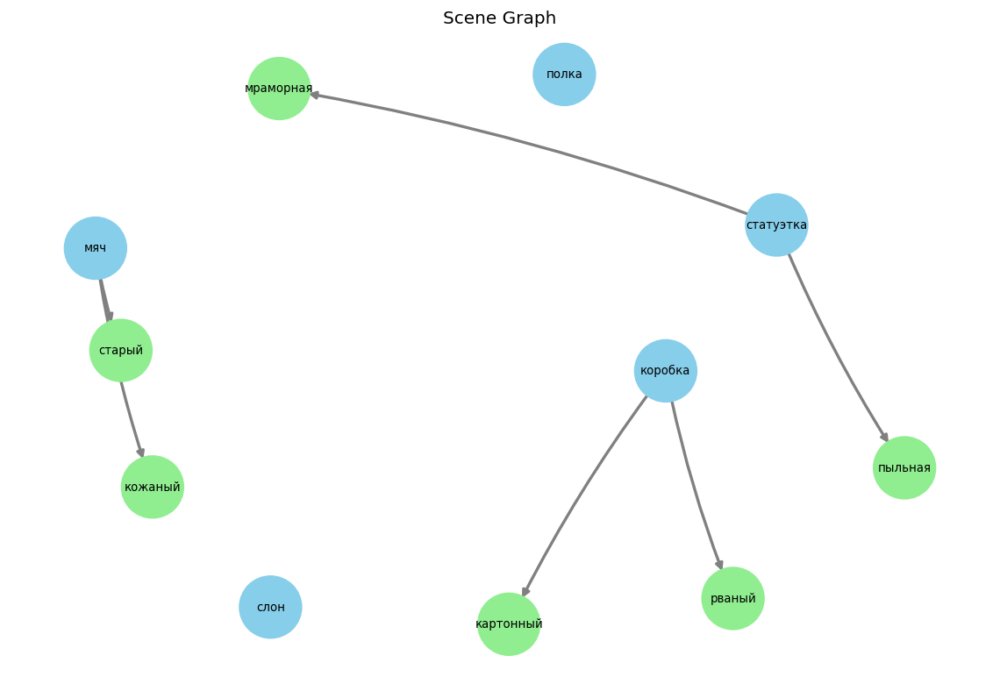


{"src_text": "На полу раскиданы игрушечные солдатики, некоторые из них без голов. Рядом стоит красочная кукла, чуть потрепанная и одинокая.", "norm_text": "На полу раскиданы игрушечные солдатики, некоторые из которых без голов. Рядом стоит красочная потрёпанная одинокая кукла.", "objects": ["пол", "солдатик", "голова", "кукла"], "attributes": {"солдатик": ["игрушечные"], "кукла": ["красочная", "одинокая", "потрёпанная"]}, "relations": []}



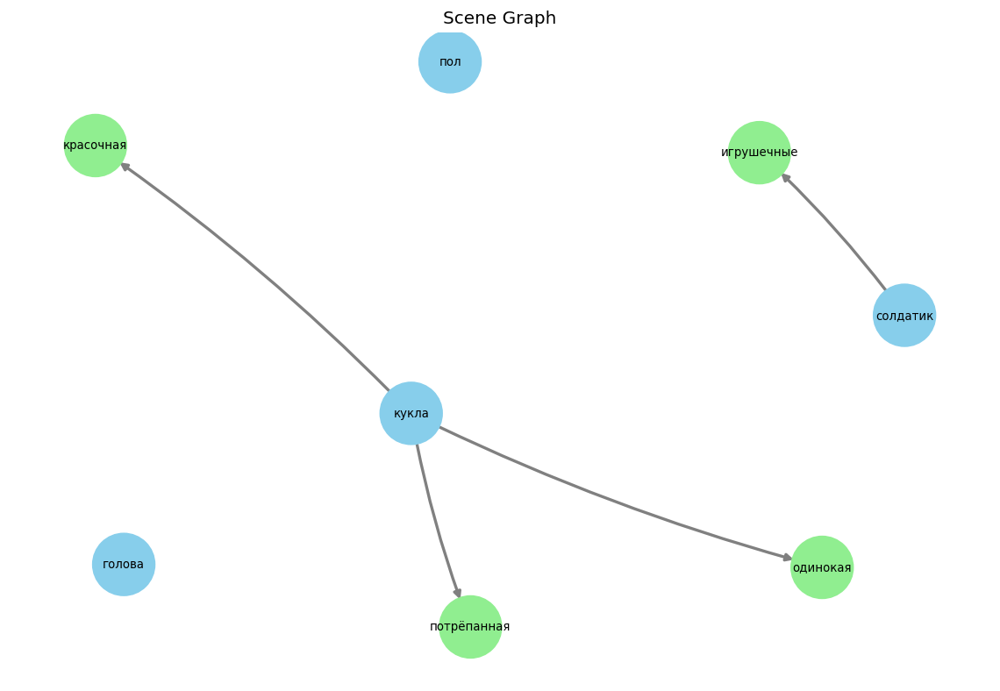


{"src_text": "На скатерти стоят три бокала: изящный прозрачный, высокий бронзовый и низкий с золотым ободком. Они образуют полукруг около белой тарелки.", "norm_text": "На скатерти стоят изящный прозрачный бокал 1, высокий бронзовый бокал 2 и низкий бокал 3 с золотым ободком. Бокалы 1, 2 и 3 образуют полукруг около белой тарелки.", "objects": ["скатерть", "бокал 1", "бокал 2", "бокал 3", "ободок", "полукруг", "тарелка"], "attributes": {"ободок": ["золотым"], "тарелка": ["белой"], "бокал 1": ["изящный", "прозрачный"], "бокал 2": ["бронзовый", "высокий"], "бокал 3": ["низкий"]}, "relations": [["бокал 1", "около", "тарелка"], ["бокал 1", "на", "скатерть"], ["бокал 2", "на", "скатерть"]]}



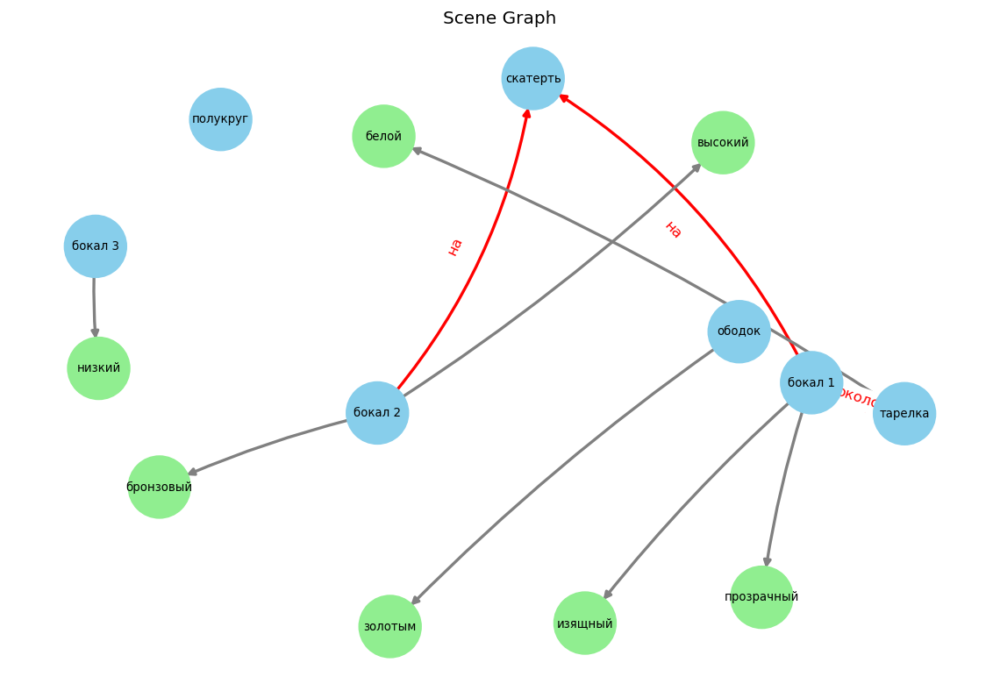


{"src_text": "На ящике стоит старинный граммофон с латунной трубой. Рядом стоит высокая статуэтка в виде белого кота и красная коробка с инструментами, частично открытая.", "norm_text": "На ящике стоит старинный граммофон с латунной трубой. Рядом стоит высокая статуэтка в виде белого кота и частично открытая красная коробка с инструментами.", "objects": ["ящик", "граммофон", "труба", "статуэтка", "вид", "кот", "коробка", "инструмент"], "attributes": {"граммофон": ["старинный"], "труба": ["латунной"], "статуэтка": ["высокая"], "кот": ["белого"], "коробка": ["красная", "частично открытая"]}, "relations": [["граммофон", "на", "ящик"]]}



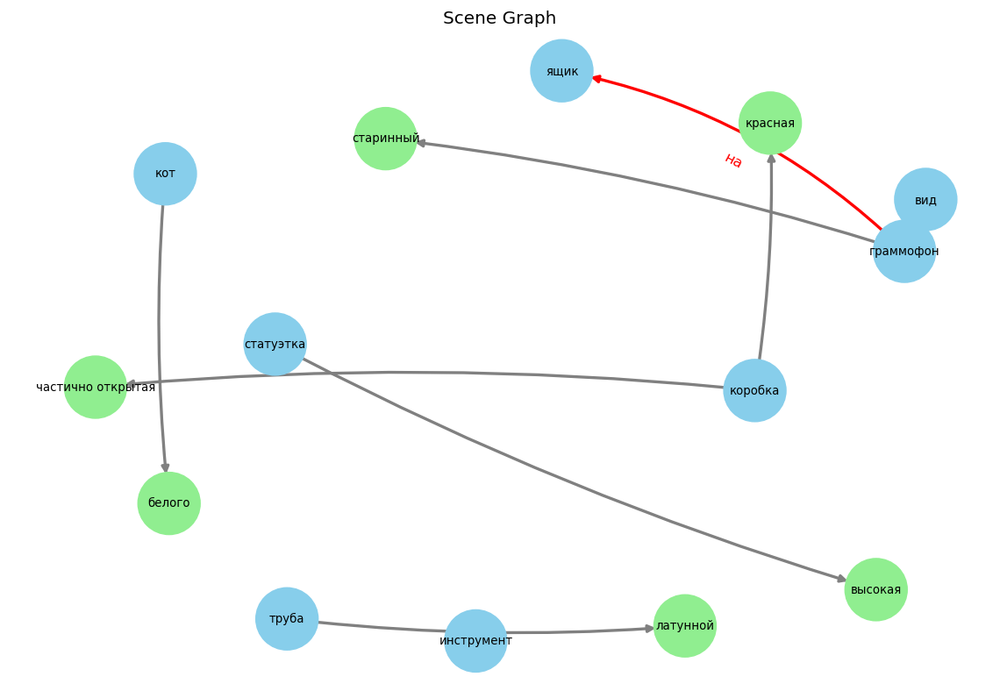


{"src_text": "На парте лежит тетрадь в клетку, немного помятая. Ручка без колпачка скатилась под парту.", "norm_text": "На парте лежит немного помятая тетрадь в клетку. Ручка без колпачка скатилась под парту.", "objects": ["парта", "тетрадь", "клетка", "ручка", "колпачок"], "attributes": {"тетрадь": ["немного помятая"]}, "relations": [["тетрадь", "на", "парта"], ["ручка", "под", "парта"]]}



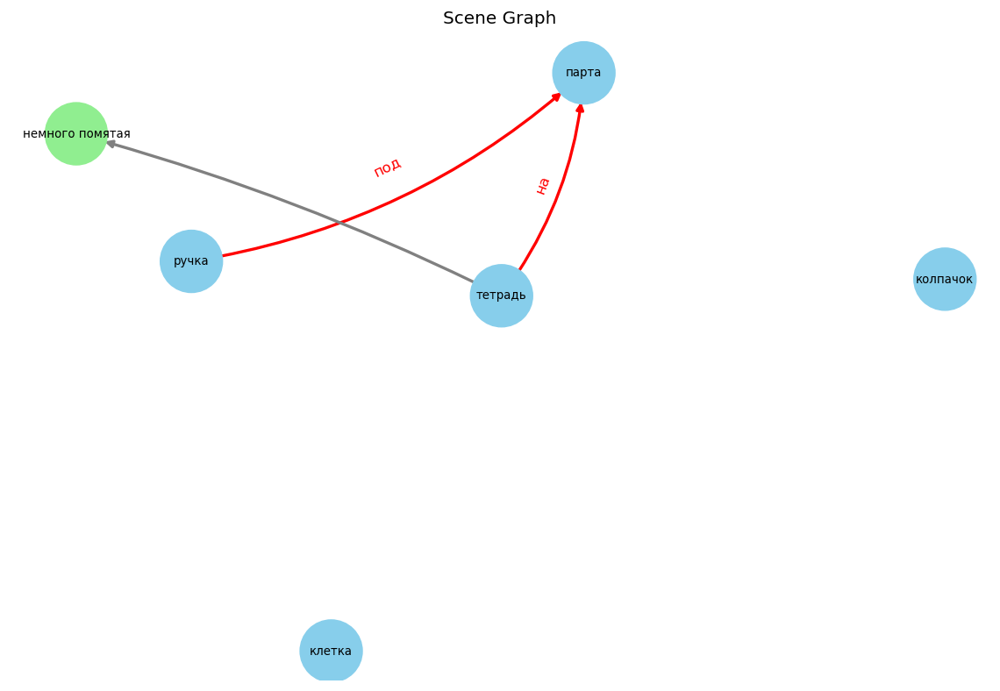


{"src_text": "На полке расположены два предмета: большой пластмассовый ящик и маленькая жестяная банка, обе с явными следами времени. Ящик покрыт слоем пыли, а банка местами помята.", "norm_text": "На полке расположены большой пластмассовый пыльный ящик с явными следами времени и маленькая жестяная помятая банка с явными следами времени.", "objects": ["полка", "ящик", "след", "время", "банк"], "attributes": {"ящик": ["большой", "пластмассовый", "пыльный", "расположены", "расположены с следами"], "след": ["явными"], "банк": ["жестяная", "маленькая", "помятая"]}, "relations": []}



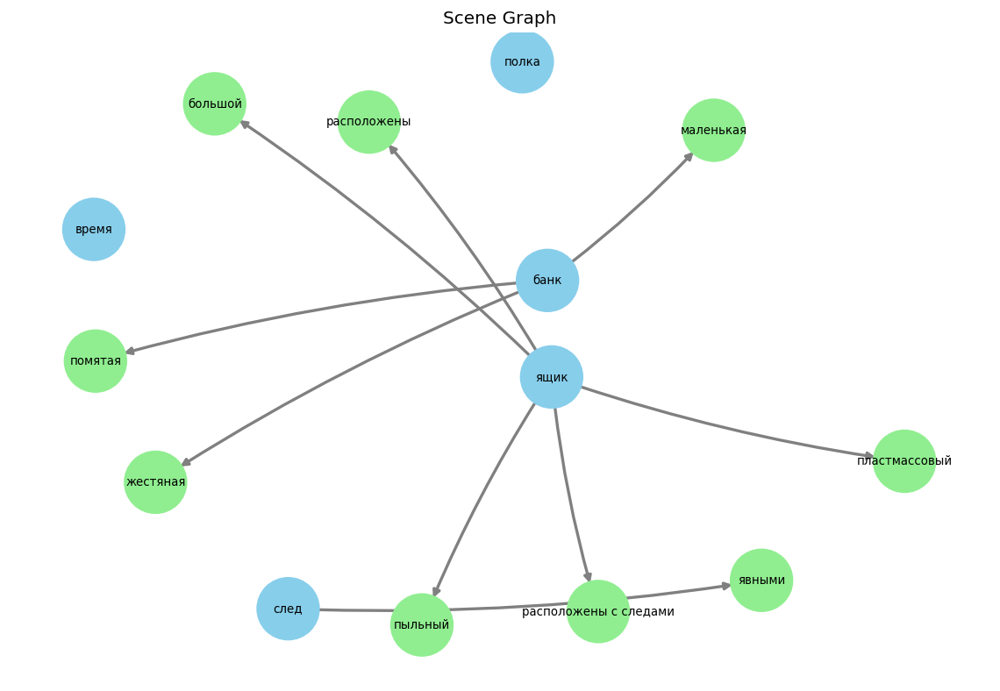


{"src_text": "На скамье лежит потертая карта с морскими отметками. Над ней висит старинный компас с едва заметными трещинами.", "norm_text": "На скамье лежит потертая карта с морскими отметками. Над картой висит старинный компас с едва заметными трещинами.", "objects": ["скамья", "карта", "отметка", "компас", "трещина"], "attributes": {"карта": ["потертая"], "отметка": ["морскими"], "компас": ["старинный"], "трещина": ["заметными"]}, "relations": [["карта", "на", "скамья"], ["компас", "над", "карта"]]}



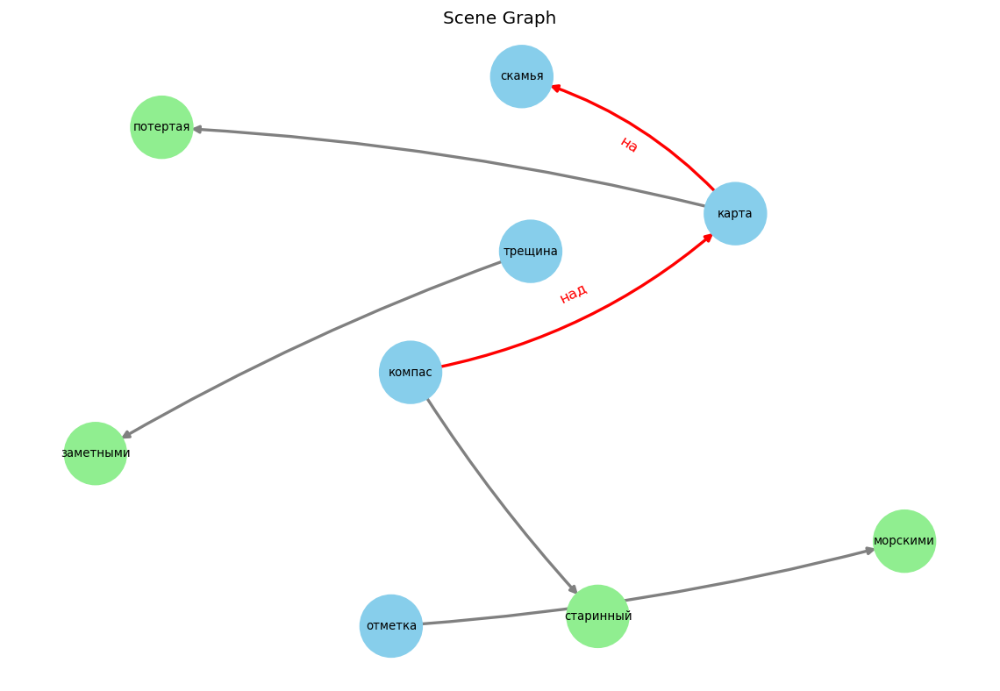


{"src_text": "На балконе расположились два предмета. Один из них — большой цветочный горшок из глины, а второй — металлический стул с изогнутыми ножками.", "norm_text": "На балконе расположились большой цветочный горшок из глины и металлический стул с изогнутыми ножками.", "objects": ["балкон", "горшок", "глина", "стул", "ножками"], "attributes": {"горшок": ["большой", "цветочный"], "стул": ["металлический"], "ножками": ["изогнутыми"]}, "relations": [["стул", "на", "балкон"], ["горшок", "на", "балкон"]]}



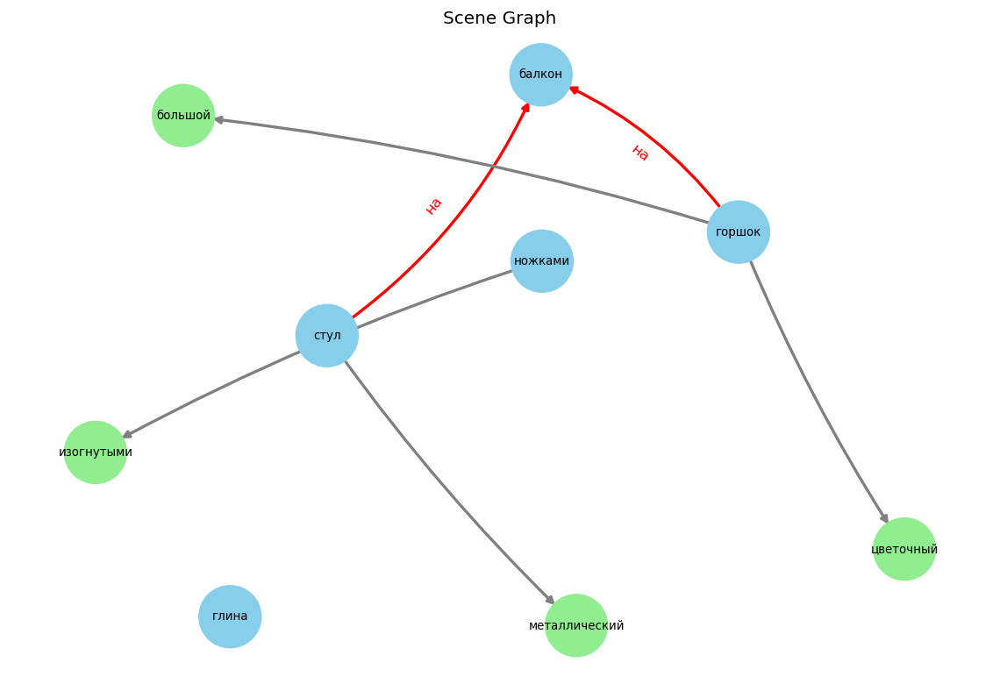


{"src_text": "На письменном столе стоит лампа с изогнутой ножкой; позади нее — пачка разноцветных карандашей. Лампа светит ярким теплым светом.", "norm_text": "На письменном столе стоит лампа с изогнутой ножкой, светящая ярким тёплым светом; позади лампы — пачка разноцветных карандашей.", "objects": ["стол", "лампа", "ножка", "свет", "пачка", "карандашей"], "attributes": {"стол": ["письменном"], "ножка": ["изогнутой"], "свет": ["тёплым", "ярким"], "карандашей": ["разноцветных"], "лампа": ["светящая светом"]}, "relations": [["пачка", "на", "стол"], ["лампа", "на", "стол"]]}



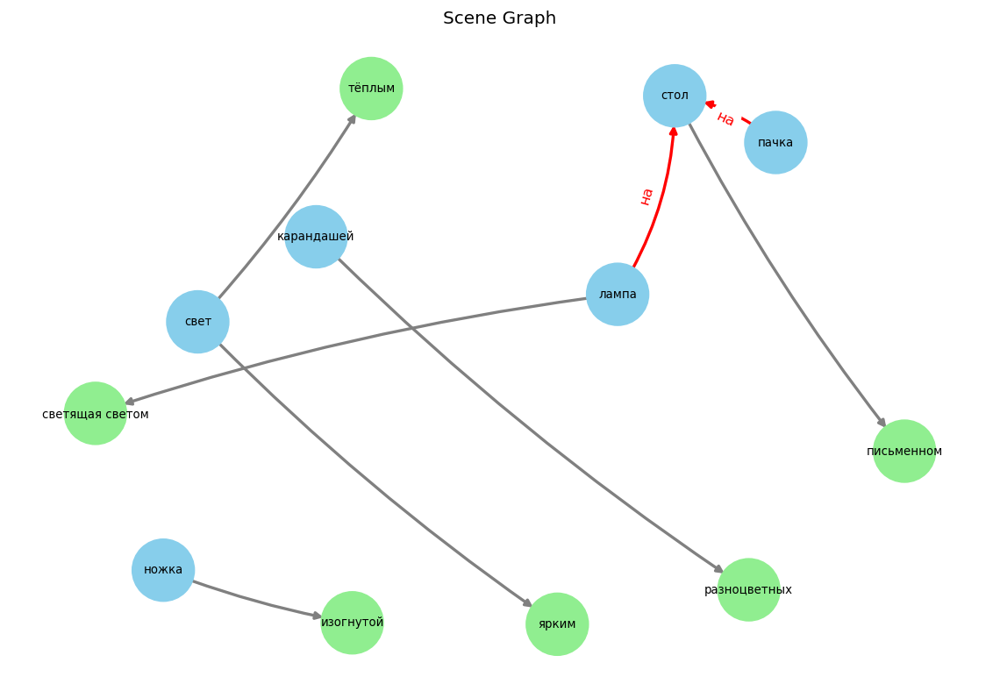


{"src_text": "На пляже лежит большая ракушка, гладкая и блестящая. Рядом с ней заметна белая звезда, оставляющая следы на песке.", "norm_text": "На пляже лежит большая гладкая блестящая ракушка. Рядом с ракушкой заметна белая звезда, оставляющая следы на песке.", "objects": ["пляж", "ракушка", "звезда", "след", "песок"], "attributes": {"ракушка": ["блестящая", "большая", "гладкая"], "звезда": ["белая", "оставляющая следы", "рядом заметна", "рядом заметна следы"]}, "relations": [["ракушка", "на", "пляж"]]}



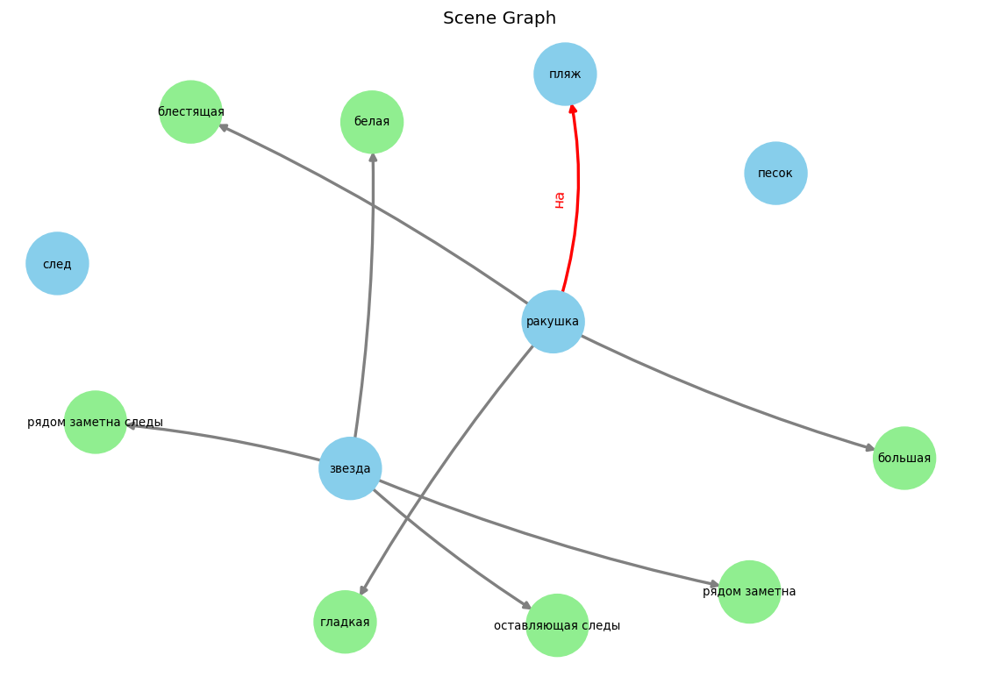


{"src_text": "На сцене стоит роскошное кресло с бархатной обивкой, справа от него небольшой столик. На столике лежит старая книга с кожаным переплётом.", "norm_text": "На сцене стоит роскошное кресло с бархатной обивкой, справа от кресла небольшой столик. На столике лежит старая книга с кожаным переплётом.", "objects": ["сцена", "кресло", "обивка", "столик", "книга", "переплёт"], "attributes": {"кресло": ["роскошное"], "обивка": ["бархатной"], "столик": ["небольшой"], "книга": ["старая"], "переплёт": ["кожаным"]}, "relations": [["книга", "на", "столик"], ["кресло", "на", "сцена"]]}



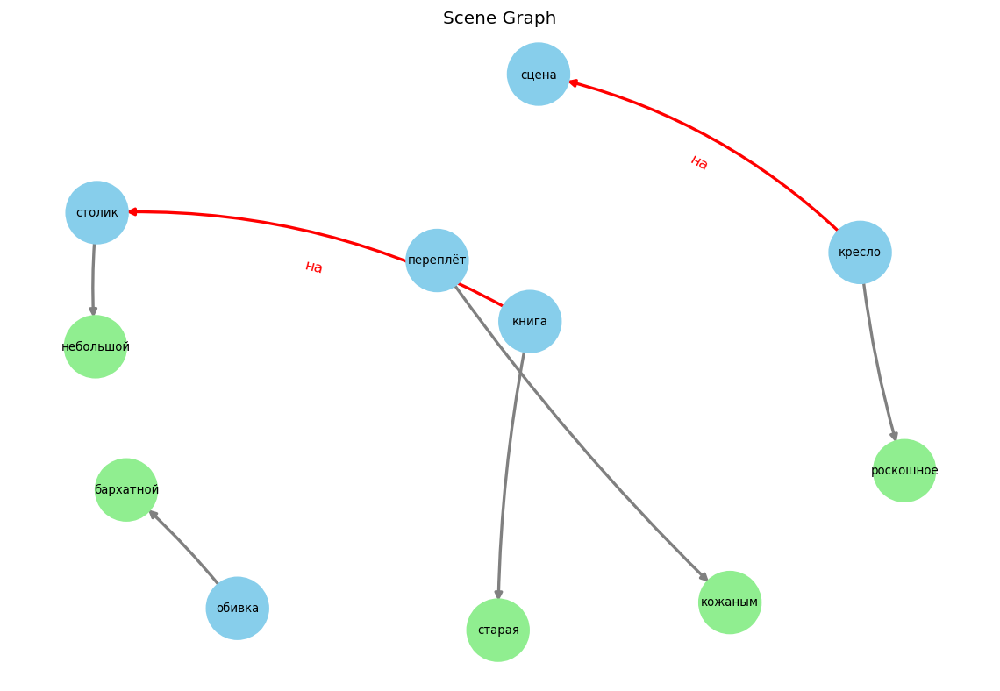


{"src_text": "На верстаке стоит зеленый ящик, закрытый и почти новый. Сверху на нем лежит свернутая пара перчаток.", "norm_text": "На верстаке стоит закрытый почти новый зеленый ящик. Сверху на ящике лежит свернутая пара перчаток.", "objects": ["верстак", "ящик", "пара", "перчатка"], "attributes": {"ящик": ["закрытый", "зеленый", "почти новый"], "пара": ["свернутая"]}, "relations": [["пара", "на", "ящик"], ["ящик", "на", "верстак"]]}



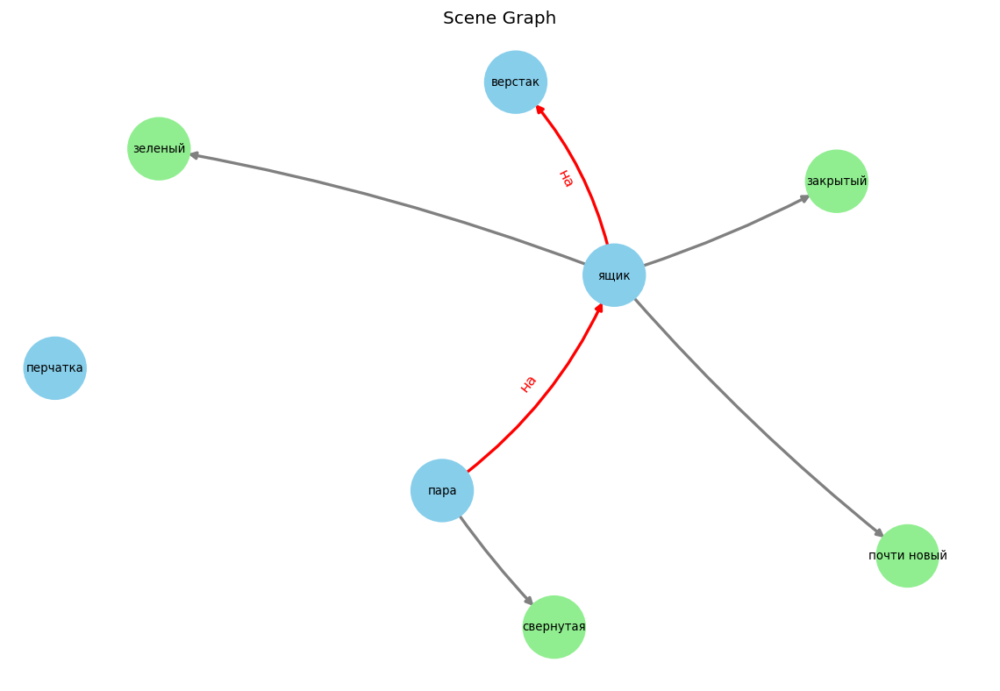


{"src_text": "На тумбе стоит монитор, а под ним сложены бумаги. Стетоскоп висит на крючке у двери, изогнутый и блестящий.", "norm_text": "На тумбе стоит монитор, а под монитором сложены бумаги. Изогнутый блестящий стетоскоп висит на крючке у двери.", "objects": ["тумба", "монитор", "бумага", "стетоскоп", "крючок", "дверь"], "attributes": {"стетоскоп": ["блестящий", "изогнутый"]}, "relations": [["стетоскоп", "у", "дверь"], ["монитор", "на", "тумба"], ["стетоскоп", "на", "крючок"]]}



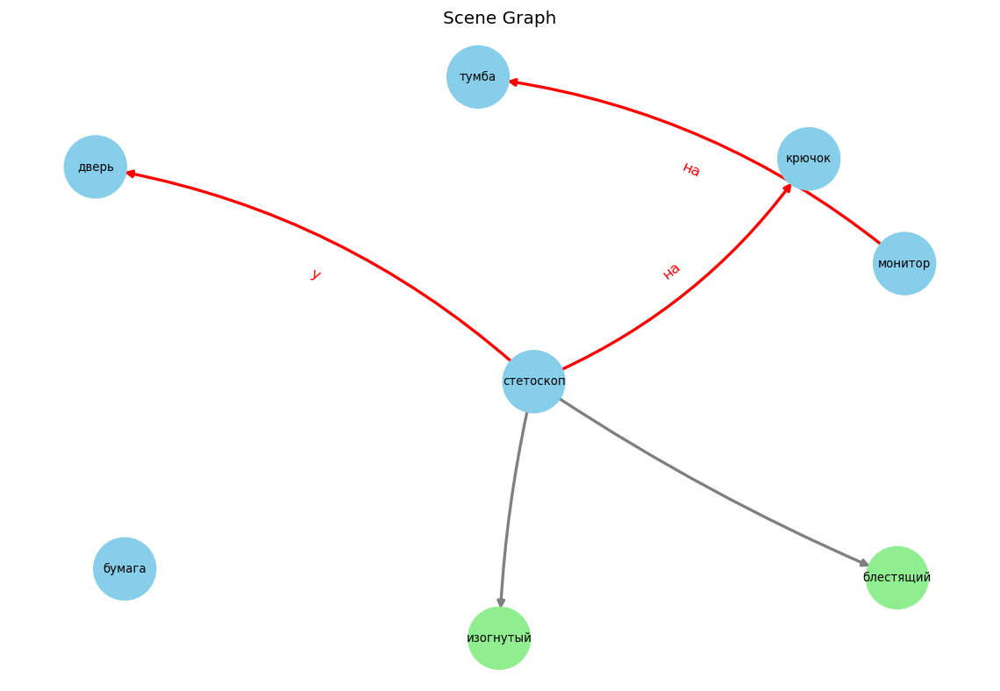


{"src_text": "На полке стоит медная кастрюля, немного потускневшая от времени. Рядом с ней лежат два молотка: один тяжелый, другой легкий.", "norm_text": "На полке стоит немного потускневшая от времени медная кастрюля. Рядом с кастрюлей лежат тяжелый молоток 1 и легкий молоток 2.", "objects": ["полка", "время", "кастрюля", "молоток 1", "молоток 2"], "attributes": {"кастрюля": ["медная", "немного потускневшая от времени"], "молоток 1": ["тяжелый"], "молоток 2": ["легкий"]}, "relations": [["молоток 1", "рядом с", "кастрюля"], ["молоток 2", "рядом с", "кастрюля"]]}



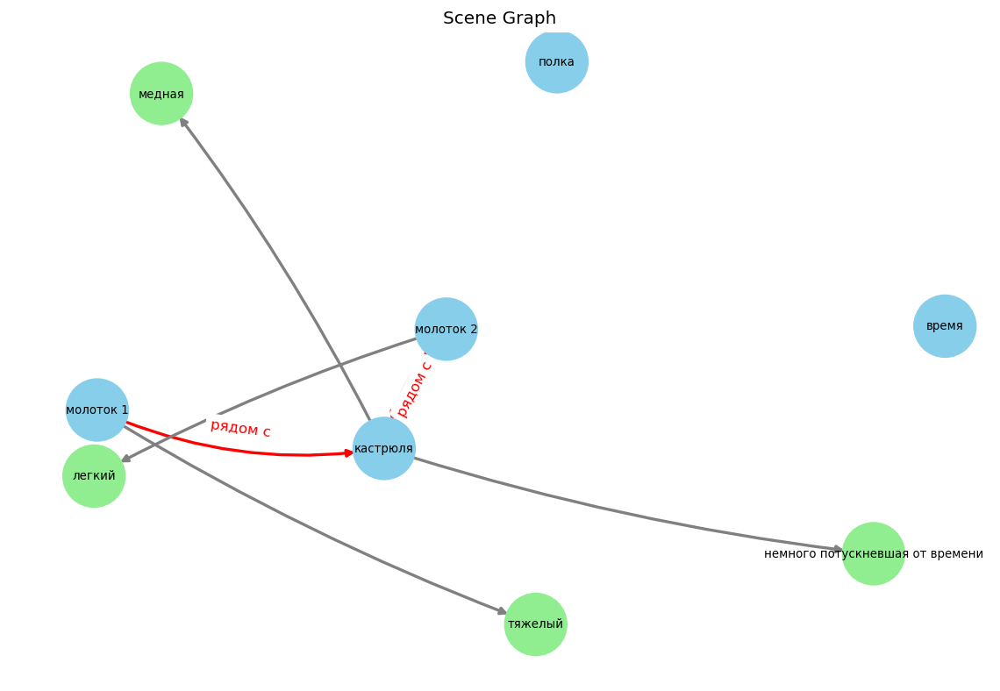


{"src_text": "На полу стоит зеркальный шкаф, открытый и вместительный. Рядом с ним - старый зонтик и большие кожаные сапоги.", "norm_text": "На полу стоит открытый вместительный зеркальный шкаф. Рядом с зеркальным шкафом — старый зонтик и большие кожаные сапоги.", "objects": ["пол", "шкаф", "зонтик", "сапог"], "attributes": {"шкаф": ["вместительный", "зеркальный", "зеркальным", "открытый"], "зонтик": ["старый"], "сапог": ["большие", "кожаные"]}, "relations": [["шкаф", "на", "пол"]]}



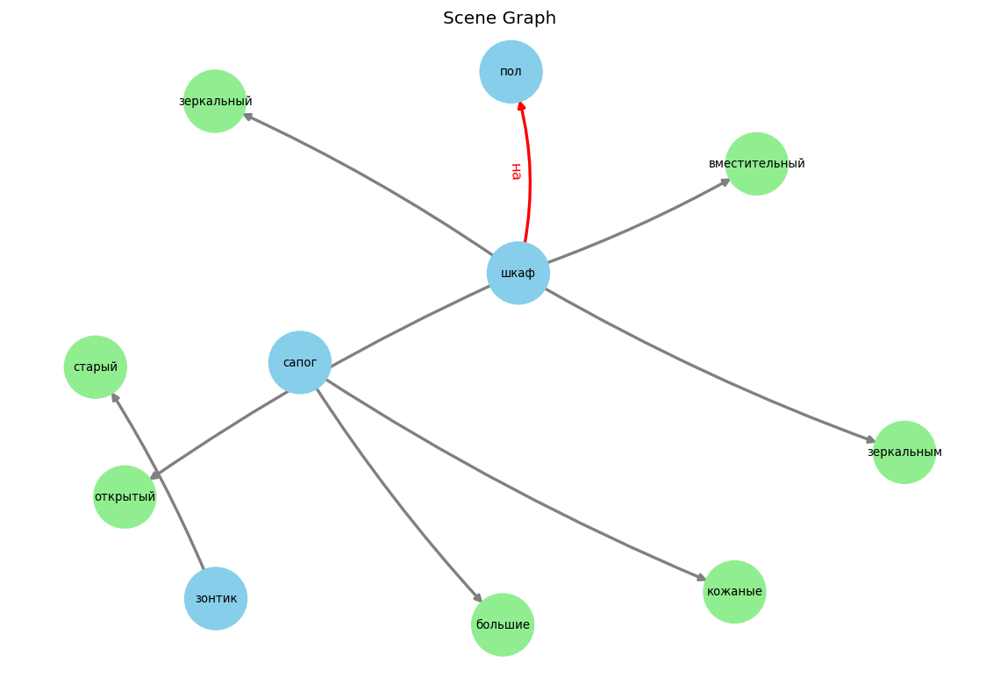


{"src_text": "На садовой дорожке расположились два глиняных горшка, один с яркими цветами, другой пустой. Между ними аккуратно сложена большая шляпа с широкими полями.", "norm_text": "На садовой дорожке расположились глиняный горшок 1 с яркими цветами и пустой глиняный горшок 2. Между горшком 1 и горшком 2 аккуратно сложена большая шляпа с широкими полями.", "objects": ["дорожка", "горшок 1", "цвет", "горшок 2", "шляпа", "поле"], "attributes": {"дорожка": ["садовой"], "цвет": ["яркими"], "шляпа": ["большая"], "поле": ["широкими"], "горшок 1": ["глиняный"], "горшок 2": ["глиняный", "пустой"]}, "relations": [["горшок 2", "на", "дорожка"], ["горшок 1", "на", "дорожка"]]}



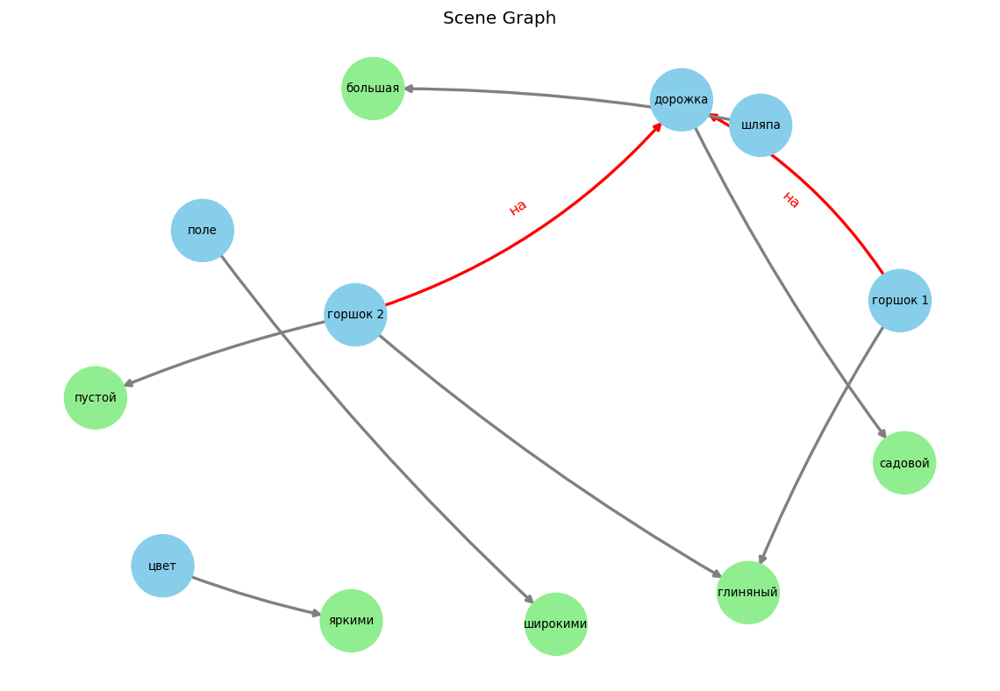


{"src_text": "На берегу раскидано три ракушки: одна большая и гладкая, вторая средняя и с трещинами, а третья изящная и розовая. Все они расположены полукругом около волн.", "norm_text": "На берегу раскиданы большая гладкая ракушка 1, средняя ракушка 2 с трещинами и изящная розовая ракушка 3. Все ракушки расположены полукругом около волн.", "objects": ["берег", "ракушка 1", "ракушка 2", "трещина", "ракушка 3", "ракушка", "полукруг", "волна"], "attributes": {"ракушка": ["большая", "гладкая", "изящная", "расположены", "розовая", "средняя"], "ракушка 1": ["большая", "гладкая"], "ракушка 2": ["средняя"], "ракушка 3": ["изящная", "розовая"], "полукруг": ["расположены"]}, "relations": []}



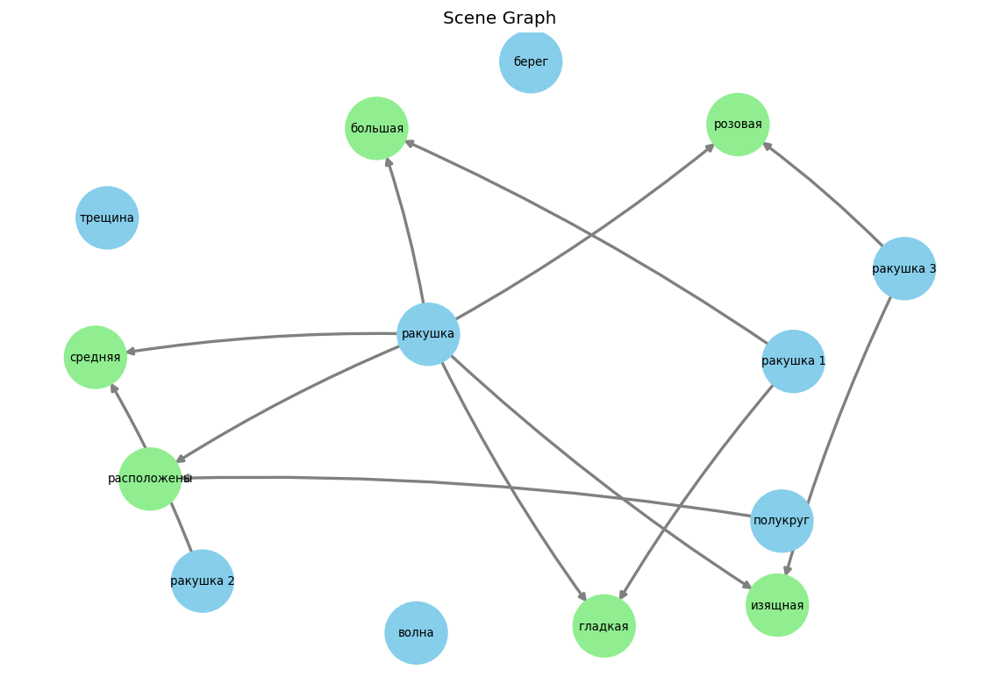


{"src_text": "На балконе стоит зелёное кресло, слегка облезшее от времени. Рядом с ним в углу старый зонтик, бледно-сиреневый и раскрывшейся, а на парапете — маленький горшок с ломкими цветами.", "norm_text": "На балконе стоит зелёное слегка облезшее от времени кресло. Рядом с креслом в углу находится старый бледно-сиреневый раскрытый зонтик, а на парапете — маленький горшок с ломкими цветами.", "objects": ["балкон", "время", "кресло", "креслом", "угол", "зонтик", "парапет", "горшок", "цвет"], "attributes": {"кресло": ["зелёное", "слегка облезшее от времени"], "зонтик": ["-", "бледно", "раскрытый", "сиреневый", "старый"], "горшок": ["маленький"], "цвет": ["ломкими"]}, "relations": [["зонтик", "рядом с", "креслом"], ["горшок", "рядом с", "креслом"], ["кресло", "на", "балкон"], ["горшок", "в", "угол"], ["зонтик", "в", "угол"]]}



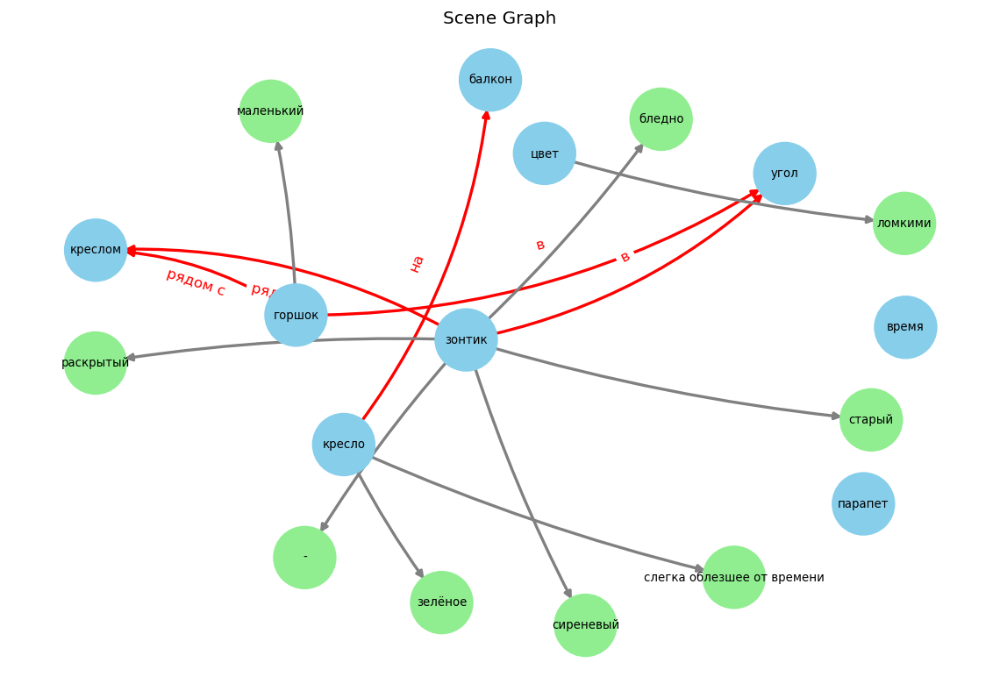


{"src_text": "На верстаке остались гаечные ключи, один большой и потемневший, другой маленький. У стены прислонен старый зонтик.", "norm_text": "На верстаке остались большой потемневший гаечный ключ 1 и маленький гаечный ключ 2. У стены прислонен старый зонтик.", "objects": ["верстак", "ключ 1", "ключ 2", "стена", "зонтик"], "attributes": {"зонтик": ["старый"], "ключ 1": ["большой", "гаечный"], "ключ 2": ["гаечный", "маленький"]}, "relations": [["ключ 1", "на", "верстак"], ["ключ 2", "на", "верстак"]]}



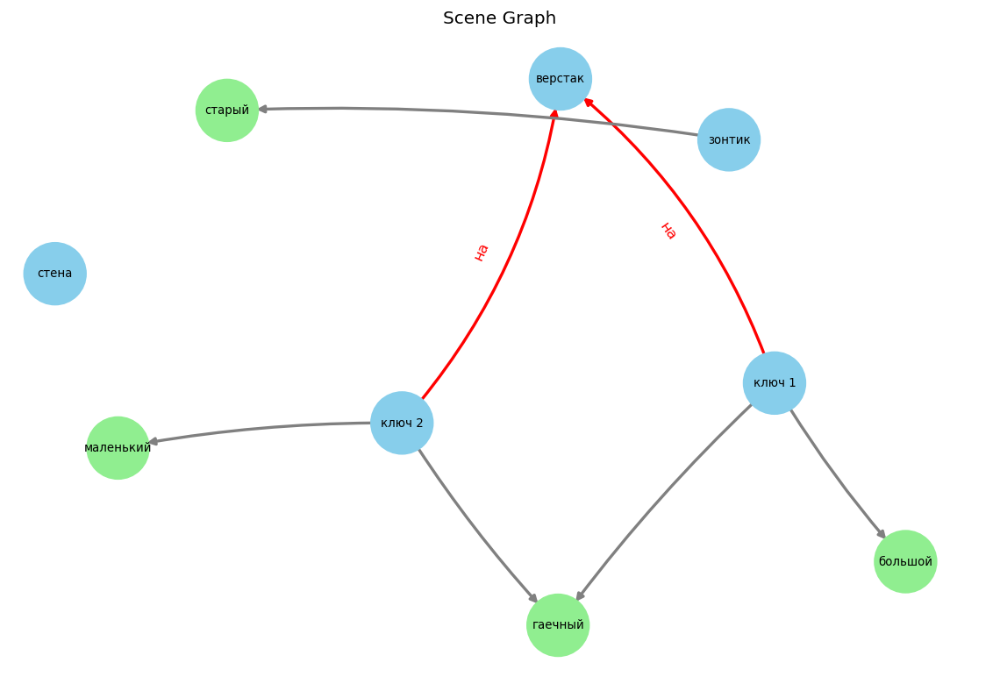


{"src_text": "На раковине стоит зелёный тюбик зубной пасты. Рядом с ним лежит голубое мыло. На полу около двери скатан белый коврик.", "norm_text": "На раковине стоит зелёный тюбик зубной пасты. Рядом с тюбиком зубной пасты лежит голубое мыло. На полу около двери скатан белый коврик.", "objects": ["раковина", "тюбик", "паста", "мыло", "пол", "дверь", "коврик"], "attributes": {"тюбик": ["зелёный"], "паста": ["зубной"], "мыло": ["голубое"], "коврик": ["белый"]}, "relations": [["мыло", "рядом с", "тюбик"], ["тюбик", "на", "раковина"]]}



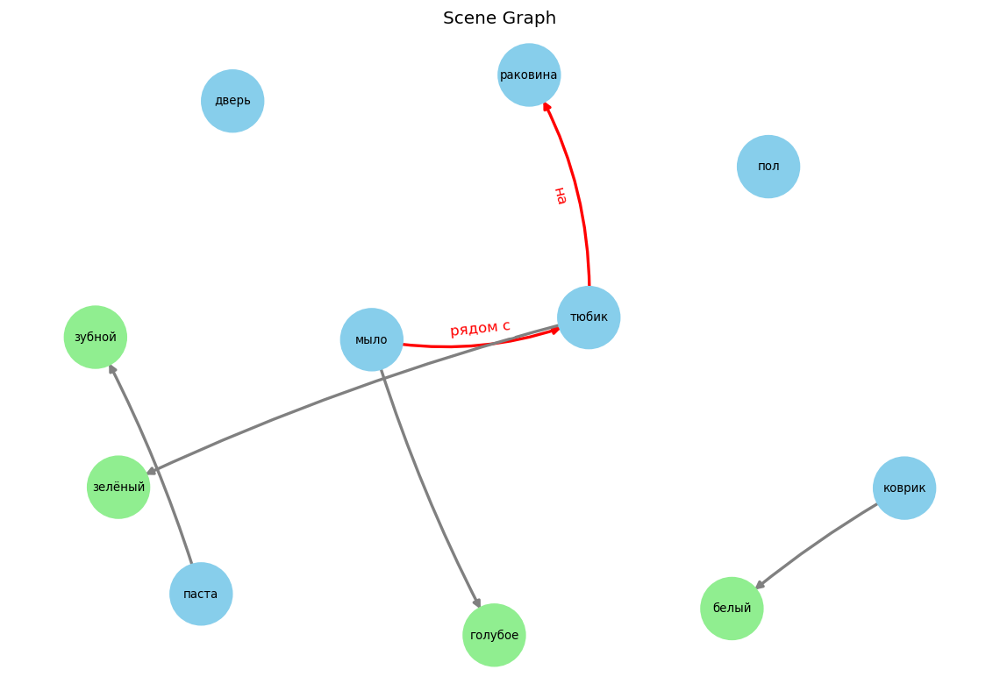


{"src_text": "На верстаке лежит молоток со сломанной ручкой. Рядом пылится старый железный гвоздодер.", "norm_text": "На верстаке лежит молоток со сломанной ручкой. Рядом пылится старый железный гвоздодер.", "objects": ["верстак", "молоток", "ручка", "гвоздодёр"], "attributes": {"ручка": ["сломанной"], "гвоздодёр": ["железный", "старый"]}, "relations": [["молоток", "на", "верстак"]]}



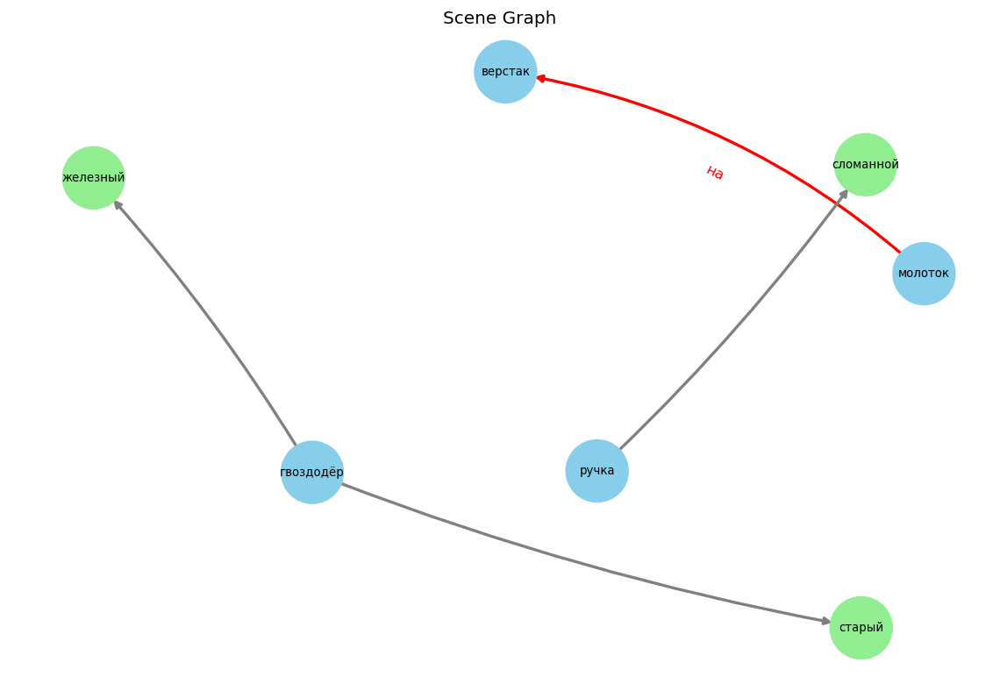


{"src_text": "На рабочем столе стоит изящная керамическая фигурка, выполненная в пастельных тонах. Она выглядит как новая и очень стильная.", "norm_text": "На рабочем столе стоит изящная новая стильная керамическая фигурка, выполненная в пастельных тонах.", "objects": ["стол", "фигурка", "тон"], "attributes": {"стол": ["рабочем"], "фигурка": ["выполненная в тонах", "изящная", "керамическая", "новая", "стильная"], "тон": ["пастельных"]}, "relations": [["фигурка", "на", "стол"]]}



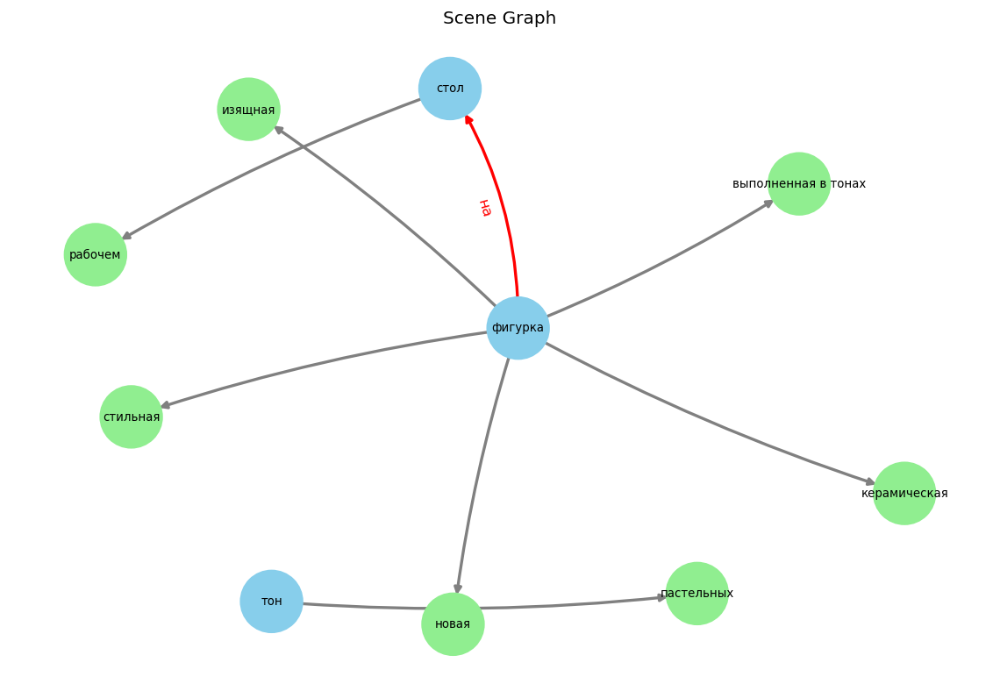


{"src_text": "На балконе стоит цветочный горшок с высоким растением, слегка засохшим. Рядом с ним — пластиковый стул, немного изношенный.", "norm_text": "На балконе стоит цветочный горшок с высоким слегка засохшим растением. Рядом с цветочным горшком — немного изношенный пластиковый стул.", "objects": ["балкон", "горшок", "растение", "стул"], "attributes": {"горшок": ["цветочный", "цветочным"], "растение": ["высоким", "слегка засохшим"], "стул": ["немного изношенный", "пластиковый"]}, "relations": [["горшок", "на", "балкон"]]}



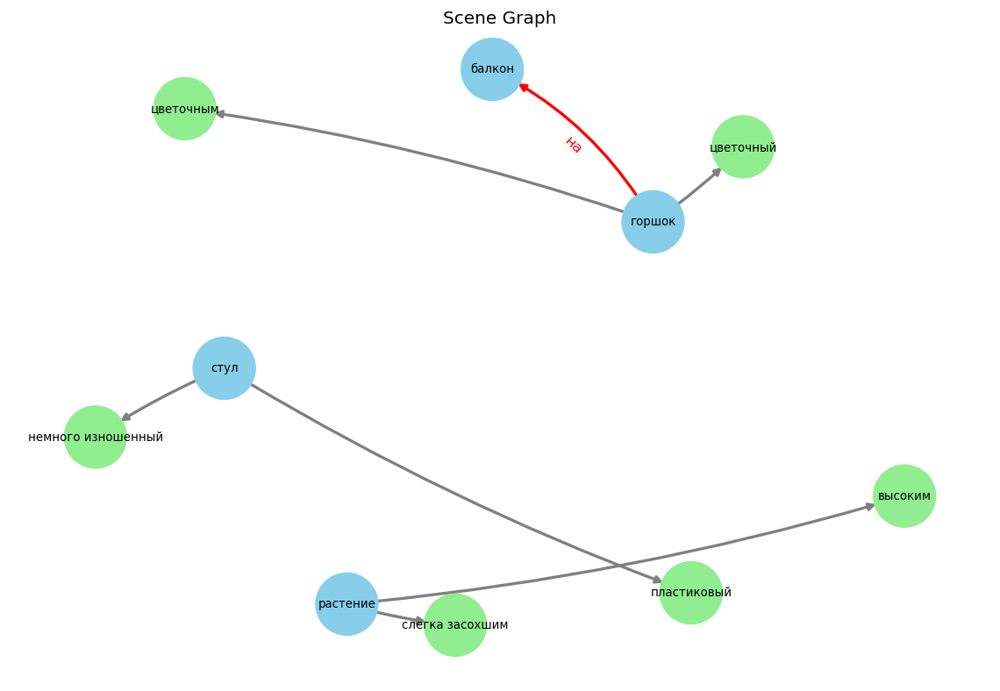


{"src_text": "На полу лежит большой картонный ящик с инструментами. Рядом стоит красочный железный фонарь.", "norm_text": "На полу лежит большой картонный ящик с инструментами. Рядом стоит красочный железный фонарь.", "objects": ["пол", "ящик", "инструмент", "фонарь"], "attributes": {"ящик": ["большой", "картонный"], "фонарь": ["железный", "красочный"]}, "relations": [["ящик", "на", "пол"]]}



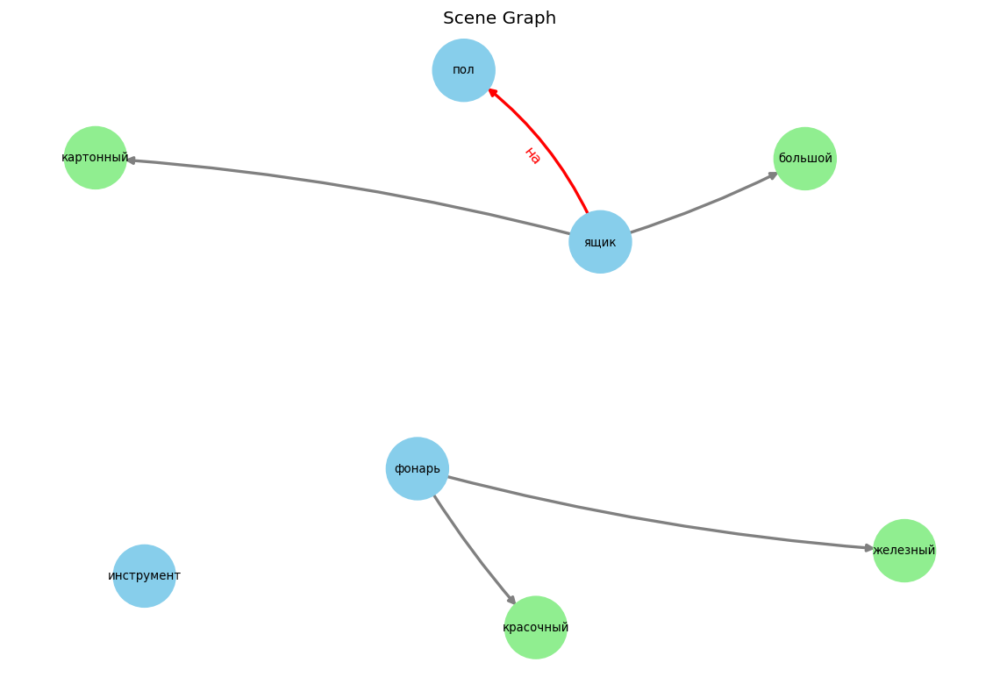


{"src_text": "На металлической полке стоит большой серый ящик с инструментами. Рядом — коробка с книгами и старым радио.", "norm_text": "На металлической полке стоит большой серый ящик с инструментами. Рядом с ящиком находится коробка с книгами и старым радио.", "objects": ["полка", "ящик", "инструмент", "коробка", "книга", "радио"], "attributes": {"ящик": ["большой", "серый"], "радио": ["старым"]}, "relations": [["коробка", "рядом с", "ящик"]]}



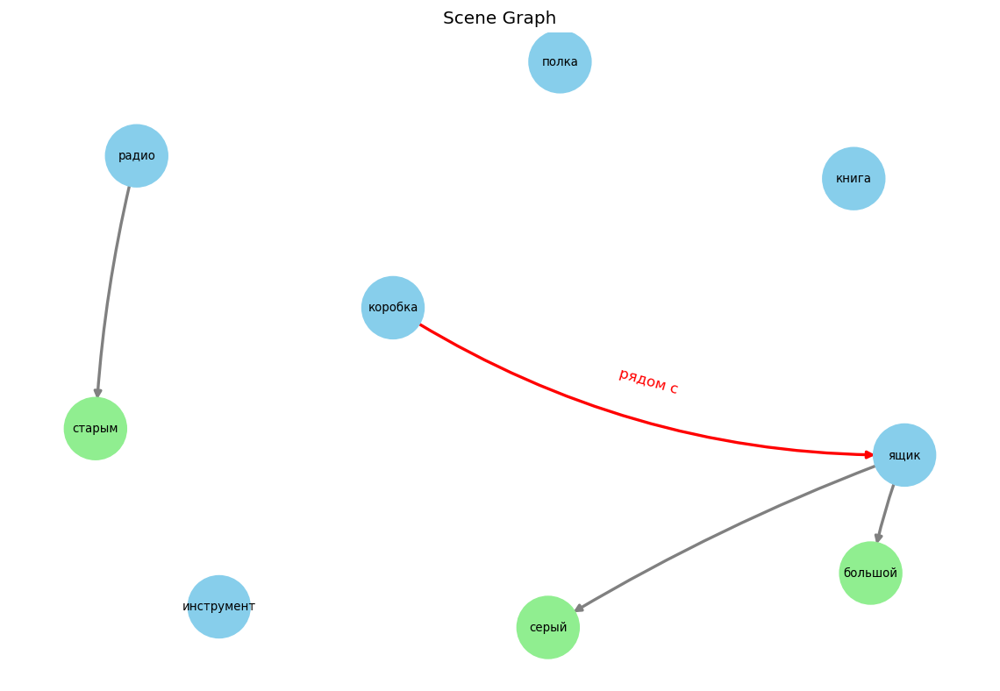


{"src_text": "На полке стоит солдатик из олова, потертый и без одного уха. Рядом с ним — старый компас, стрелка которого застряла на северо-западе. У стены прислонена гитара, струны которой немного ослабли.", "norm_text": "На полке стоит потертый солдатик из олова без одного уха. Рядом с солдатиком находится старый компас, стрелка которого застряла на северо-западе. У стены прислонена гитара с немного ослабленными струнами.", "objects": ["полка", "солдатик", "олова", "ухо", "компас", "стрелка", "северо", "-", "запад", "стена", "гитара", "струна"], "attributes": {"солдатик": ["потертый"], "компас": ["старый"], "струна": ["немного ослабленными"]}, "relations": [["компас", "рядом с", "солдатик"]]}



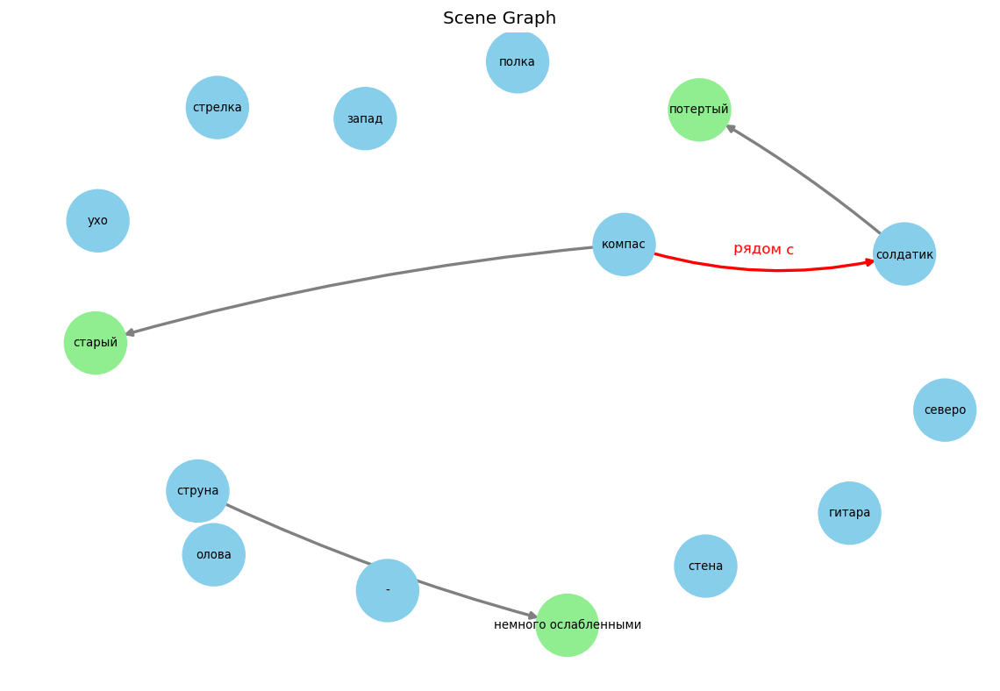


{"src_text": "На шкафу стоит старинный глобус с выцветшими материками. В углу блестит медный подсвечник. Под окном покоится плед, украшенный цветастым рисунком. Рядом на полу сидит тряпичная кукла в полосатом платье.", "norm_text": "На шкафу стоит старинный глобус с выцветшими материками. В углу блестит медный подсвечник. Под окном покоится плед с цветастым рисунком. Рядом на полу сидит тряпичная кукла в полосатом платье.", "objects": ["шкаф", "глобус", "материками", "угол", "подсвечник", "окно", "плед", "рисунок", "пол", "кукла", "платье"], "attributes": {"глобус": ["старинный"], "подсвечник": ["медный"], "рисунок": ["цветастым"], "кукла": ["тряпичная"], "платье": ["полосатом"]}, "relations": [["кукла", "на", "пол"], ["подсвечник", "в", "угол"], ["глобус", "на", "шкаф"], ["плед", "под", "окно"]]}



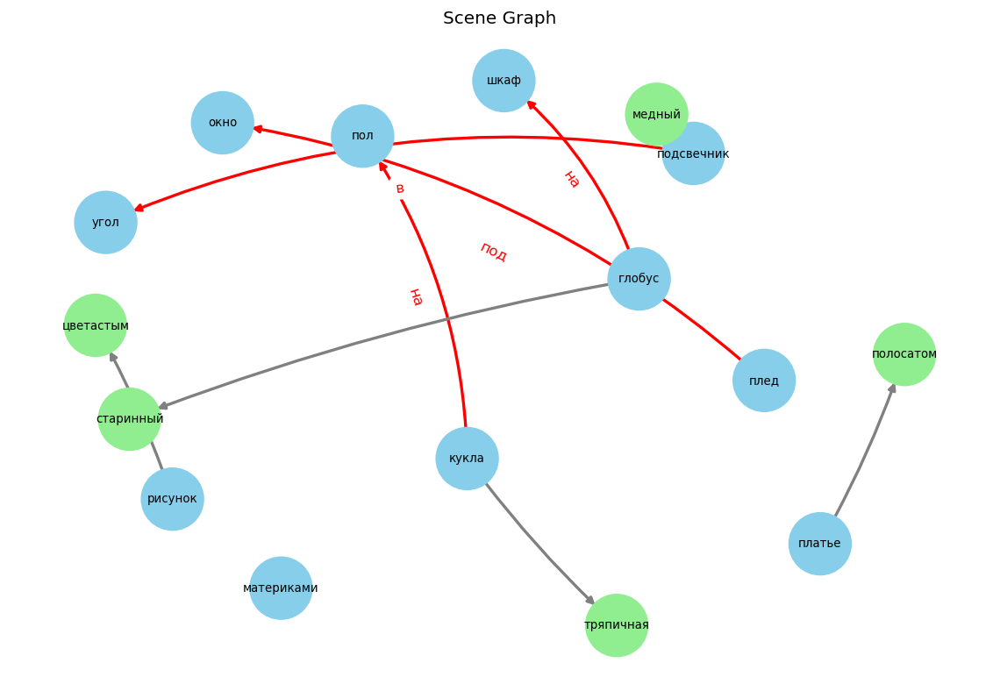


{"src_text": "На деревянной полке стоит глиняный кувшин, весь покрытый трещинами. Рядом с ним — фарфоровая чашка, изящно расписанная цветочными узорами.", "norm_text": "На деревянной полке стоит глиняный кувшин, весь покрытый трещинами. Рядом с кувшином — изящно расписанная цветочными узорами фарфоровая чашка.", "objects": ["полка", "кувшин", "трещинами", "узор", "чашка"], "attributes": {"кувшин": ["глиняный"], "узор": ["цветочными"], "чашка": ["изящно расписанная узорами", "фарфоровая"]}, "relations": []}



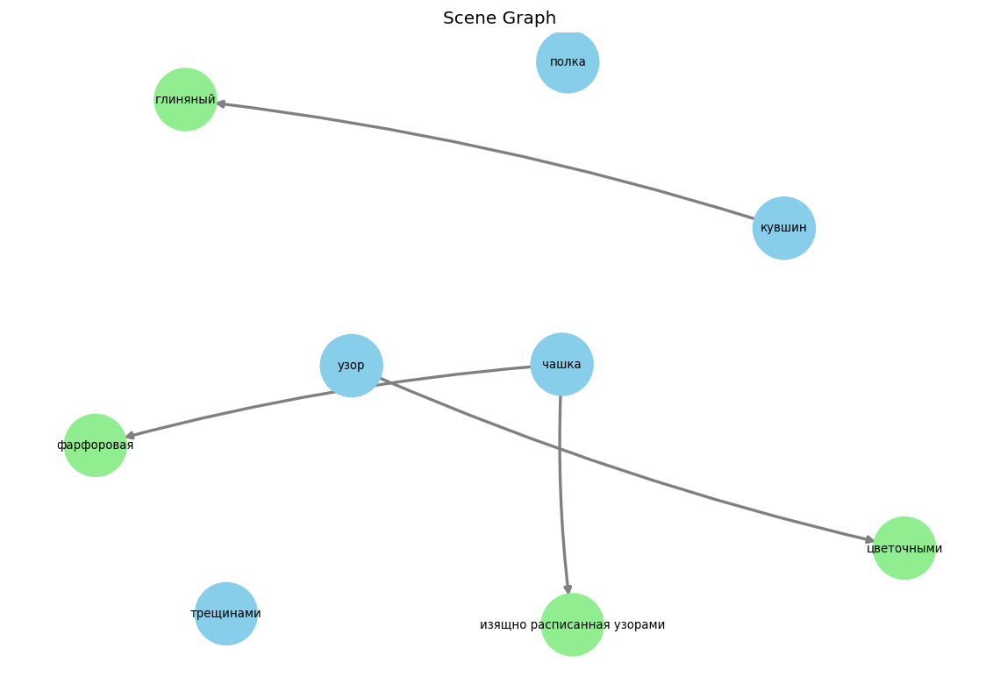


{"src_text": "Под деревом стоит садовая скамейка, поблёкшая от времени. На ней лежит забытая кем-то кепка.", "norm_text": "Под деревом стоит поблёкшая от времени садовая скамейка. На садовой скамейке лежит забытая кем-то кепка.", "objects": ["дерево", "время", "скамейка", "кепка"], "attributes": {"скамейка": ["поблёкшая от времени", "садовая", "садовой"], "кепка": ["забытая то"]}, "relations": [["скамейка", "под", "дерево"], ["кепка", "на", "скамейка"]]}



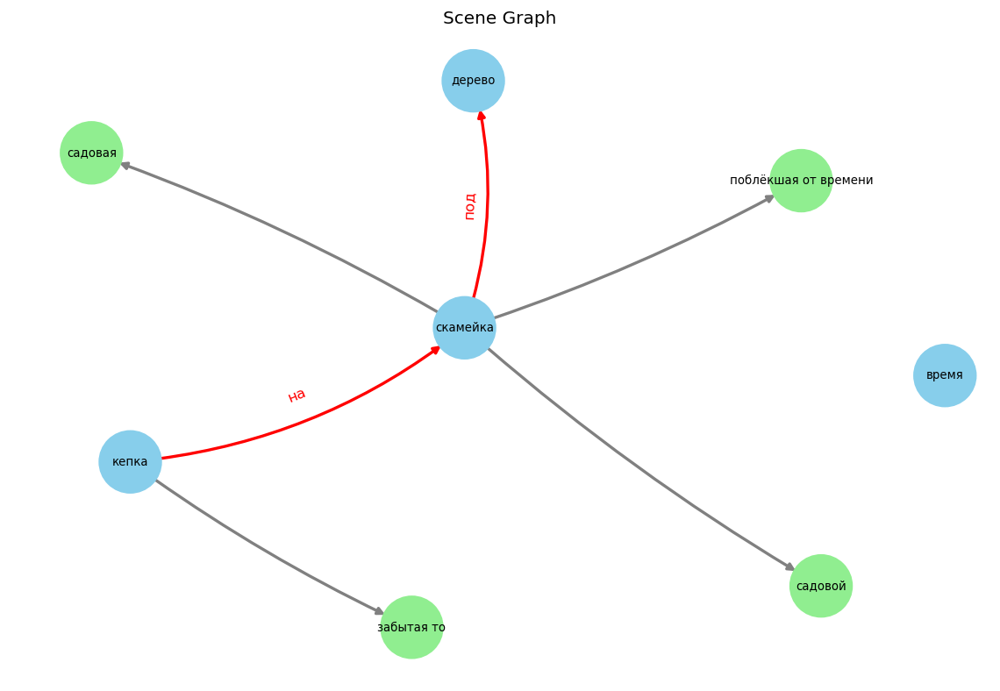


{"src_text": "На прикроватной тумбе стоит лампа в форме совы, немного поцарапанная, но все еще работающая. На соседнем стуле лежит стопка журналов в мятой обложке.", "norm_text": "На прикроватной тумбе стоит немного поцарапанная, но все еще работающая лампа в форме совы. На соседнем стуле лежит стопка журналов в мятой обложке.", "objects": ["тумба", "лампа", "форма", "сова", "стул", "стопка", "журнал", "обложка"], "attributes": {"тумба": ["прикроватной"], "стул": ["соседнем"], "обложка": ["мятой"], "лампа": ["еще работающая"]}, "relations": [["стопка", "на", "стул"]]}



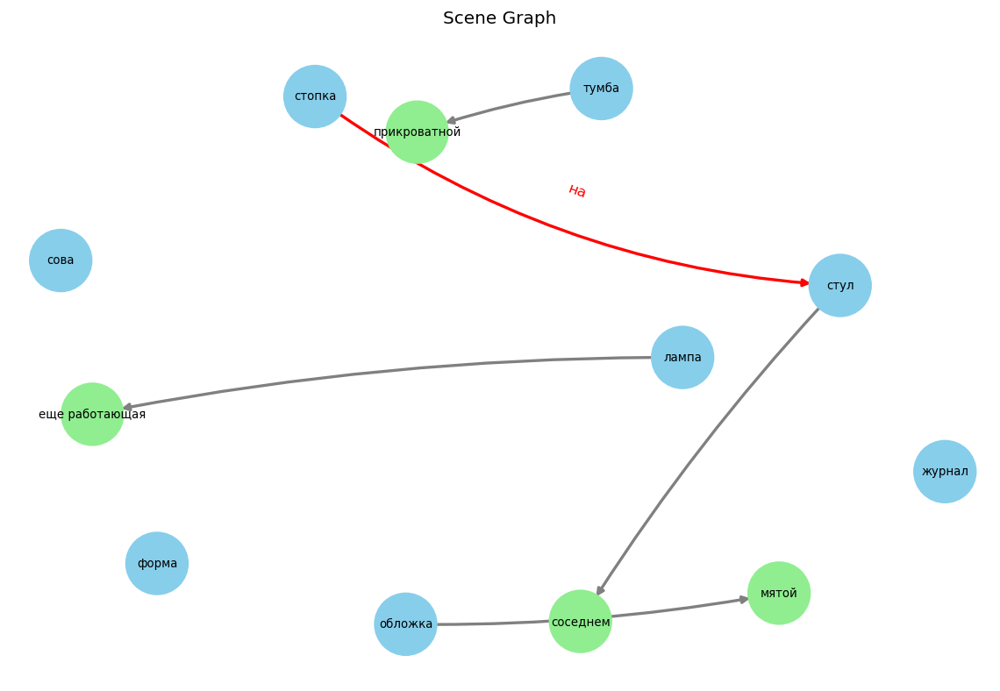


{"src_text": "На полке стоит настольная лампа и старое фото в рамке. Рядом с ними расставлены три недорогих керамических сувенира.", "norm_text": "На полке стоит настольная лампа, старое фото в рамке и три недорогих керамических сувенира: сувенир 1, сувенир 2 и сувенир 3.", "objects": ["полка", "лампа", "фото", "рамка", "сувенир", "сувенир 1", "сувенир 2", "сувенир 3"], "attributes": {"лампа": ["настольная"], "фото": ["старое"], "сувенир": ["керамических", "недорогих"]}, "relations": []}



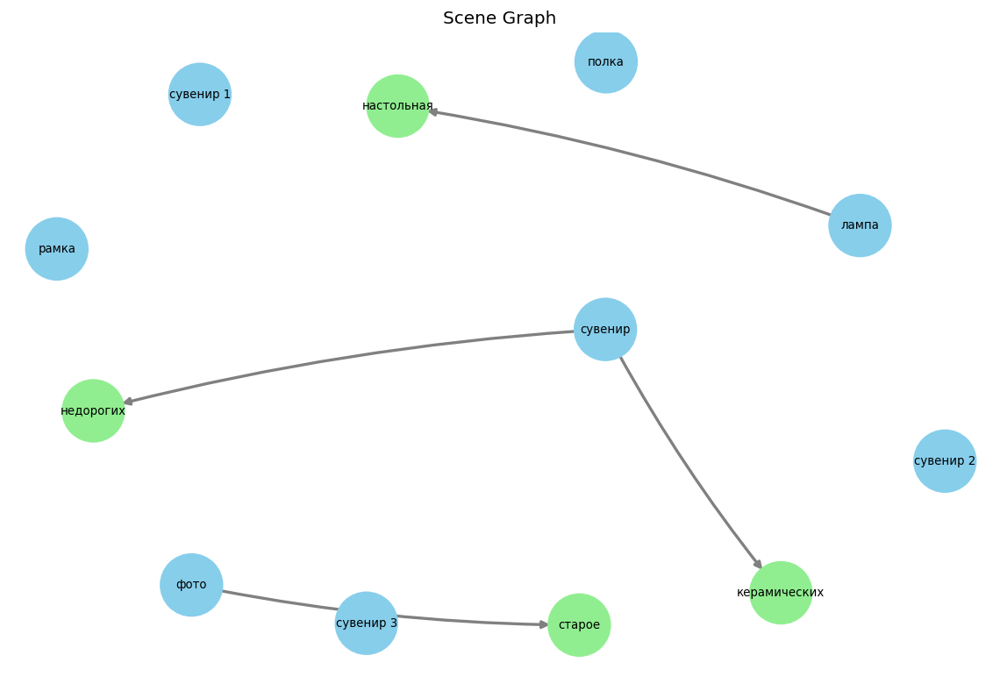


{"src_text": "На полу стоит дорожная сумка: коричневая, большая и потрепанная, с разорвавшейся боковой ручкой. Она расположена у стойки регистрации.", "norm_text": "На полу стоит коричневая большая потрёпанная дорожная сумка с разорвавшейся боковой ручкой. Дорожная сумка расположена у стойки регистрации.", "objects": ["пол", "сумка", "ручка", "стойка", "регистрация"], "attributes": {"сумка": ["большая", "дорожная", "коричневая", "потрёпанная", "расположена"], "ручка": ["боковой", "разорвавшейся"]}, "relations": [["сумка", "на", "пол"]]}



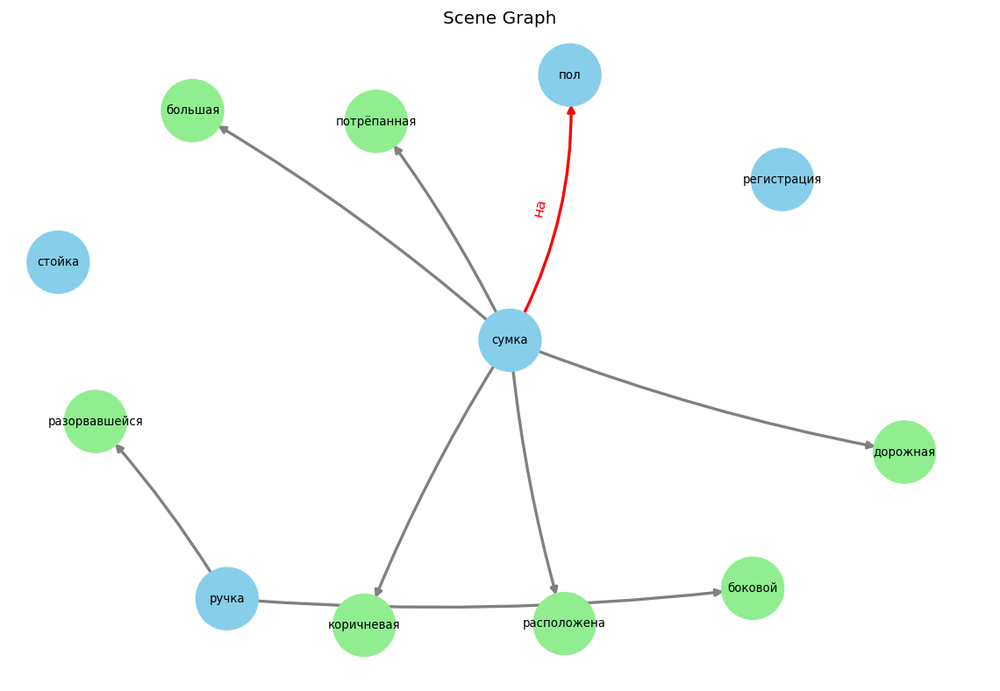


{"src_text": "На полке лежит серый гаечный ключ в хорошем состоянии. Рядом стоит пластиковый канистру, слегка помятая.", "norm_text": "На полке лежит серый гаечный ключ в хорошем состоянии. Рядом стоит слегка помятая пластиковая канистра.", "objects": ["полка", "ключ", "состояние", "канистра"], "attributes": {"ключ": ["гаечный", "серый"], "состояние": ["хорошем"], "канистра": ["пластиковая", "слегка помятая"]}, "relations": []}



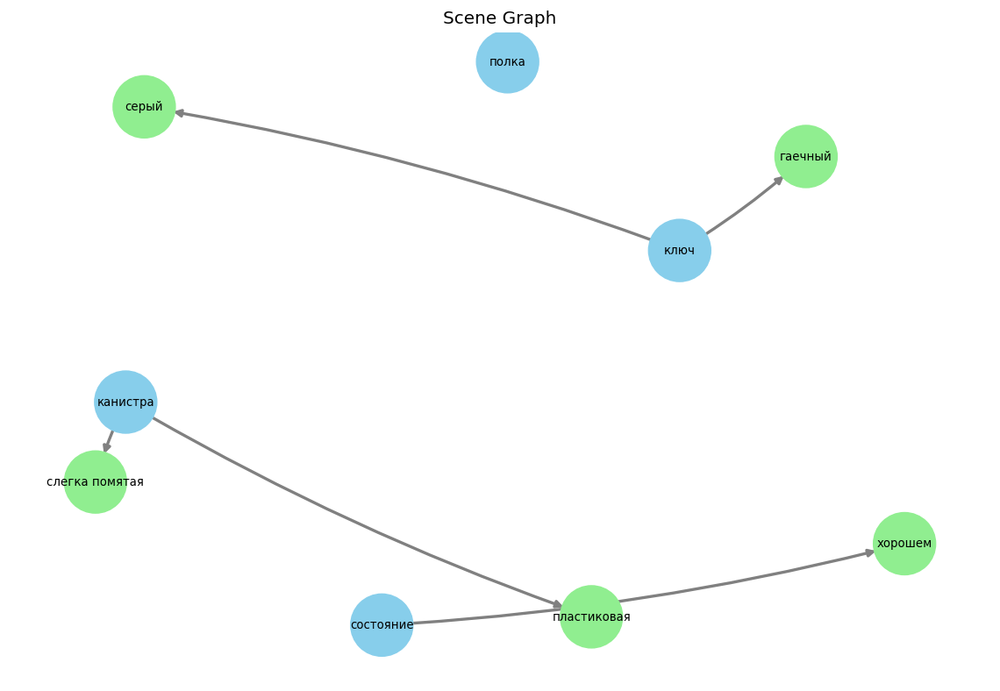


{"src_text": "На полу разбросаны три кисти: изношенная большая, средняя с обломанным кончиком и маленькая свежая, рядом валяются палитры. Рядом на верстаке оставлен холст с начатым пейзажем в пастельных тонах.", "norm_text": "На полу разбросаны изношенная большая кисть 1, средняя кисть 2 с обломанным кончиком и маленькая свежая кисть 3, рядом валяются палитры. Рядом на верстаке оставлен холст с начатым пейзажем в пастельных тонах.", "objects": ["пол", "кисть 1", "кисть 2", "кончик", "кисть 3", "палитра", "верстак", "холст", "пейзаж", "тон"], "attributes": {"кончик": ["обломанным"], "пейзаж": ["начатым"], "тон": ["пастельных"], "кисть 1": ["большая"], "кисть 2": ["средняя"], "кисть 3": ["маленькая", "свежая"]}, "relations": []}



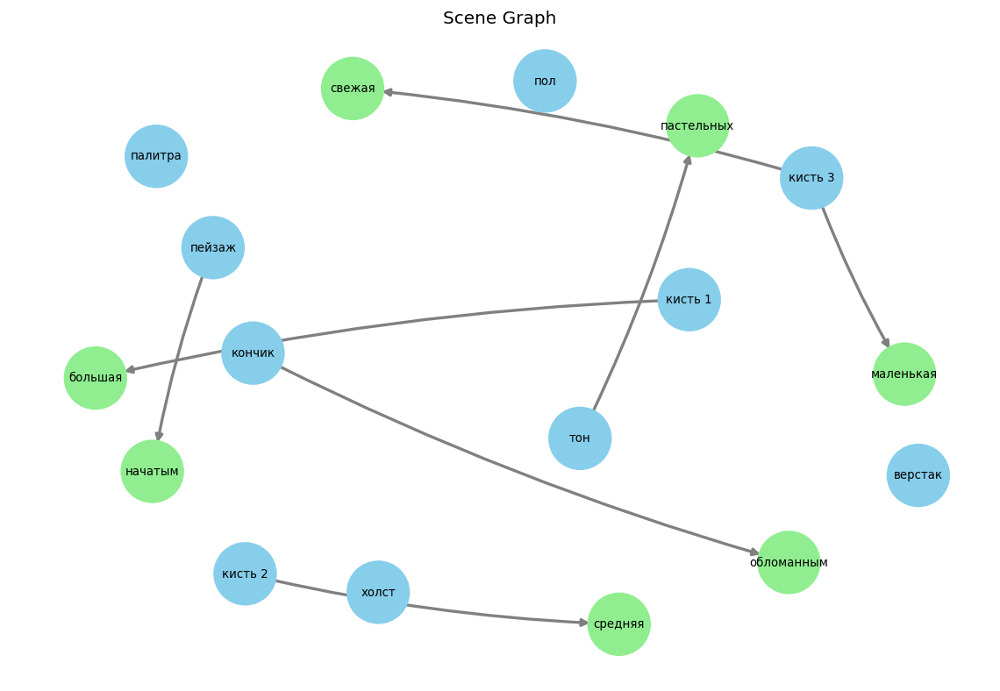


{"src_text": "На комоде стоит кукла в зелёном платье, с распущенными волосами. Рядом лежит пазл в картонной коробке.", "norm_text": "На комоде стоит кукла в зелёном платье с распущенными волосами. Рядом с куклой лежит пазл в картонной коробке.", "objects": ["комод", "кукла", "платье", "волос", "пазл", "коробка"], "attributes": {"платье": ["зелёном"], "волос": ["распущенными"], "коробка": ["картонной"]}, "relations": [["пазл", "рядом с", "кукла"], ["кукла", "на", "комод"]]}



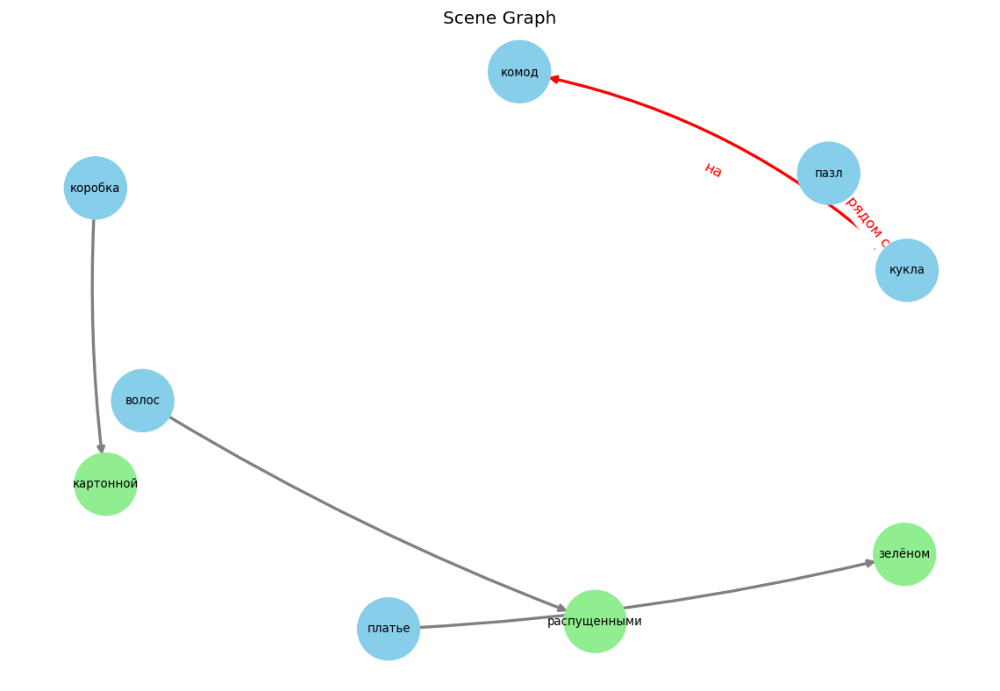


{"src_text": "На рабочем столе стоит паяльная станция, она компактная и функциональная. Рядом с ней разбросаны несколько мелких запчастей.", "norm_text": "На рабочем столе стоит компактная функциональная паяльная станция. Рядом с паяльной станцией разбросаны несколько мелких запчастей.", "objects": ["стол", "станция", "запчасть"], "attributes": {"стол": ["рабочем"], "станция": ["компактная", "паяльная", "паяльной", "функциональная"], "запчасть": ["мелких"]}, "relations": [["станция", "на", "стол"]]}



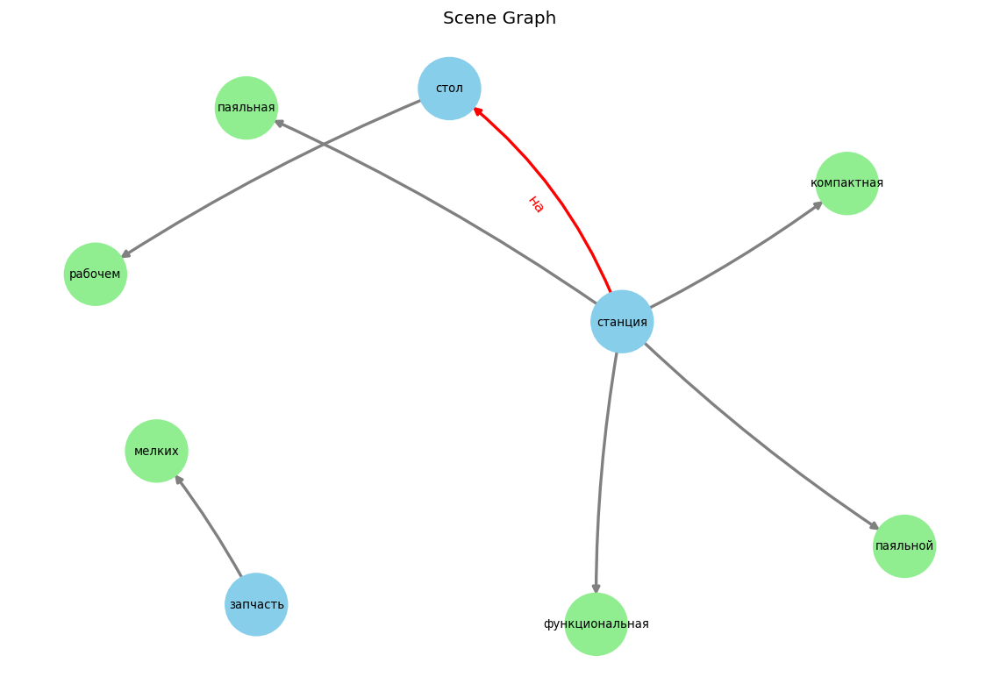


{"src_text": "На полке стоят три цветочных горшка: пластмассовый белый, керамический оранжевый и металлический синий. Все горшки выглядят ухоженно и аккуратно.", "norm_text": "На полке стоят ухоженный аккуратный пластмассовый белый цветочный горшок 1, ухоженный аккуратный керамический оранжевый цветочный горшок 2 и ухоженный аккуратный металлический синий цветочный горшок 3.", "objects": ["полка", "горшок 1", "горшок 2", "горшок 3"], "attributes": {"горшок 1": ["аккуратный", "белый", "пластмассовый", "цветочный"], "горшок 2": ["аккуратный", "керамический", "оранжевый", "цветочный"], "горшок 3": ["аккуратный", "металлический", "синий", "цветочный"]}, "relations": []}



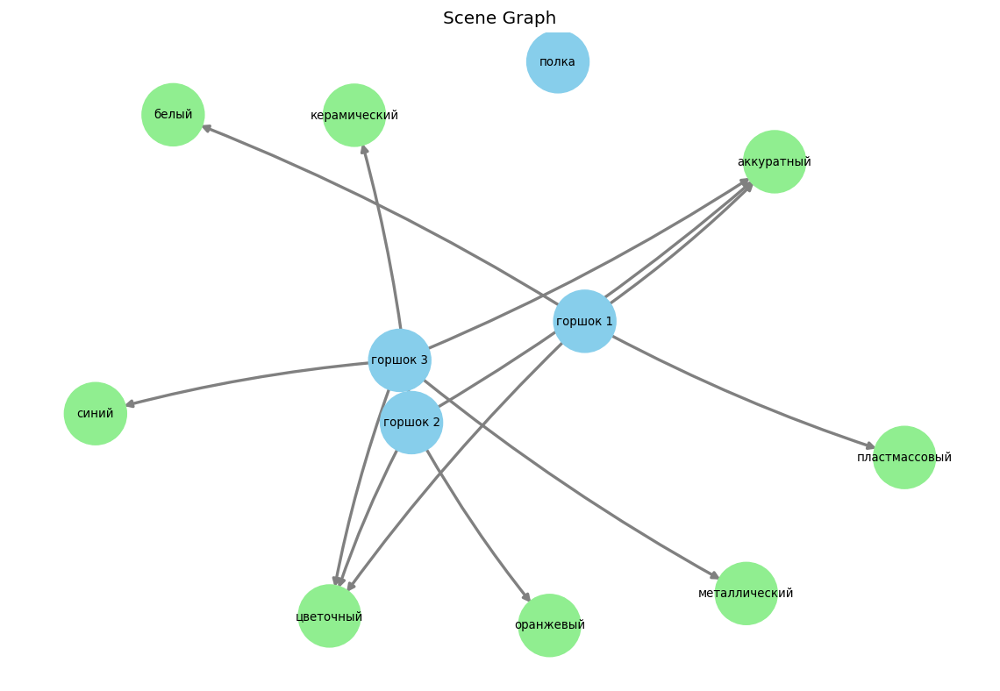


{"src_text": "На сцене театра стоит большой рояль, блестящий и элегантный. За ним расположена высокая арфа, изящная и золотистая.", "norm_text": "На сцене театра стоит большой блестящий элегантный рояль. За роялем расположена высокая изящная золотистая арфа.", "objects": ["сцена", "театр", "рояль", "арфа"], "attributes": {"рояль": ["блестящий", "большой", "элегантный"], "арфа": ["высокая", "золотистая", "изящная", "расположена"]}, "relations": [["рояль", "на", "сцена"]]}



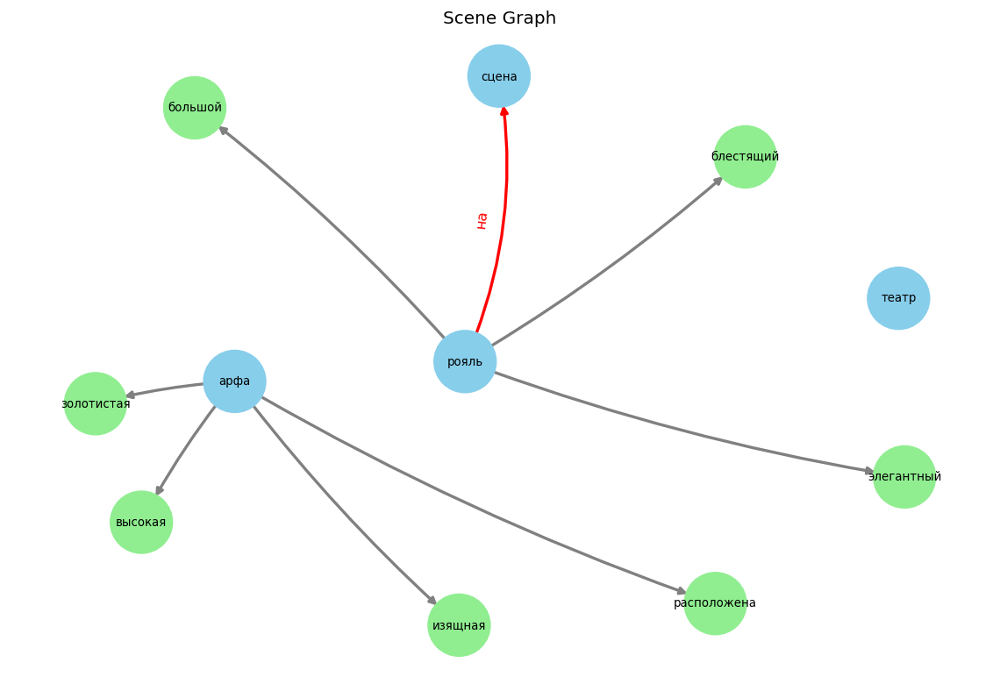


{"src_text": "На прилавке лежит картонная коробка, немного помятая, а рядом стоит фарфоровая статуэтка, изящная и целая.", "norm_text": "На прилавке лежит немного помятая картонная коробка, а рядом стоит изящная целая фарфоровая статуэтка.", "objects": ["прилавок", "коробка", "статуэтка"], "attributes": {"коробка": ["картонная", "немного помятая"], "статуэтка": ["изящная", "фарфоровая", "целая"]}, "relations": [["коробка", "на", "прилавок"]]}



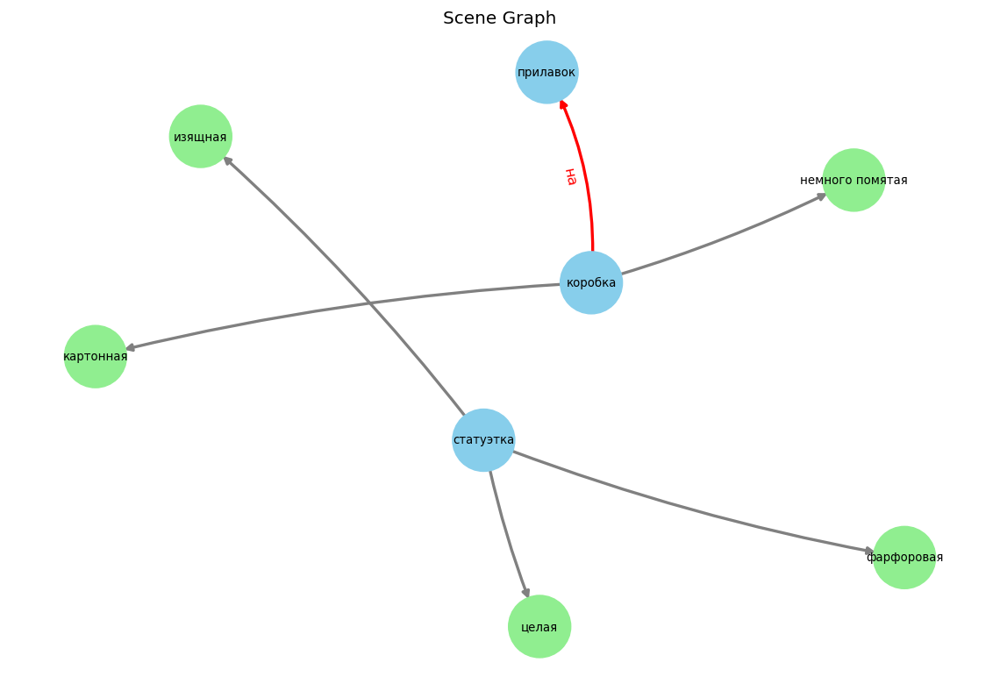


{"src_text": "На подоконнике стоят три керамических горшка с растениями: один с высохшими листьями, другой зелёный и пышный, третий с цветами. Рядом на полу лежит зелёный коврик.", "norm_text": "На подоконнике стоят керамический горшок 1 с высохшими листьями, зелёный пышный керамический горшок 2 и керамический горшок 3 с цветами. Рядом на полу лежит зелёный коврик.", "objects": ["подоконник", "горшок 1", "лист", "горшок 2", "горшок 3", "цвет", "пол", "коврик"], "attributes": {"лист": ["высохшими"], "коврик": ["зелёный"], "горшок 1": ["керамический"], "горшок 2": ["зелёный", "керамический", "пышный"], "горшок 3": ["керамический"]}, "relations": [["горшок 2", "на", "подоконник"], ["коврик", "на", "пол"], ["горшок 1", "на", "подоконник"], ["горшок 3", "на", "подоконник"]]}



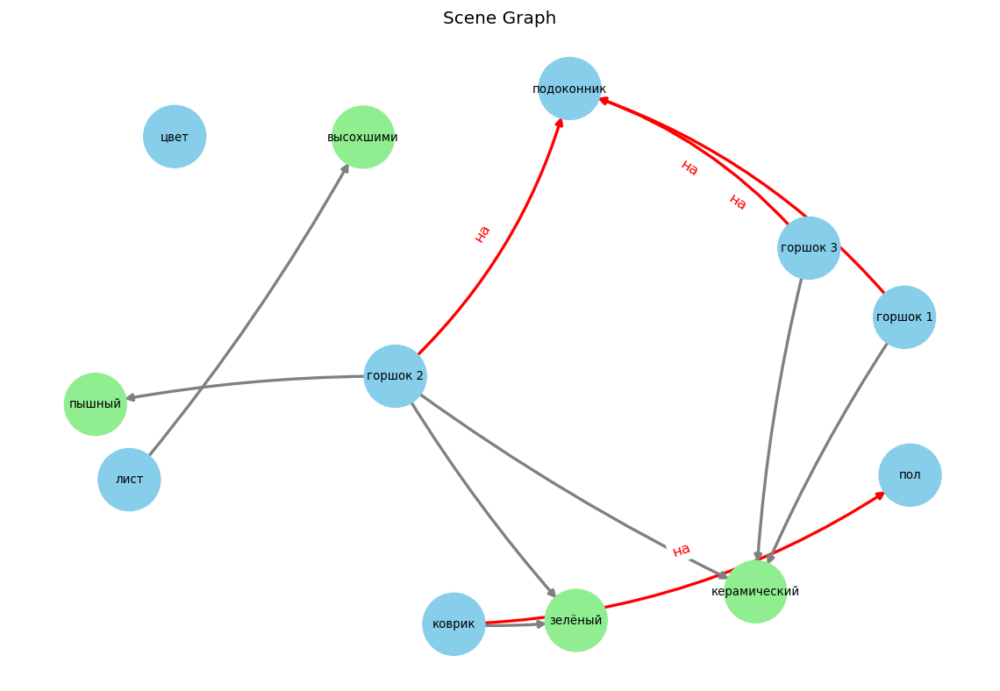


{"src_text": "На стойке регистрации лежит кожаный паспортный чехол коричневого цвета, старый, но опрятный. Рядом с ним — темно-синие наушники, запутанные в узел.", "norm_text": "На стойке регистрации лежит старый опрятный кожаный паспортный чехол коричневого цвета. Рядом с чехлом находятся запутанные в узел темно-синие наушники.", "objects": ["стойка", "регистрация", "чехол", "цвет", "узел", "наушник"], "attributes": {"чехол": ["кожаный", "опрятный", "паспортный", "старый"], "цвет": ["коричневого"], "наушник": ["-", "синие", "темно"]}, "relations": [["наушник", "рядом с", "чехол"], ["чехол", "на", "стойка"]]}



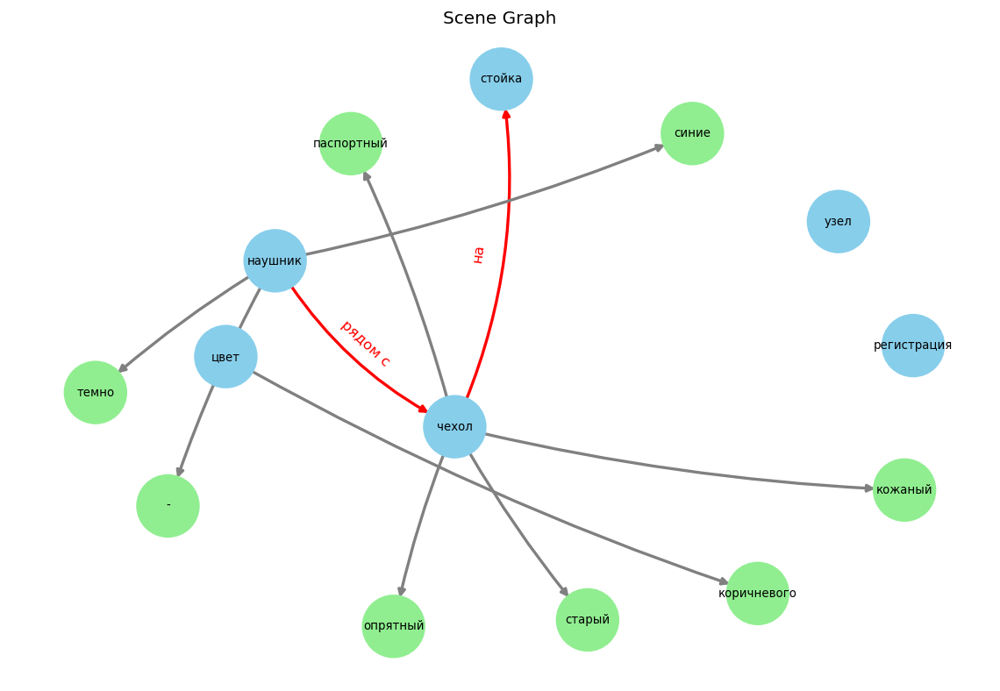


{"src_text": "На столике у окна стоят два чемодана: один большой и один средний, оба с кодовыми замками. Рядом лежит кожаная папка, потертая и изношенная.", "norm_text": "На столике у окна стоят большой чемодан 1 с кодовым замком и средний чемодан 2 с кодовым замком. Рядом лежит потертая изношенная кожаная папка.", "objects": ["столик", "окно", "чемодан 1", "замок", "чемодан 2", "папка"], "attributes": {"замок": ["кодовым"], "папка": ["изношенная", "кожаная", "потертая"], "чемодан 1": ["большой"], "чемодан 2": ["средний"]}, "relations": [["чемодан 2", "на", "столик"], ["чемодан 1", "на", "столик"], ["чемодан 1", "у", "окно"], ["чемодан 2", "у", "окно"]]}



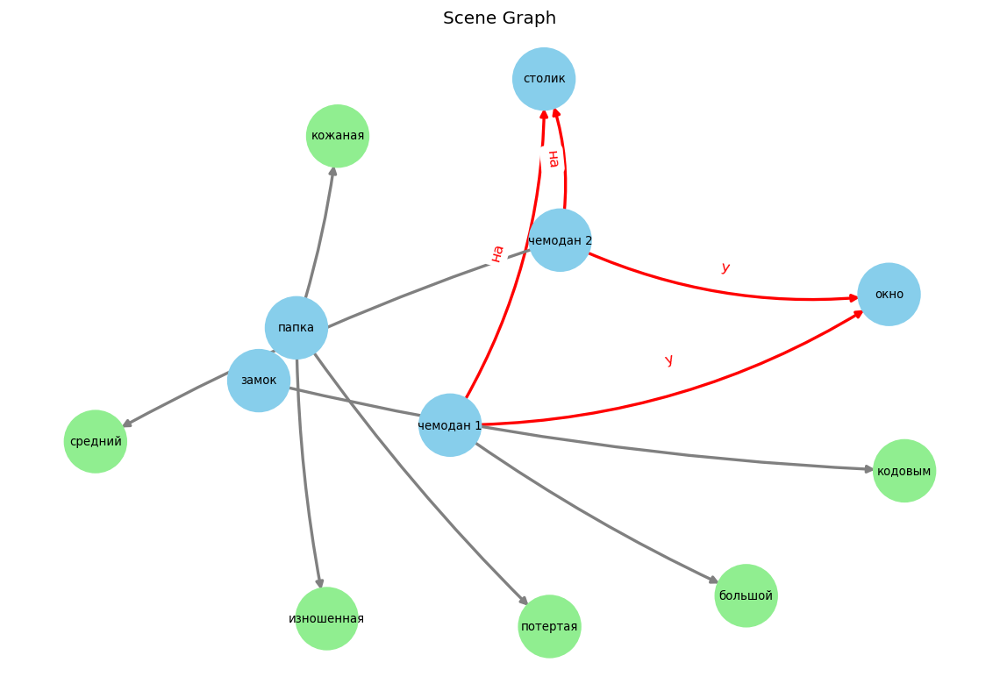


{"src_text": "На веревке сушатся обе пары ботинок: грязные и поношенные. Рядом стоит табурет с кожаным сиденьем.", "norm_text": "На веревке сушатся грязные ботинки 1 и поношенные ботинки 2. Рядом стоит табурет с кожаным сиденьем.", "objects": ["верёвка", "ботинок 1", "ботинок 2", "табурет", "сидение"], "attributes": {"сидение": ["кожаным"], "ботинок 1": ["грязные"], "ботинок 2": ["поношенные"]}, "relations": [["ботинок 1", "на", "верёвка"]]}



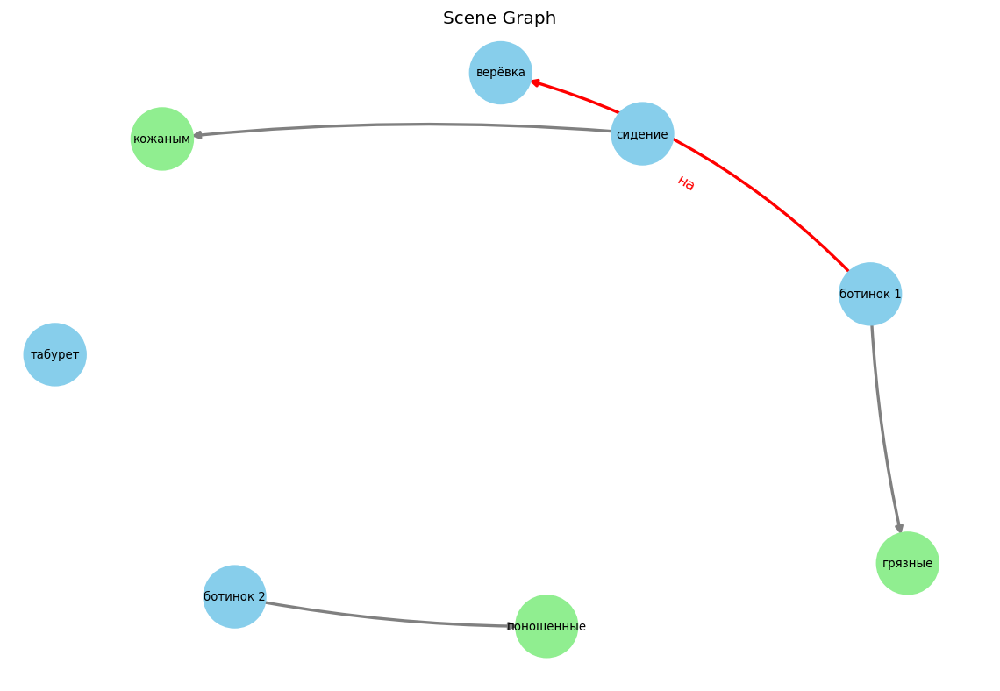


{"src_text": "На верхней полке стоят две коробки: большая зеленая и маленькая красная. Рядом с ними лежит старая перчатка, а под ней серебристый фонарик.", "norm_text": "На верхней полке стоят большая зелёная коробка 1 и маленькая красная коробка 2. Рядом с коробкой 1 и коробкой 2 лежит старая перчатка, а под перчаткой находится серебристый фонарик.", "objects": ["полка", "коробка 1", "коробка 2", "перчатка", "фонарик"], "attributes": {"коробка 1": ["большая", "зелёная"], "перчатка": ["старая"], "фонарик": ["серебристый"], "коробка 2": ["красная", "маленькая"]}, "relations": [["перчатка", "рядом с", "коробка 1"], ["фонарик", "под", "перчатка"]]}



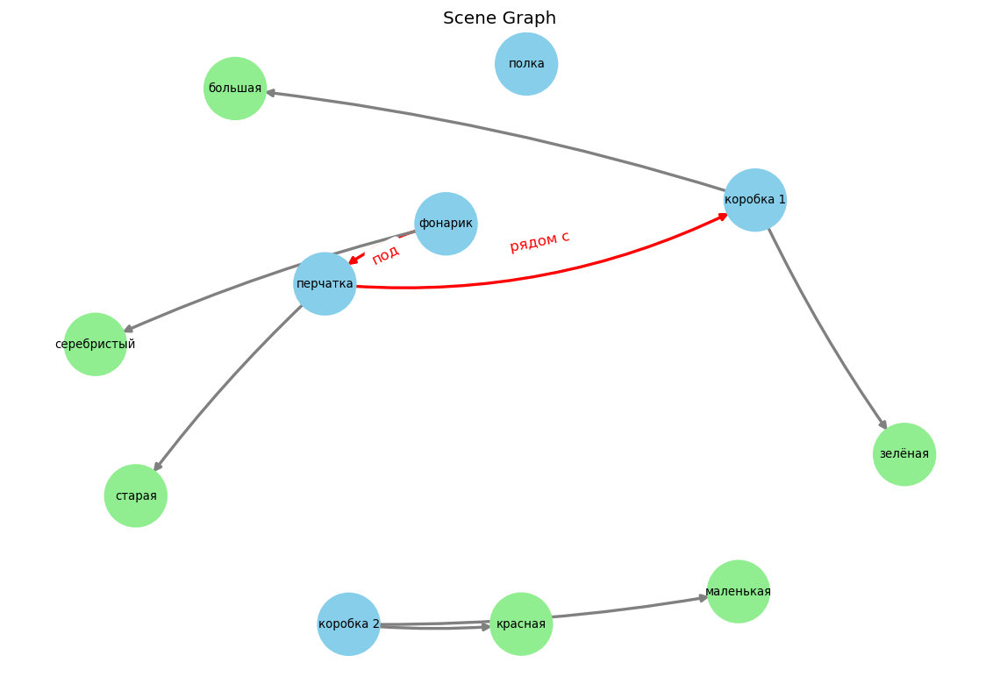


{"src_text": "На земле стоит ржавый багровый мангал с решеткой. Рядом на крыльце лежит пара старых сапогов, замызганных и с трещинами.", "norm_text": "На земле стоит ржавый багровый мангал с решеткой. Рядом на крыльце лежит пара старых замызганных сапогов с трещинами.", "objects": ["земля", "мангал", "решётка", "крыльцо", "пара", "сапогов", "трещина"], "attributes": {"мангал": ["багровый", "ржавый"], "сапогов": ["замызганных", "старых"]}, "relations": [["мангал", "на", "земля"], ["пара", "на", "крыльцо"]]}



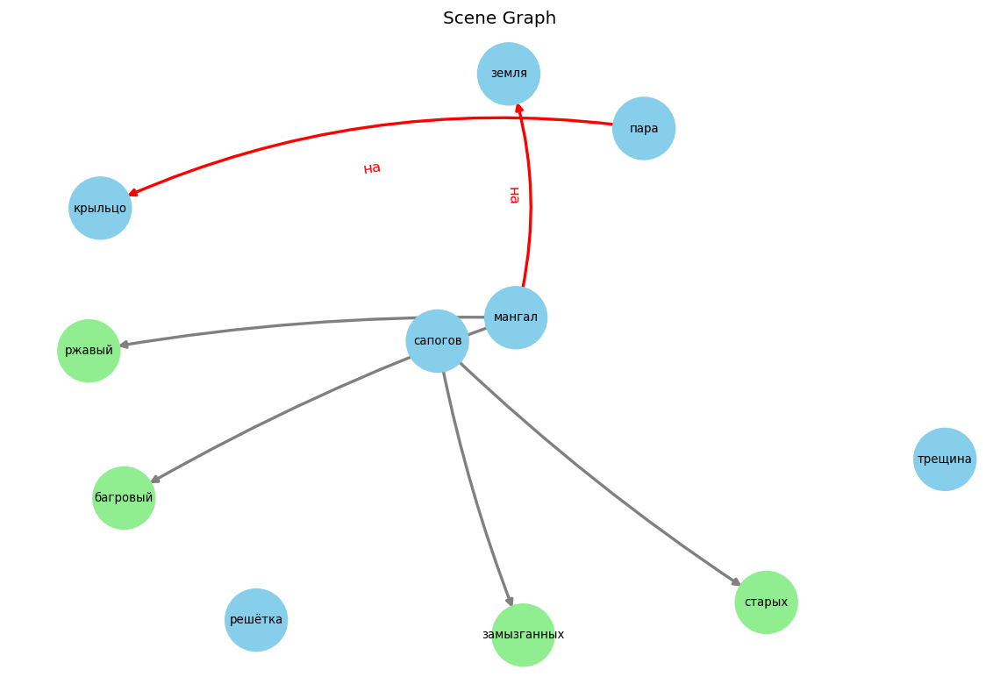


{"src_text": "На песчаном полу раскиданы игрушечные кубики, один из которых синего цвета, а другой - зелёного. В уголке комнаты стоит плюшевый медведь с небольшими потертостями.", "norm_text": "На песчаном полу раскиданы игрушечные кубики: синий кубик 1 и зелёный кубик 2. В уголке комнаты стоит плюшевый медведь с небольшими потертостями.", "objects": ["пол", "кубик", "кубик 1", "кубик 2", "уголок", "комната", "медведь", "потертостями"], "attributes": {"пол": ["песчаном"], "кубик": ["зелёный", "игрушечные", "синий"], "медведь": ["плюшевый"], "потертостями": ["небольшими"], "кубик 1": ["синий"], "кубик 2": ["зелёный"]}, "relations": [["медведь", "в", "уголок"]]}



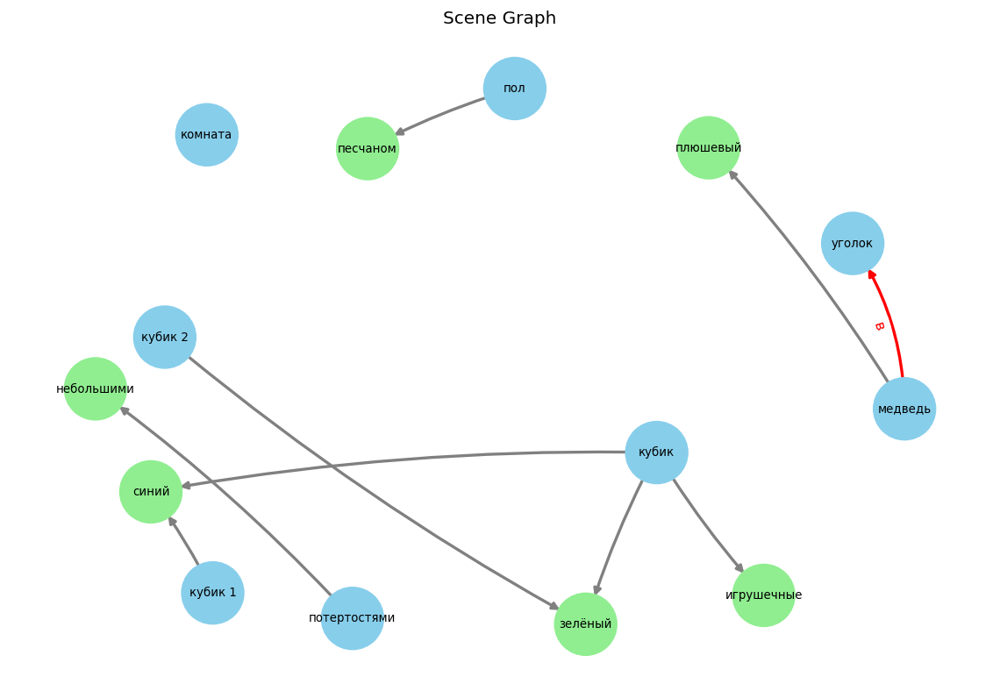


{"src_text": "На полу стоит керамическая ваза, она высокая и украшена нежными розовыми цветами.", "norm_text": "На полу стоит высокая керамическая ваза, украшенная нежными розовыми цветами.", "objects": ["пол", "ваза", "цвет"], "attributes": {"ваза": ["высокая", "керамическая", "украшенная цветами"], "цвет": ["нежными", "розовыми"]}, "relations": [["ваза", "на", "пол"]]}



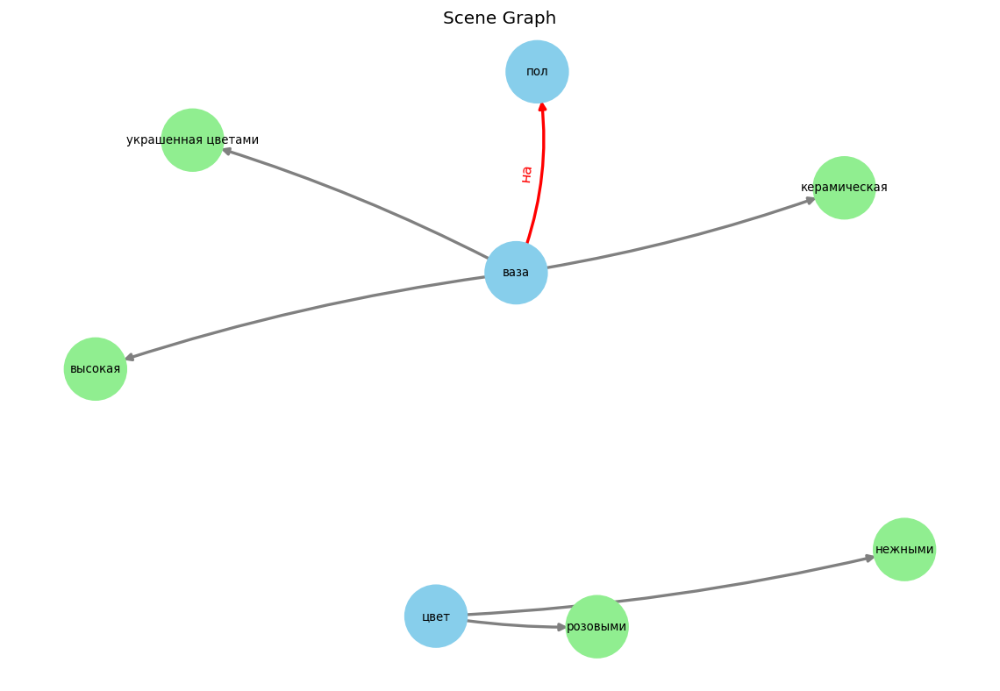


{"src_text": "На стуле покоится кожаная куртка, видавшая виды. Около двери стоят ботинки, один из которых порвался. На столе разместились три инструмента: отвертка, молоток и плоскогубцы, первые два как новенькие.", "norm_text": "На стуле покоится кожаная видавшая виды куртка. Около двери стоят ботинки, один из которых порванный. На столе разместились новые отвертка 1 и молоток 2, а также плоскогубцы 3.", "objects": ["стул", "вид", "куртка", "дверь", "ботинок", "стол", "отвёртка 1", "молоток 2", "плоскогубцы 3"], "attributes": {"вид": ["видавшая", "кожаная"], "отвёртка 1": ["новые"]}, "relations": [["плоскогубцы 3", "на", "стол"], ["вид", "на", "стул"], ["отвёртка 1", "на", "стол"], ["молоток 2", "на", "стол"]]}



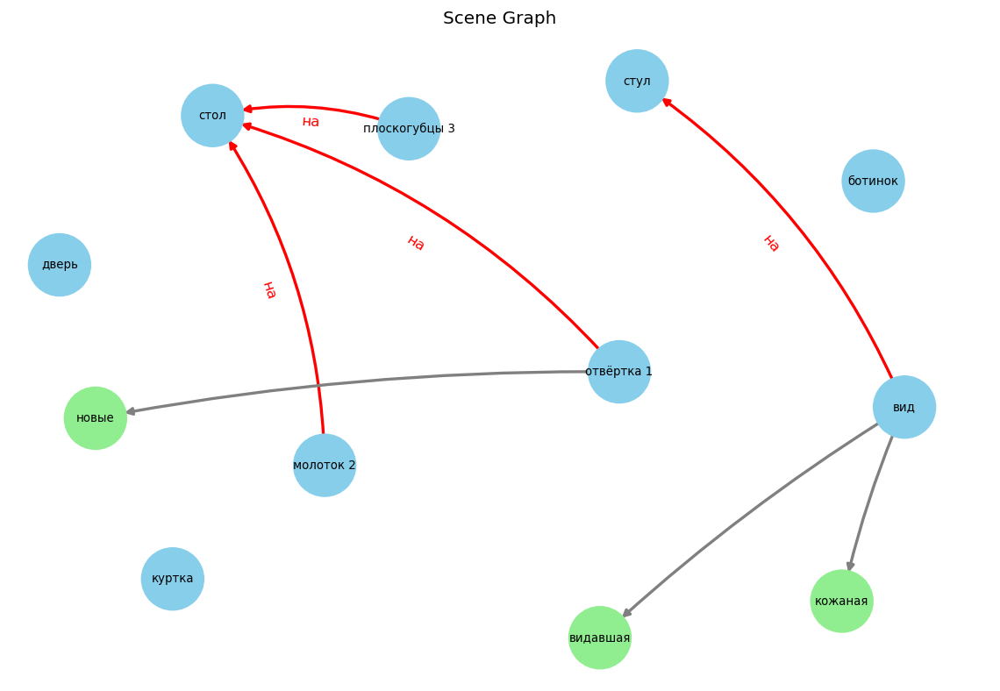


{"src_text": "На полке у двери расположился компас с бронзовым корпусом, старинный и потемневший от времени.", "norm_text": "На полке у двери расположился старинный потемневший от времени компас с бронзовым корпусом.", "objects": ["полка", "дверь", "время", "компас", "корпус"], "attributes": {"компас": ["потемневший от времени", "старинный"], "корпус": ["бронзовым"]}, "relations": [["компас", "у", "дверь"]]}



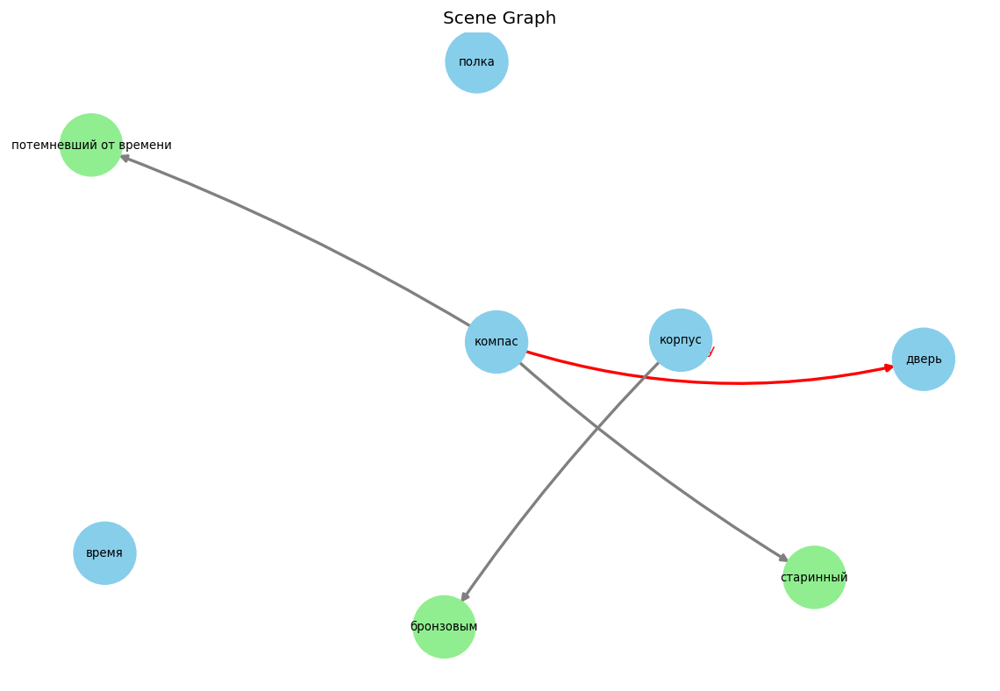


{"src_text": "На детской кроватке сидит плюшевый заяц, розовый и пушистый. Рядом стоит кубик, яркий и разноцветный.", "norm_text": "На детской кроватке сидит розовый пушистый плюшевый заяц. Рядом стоит яркий разноцветный кубик.", "objects": ["кроватка", "заяц", "кубик"], "attributes": {"кроватка": ["детской"], "заяц": ["плюшевый", "пушистый", "розовый"], "кубик": ["разноцветный", "яркий"]}, "relations": [["заяц", "на", "кроватка"]]}



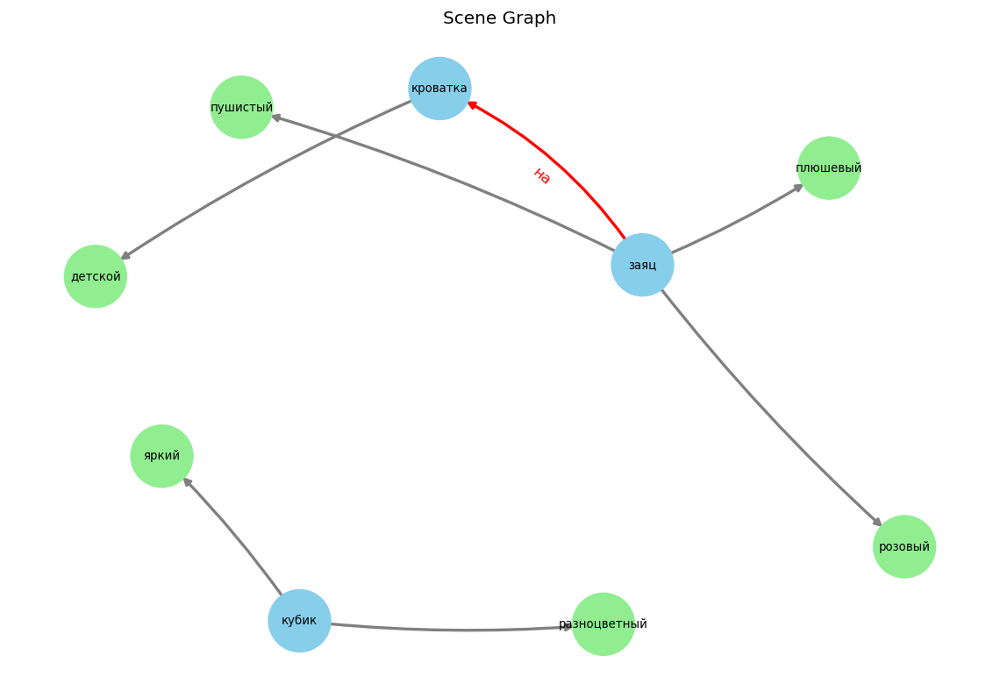


{"src_text": "На земле лежит потертая футбольная сетка, а над ней висит металлическая корзина. Между ними стоит пластиковый конус, окрашенный в оранжевый цвет.", "norm_text": "На земле лежит потертая футбольная сетка, а над сеткой висит металлическая корзина. Между сеткой и корзиной стоит оранжевый пластиковый конус.", "objects": ["земля", "сетка", "корзина", "конус"], "attributes": {"сетка": ["потертая", "футбольная"], "корзина": ["металлическая"], "конус": ["оранжевый", "пластиковый"]}, "relations": [["конус", "между", "сетка"], ["сетка", "на", "земля"], ["конус", "между", "корзина"], ["корзина", "над", "сетка"]]}



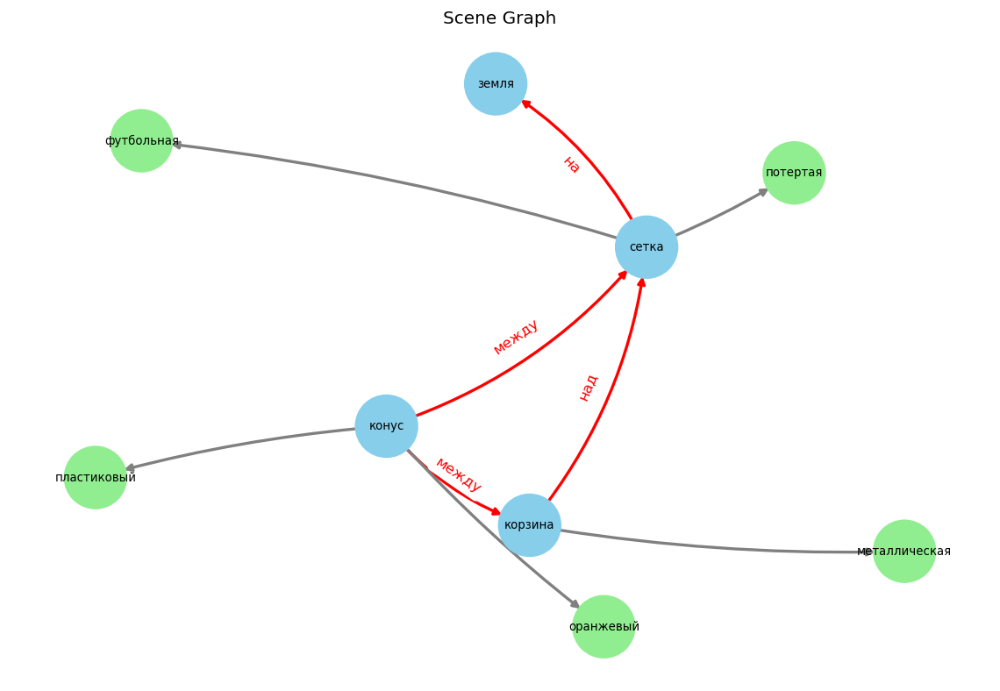


{"src_text": "На кухонном столе стоит белый чайник, слегка тёплый. Рядом с ним — керамическая тарелка с фруктами и металлическая ложка.", "norm_text": "На кухонном столе стоит слегка тёплый белый чайник. Рядом с чайником — керамическая тарелка с фруктами и металлическая ложка.", "objects": ["стол", "чайник", "тарелка", "фрукт", "ложка"], "attributes": {"стол": ["кухонном"], "чайник": ["белый", "слегка тёплый"], "тарелка": ["керамическая"], "ложка": ["металлическая"]}, "relations": [["чайник", "на", "стол"]]}



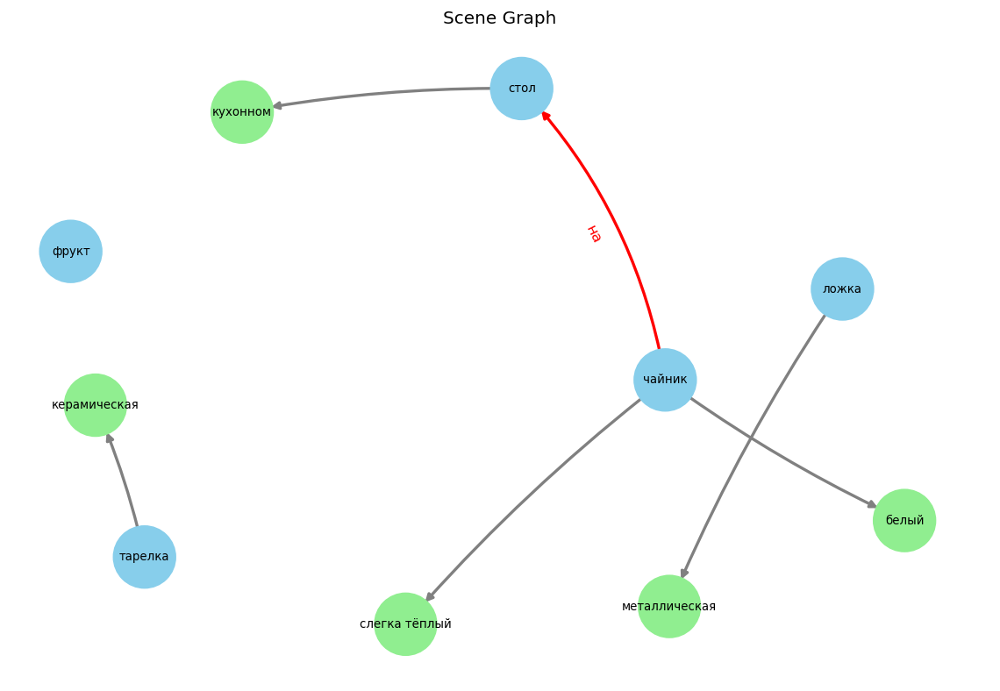


{"src_text": "На пляже три предмета: зонт с синими полосками, коврик в песчинках и ведерко с морскими ракушками. Зонт над ковриком, ведерко справа.", "norm_text": "На пляже находятся три предмета: зонт с синими полосками, коврик в песчинках и ведерко с морскими ракушками. Зонт расположен над ковриком, ведерко находится справа от коврика.", "objects": ["пляж", "предмет", "зонт", "полоска", "коврик", "песчинках", "ведёрко", "ракушка"], "attributes": {"полоска": ["синими"], "ракушка": ["морскими"], "зонт": ["расположен"]}, "relations": [["предмет", "на", "пляж"], ["ведёрко", "справа от", "коврик"]]}



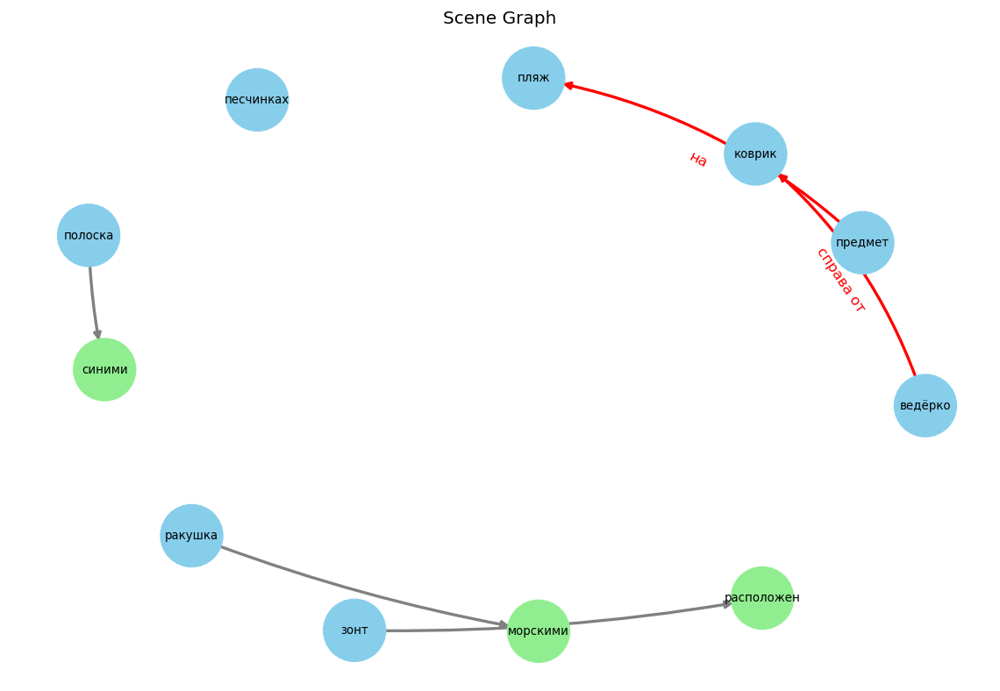


{"src_text": "На деревянной скамье разместились две подушки: одна крупная, цветная, с цветочным узором, другая маленькая и однотонная, нежно-розовая. У подножия скамьи стоит глиняный горшок с цветущей фиалкой.", "norm_text": "На деревянной скамье разместились крупная цветная подушка 1 с цветочным узором и маленькая однотонная нежно-розовая подушка 2. У подножия скамьи стоит глиняный горшок с цветущей фиалкой.", "objects": ["скамья", "подушка 1", "узор", "подушка 2", "подножие", "горшок", "фиалка"], "attributes": {"скамья": ["деревянной"], "узор": ["цветочным"], "горшок": ["глиняный"], "фиалка": ["цветущей"], "подушка 1": ["крупная", "цветная"], "подушка 2": ["-", "маленькая", "нежно", "однотонная", "розовая"]}, "relations": [["подушка 2", "на", "скамья"], ["подушка 1", "на", "скамья"], ["горшок", "у", "подножие"]]}



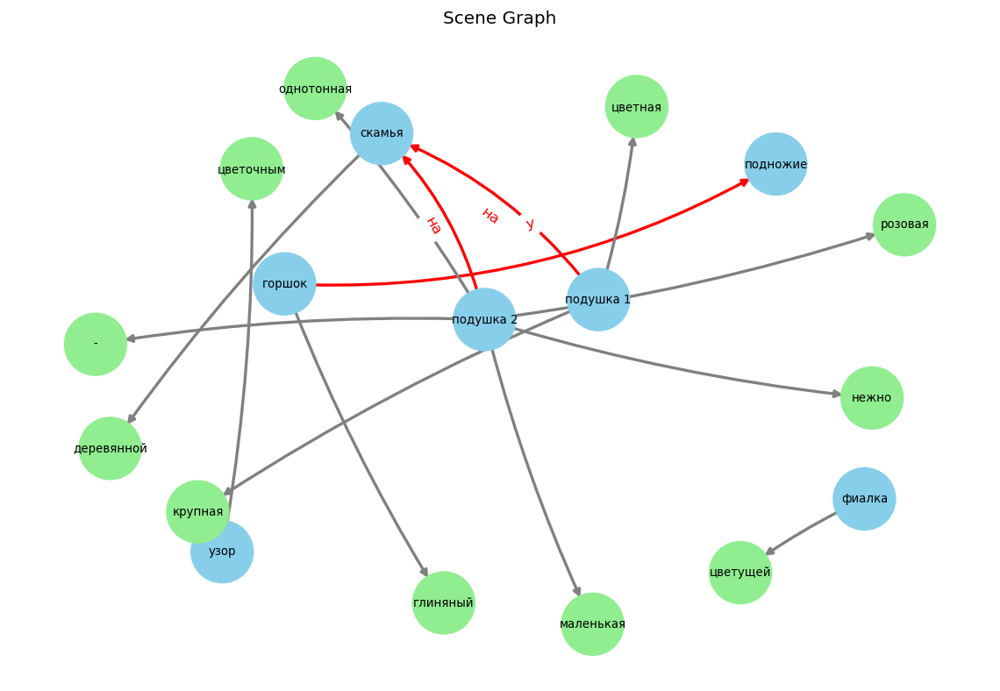


{"src_text": "На подоконнике стоят две вазы: одна голубая, вторая розовая, обе с цветами. Голубая ваза слегка потемневшая, а розовая выглядит совсем новой.", "norm_text": "На подоконнике стоят голубая слегка потемневшая ваза 1 с цветами и розовая новая ваза 2 с цветами.", "objects": ["подоконник", "ваза 1", "цвет", "ваза 2"], "attributes": {"ваза 1": ["голубая", "слегка потемневшая"], "ваза 2": ["новая", "розовая"]}, "relations": [["ваза 1", "на", "подоконник"], ["ваза 2", "на", "подоконник"]]}



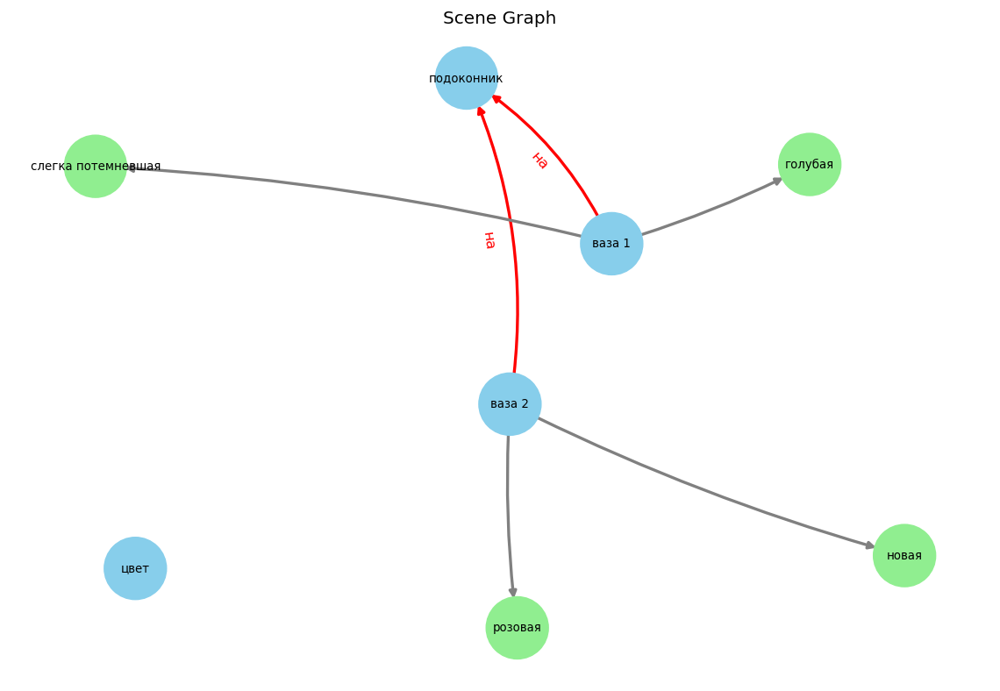


{"src_text": "На кровати лежит полосатое одеяло, чистое и свежее. Возле окна стоит высокий цветок в белом горшке.", "norm_text": "На кровати лежит чистое свежее полосатое одеяло. Возле окна стоит высокий цветок в белом горшке.", "objects": ["кровать", "одеяло", "окно", "цветок", "горшок"], "attributes": {"одеяло": ["полосатое", "свежее", "чистое"], "цветок": ["высокий"], "горшок": ["белом"]}, "relations": [["цветок", "возле", "окно"], ["одеяло", "на", "кровать"]]}



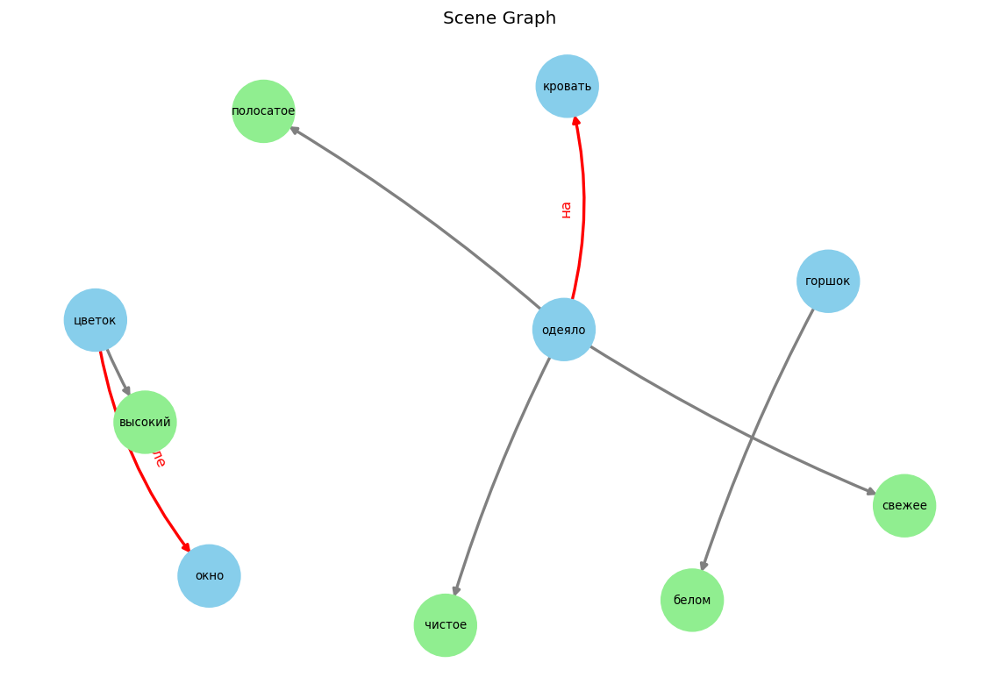


{"src_text": "На полочке стоит зубная щетка — розовая, средних размеров и еще в упаковке.", "norm_text": "На полочке стоит розовая средних размеров зубная щетка в упаковке.", "objects": ["полочка", "размер", "щётка", "упаковка"], "attributes": {"размер": ["розовая", "средних"], "щётка": ["зубная", "розовая"]}, "relations": [["щётка", "на", "полочка"]]}



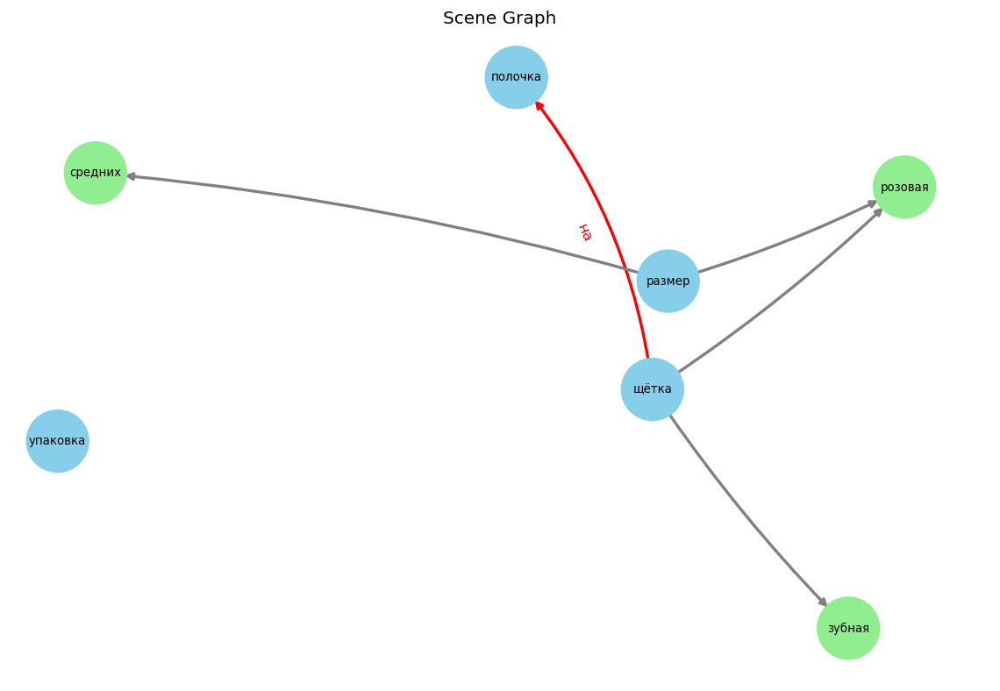


{"src_text": "На тропинке покоится керамическая кружка с трещиной. Неподалеку стоит железное ведро. Чуть дальше — старая газета. На ветке дерева свисает шнурок.", "norm_text": "На тропинке покоится керамическая кружка с трещиной. Неподалеку стоит железное ведро. Чуть дальше лежит старая газета. На ветке дерева свисает шнурок.", "objects": ["тропинка", "кружка", "трещина", "ведро", "газета", "ветка", "дерево", "шнурок"], "attributes": {"кружка": ["керамическая"], "ведро": ["железное"], "газета": ["старая"]}, "relations": [["шнурок", "на", "ветка"], ["кружка", "на", "тропинка"]]}



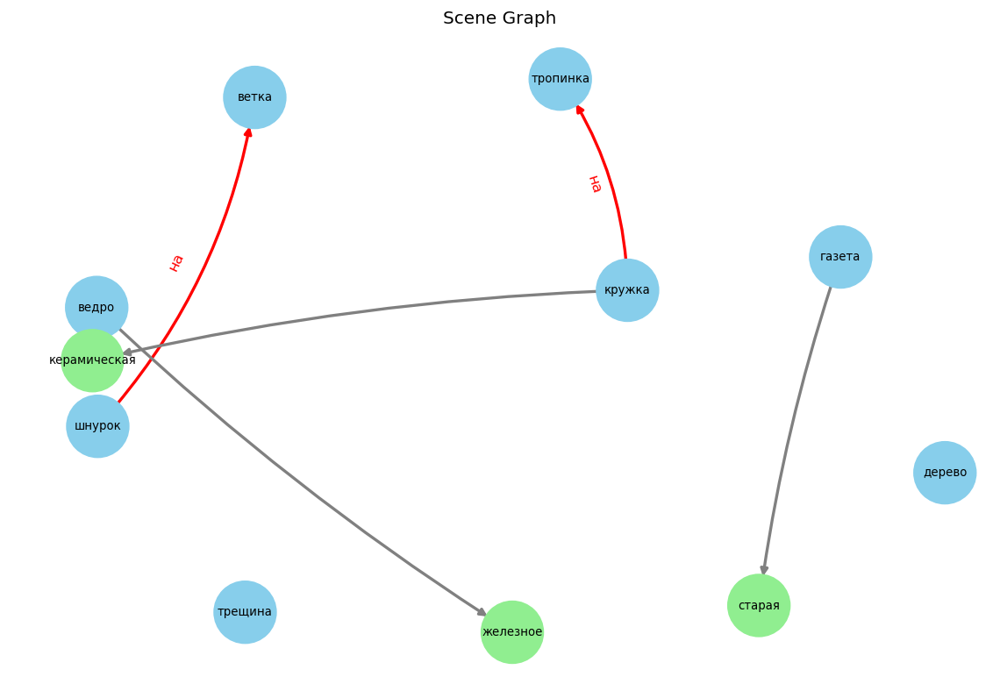


{"src_text": "На перилах балкона стоит пепельница из прозрачного стекла. Ее поверхность чистая и блестящая.", "norm_text": "На перилах балкона стоит чистая блестящая пепельница из прозрачного стекла.", "objects": ["перилах", "балкон", "пепельница", "стекло"], "attributes": {"пепельница": ["блестящая", "чистая"], "стекло": ["прозрачного"]}, "relations": [["пепельница", "на", "перилах"]]}



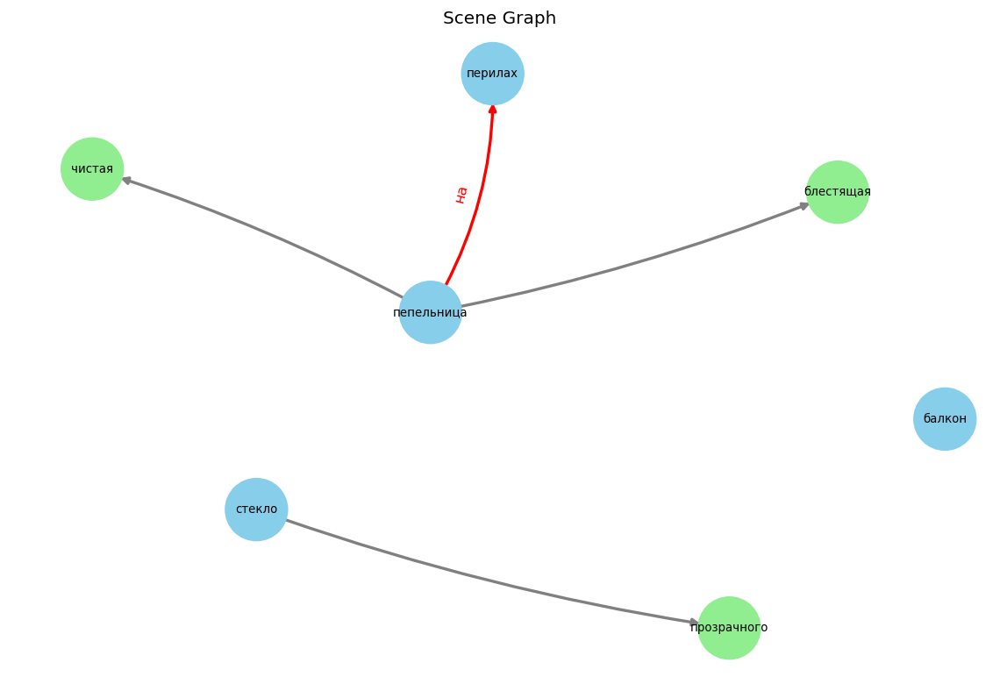


{"src_text": "На столе стоит старая лампа из меди. Под ней лежит потертая газета.", "norm_text": "На столе стоит старая медная лампа. Под лампой лежит потертая газета.", "objects": ["стол", "лампа", "газета"], "attributes": {"лампа": ["медная", "старая"], "газета": ["потертая"]}, "relations": [["лампа", "на", "стол"], ["газета", "под", "лампа"]]}



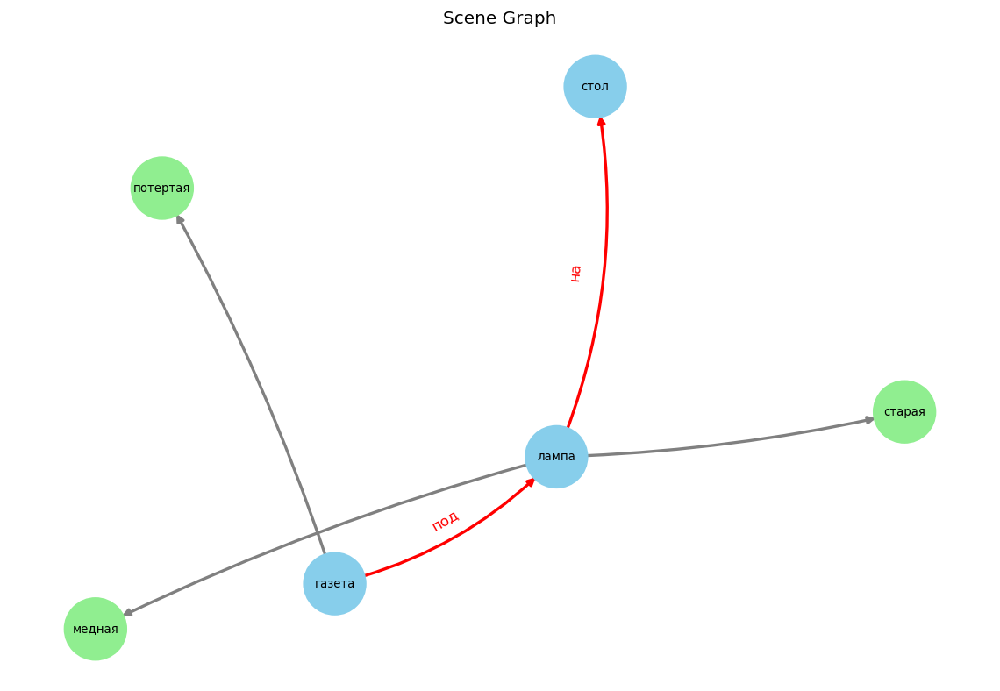


{"src_text": "На земле стоит старое кресло с выцветшей обивкой. Возле него на траве лежит потертая подушка.", "norm_text": "На земле стоит старое кресло с выцветшей обивкой. Возле кресла на траве лежит потертая подушка.", "objects": ["земля", "кресло", "обивка", "трава", "подушка"], "attributes": {"кресло": ["старое"], "обивка": ["выцветшей"], "подушка": ["потертая"]}, "relations": [["кресло", "на", "земля"], ["подушка", "возле", "кресло"], ["подушка", "на", "трава"]]}



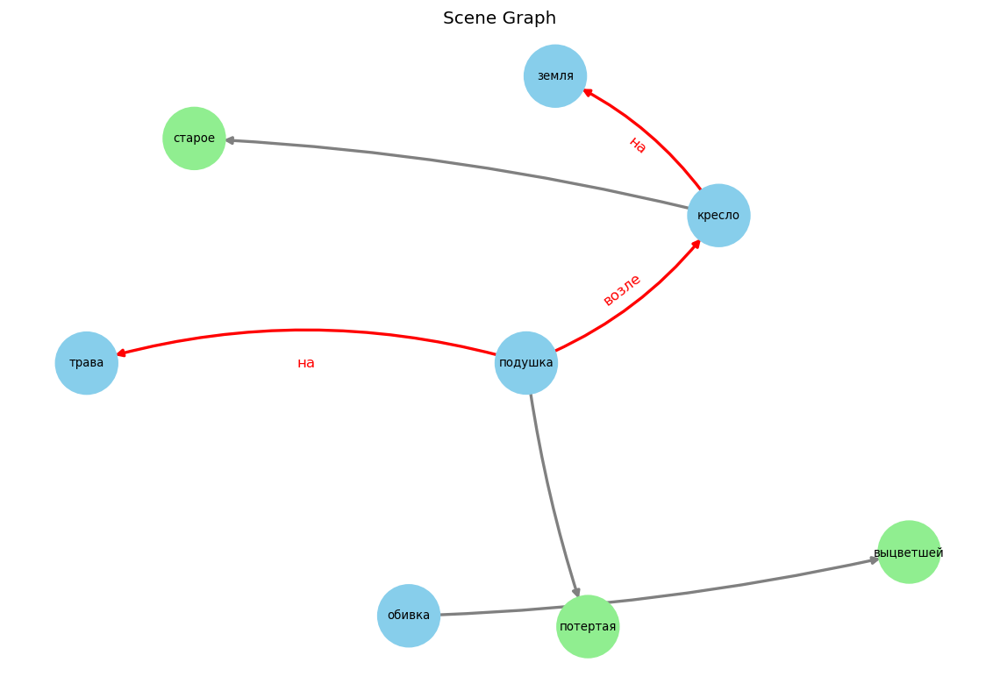


{"src_text": "На полу стоит потертая дорожная сумка. Около двери разбросаны грязные ботинки.", "norm_text": "На полу стоит потертая дорожная сумка. Около двери разбросаны грязные ботинки.", "objects": ["пол", "сумка", "дверь", "ботинок"], "attributes": {"сумка": ["дорожная", "потертая"], "ботинок": ["грязные"]}, "relations": [["сумка", "на", "пол"]]}



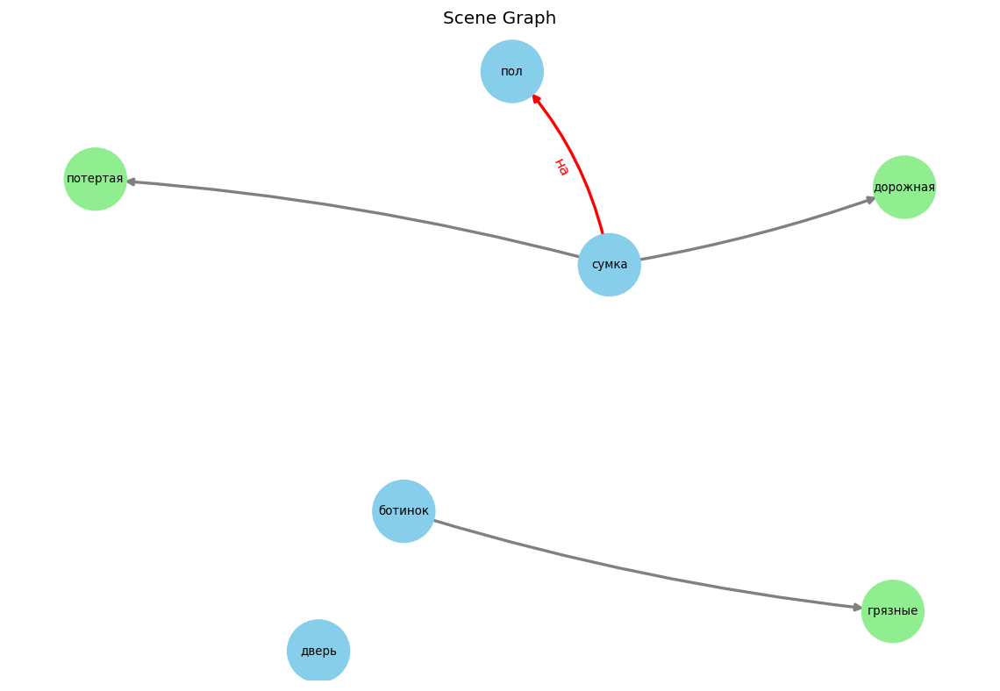


{"src_text": "Под деревом стоит глиняный горшок с засохшим цветком, чуть дальше — небольшой каменный фонтан. У фонтана разместился плетеный стул с подушкой, слегка выцвевшей от солнца.", "norm_text": "Под деревом стоит глиняный горшок с засохшим цветком, чуть дальше — небольшой каменный фонтан. У фонтана разместился плетеный стул с слегка выцвевшей от солнца подушкой.", "objects": ["дерево", "горшок", "цветок", "фонтан", "стул", "солнце", "подушка"], "attributes": {"горшок": ["глиняный"], "цветок": ["засохшим"], "фонтан": ["каменный", "небольшой"], "стул": ["плетеный"], "подушка": ["слегка выцвевшей от солнца"]}, "relations": [["горшок", "под", "дерево"], ["стул", "у", "фонтан"]]}



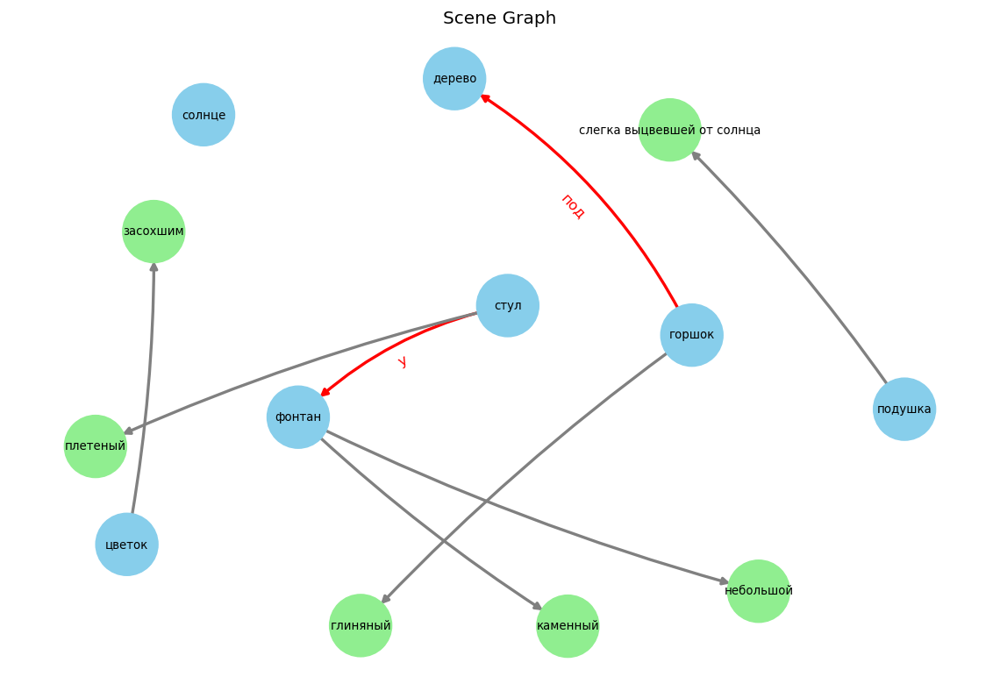


{"src_text": "На полу стоит большой коричневый чемодан, потертый и увесистый. Рядом с ним расположена пара белых кроссовок, чистых и аккуратных.", "norm_text": "На полу стоит большой коричневый потертый увесистый чемодан. Рядом с чемоданом расположена пара белых чистых аккуратных кроссовок.", "objects": ["пол", "чемодан", "пара", "кроссовок"], "attributes": {"чемодан": ["большой", "коричневый", "потертый", "увесистый"], "кроссовок": ["аккуратных", "белых", "чистых"], "пара": ["рядом расположена"]}, "relations": [["чемодан", "на", "пол"]]}



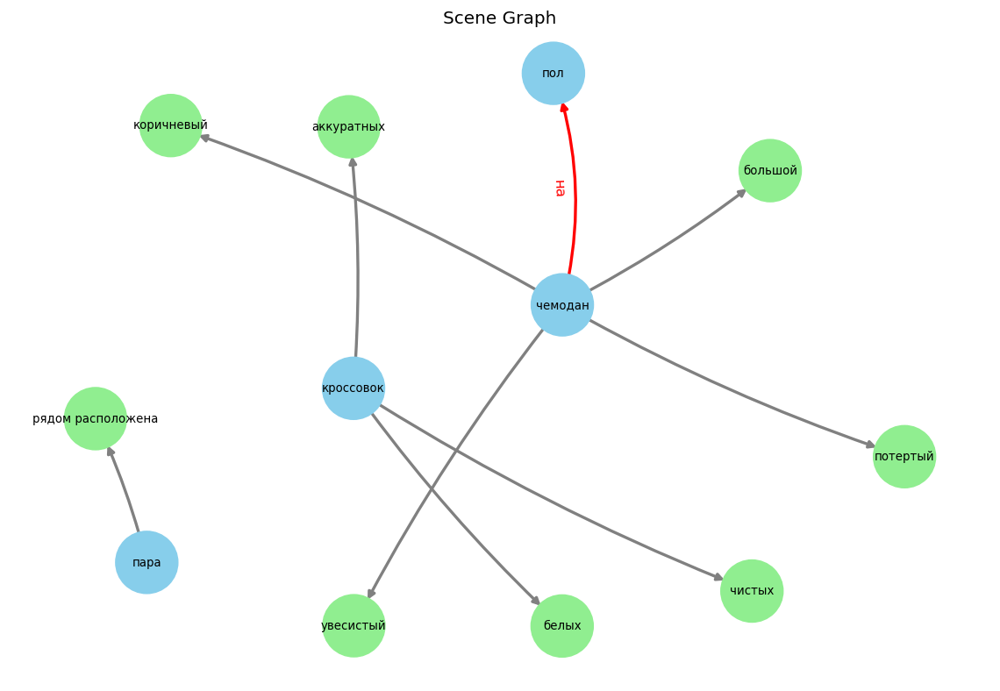


{"src_text": "На столе стоит старый глобус с облупившейся краской. Рядом лежит большая золотистая рамка, немного запыленная.", "norm_text": "На столе стоит старый глобус с облупившейся краской. Рядом лежит большая запыленная золотистая рамка.", "objects": ["стол", "глобус", "краска", "рамка"], "attributes": {"глобус": ["старый"], "краска": ["облупившейся"], "рамка": ["большая", "запыленная", "золотистая"]}, "relations": [["глобус", "на", "стол"]]}



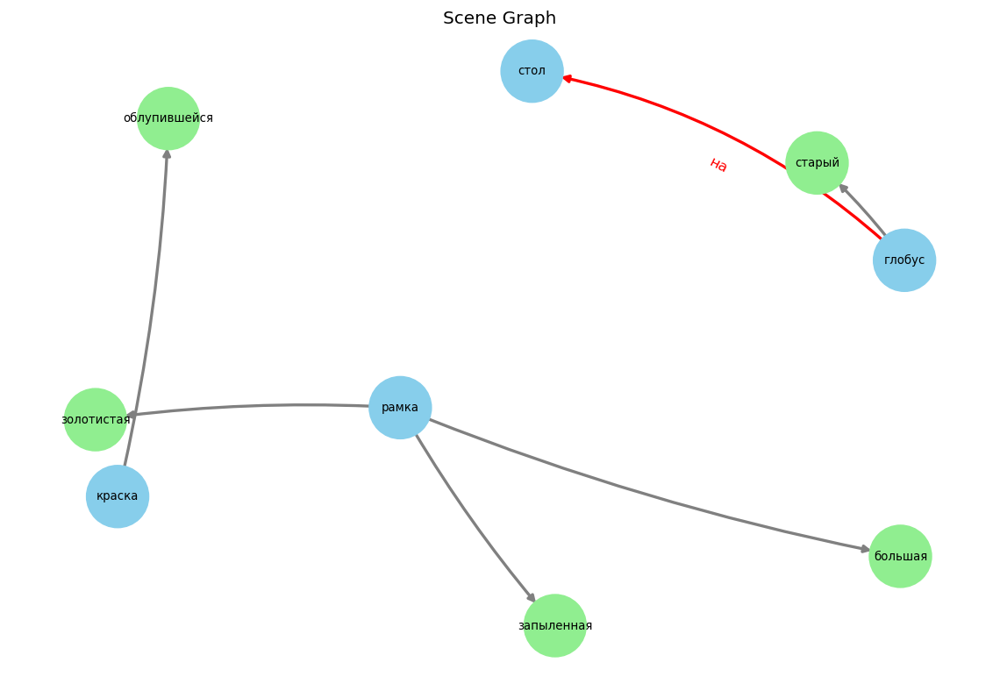


{"src_text": "На полочке стоит флакон парфюма, прозрачный и изящный. Рядом с ним — мыло, квадратное и свежее.", "norm_text": "На полочке стоит прозрачный изящный флакон парфюма. Рядом с флаконом парфюма находится квадратное свежее мыло.", "objects": ["полочка", "флакон", "парфюм", "мыло"], "attributes": {"флакон": ["изящный", "прозрачный"], "мыло": ["квадратное", "свежее"]}, "relations": [["флакон", "на", "полочка"], ["мыло", "рядом с", "флакон"]]}



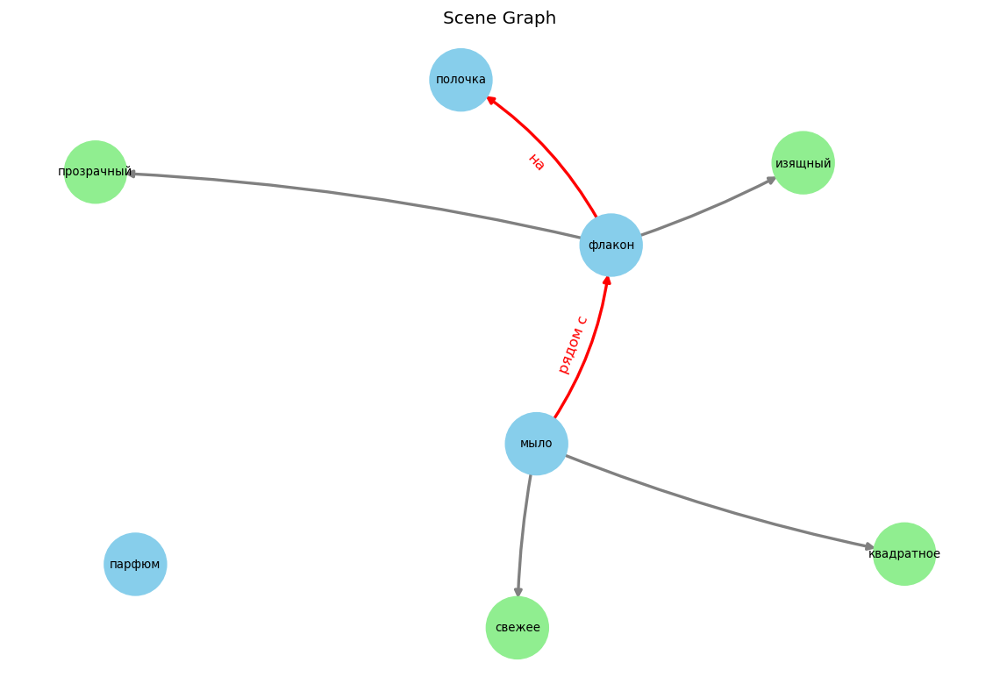


{"src_text": "На деревянной скамье покоится забавная глиняная фигурка, блестящая от свежей глазури. Под ней аккуратно сложены три разноцветных осенних листа.", "norm_text": "На деревянной скамье покоится забавная блестящая от свежей глазури глиняная фигурка. Под глиняной фигуркой аккуратно сложены три разноцветных осенних листа: осенний лист 1, осенний лист 2 и осенний лист 3.", "objects": ["скамья", "глазурь", "фигурка", "лист", "лист 1", "лист 2", "лист 3"], "attributes": {"скамья": ["деревянной"], "глазурь": ["свежей"], "фигурка": ["блестящая", "глиняная", "глиняной"], "лист": ["осенний", "осенних", "разноцветных"], "лист 1": ["осенний"], "лист 2": ["осенний"], "лист 3": ["осенний"]}, "relations": [["фигурка", "на", "скамья"]]}



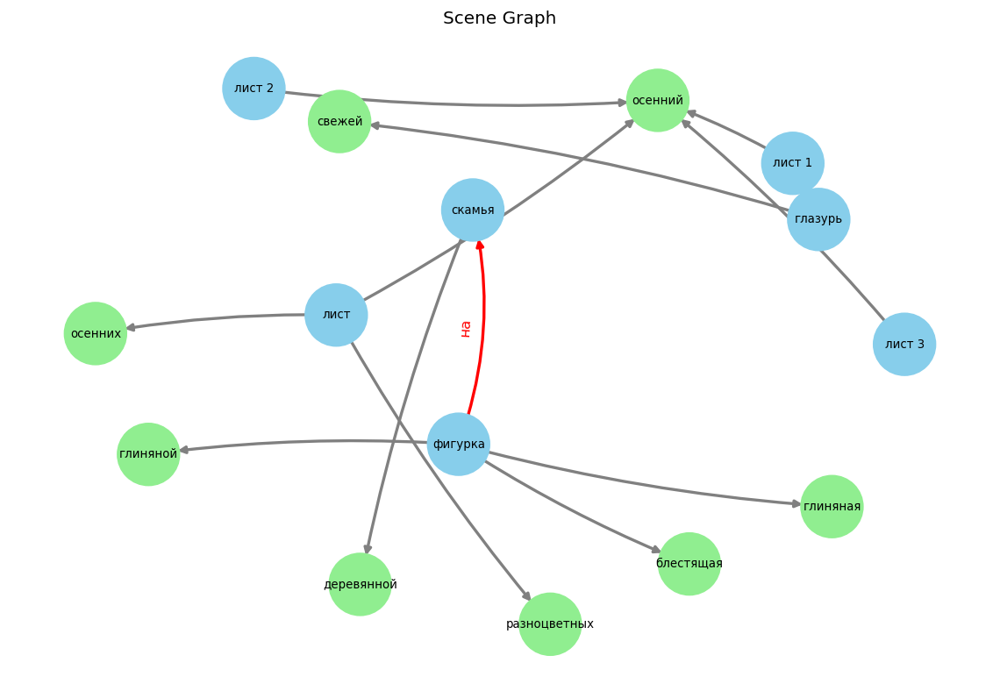


{"src_text": "На чердаке стоит большая старая сундук с потертостями. Рядом лежит старая медная шкатулка.", "norm_text": "На чердаке стоит большой старый сундук с потертостями. Рядом лежит старая медная шкатулка.", "objects": ["чердак", "сундук", "потертостями", "шкатулка"], "attributes": {"сундук": ["большой", "старый"], "шкатулка": ["медная", "старая"]}, "relations": [["сундук", "на", "чердак"]]}



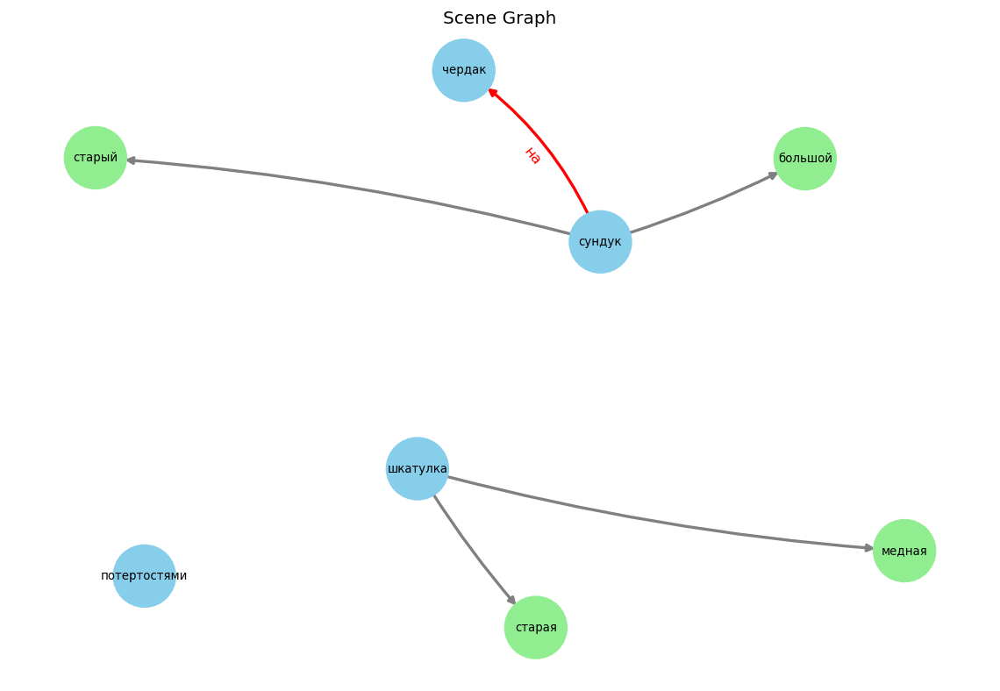


{"src_text": "На столике у окна стоит упаковка таблеток, аккуратно сложенная. Рядом лежит электронный термометр, слегка потрепанный, но рабочий. У стены стоит кресло с мягкой обивкой, немного поношенное. На подоконнике цветочный горшок, из которого выглядывает маленький кактус.", "norm_text": "На столике у окна стоит аккуратно сложенная упаковка таблеток. Рядом лежит слегка потрепанный, но рабочий электронный термометр. У стены стоит немного поношенное кресло с мягкой обивкой. На подоконнике находится цветочный горшок, из которого выглядывает маленький кактус.", "objects": ["столик", "окно", "упаковка", "таблетка", "термометр", "стена", "кресло", "обивка", "подоконник", "горшок", "кактус"], "attributes": {"термометр": ["рабочий", "слегка потрепанный", "электронный"], "кресло": ["немного поношенное"], "обивка": ["мягкой"], "горшок": ["цветочный"], "кактус": ["маленький"], "упаковка": ["аккуратно сложенная"]}, "relations": [["упаковка", "у", "окно"], ["горшок", "на", "подоконник"], ["кр

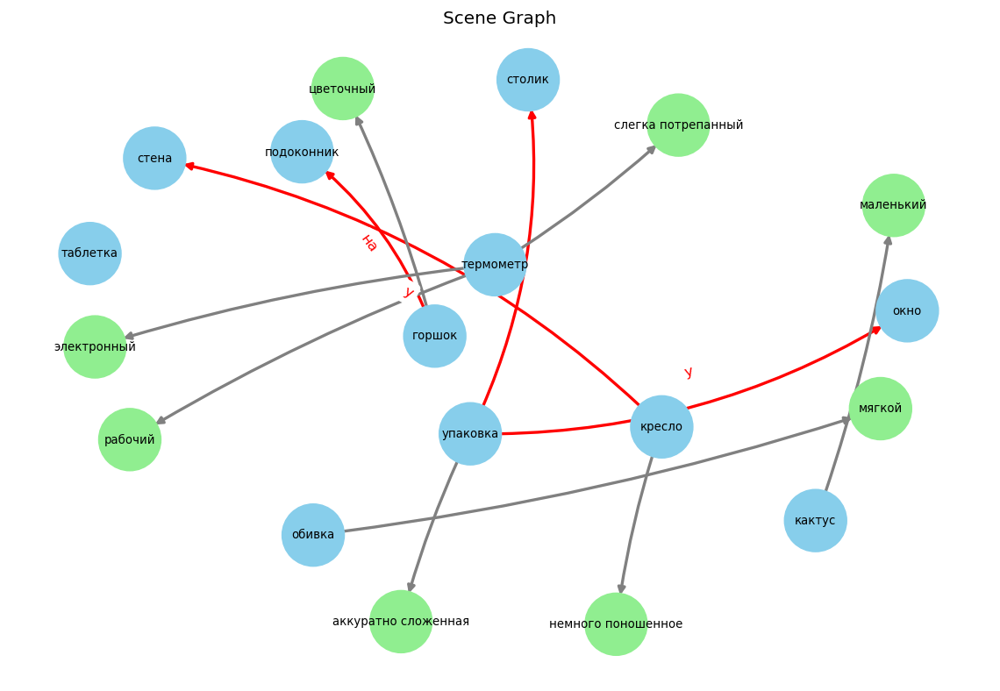


{"src_text": "На опушке стоит большая дубовая бочка, покрытая мхом и слегка накренившаяся. Рядом с ней несколько сухих веток и зеленые листья.", "norm_text": "На опушке стоит большая дубовая бочка, покрытая мхом и слегка накренившаяся. Рядом с бочкой лежат несколько сухих веток и зеленые листья.", "objects": ["опушка", "бочка", "мох", "ветка", "лист"], "attributes": {"бочка": ["большая", "дубовая", "покрытая мхом"], "ветка": ["сухих"], "лист": ["зеленые"]}, "relations": [["лист", "рядом с", "бочка"], ["ветка", "рядом с", "бочка"], ["бочка", "на", "опушка"]]}



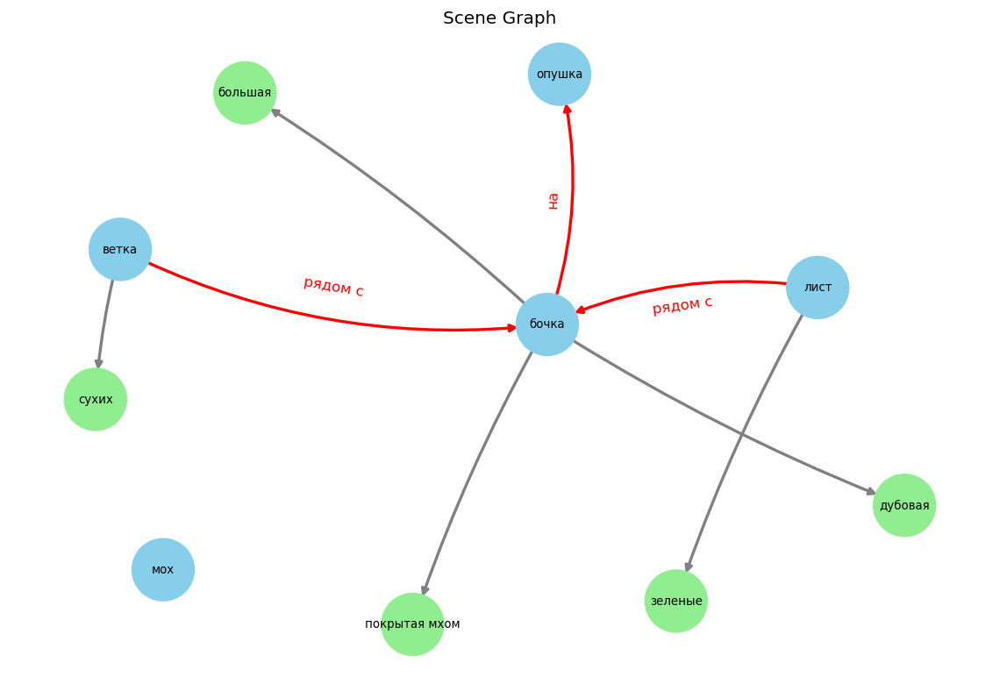


{"src_text": "На тропинке покоится потертая глиняная курильница с трещинами. Рядом блестит свежевылитая бронзовая фигура совы. У калитки стоит зеленый лейка с облупленным краской носиком.", "norm_text": "На тропинке покоится потертая глиняная курильница с трещинами. Рядом блестит свежевылитая бронзовая фигура совы. У калитки стоит зеленая лейка с облупленным краской носиком.", "objects": ["тропинка", "курильница", "трещина", "фигура", "сова", "калитка", "лейка", "краска", "носик"], "attributes": {"курильница": ["глиняная", "потертая"], "фигура": ["бронзовая", "свежевылитая"], "лейка": ["зеленая"], "краска": ["облупленным"]}, "relations": [["лейка", "у", "калитка"], ["курильница", "на", "тропинка"]]}



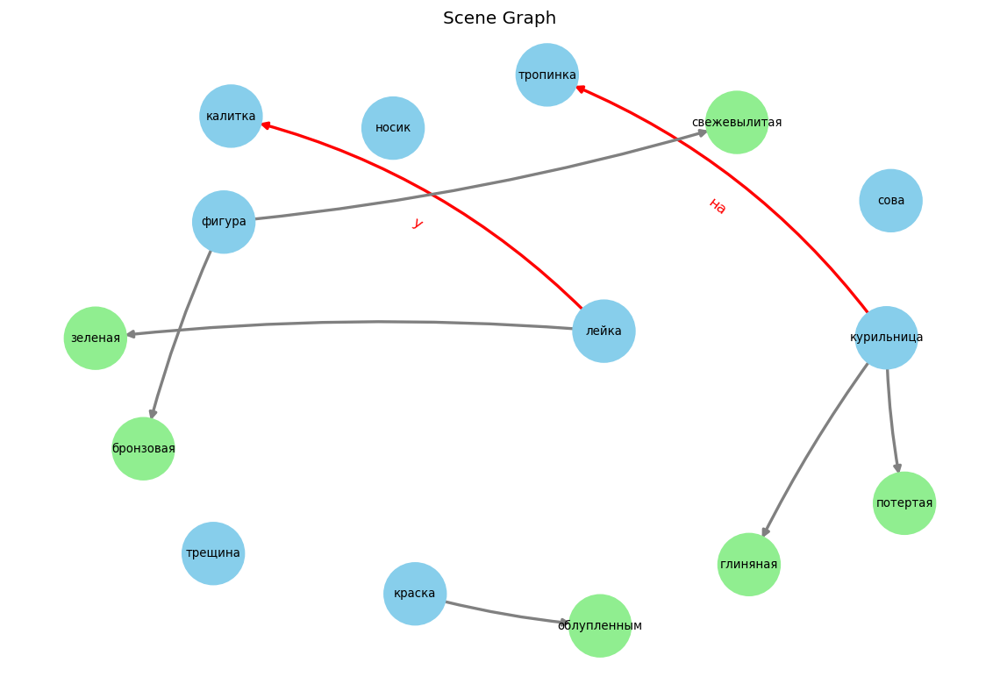


{"src_text": "На балконе стоит кашпо с увядающими цветами, слева от него зеленое ведро с водой.", "norm_text": "На балконе стоит кашпо с увядающими цветами, слева от кашпо — зелёное ведро с водой.", "objects": ["балкон", "кашпо", "цвет", "ведро", "вода"], "attributes": {"цвет": ["увядающими"], "ведро": ["зелёное"]}, "relations": [["кашпо", "на", "балкон"]]}



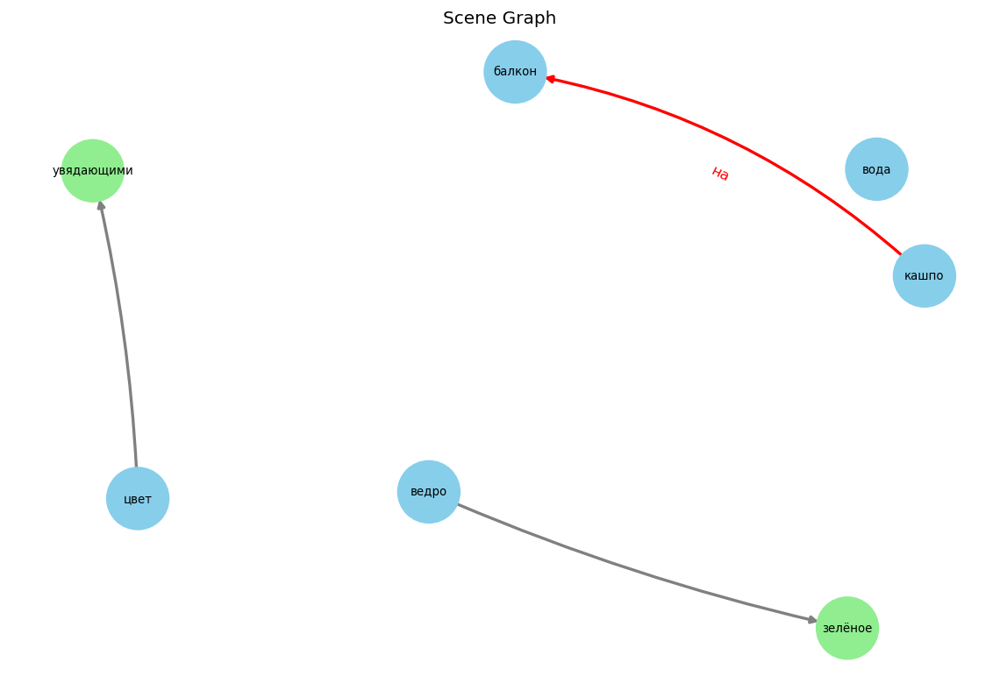


{"src_text": "На столе стоит тарелка, наполненная спелыми фруктами. Они выглядят свежими и аппетитными.", "norm_text": "На столе стоит тарелка, наполненная свежими аппетитными спелыми фруктами.", "objects": ["стол", "тарелка", "фрукт"], "attributes": {"фрукт": ["аппетитными", "свежими", "спелыми"], "тарелка": ["наполненная фруктами"]}, "relations": [["тарелка", "на", "стол"]]}



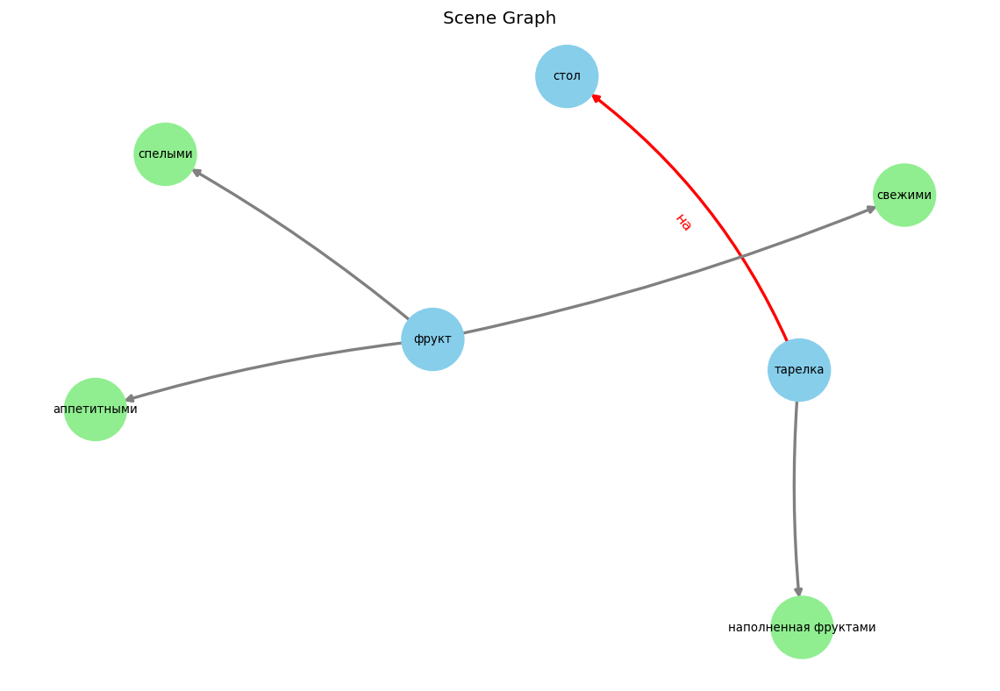


{"src_text": "На верстаке лежит гаечный ключ, большой и немного изношенный. В углу комнаты стоит картонная коробка, из которой выглядывает автомобильная шина, старая и пыльная. Напротив двери стоит красный ящик для инструментов, слегка потрепанный, но все еще прочный. Над ним полка с банками краски, одна перевернута и разлилась.", "norm_text": "На верстаке лежит большой немного изношенный гаечный ключ. В углу комнаты стоит картонная коробка, из которой выглядывает старая пыльная автомобильная шина. Напротив двери стоит красный слегка потрепанный, но все еще прочный ящик для инструментов. Над ящиком для инструментов находится полка с банками краски, одна из которых перевернута и разлилась.", "objects": ["верстак", "ключ", "угол", "комната", "коробка", "шина", "дверь", "ящик", "инструмент", "полка", "банк", "краска"], "attributes": {"ключ": ["большой", "гаечный", "немного изношенный"], "коробка": ["картонная"], "шина": ["автомобильная", "пыльная", "старая"], "ящик": ["еще прочный"]}, "r

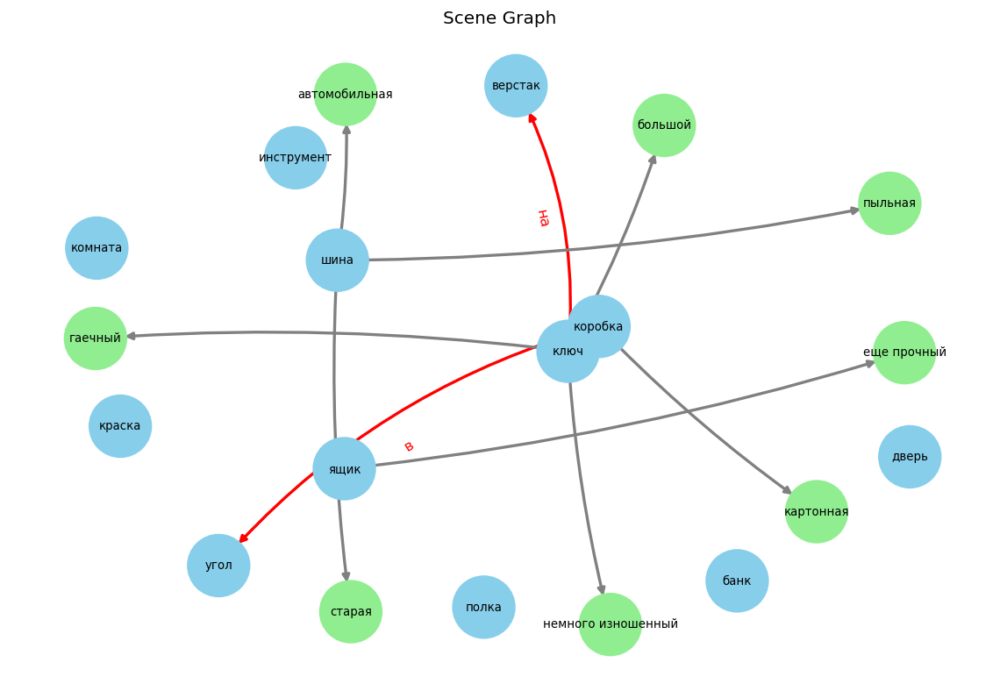


{"src_text": "На подоконнике стоит глиняный горшок с пышным фикусом. Листья растения блестят от недавнего полива.", "norm_text": "На подоконнике стоит глиняный горшок с пышным фикусом, листья которого блестящие от недавнего полива.", "objects": ["подоконник", "горшок", "фикус", "лист", "полив"], "attributes": {"горшок": ["глиняный"], "фикус": ["пышным"], "полив": ["недавнего"], "лист": ["блестящие"]}, "relations": [["горшок", "на", "подоконник"], ["лист", "от", "полив"]]}



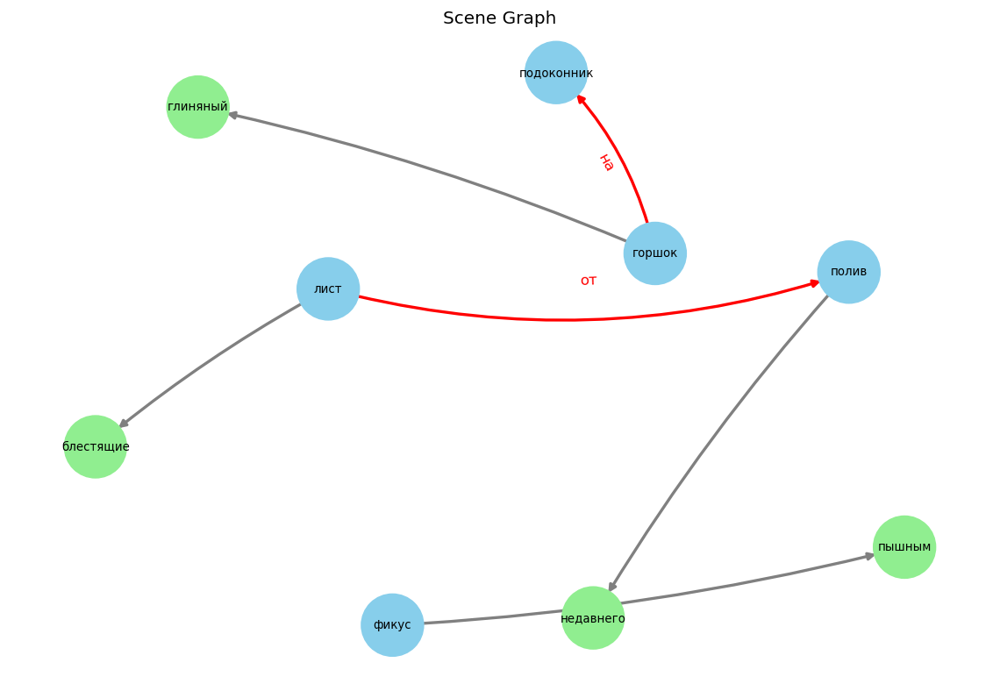


{"src_text": "На подоконнике красуется керамическая ваза, украшенная красочными узорами. Рядом расположена картина в деревянной рамке, слегка выцветшая от времени.", "norm_text": "На подоконнике красуется керамическая ваза, украшенная красочными узорами. Рядом расположена слегка выцветшая от времени картина в деревянной рамке.", "objects": ["подоконник", "ваза", "узор", "время", "картина", "рамка"], "attributes": {"ваза": ["керамическая", "украшенная узорами"], "узор": ["красочными"], "рамка": ["деревянной"], "картина": ["рядом расположена", "слегка выцветшая от времени"]}, "relations": [["ваза", "на", "подоконник"]]}



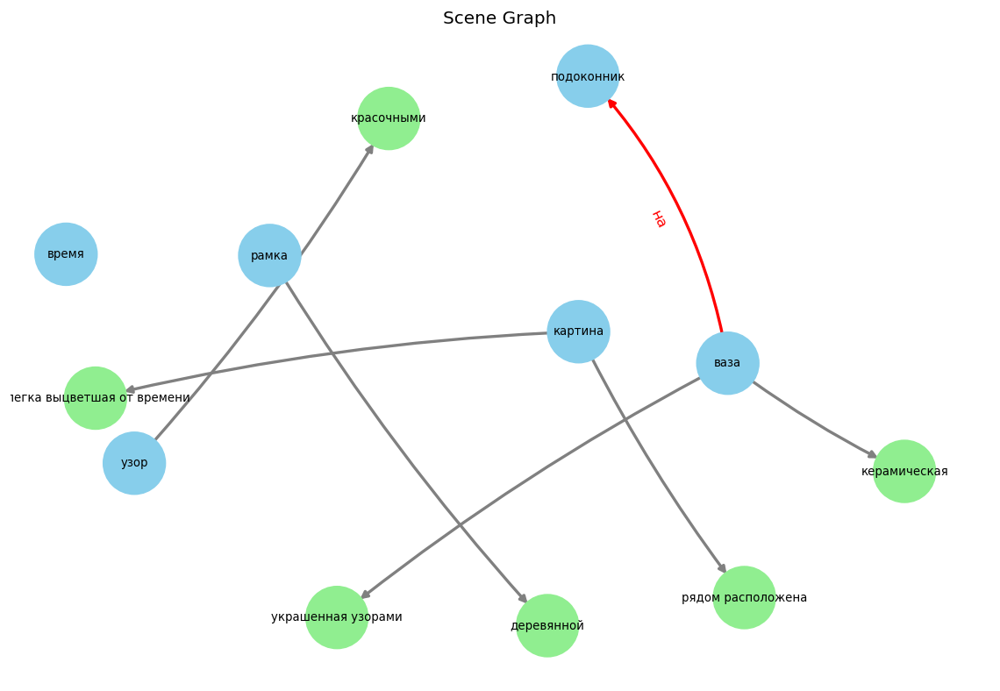


{"src_text": "На раковине стоит мыльница с оливковым мылом, слегка увлажненным. Рядом зубная щетка с голубой ручкой и стакан с зубной пастой.", "norm_text": "На раковине стоит мыльница с слегка увлажненным оливковым мылом. Рядом находится зубная щетка с голубой ручкой и стакан с зубной пастой.", "objects": ["раковина", "мыльница", "мылом", "щётка", "ручка", "стакан", "паста"], "attributes": {"мылом": ["оливковым", "слегка увлажненным"], "щётка": ["зубная"], "ручка": ["голубой"], "паста": ["зубной"]}, "relations": [["мыльница", "на", "раковина"]]}



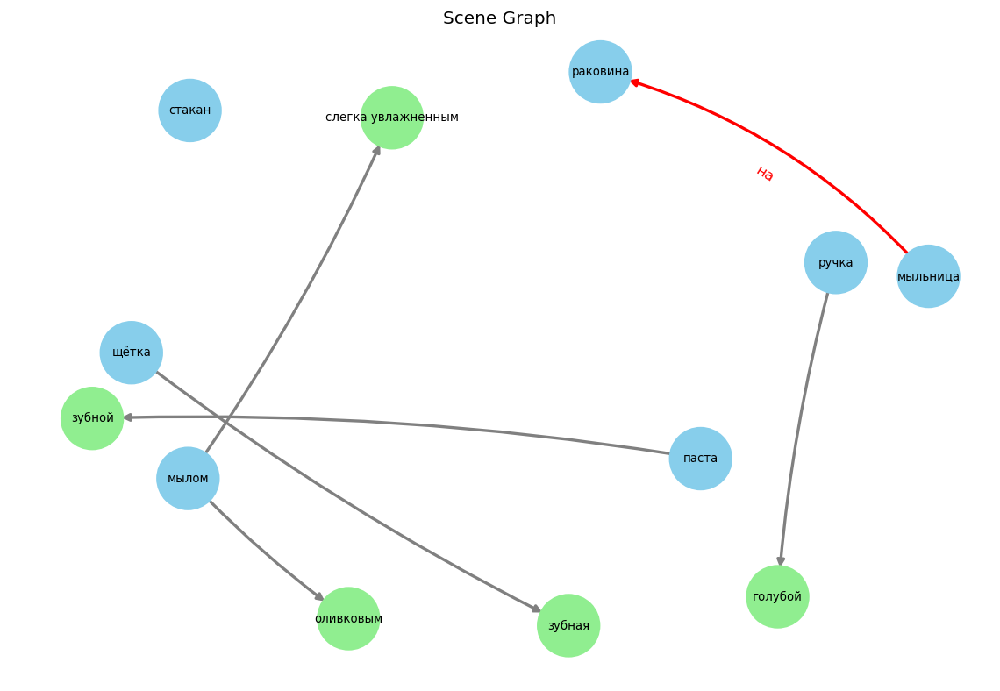


{"src_text": "На полке стоит старый чайник с отколотым носиком. Рядом с ним размещены три тарелки: одна с трещиной, другая с облупившейся краской и третья почти целая.", "norm_text": "На полке стоит старый чайник с отколотым носиком. Рядом с чайником размещены тарелка 1 с трещиной, тарелка 2 с облупившейся краской и почти целая тарелка 3.", "objects": ["полка", "чайник", "носик", "тарелка 1", "трещина", "тарелка 2", "краска", "тарелка 3"], "attributes": {"чайник": ["старый"], "носик": ["отколотым"], "краска": ["облупившейся"], "тарелка 3": ["почти целая"]}, "relations": []}



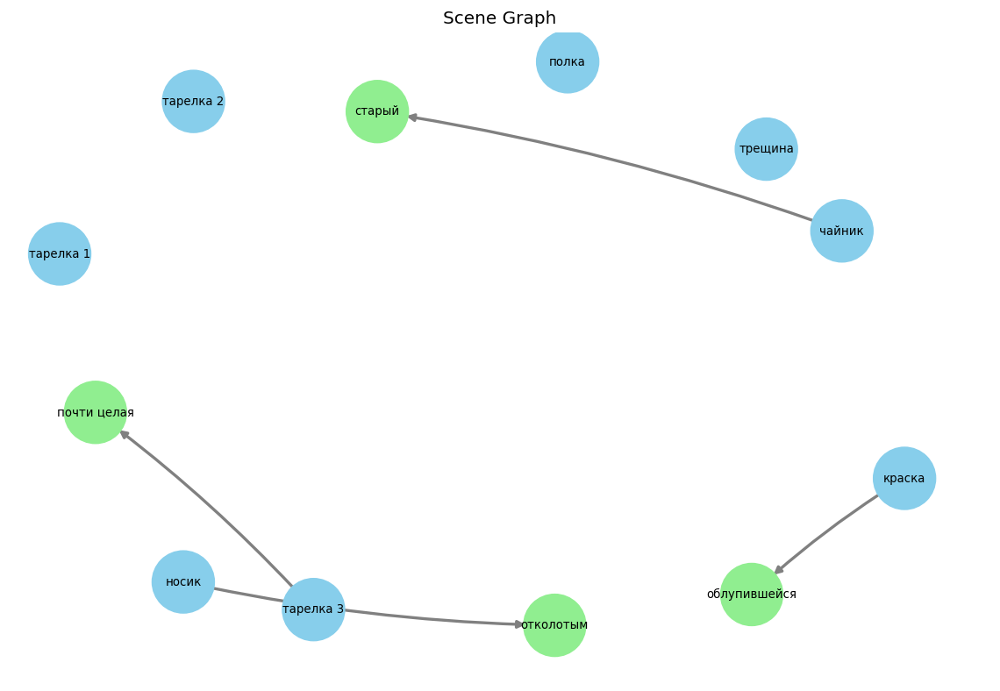


{"src_text": "Большой цветочный горшок с яркими розами стоит на перилах балкона. На полу аккуратно сложены шланг и старая садовая лейка.", "norm_text": "Большой цветочный горшок с яркими розами стоит на перилах балкона. На полу аккуратно сложены шланг и старая садовая лейка.", "objects": ["горшок", "розами", "перилах", "балкон", "пол", "шланг", "лейка"], "attributes": {"горшок": ["большой", "цветочный"], "розами": ["яркими"], "лейка": ["садовая", "старая"]}, "relations": [["горшок", "на", "перилах"]]}



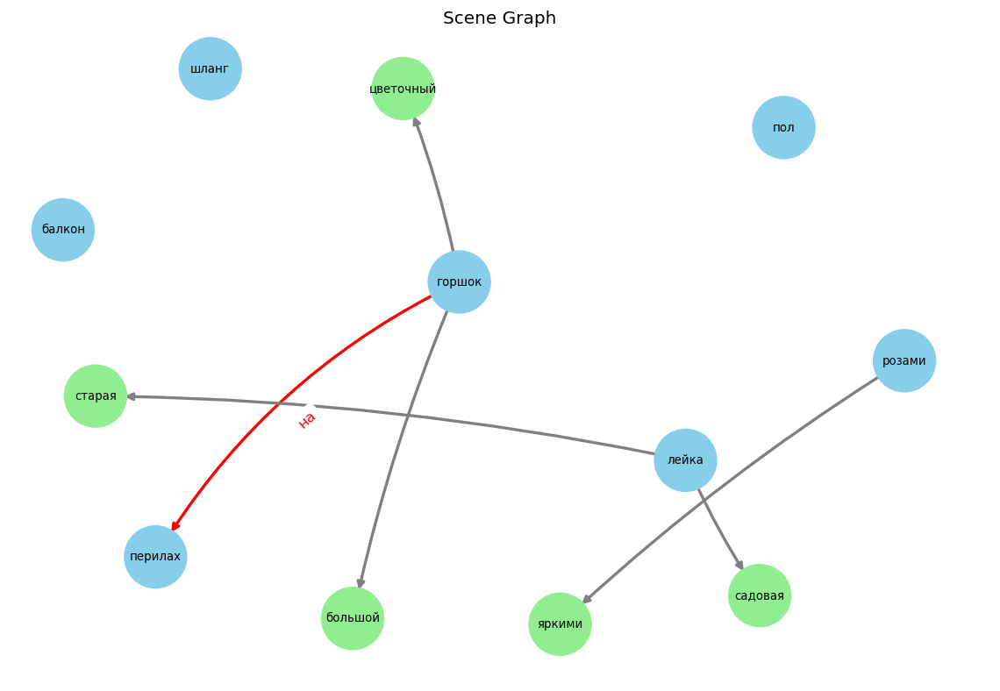


{"src_text": "На столе лежит карта, она большая и слегка изношена. Рядом стоит компас, его латунный корпус сияет в свете лампы.", "norm_text": "На столе лежит большая слегка изношенная карта. Рядом стоит компас с сияющим латунным корпусом в свете лампы.", "objects": ["стол", "карта", "компас", "корпус", "свет", "лампа"], "attributes": {"карта": ["большая", "слегка изношенная"], "корпус": ["латунным", "сияющим"]}, "relations": [["карта", "на", "стол"]]}



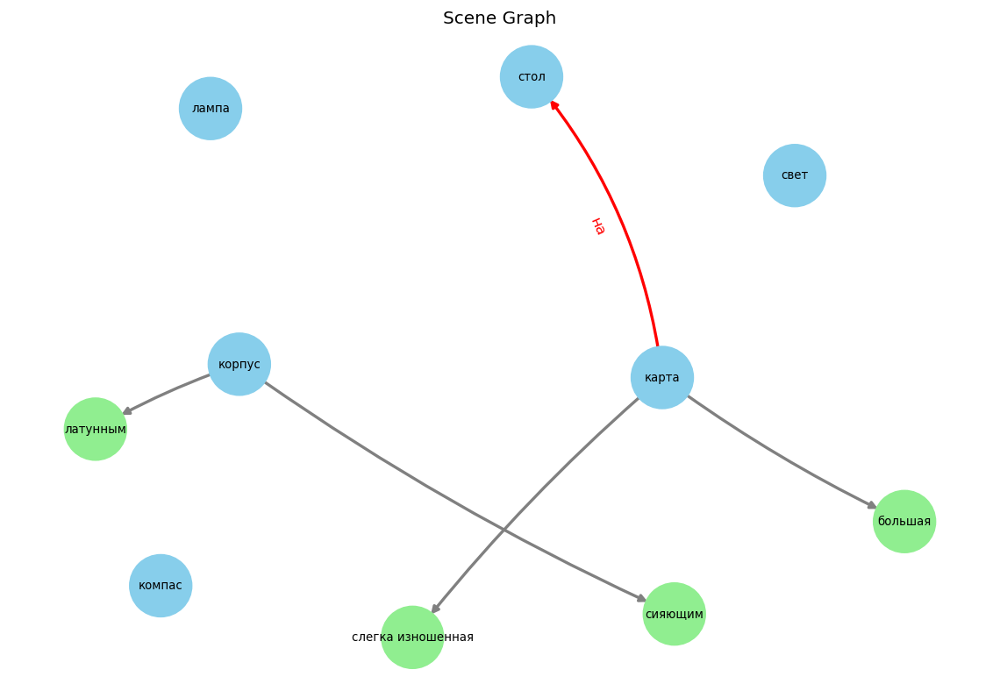


{"src_text": "На столике у кровати стоит монитор, современный и гладкий. Кабель аккуратно спущен вниз.", "norm_text": "На столике у кровати стоит современный гладкий монитор. Кабель аккуратно спущен вниз.", "objects": ["столик", "кровать", "монитор", "кабель"], "attributes": {"монитор": ["гладкий", "современный"]}, "relations": [["монитор", "на", "столик"], ["монитор", "у", "кровать"]]}



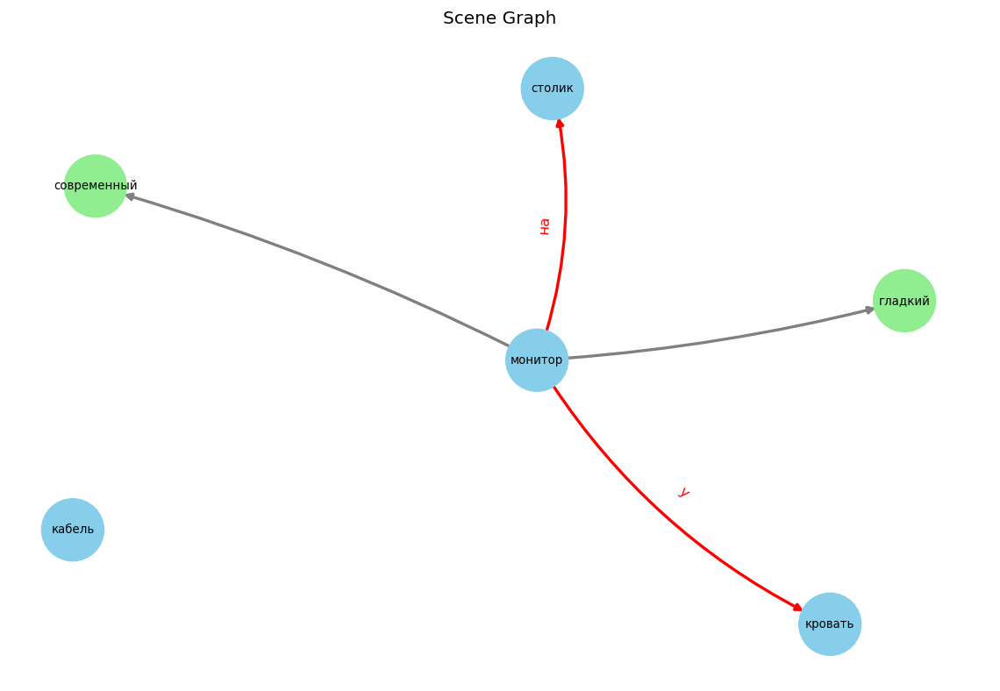


{"src_text": "На чердаке стоит короб с крышкой, потрепанный и запылённый, около лестницы.", "norm_text": "На чердаке, около лестницы, стоит потрёпанный запылённый короб с крышкой.", "objects": ["чердак", "лестница", "короб", "крышка"], "attributes": {"короб": ["запылённый", "потрёпанный"]}, "relations": [["короб", "на", "лестница"], ["короб", "на", "чердак"]]}



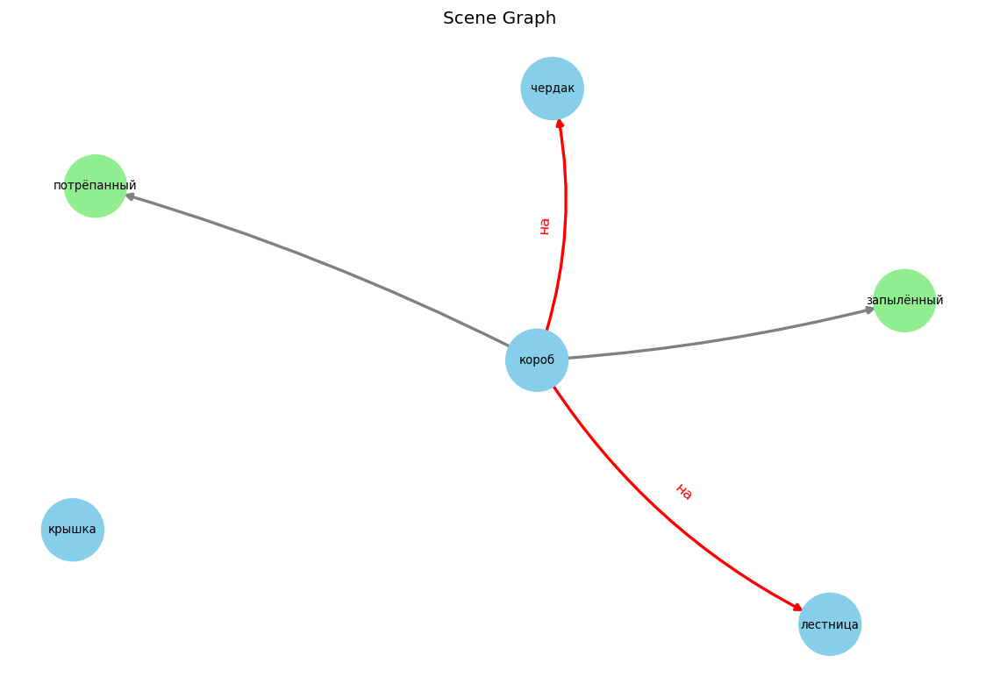


{"src_text": "На крючке висит коричневая кожаная куртка с потертостями. Под ней пара грязных рабочих ботинок.", "norm_text": "На крючке висит коричневая кожаная куртка с потертостями. Под курткой находится пара грязных рабочих ботинок.", "objects": ["крючок", "куртка", "потертостями", "пара", "ботинок"], "attributes": {"куртка": ["кожаная", "коричневая"], "ботинок": ["грязных", "рабочих"]}, "relations": [["пара", "под", "куртка"], ["куртка", "на", "крючок"]]}



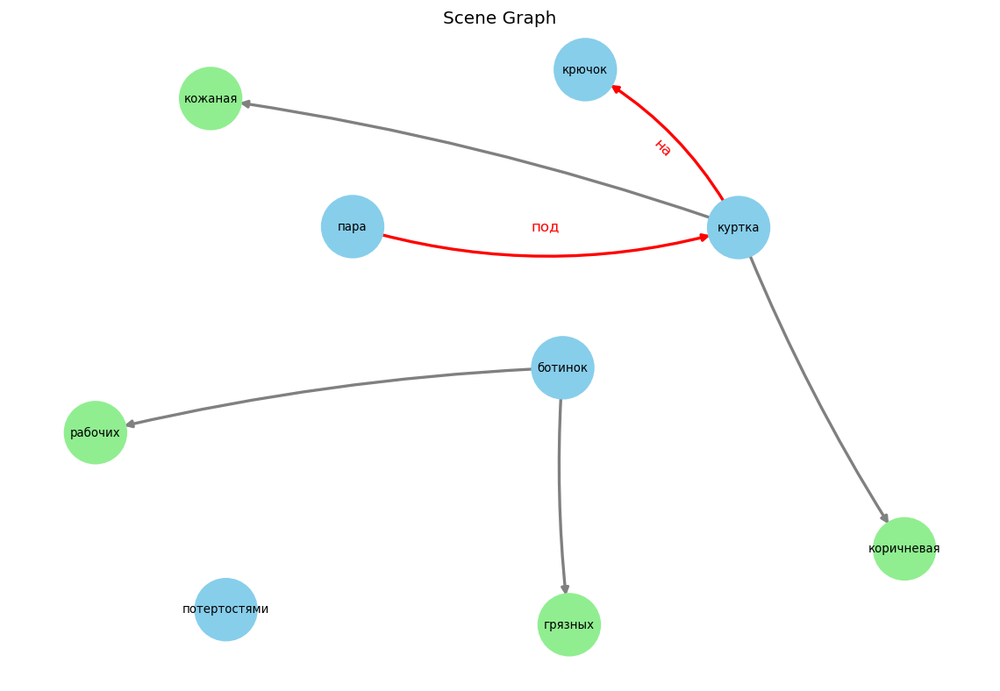


{"src_text": "Медицинская тележка с зелёным покрытием и металлическими ножками стоит около койки. Рядышком размещён прибор для измерения давления, старый, но исправный. На подоконнике трехцветный цветок в керамическом горшке с трещиной.", "norm_text": "Медицинская тележка с зелёным покрытием и металлическими ножками стоит около койки. Рядышком размещён старый исправный прибор для измерения давления. На подоконнике стоит трехцветный цветок в керамическом горшке с трещиной.", "objects": ["тележка", "покрытие", "ножками", "койка", "рядышком", "прибор", "измерение", "давление", "подоконник", "цветок", "горшок", "трещина"], "attributes": {"тележка": ["медицинская"], "покрытие": ["зелёным"], "ножками": ["металлическими"], "прибор": ["исправный", "старый"], "цветок": ["трехцветный"], "горшок": ["керамическом"]}, "relations": [["цветок", "на", "подоконник"], ["тележка", "около", "койка"]]}



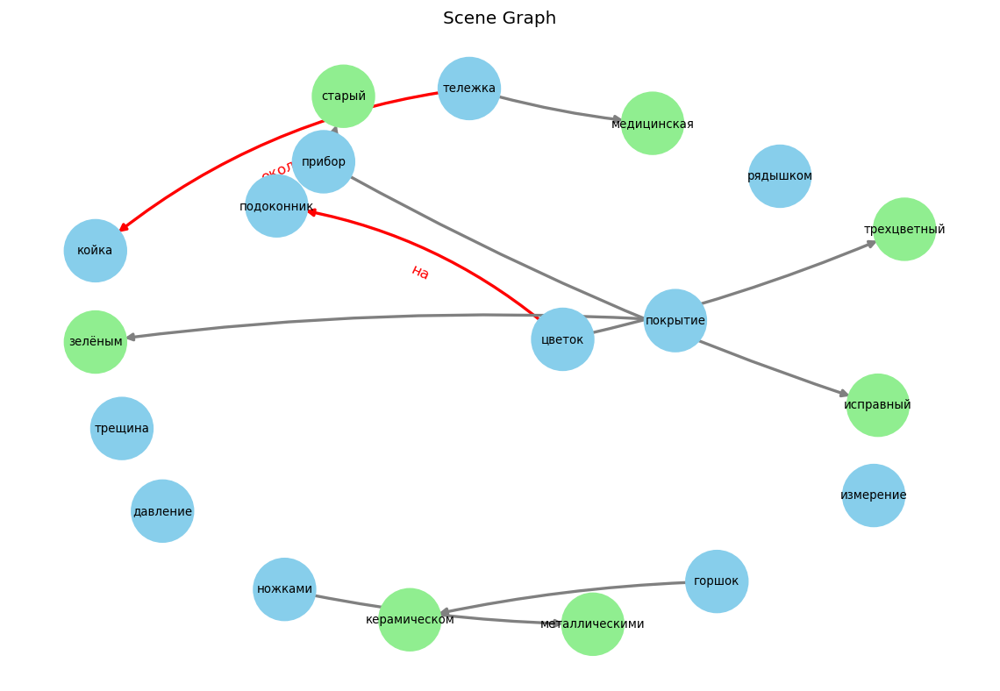


{"src_text": "На подоконнике стоят три горшка с цветами: один с зелеными листьями, другой с красными цветами, третий с белыми бутонами. Справа от них лежит белый лист бумаги.", "norm_text": "На подоконнике стоят горшок 1 с зелеными листьями, горшок 2 с красными цветами и горшок 3 с белыми бутонами. Справа от горшков лежит белый лист бумаги.", "objects": ["подоконник", "горшок 1", "лист", "горшок 2", "цвет", "горшок 3", "бутон", "горшок", "бумага"], "attributes": {"лист": ["белый", "зелеными"], "цвет": ["красными"], "бутон": ["белыми"]}, "relations": [["горшок 2", "на", "подоконник"], ["горшок 1", "на", "подоконник"], ["горшок 3", "на", "подоконник"]]}



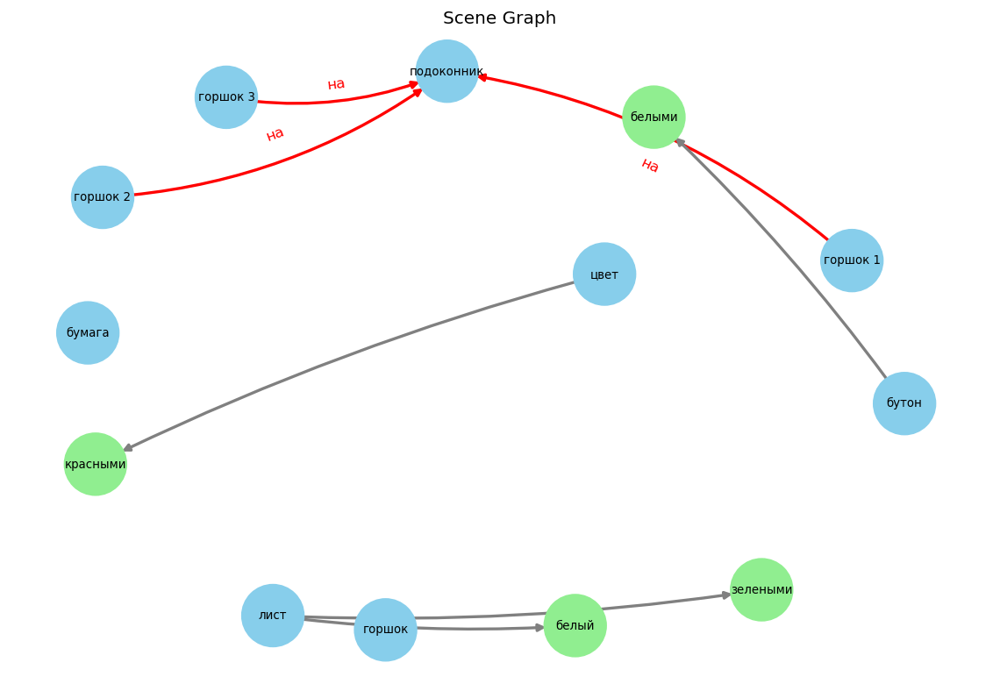


{"src_text": "На полке стоит керамическая тарелка с синим узором, немного потрепанная временем. Она аккуратно размещена между двумя книгами.", "norm_text": "На полке стоит аккуратно размещенная между двумя книгами керамическая тарелка с синим узором, немного потрепанная временем.", "objects": ["полка", "книга", "тарелка", "узор", "время"], "attributes": {"тарелка": ["аккуратно размещенная между книгами", "керамическая", "немного потрепанная временем"], "узор": ["синим"]}, "relations": []}



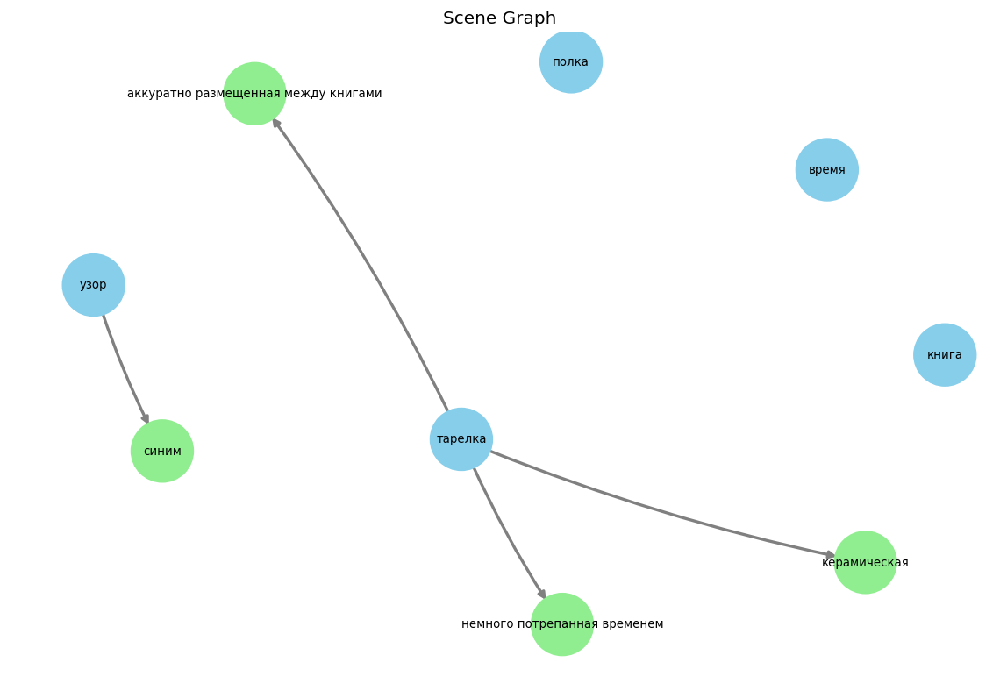


{"src_text": "На полу в классе лежат карандаши: короткий и длинный. Рядом с ними покоится мятая бумажка.", "norm_text": "На полу в классе лежат короткий карандаш 1 и длинный карандаш 2. Рядом с карандашами покоится мятая бумажка.", "objects": ["пол", "класс", "карандаш 1", "карандаш 2", "карандашами", "бумажка"], "attributes": {"бумажка": ["мятая"], "карандаш 1": ["короткий"], "карандаш 2": ["длинный"]}, "relations": [["карандаш 1", "в", "класс"], ["карандаш 1", "на", "пол"], ["бумажка", "рядом с", "карандашами"]]}



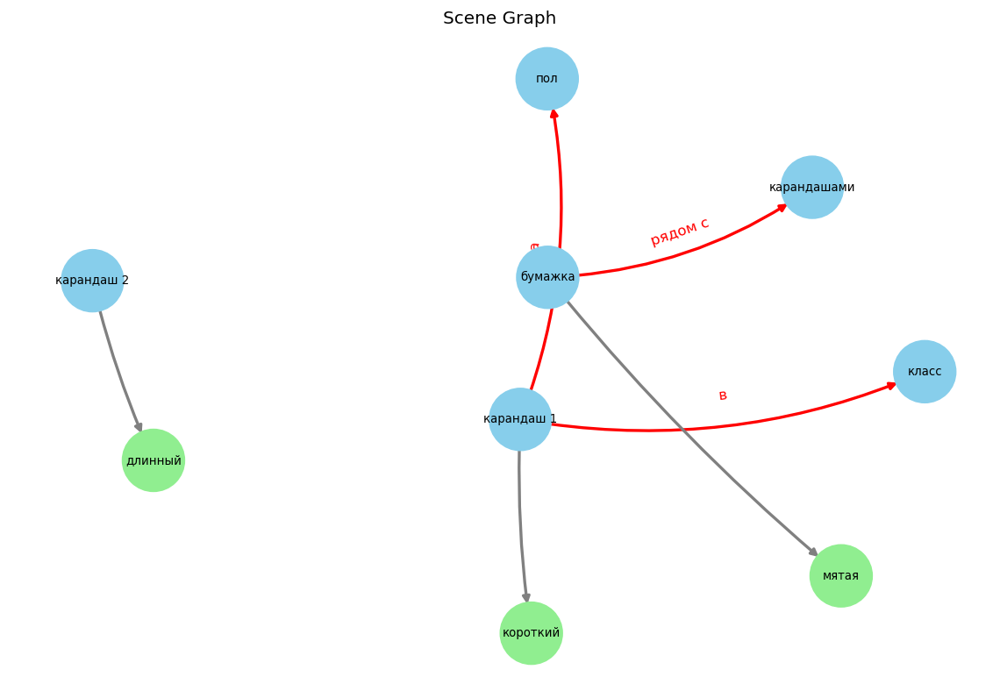


{"src_text": "На полке стоит коробка с игрушками. Под ней находится старый чемодан.", "norm_text": "На полке стоит коробка с игрушками. Под коробкой находится старый чемодан.", "objects": ["полка", "коробка", "игрушка", "чемодан"], "attributes": {"чемодан": ["старый"]}, "relations": [["чемодан", "под", "коробка"]]}



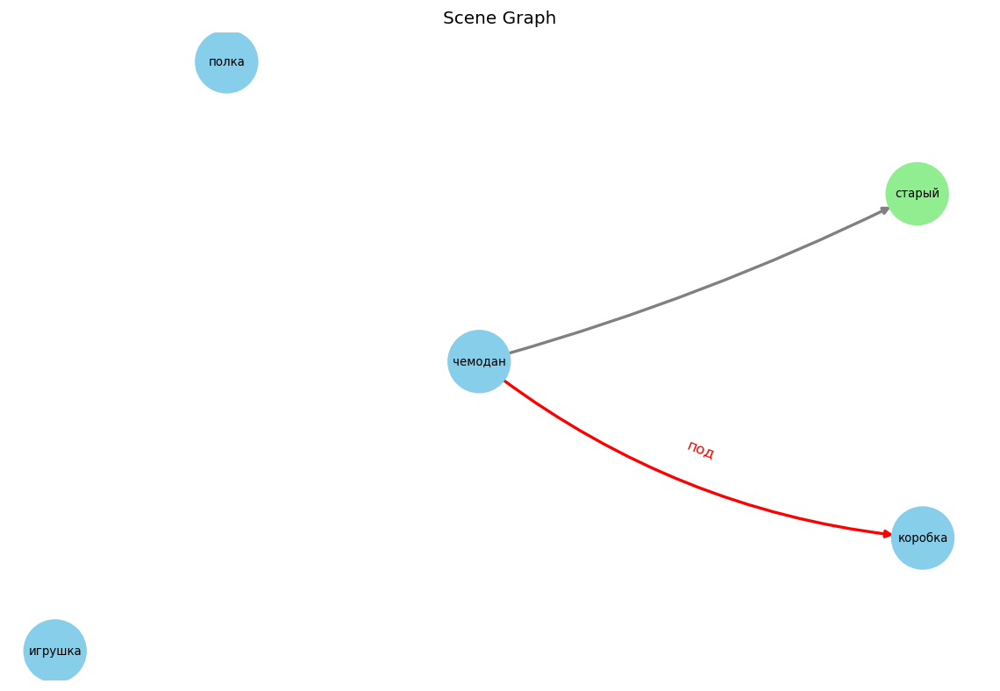


{"src_text": "На диване лежит плюшевый медведь, пушистый и голубой. Рядом стоит велосипед с блестящей рамой.", "norm_text": "На диване лежит пушистый голубой плюшевый медведь. Рядом стоит велосипед с блестящей рамой.", "objects": ["диван", "медведь", "велосипед", "рама"], "attributes": {"медведь": ["голубой", "плюшевый", "пушистый"], "рама": ["блестящей"]}, "relations": [["медведь", "на", "диван"]]}



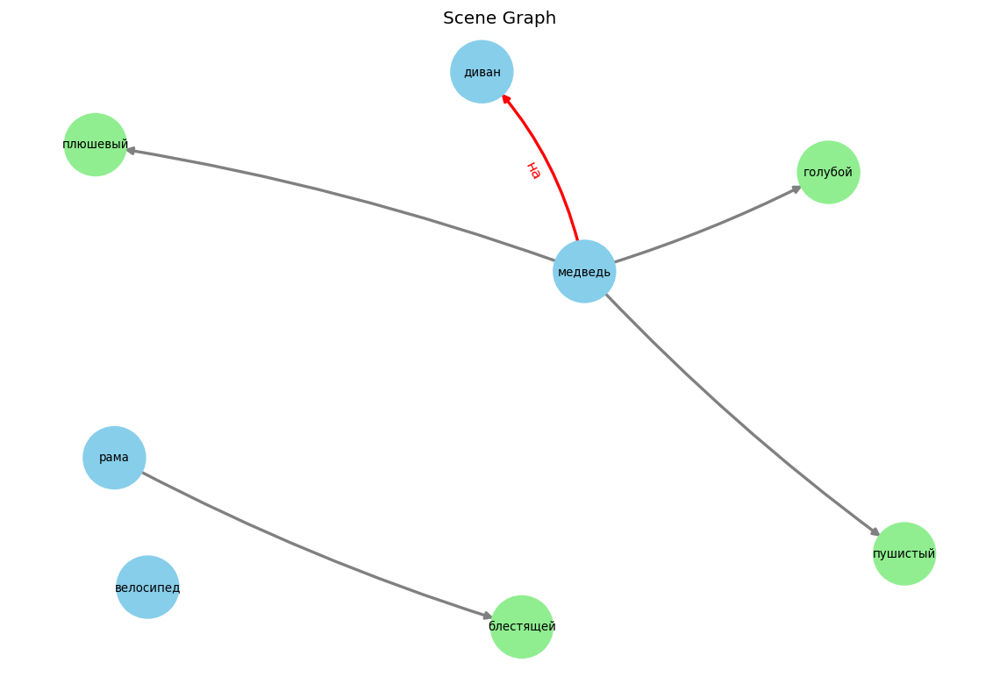


{"src_text": "На барной стойке стоят три стакана: один высокий и прозрачный, другой окрашен в золотистый цвет, третий - низкий с рисунком. Каждый стакан сияет в вечернем освещении.", "norm_text": "На барной стойке стоят высокий прозрачный стакан 1, золотистый стакан 2 и низкий стакан 3 с рисунком. Каждый стакан сияет в вечернем освещении.", "objects": ["стойка", "стакан 1", "стакан 2", "стакан 3", "рисунок", "стакан", "освещение"], "attributes": {"стойка": ["барной"], "стакан": ["высокий", "золотистый", "низкий", "прозрачный"], "освещение": ["вечернем"], "стакан 1": ["высокий", "прозрачный"], "стакан 2": ["золотистый"], "стакан 3": ["низкий"]}, "relations": [["стакан 3", "на", "стойка"], ["стакан 1", "на", "стойка"], ["стакан 2", "на", "стойка"], ["стакан", "в", "освещение"]]}



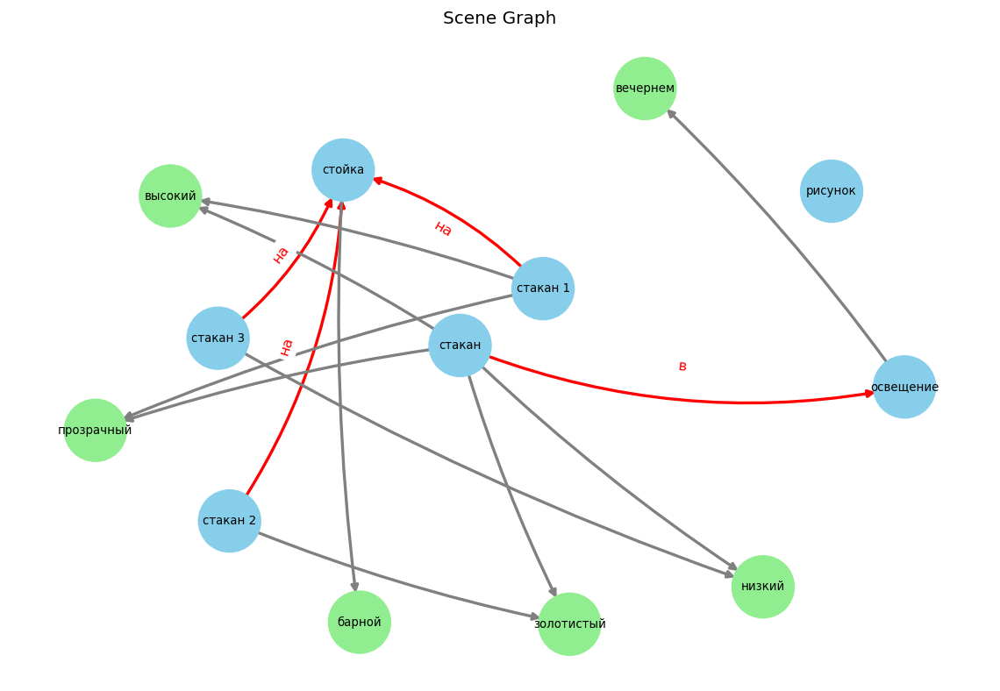


{"src_text": "Рядом с лавочкой стоит садовая лейка, зеленая и полуполная. За ней замечен белый камень небольшой формы. Слева виден фонарик, современный и работающий.", "norm_text": "Рядом с лавочкой стоит зелёная полуполная садовая лейка. За лейкой замечен небольшой белый камень. Слева виден современный работающий фонарик.", "objects": ["лавочка", "лейка", "камень", "фонарик"], "attributes": {"лейка": ["зелёная", "полуполная", "садовая"], "камень": ["белый", "небольшой"], "фонарик": ["работающий", "слева виден", "современный"]}, "relations": [["лейка", "рядом с", "лавочка"]]}



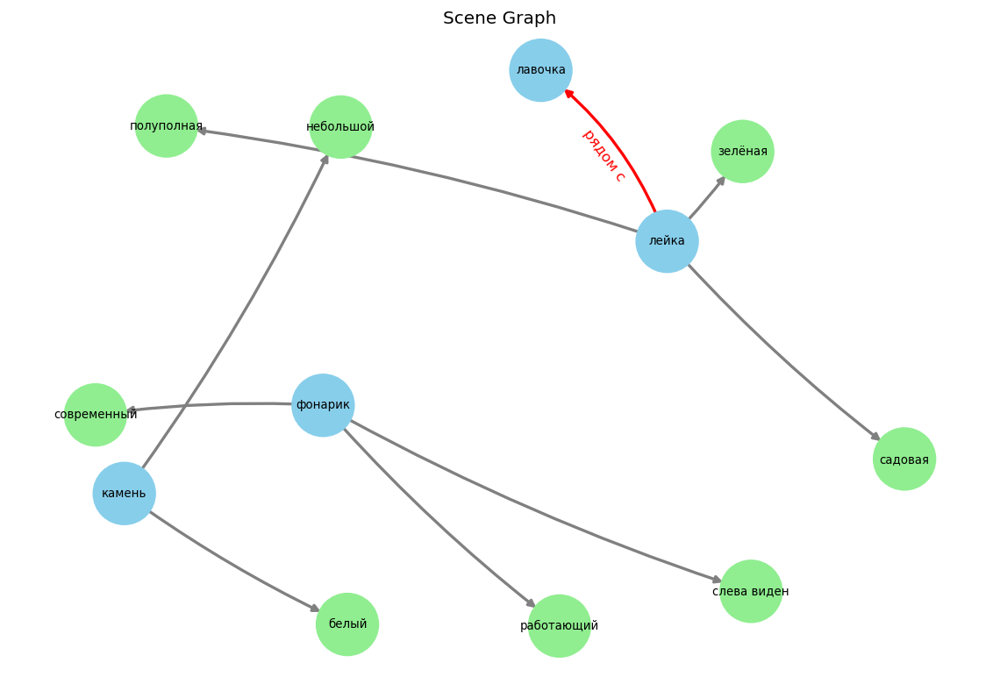


{"src_text": "На подставке стоит горшок с пышным фикусом. Около него — садовый гном с облупившейся краской и керамическая лягушка.", "norm_text": "На подставке стоит горшок с пышным фикусом. Около горшка с фикусом — садовый гном с облупившейся краской и керамическая лягушка.", "objects": ["подставка", "горшок", "фикус", "гном", "краска", "лягушка"], "attributes": {"фикус": ["пышным"], "гном": ["садовый"], "краска": ["облупившейся"], "лягушка": ["керамическая"]}, "relations": [["горшок", "на", "подставка"]]}



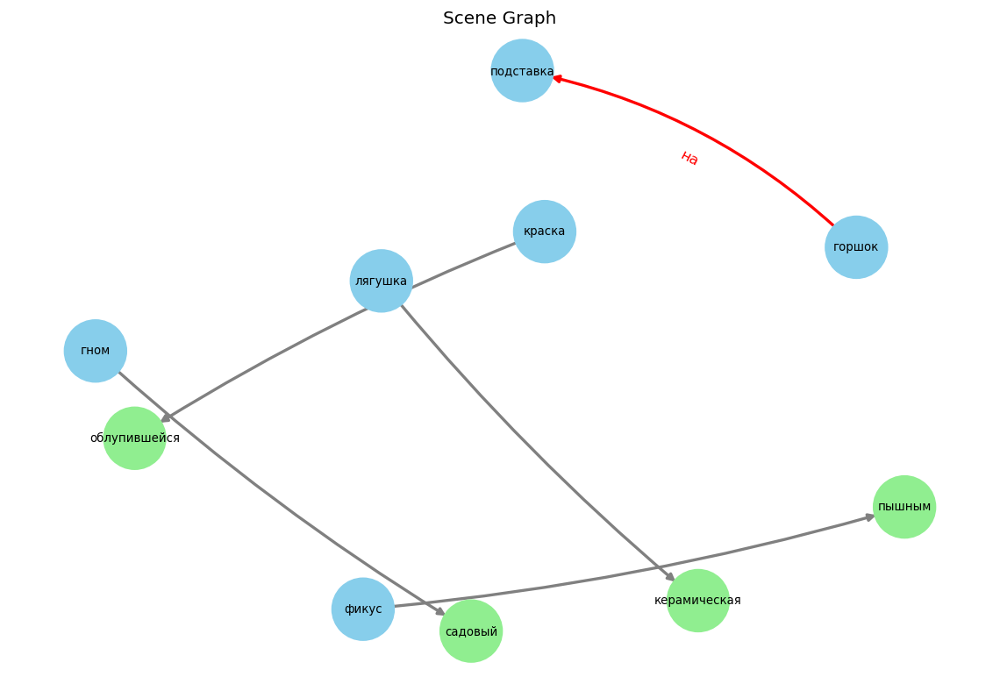


{"src_text": "На клумбе растут три цветка: розовый, фиолетовый и оранжевый. Возле них стоит металлическая лейка.", "norm_text": "На клумбе растут розовый цветок 1, фиолетовый цветок 2 и оранжевый цветок 3. Возле цветка 1, цветка 2 и цветка 3 стоит металлическая лейка.", "objects": ["клумба", "цветок 1", "цветок 2", "цветок 3", "лейка"], "attributes": {"лейка": ["металлическая"], "цветок 1": ["розовый"], "цветок 2": ["фиолетовый"], "цветок 3": ["оранжевый"]}, "relations": [["цветок 3", "на", "клумба"], ["цветок 2", "на", "клумба"], ["лейка", "возле", "цветок 1"], ["цветок 1", "на", "клумба"], ["лейка", "возле", "цветок 2"], ["лейка", "возле", "цветок 3"]]}



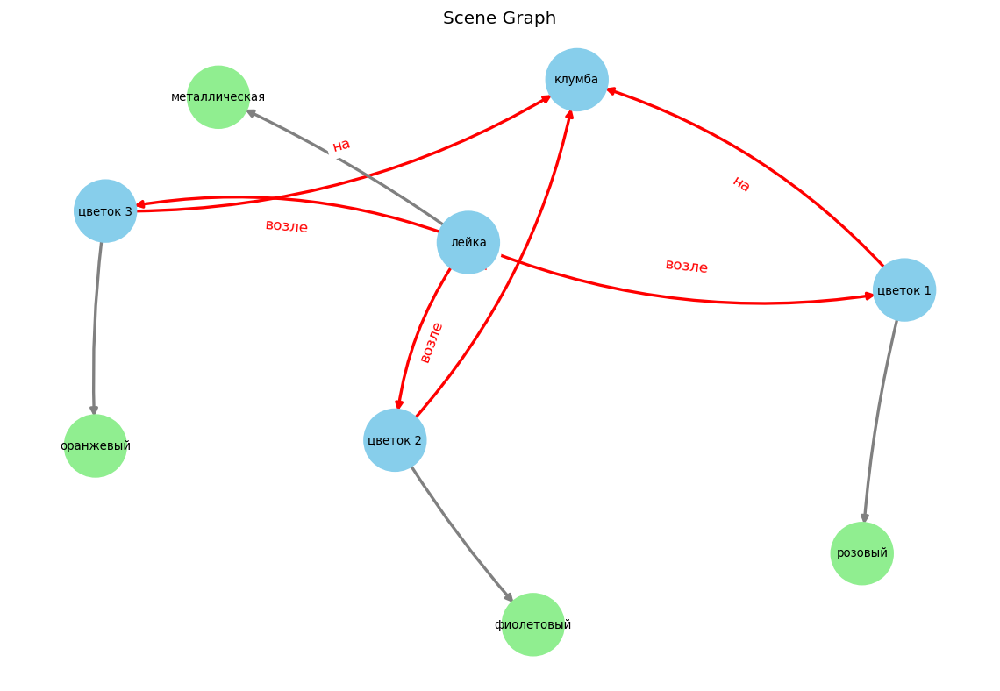


{"src_text": "На стуле оставлен зеленый зонт, слегка согнутый. Рядом на полу стоит картонная коробка, пустая.", "norm_text": "На стуле оставлен слегка согнутый зеленый зонт. Рядом на полу стоит пустая картонная коробка.", "objects": ["стул", "зонт", "пол", "коробка"], "attributes": {"зонт": ["зеленый", "слегка согнутый"], "коробка": ["картонная", "пустая"]}, "relations": [["коробка", "на", "пол"]]}



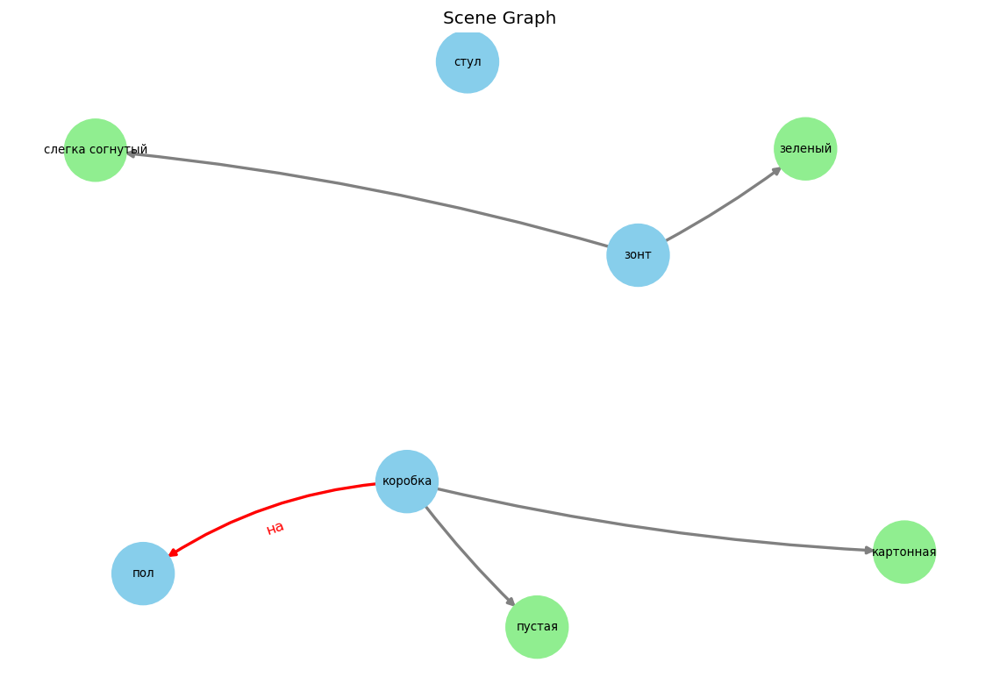


{"src_text": "На полке стоят четыре флакона: высокий прозрачный, низкий зелёного оттенка, средний с синим колпачком и маленький белого цвета. Все флаконы выглядят аккуратно расставленными.", "norm_text": "На полке стоят аккуратно расставленные высокий прозрачный флакон 1, низкий зелёного оттенка флакон 2, средний флакон 3 с синим колпачком и маленький белого цвета флакон 4.", "objects": ["полка", "флакон 1", "оттенок", "флакон 2", "флакон 3", "колпачок", "цвет", "флакон 4"], "attributes": {"флакон 1": ["аккуратно расставленные", "высокий", "прозрачный"], "оттенок": ["зелёного", "низкий"], "колпачок": ["синим"], "цвет": ["белого", "маленький"], "флакон 3": ["средний"]}, "relations": []}



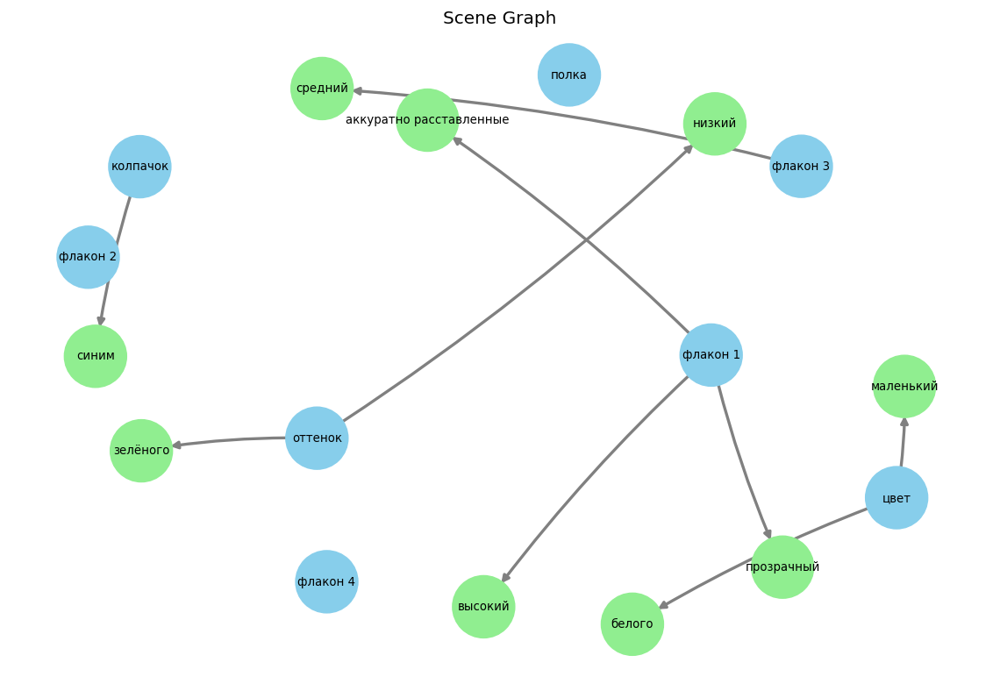


{"src_text": "На тумбе стоит цветная лампа, под ней три разноцветные папки, аккуратно сложенные одна на другой. Рядом с ними лежит коробка с медикаментами, немного помятая.", "norm_text": "На тумбе стоит цветная лампа, под лампой аккуратно сложены разноцветные папки 1, 2 и 3 одна на другой. Рядом с папками лежит немного помятая коробка с медикаментами.", "objects": ["тумба", "лампа", "папка 1", "папка", "коробка", "медикамент"], "attributes": {"лампа": ["цветная"], "папка": ["разноцветные"], "коробка": ["немного помятая"], "папка 1": ["разноцветные"]}, "relations": [["коробка", "рядом с", "папка"], ["лампа", "на", "тумба"]]}



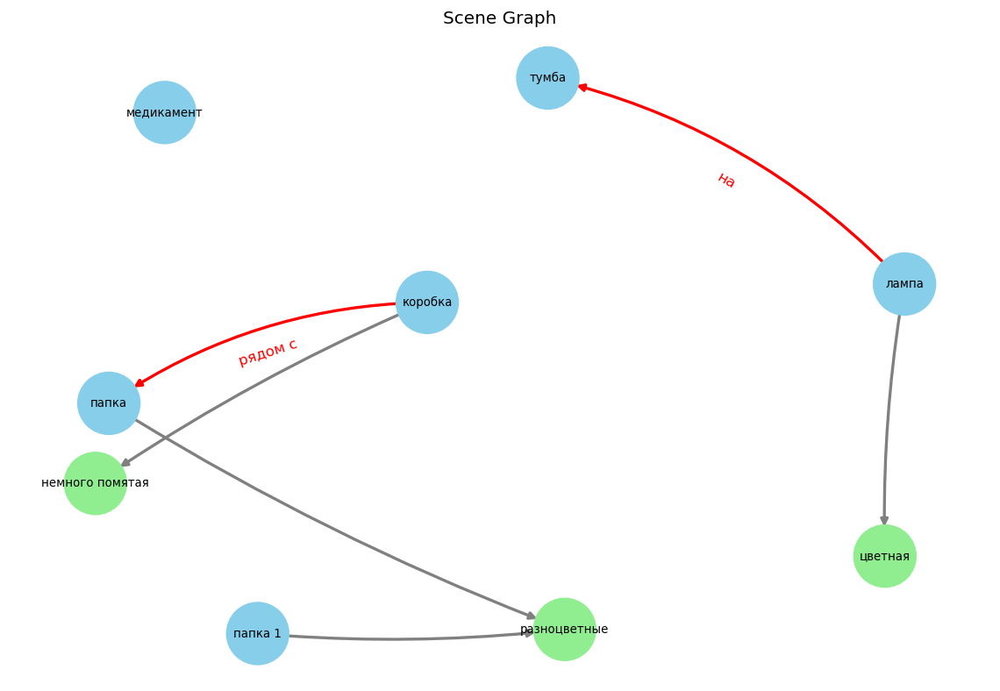


{"src_text": "На берегу сверкает гладкая ракушка, издалека виднеется красный зонтик. Под зонтиком расположились потертая плетеная корзина и солнечные очки.", "norm_text": "На берегу сверкает гладкая ракушка, издалека виднеется красный зонтик. Под зонтиком расположились потертая плетеная корзина и солнечные очки.", "objects": ["берег", "ракушка", "зонтик", "корзина", "очки"], "attributes": {"ракушка": ["гладкая"], "зонтик": ["красный"], "корзина": ["плетеная", "потертая"], "очки": ["солнечные"]}, "relations": [["ракушка", "на", "берег"], ["корзина", "под", "зонтик"], ["очки", "под", "зонтик"]]}



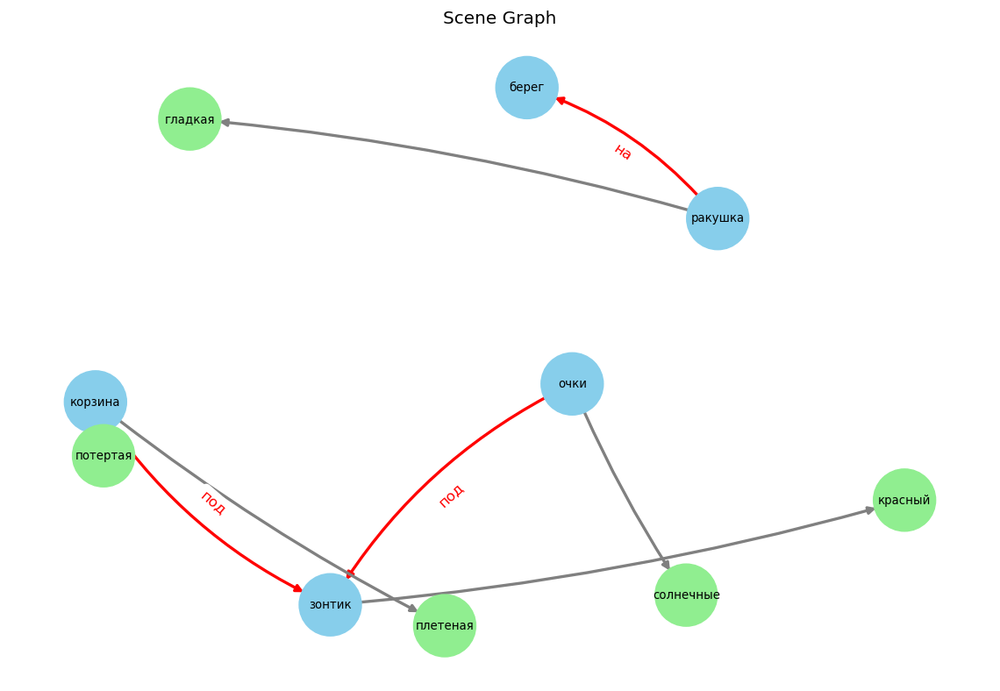


{"src_text": "На столе стоят три тарелки: одна с цветочным узором и трещиной, другая гладкая и блестящая, третья с завитками по краям. Они аккуратно выстроены в ряд.", "norm_text": "На столе стоят три тарелки: тарелка 1 с цветочным узором и трещиной, гладкая блестящая тарелка 2 и тарелка 3 с завитками по краям. Тарелки аккуратно выстроены в ряд.", "objects": ["стол", "тарелка", "тарелка 1", "узор", "трещина", "тарелка 2", "тарелка 3", "завиток", "край", "ряд"], "attributes": {"узор": ["цветочным"], "тарелка": ["блестящая", "гладкая"], "тарелка 2": ["блестящая", "гладкая"]}, "relations": [["тарелка", "на", "стол"]]}



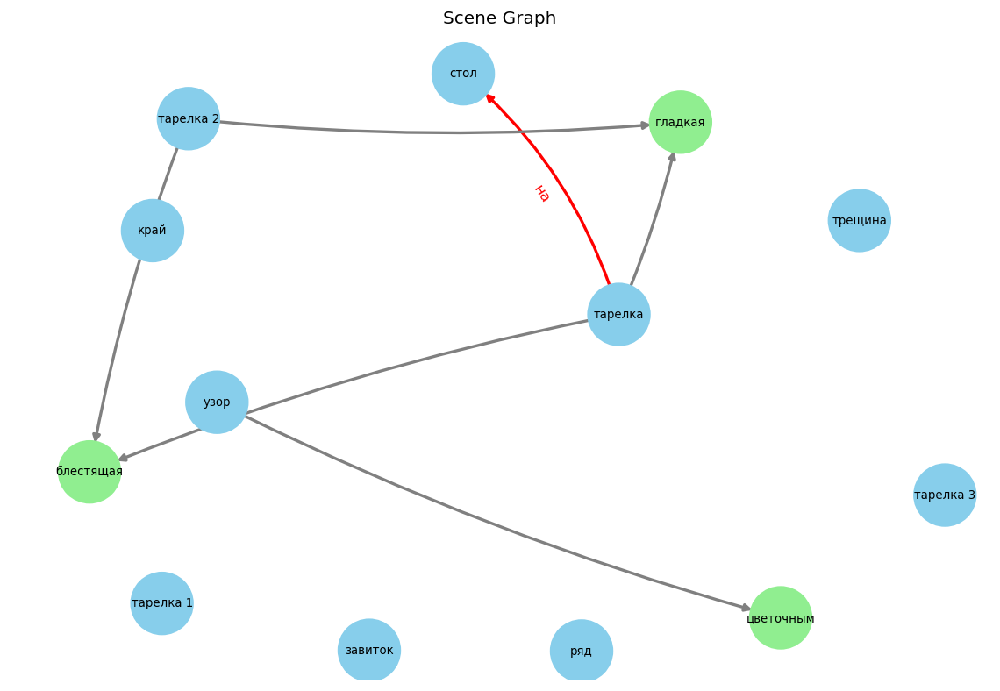


{"src_text": "На стойке регистрации стоит золотая статуэтка. Она выглядит антикварной и привлекает внимание всех проходящих мимо.", "norm_text": "На стойке регистрации стоит антикварная золотая статуэтка, привлекающая внимание всех проходящих мимо.", "objects": ["стойка", "регистрация", "статуэтка", "внимание"], "attributes": {"статуэтка": ["антикварная", "золотая", "привлекающая внимание"]}, "relations": [["статуэтка", "на", "стойка"]]}



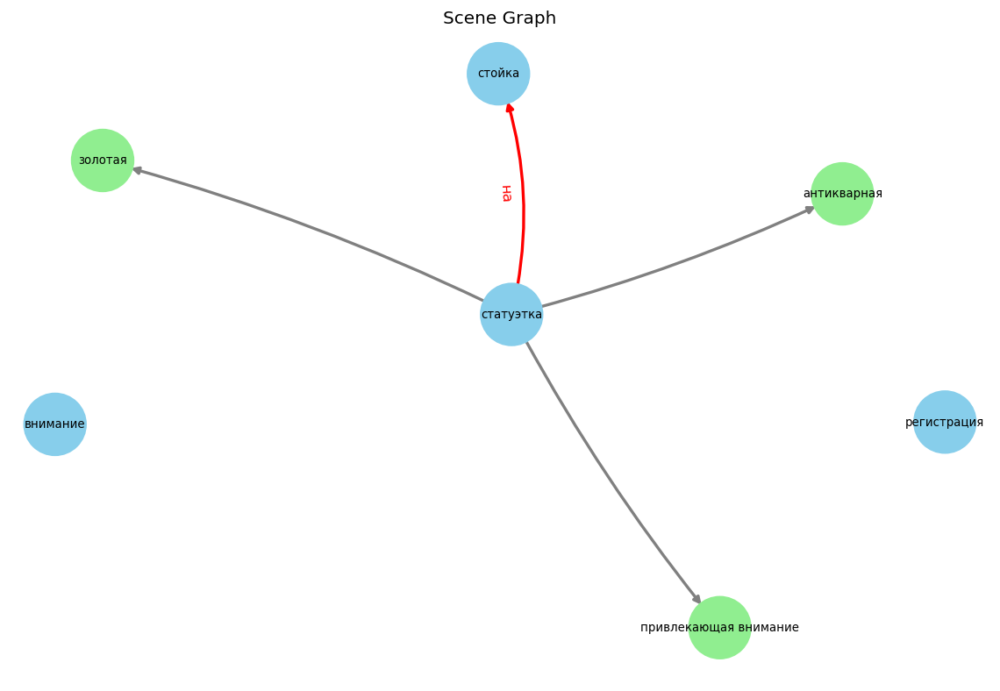


{"src_text": "На дорожке стоит большая каменная статуя, немного покрытая мхом. Справа от неё виден небольшой фонтан, из которого течет вода. Рядом растёт куст с яркими цветами. На углу площадки стоит зеленый садовый стул.", "norm_text": "На дорожке стоит большая каменная статуя, немного покрытая мхом. Справа от статуи виден небольшой фонтан, из которого течет вода. Рядом растёт куст с яркими цветами. На углу площадки стоит зелёный садовый стул.", "objects": ["дорожка", "статуя", "мох", "фонтан", "вода", "куст", "цвет", "угол", "площадка", "стул"], "attributes": {"статуя": ["большая", "каменная", "немного покрытая мхом"], "фонтан": ["виден", "виден из которого", "небольшой"], "цвет": ["яркими"], "стул": ["зелёный", "садовый"]}, "relations": [["статуя", "на", "дорожка"], ["стул", "на", "угол"]]}



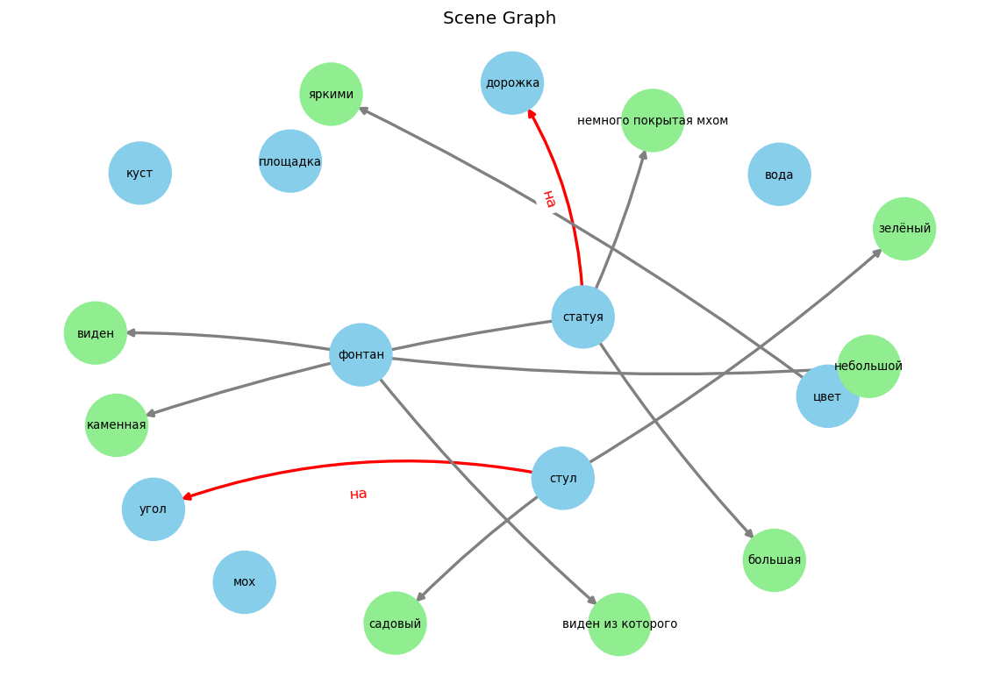


{"src_text": "На сцене стоит высокая лестница, покрытая облупившейся краской. Рядом с ней — старый театральный прожектор, немного наклоненный в сторону.", "norm_text": "На сцене стоит высокая лестница, покрытая облупившейся краской. Рядом с лестницей — старый немного наклоненный в сторону театральный прожектор.", "objects": ["сцена", "лестница", "краска", "сторона", "прожектор"], "attributes": {"лестница": ["высокая", "покрытая краской"], "краска": ["облупившейся"], "прожектор": ["немного наклоненный в сторону", "старый", "театральный"]}, "relations": [["лестница", "на", "сцена"]]}



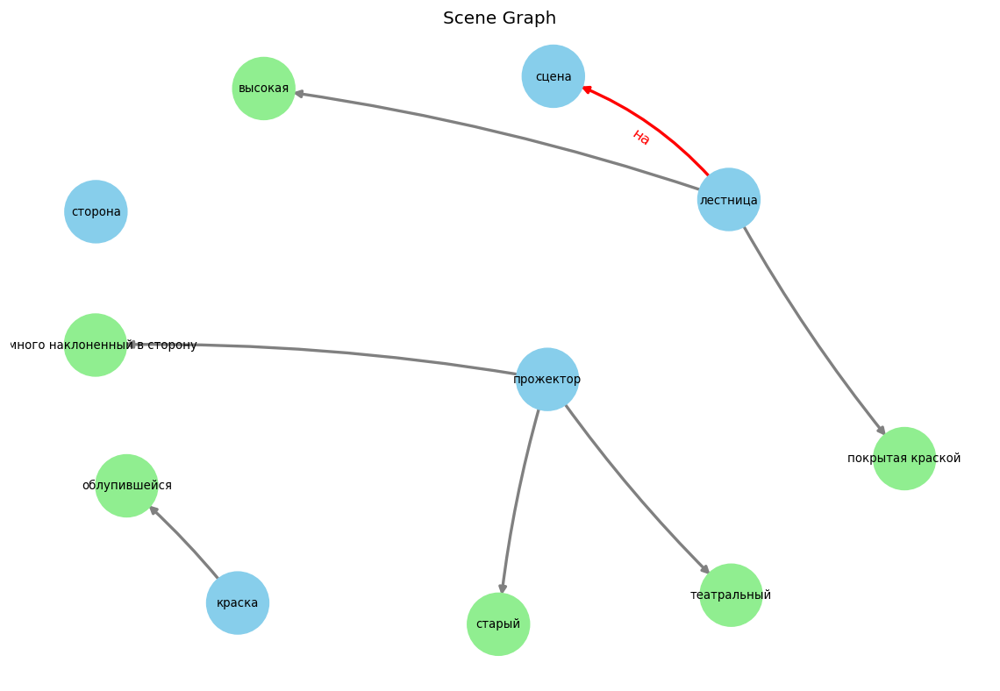


{"src_text": "На столе стоит миниатюрный глобус с антикварным видом. Под ним размещена синяя записная книжка.", "norm_text": "На столе стоит миниатюрный антикварный глобус. Под глобусом размещена синяя записная книжка.", "objects": ["стол", "глобус", "книжка"], "attributes": {"глобус": ["антикварный", "миниатюрный"], "книжка": ["записная", "синяя"]}, "relations": [["глобус", "на", "стол"]]}



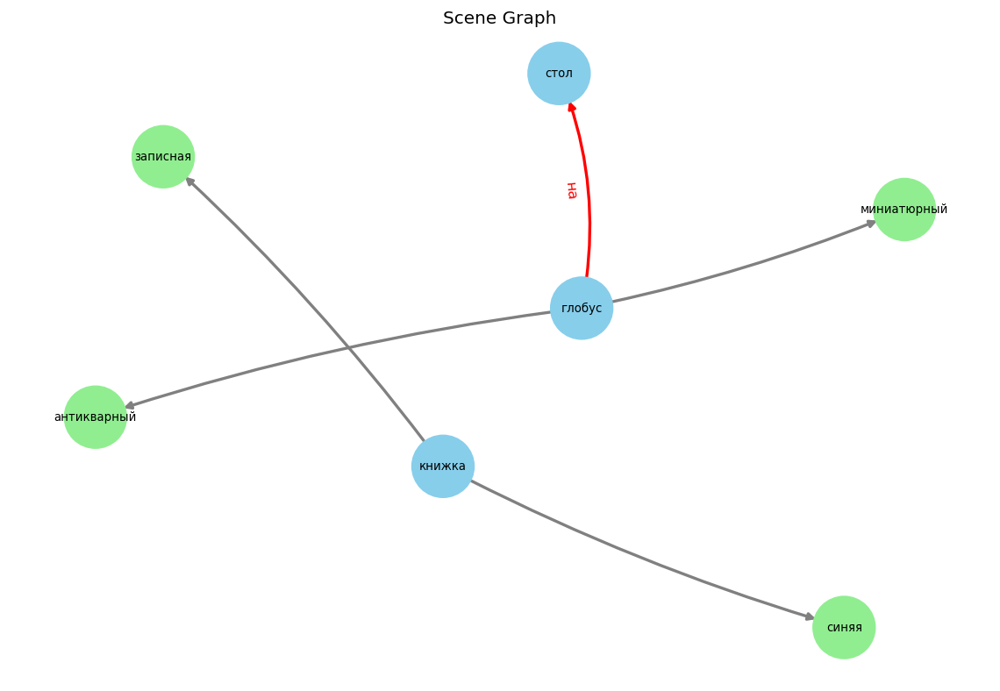


{"src_text": "На земле лежит коричневый кожаный портфель, слегка поцарапанный. Возле него виднеется маленькая зелёная лейка, вся в грязи.", "norm_text": "На земле лежит слегка поцарапанный коричневый кожаный портфель. Возле портфеля виднеется маленькая грязная зелёная лейка.", "objects": ["земля", "портфель", "лейка"], "attributes": {"портфель": ["кожаный", "коричневый", "слегка поцарапанный"], "лейка": ["грязная", "зелёная", "маленькая"]}, "relations": [["лейка", "возле", "портфель"], ["портфель", "на", "земля"]]}



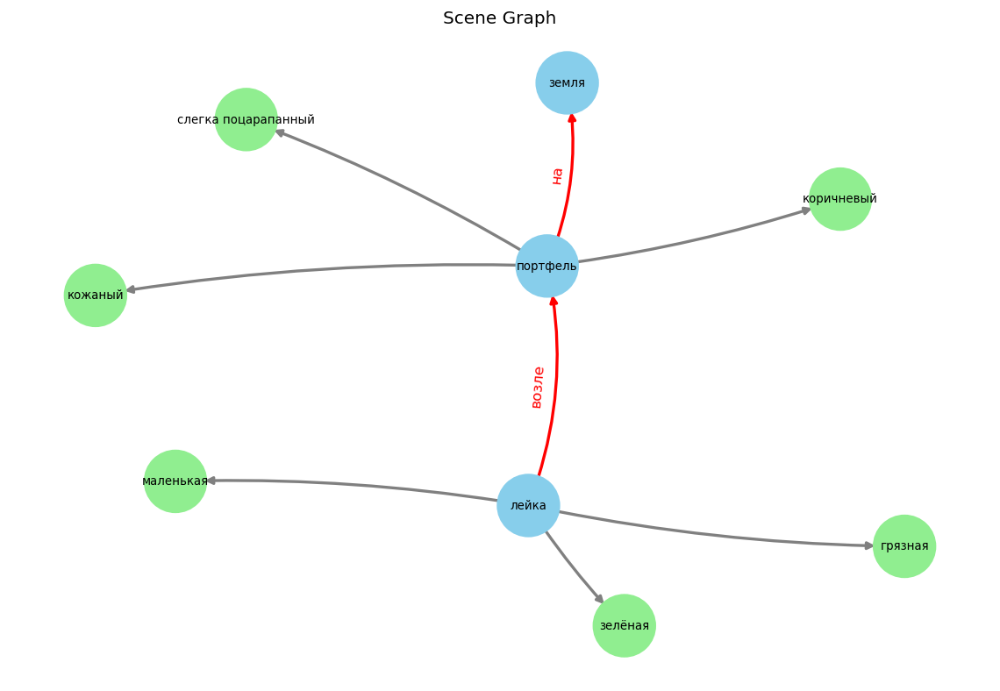


{"src_text": "На рабочем столе расположены две отвертки, одна большая и старая, другая поменьше и новенькая. Под столом стоит картонная коробка с инструментами.", "norm_text": "На рабочем столе расположены большая старая отвертка 1 и поменьше новенькая отвертка 2. Под рабочим столом стоит картонная коробка с инструментами.", "objects": ["стол", "отвёртка 1", "отвёртка 2", "коробка", "инструмент"], "attributes": {"стол": ["рабочем", "рабочим"], "коробка": ["картонная"], "отвёртка 1": ["большая", "расположены", "старая"], "отвёртка 2": ["новенькая"]}, "relations": [["коробка", "под", "стол"]]}



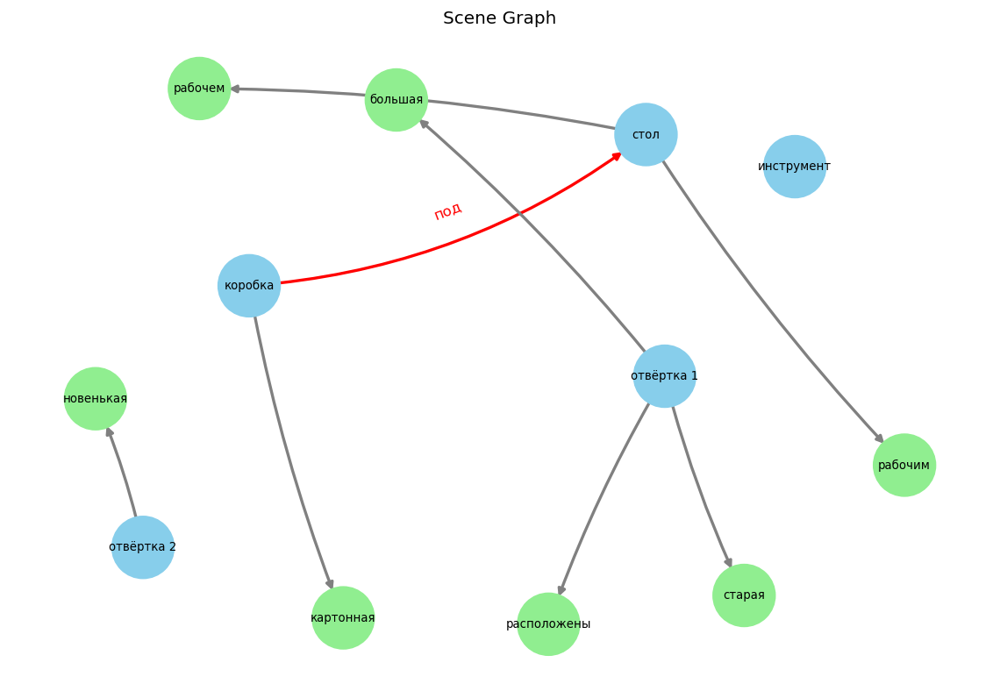


{"src_text": "На скамейке расставлены две глиняные фигурки: одна коричневая, другая серая. Возле них лежит квадратный цветочный горшок, из которого свисает зелёная лоза.", "norm_text": "На скамейке расставлены коричневая глиняная фигурка 1 и серая глиняная фигурка 2. Возле фигурок лежит квадратный цветочный горшок, из которого свисает зелёная лоза.", "objects": ["скамейка", "фигурка 1", "фигурка 2", "фигурка", "горшок", "лоза"], "attributes": {"фигурка": ["глиняная", "коричневая", "серая"], "горшок": ["квадратный", "цветочный"], "лоза": ["зелёная"], "фигурка 1": ["глиняная", "коричневая"], "фигурка 2": ["глиняная", "серая"]}, "relations": [["горшок", "возле", "фигурка"]]}



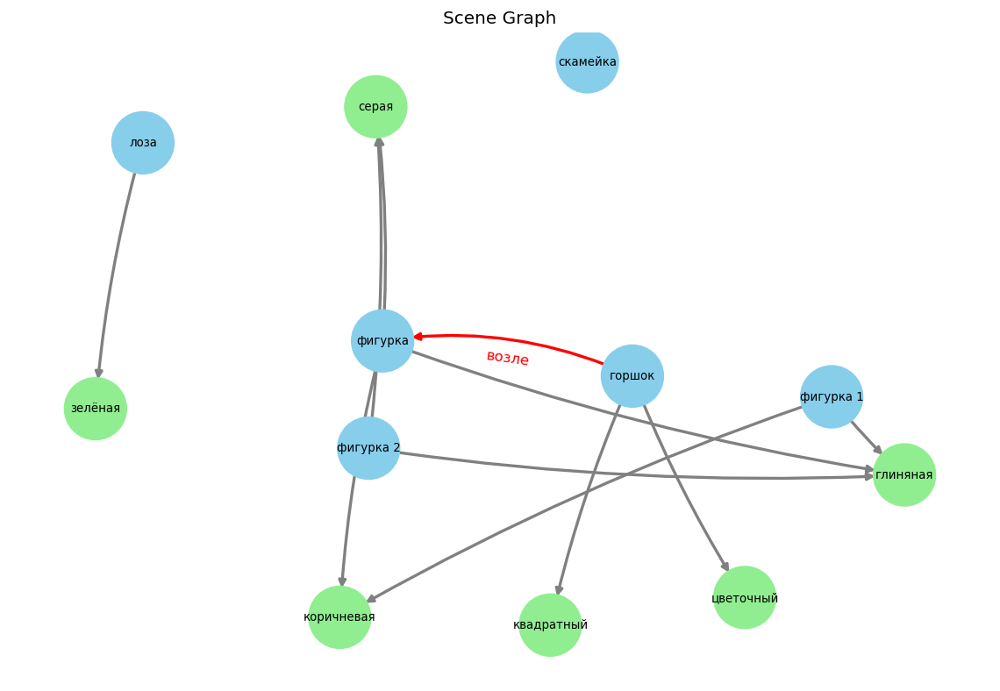


{"src_text": "На полке стоит фарфоровая статуэтка, изящная и аккуратно раскрашенная. Она возвышается среди других безделушек.", "norm_text": "На полке стоит изящная аккуратно раскрашенная фарфоровая статуэтка. Фарфоровая статуэтка возвышается среди других безделушек.", "objects": ["полка", "статуэтка", "безделушка"], "attributes": {"статуэтка": ["аккуратно раскрашенная", "изящная", "фарфоровая"], "безделушка": ["других"]}, "relations": [["статуэтка", "среди", "безделушка"]]}



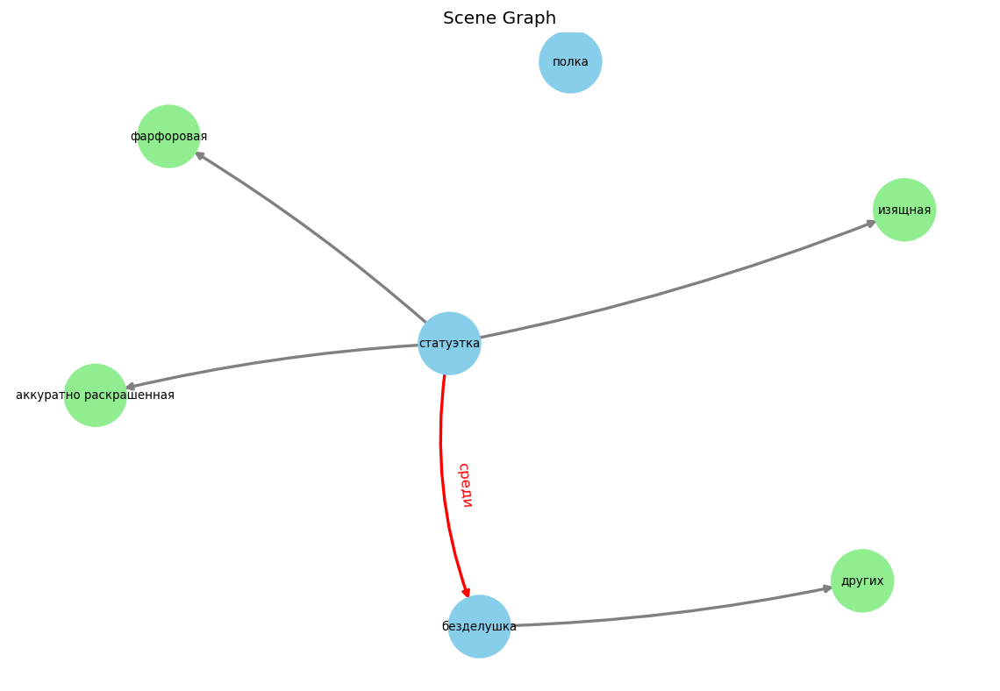


{"src_text": "На верстаке оставлены два инструмента: плоскогубцы, слегка потертые, и молоток с гладкой деревянной ручкой. Они аккуратно сложены друг возле друга.", "norm_text": "На верстаке оставлены слегка потертые плоскогубцы и молоток с гладкой деревянной ручкой. Плоскогубцы и молоток аккуратно сложены друг возле друга.", "objects": ["верстак", "плоскогубцы", "молоток", "ручка"], "attributes": {"плоскогубцы": ["слегка потертые"], "ручка": ["гладкой", "деревянной"]}, "relations": []}



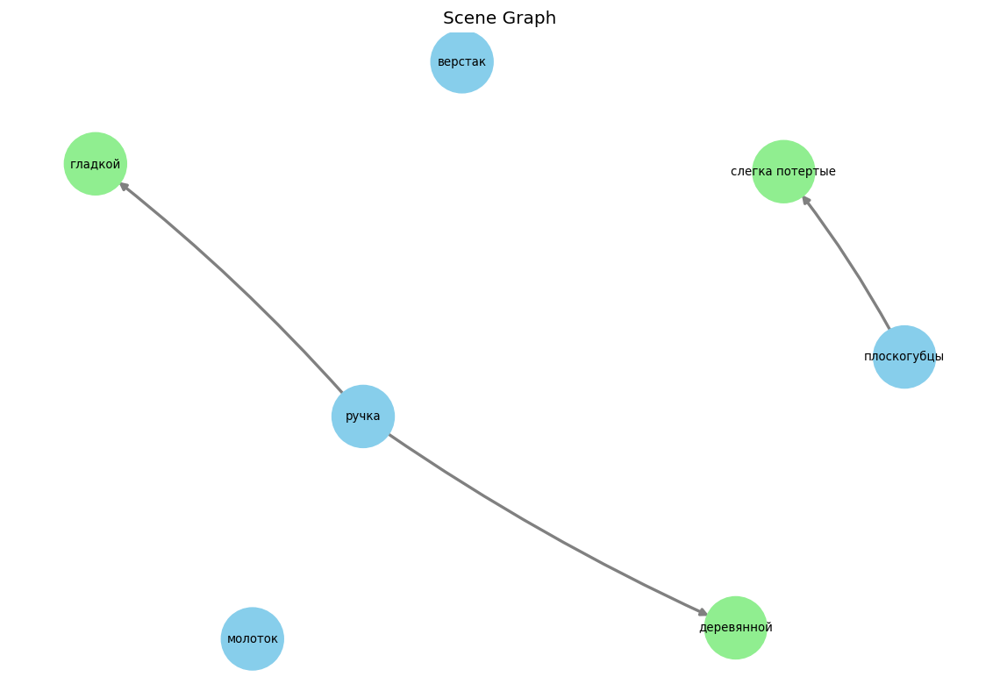


{"src_text": "На полке стоит старая керамическая фигурка, красивая и антикварная.", "norm_text": "На полке стоит красивая антикварная старая керамическая фигурка.", "objects": ["полка", "фигурка"], "attributes": {"фигурка": ["антикварная", "керамическая", "красивая", "старая"]}, "relations": []}



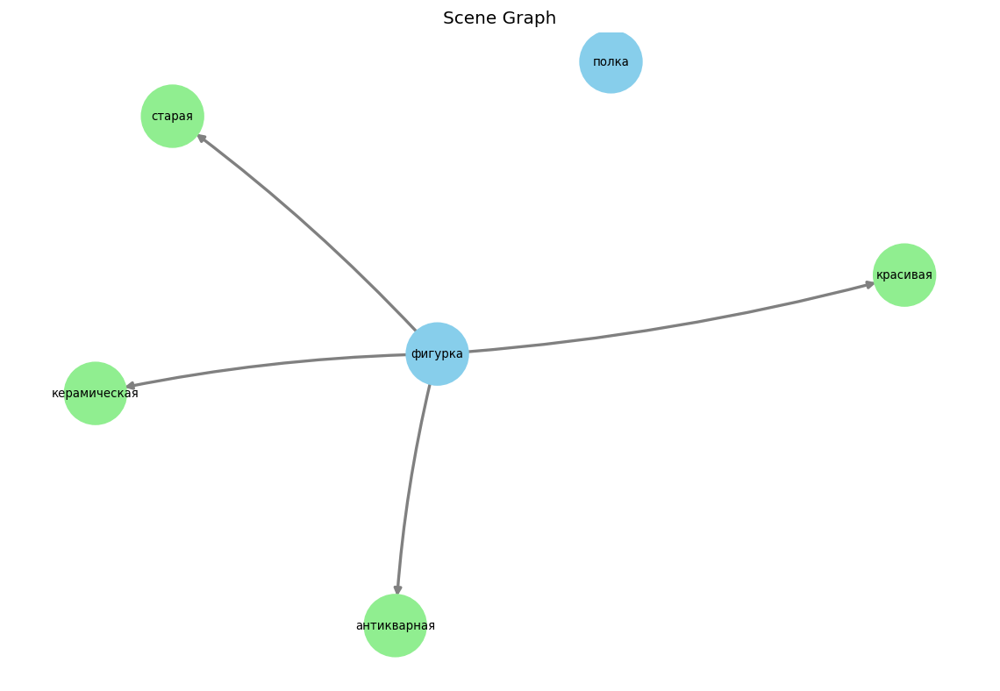


{"src_text": "На парте стоит белая ваза с двумя цветами, аккуратно расставленными. Рядом с ней лежит карандаш.", "norm_text": "На парте стоит белая ваза с двумя аккуратно расставленными цветами. Рядом с вазой лежит карандаш.", "objects": ["парта", "ваза", "цвет", "карандаш"], "attributes": {"ваза": ["белая"], "цвет": ["аккуратно расставленными"]}, "relations": [["карандаш", "рядом с", "ваза"], ["ваза", "на", "парта"]]}



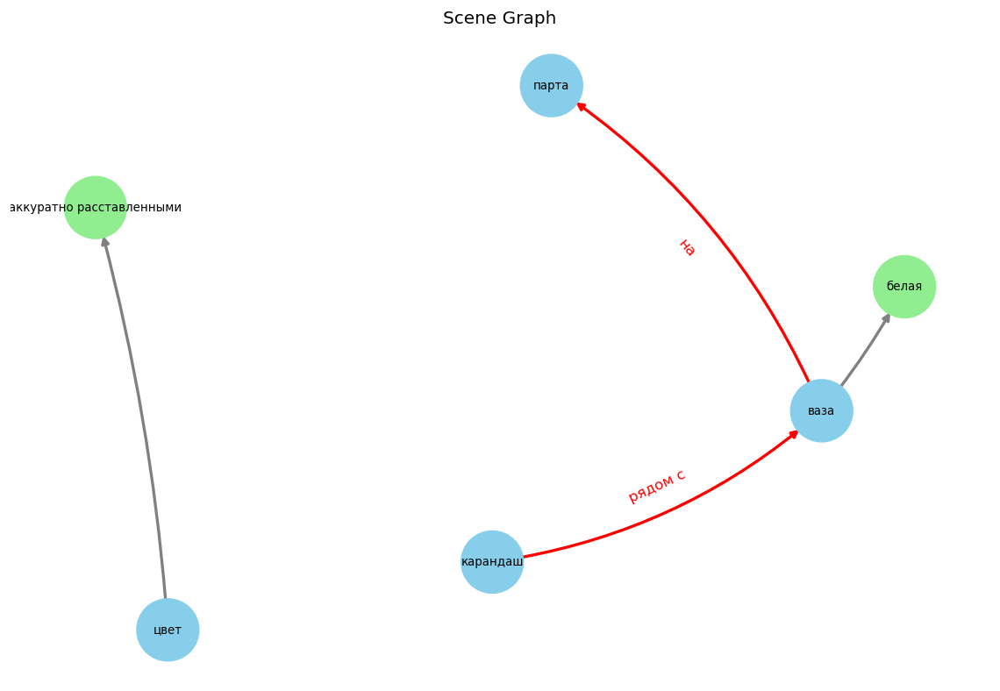


{"src_text": "На столе лежит медицинская маска, аккуратная и одноразовая. Рядом стоит термометр, электронный и современный.", "norm_text": "На столе лежит аккуратная одноразовая медицинская маска. Рядом стоит электронный современный термометр.", "objects": ["стол", "маска", "термометр"], "attributes": {"маска": ["аккуратная", "медицинская", "одноразовая"], "термометр": ["современный", "электронный"]}, "relations": [["маска", "на", "стол"]]}



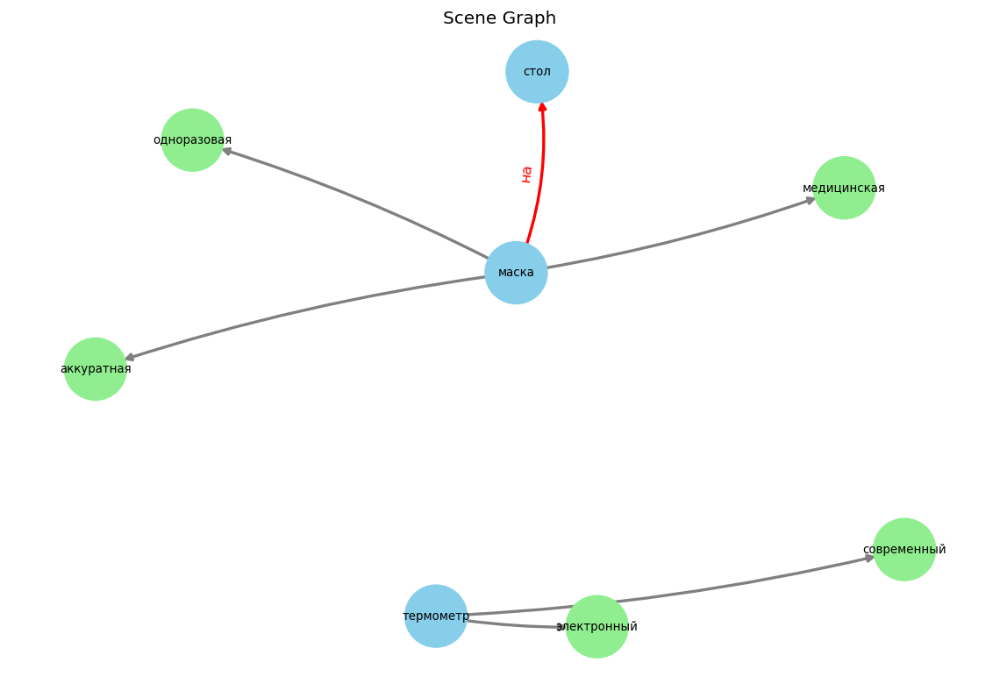


{"src_text": "На полу аккуратно сложены серые спортивные кеды. Рядом стоит ярко-желтая коробка из-под обуви.", "norm_text": "На полу аккуратно сложены серые спортивные кеды. Рядом стоит ярко-желтая коробка из-под обуви.", "objects": ["пол", "кеды", "коробка", "обувь"], "attributes": {"кеды": ["серые", "спортивные"], "коробка": ["-", "желтая", "ярко"]}, "relations": [["коробка", "под", "обувь"], ["коробка", "из", "обувь"], ["коробка", "-", "обувь"]]}



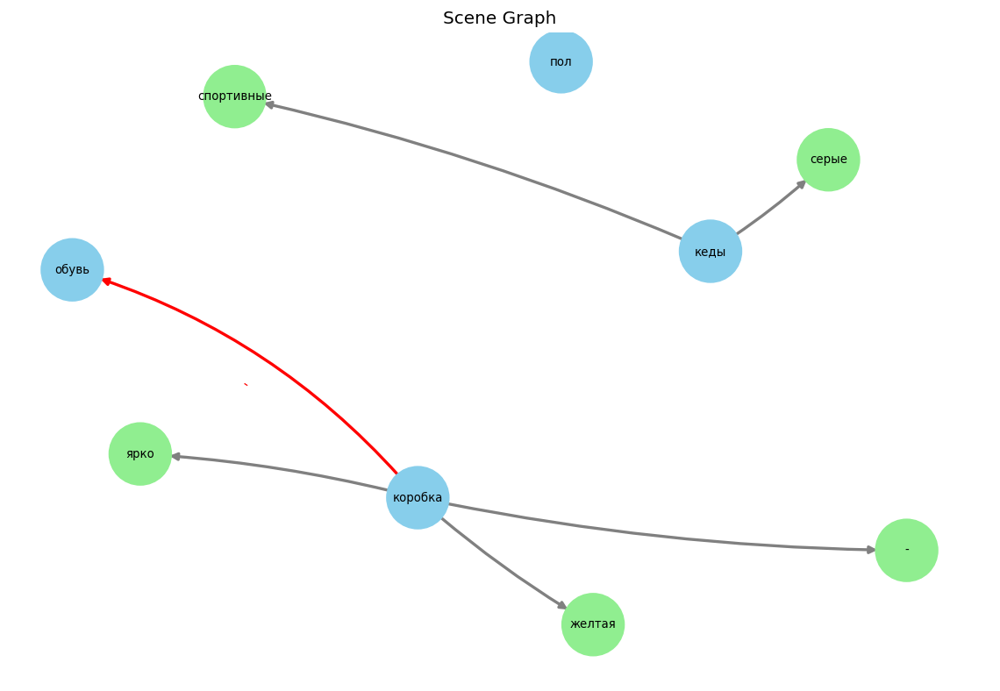


{"src_text": "На полке лежит коричневая кожаная перчатка, немного потрёпанная. Рядом стоит зонт в клетку, аккуратно сложенный.", "norm_text": "На полке лежит немного потрёпанная коричневая кожаная перчатка. Рядом стоит аккуратно сложенный зонт в клетку.", "objects": ["полка", "перчатка", "зонт", "клетка"], "attributes": {"перчатка": ["кожаная", "коричневая", "немного потрёпанная"], "зонт": ["аккуратно сложенный"]}, "relations": []}



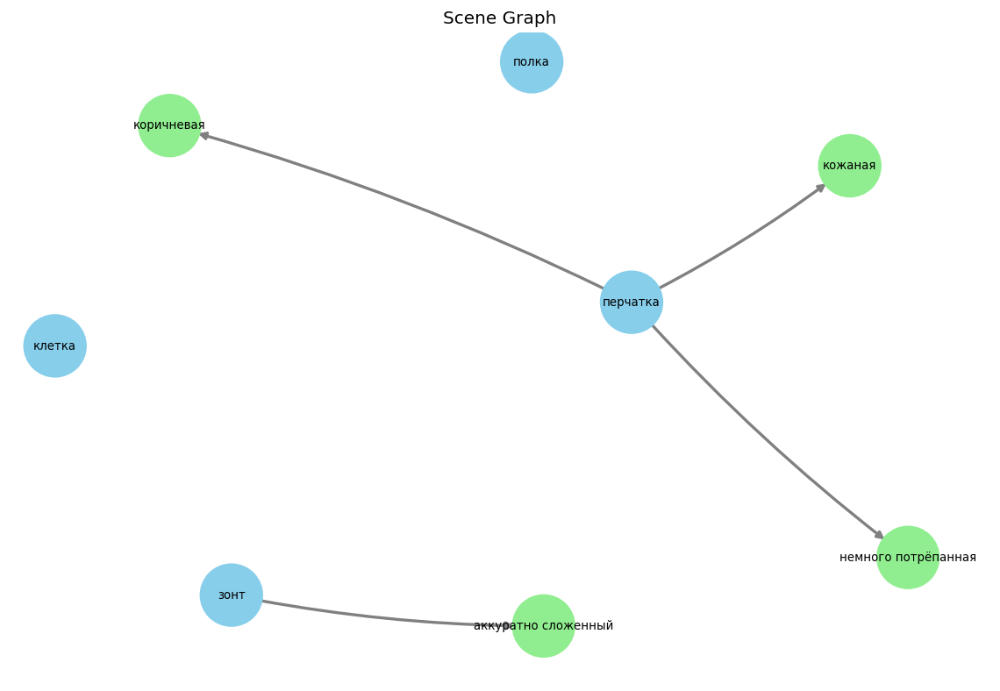


{"src_text": "На полке у входа стоит кожаная сумка, выглядящая стильно. Рядом пара старых ботинок, слегка покосившихся.", "norm_text": "На полке у входа стоит стильная кожаная сумка. Рядом находятся слегка покосившиеся старые ботинки 1 и старые ботинки 2.", "objects": ["полка", "вход", "сумка", "ботинок 1", "ботинок 2"], "attributes": {"сумка": ["кожаная", "стильная"], "ботинок 1": ["слегка покосившиеся", "старые"], "ботинок 2": ["старые"]}, "relations": [["сумка", "у", "вход"]]}



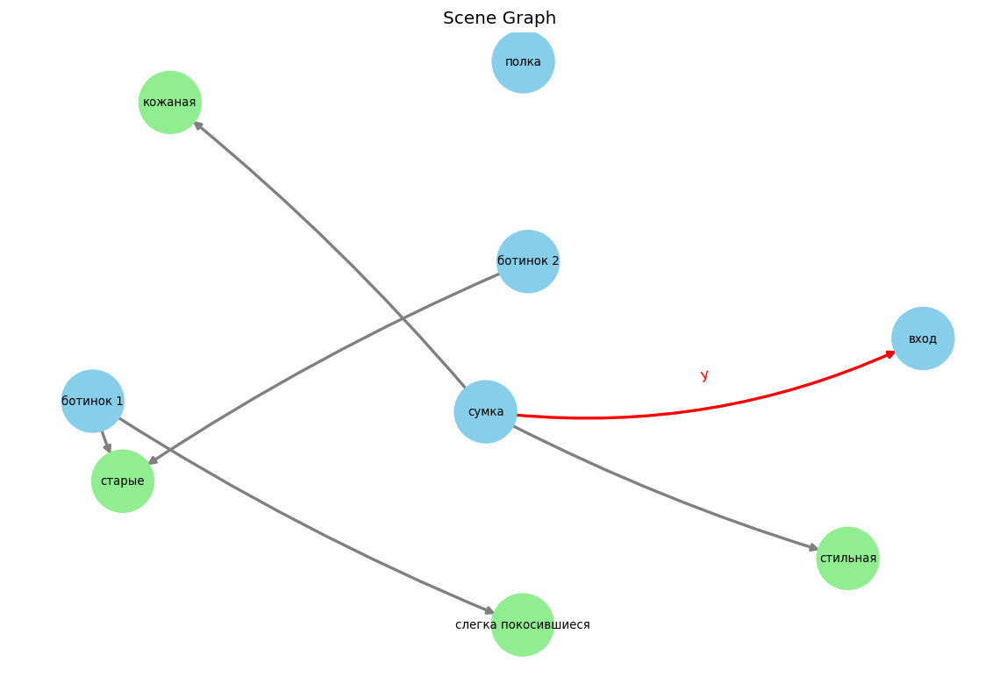


{"src_text": "На полке стоят три банка краски: зеленая, фиолетовая и оранжевая. Рядом с ними кисть с засохшей краской.", "norm_text": "На полке стоят зелёная банка краски 1, фиолетовая банка краски 2 и оранжевая банка краски 3. Рядом с банками краски находится кисть с засохшей краской.", "objects": ["полка", "банка", "краска 1", "краска 2", "краска 3", "банк", "краска", "кисть"], "attributes": {"краска": ["засохшей"]}, "relations": [["кисть", "рядом с", "банка"]]}



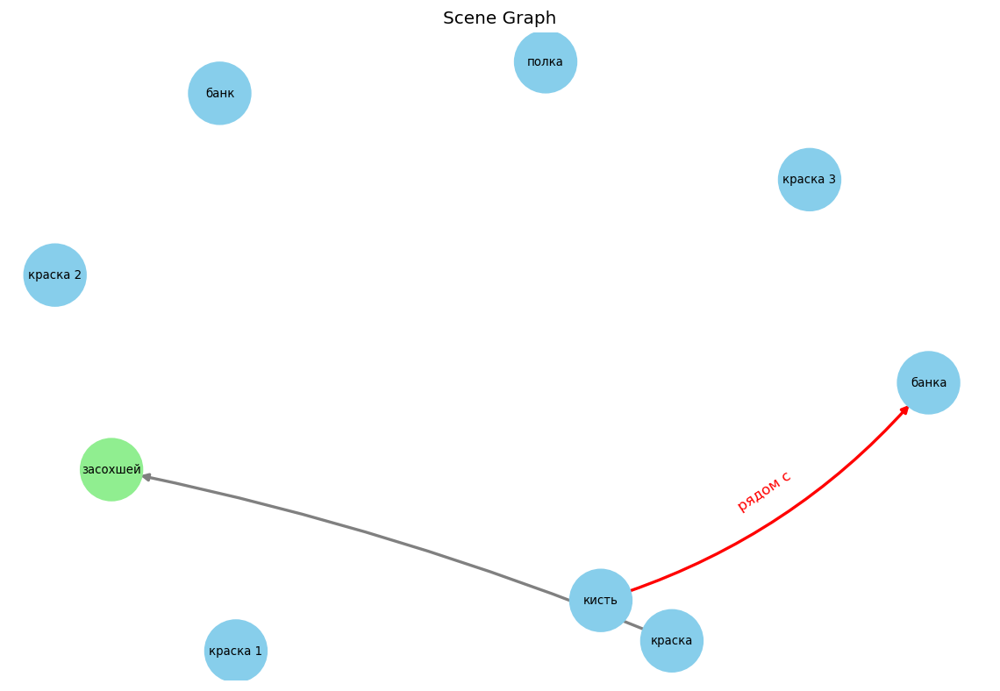


{"src_text": "На витрине стоит серебристая кофеварка и керамическая кружка. Кружка шоколадного цвета, с мелким узором, расположена перед кофеваркой.", "norm_text": "На витрине стоит серебристая кофеварка и шоколадная керамическая кружка с мелким узором, расположенная перед кофеваркой.", "objects": ["витрина", "кофеварка", "кружка", "узор"], "attributes": {"кофеварка": ["серебристая"], "кружка": ["керамическая", "шоколадная"], "узор": ["мелким"]}, "relations": [["кофеварка", "на", "витрина"], ["кружка", "на", "витрина"]]}



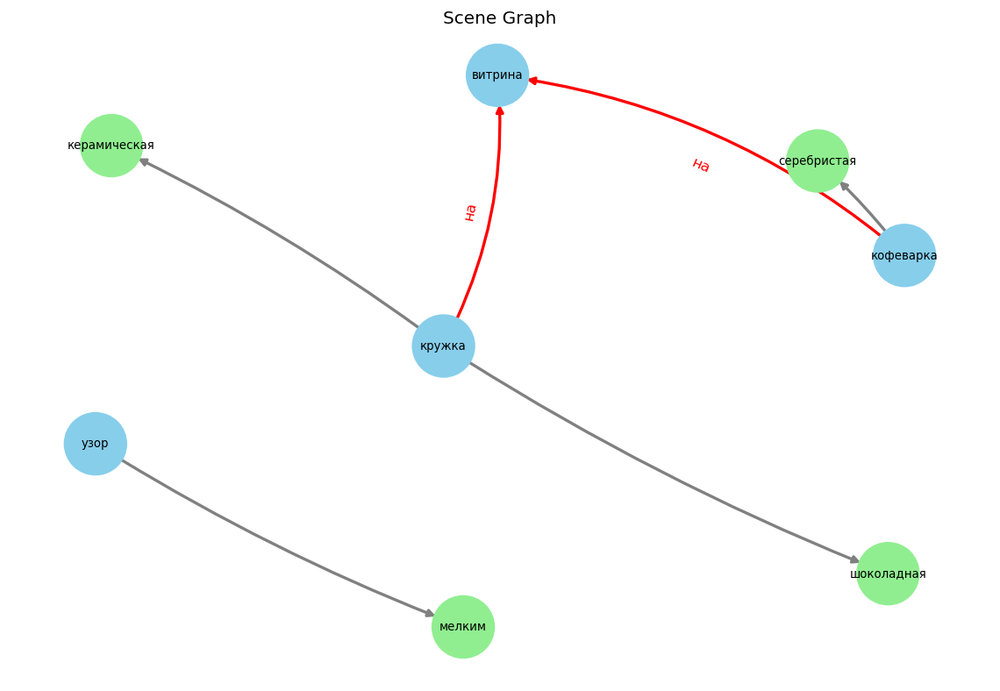


{"src_text": "На тумбе стоит медицинский прибор, серебристый и аккуратный. Около окна кресло, тёмное и комфортное. У кровати столик, на котором покоится стакан с водой. В углу комнаты кабинет с рентгеновским оборудованием.", "norm_text": "На тумбе стоит серебристый аккуратный медицинский прибор. Около окна находится тёмное комфортное кресло. У кровати стоит столик, на столике покоится стакан с водой. В углу комнаты расположен кабинет с рентгеновским оборудованием.", "objects": ["тумба", "прибор", "окно", "кресло", "кровать", "столик", "стакан", "вода", "угол", "комната", "кабинет", "оборудование"], "attributes": {"прибор": ["аккуратный", "медицинский", "серебристый"], "кресло": ["комфортное", "тёмное"], "оборудование": ["рентгеновским"], "кабинет": ["расположен"]}, "relations": [["кресло", "около", "окно"], ["стакан", "на", "столик"], ["прибор", "на", "тумба"], ["столик", "у", "кровать"]]}



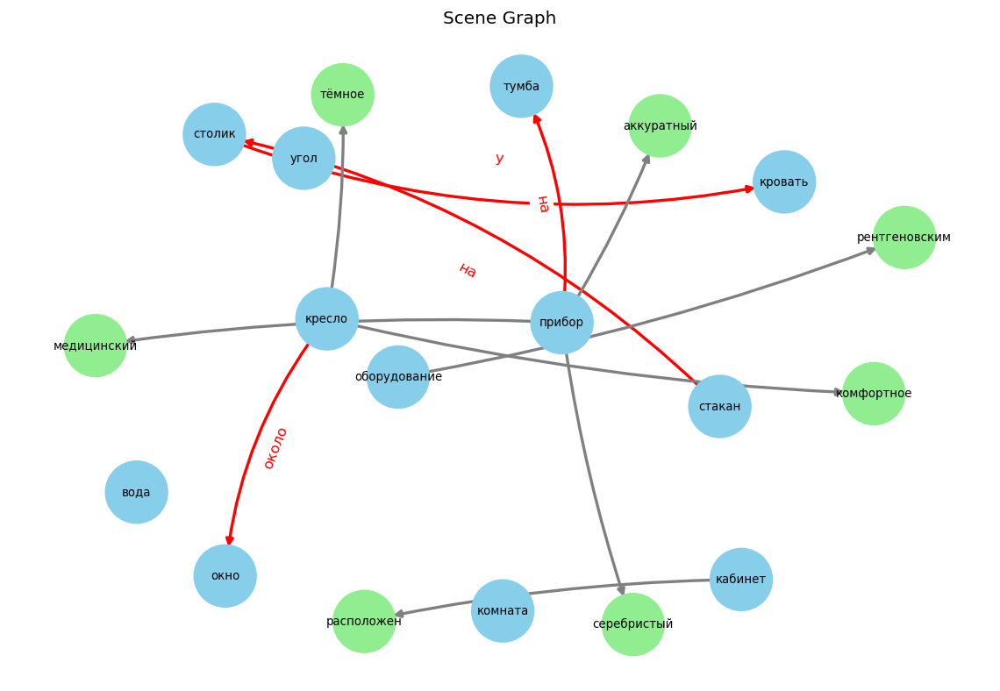


{"src_text": "На рабочем столе лежит медицинский справочник, слегка потрёпанный. Возле него стоит оранжевый стаканчик с ручками.", "norm_text": "На рабочем столе лежит слегка потрёпанный медицинский справочник. Возле справочника стоит оранжевый стаканчик с ручками.", "objects": ["стол", "справочник", "стаканчик", "ручка"], "attributes": {"стол": ["рабочем"], "справочник": ["медицинский", "слегка потрёпанный"], "стаканчик": ["оранжевый"]}, "relations": [["стаканчик", "возле", "справочник"], ["справочник", "на", "стол"]]}



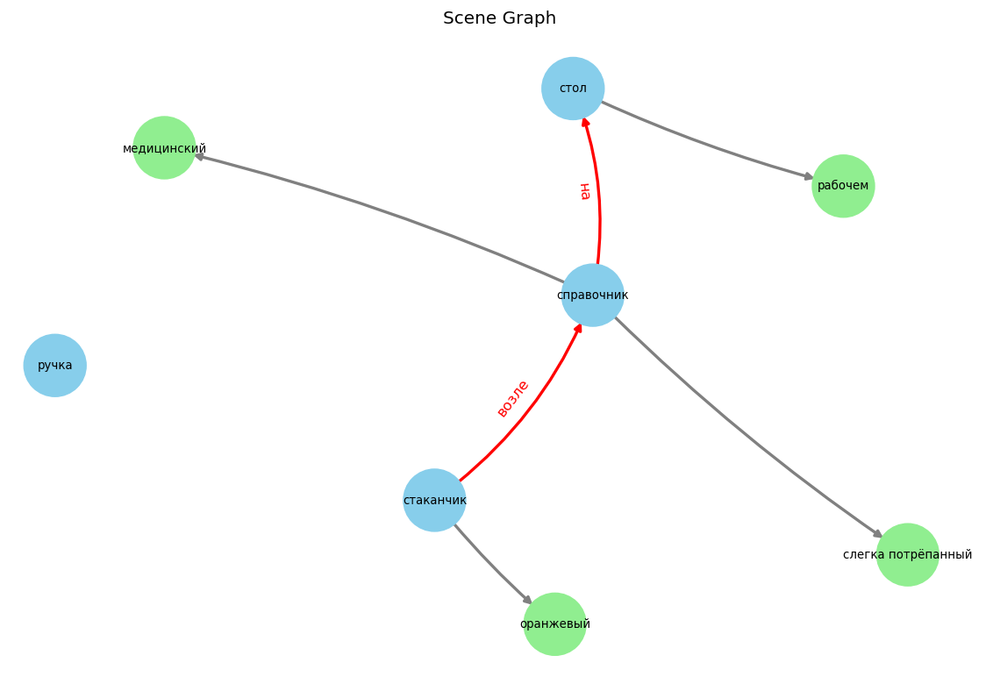


{"src_text": "На лавке в зале аэропорта оставлен кожаный чемодан, темно-коричневый и аккуратный. Рядом с ним стоит небольшая дорожная сумка.", "norm_text": "На лавке в зале аэропорта оставлен темно-коричневый аккуратный кожаный чемодан. Рядом с чемоданом стоит небольшая дорожная сумка.", "objects": ["лавка", "зал", "аэропорт", "чемодан", "сумка"], "attributes": {"чемодан": ["-", "аккуратный", "кожаный", "коричневый", "темно"], "сумка": ["дорожная", "небольшая"]}, "relations": [["сумка", "рядом с", "чемодан"]]}



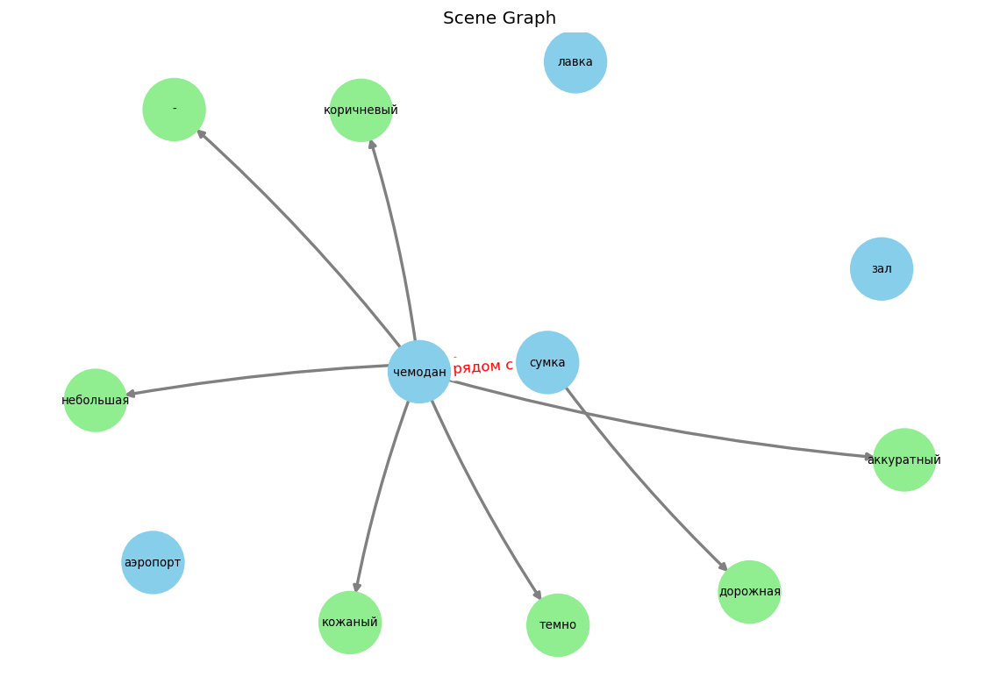


{"src_text": "На столе в сарае стоит высокая лампа, изящная и современная, с теплым светом. Она расположена в центре, освещая окружающее пространство.", "norm_text": "На столе в сарае стоит высокая изящная современная лампа с тёплым светом, расположенная в центре и освещающая окружающее пространство.", "objects": ["стол", "сарай", "лампа", "свет", "центр", "пространство"], "attributes": {"лампа": ["высокая", "изящная", "современная"], "свет": ["тёплым"], "пространство": ["окружающее"]}, "relations": [["лампа", "на", "стол"], ["лампа", "в", "сарай"]]}



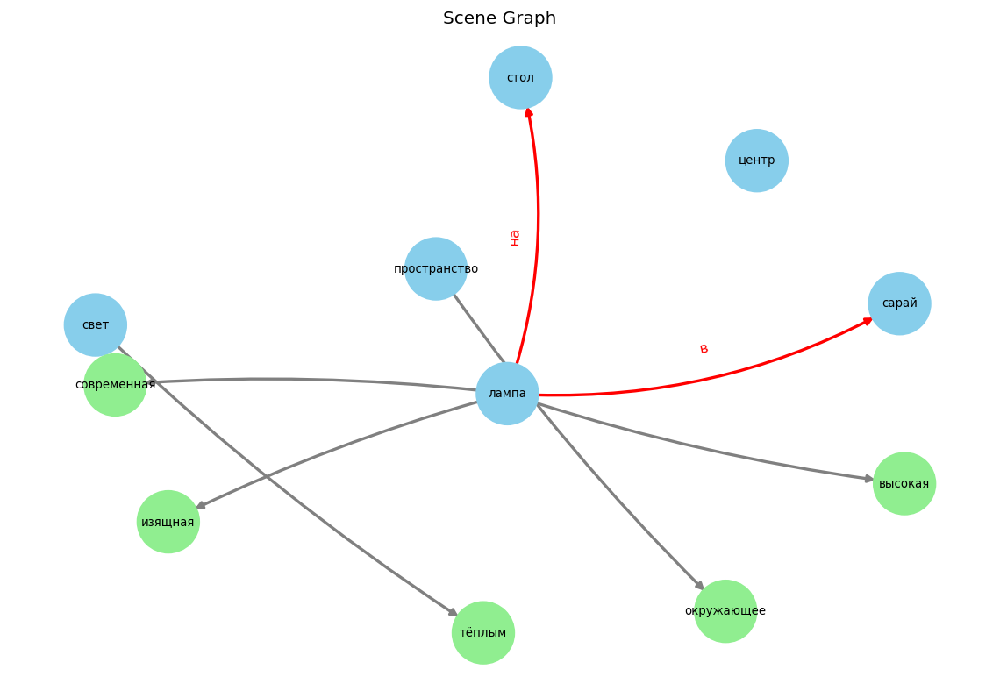


{"src_text": "На чердаке покоится пыльный картонный ящик и рваный кожаный ремень. Ящик стоит у стены, а ремень свисает с него.", "norm_text": "На чердаке покоится пыльный картонный ящик, стоящий у стены, и рваный кожаный ремень, свисающий с ящика.", "objects": ["чердак", "ящик", "стена", "ремень"], "attributes": {"ящик": ["картонный", "пыльный", "стоящий у стены"], "ремень": ["кожаный", "рваный", "свисающий с ящика"]}, "relations": [["ремень", "на", "чердак"], ["ящик", "на", "чердак"]]}



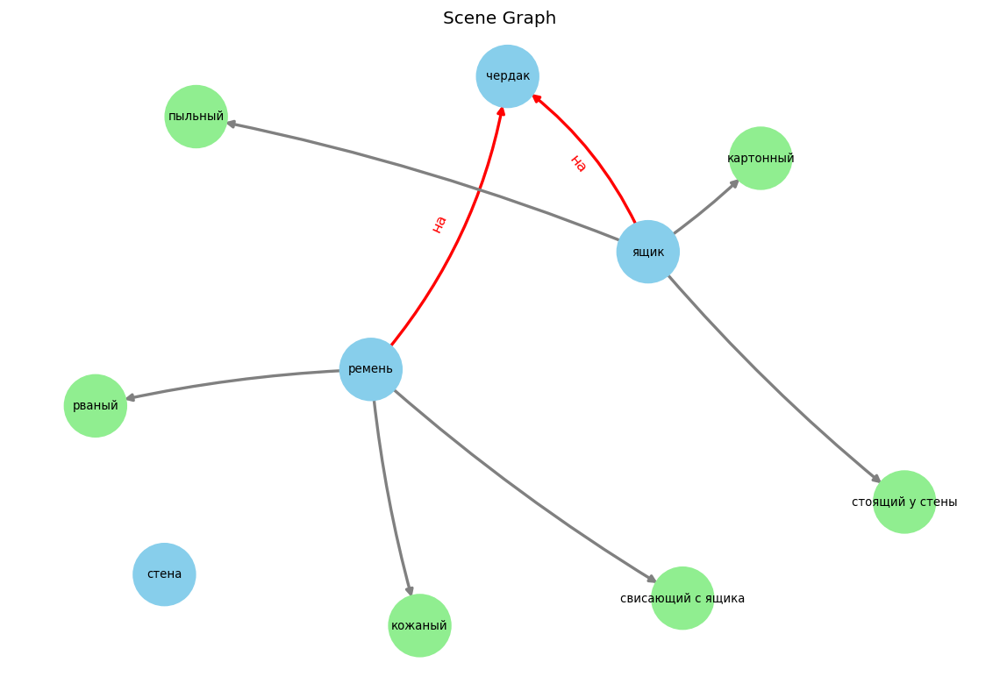


{"src_text": "На подоконнике стоит растение в коричневом горшке. Под ним лежит газета, немного помятая, среди нескольких карандашей.", "norm_text": "На подоконнике стоит растение в коричневом горшке. Под горшком лежит немного помятая газета среди нескольких карандашей.", "objects": ["подоконник", "растение", "горшок", "газета", "карандашей"], "attributes": {"горшок": ["коричневом"], "газета": ["немного помятая"]}, "relations": [["газета", "под", "горшок"], ["растение", "на", "подоконник"]]}



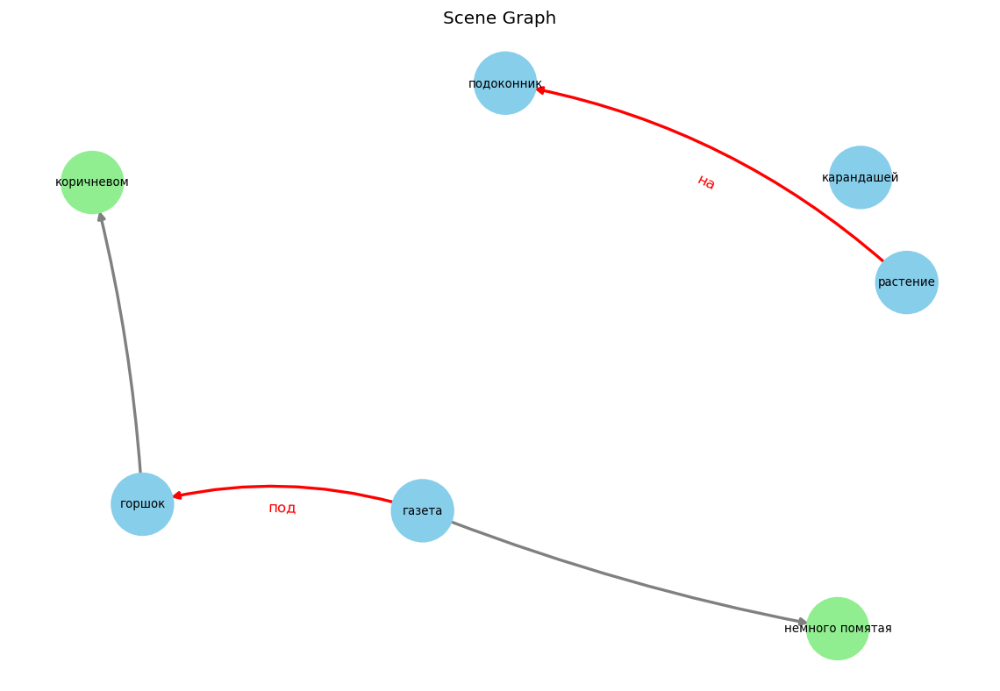


{"src_text": "На чердаке стоит антикварный комод темного дерева. Над ним на полу пылится картонная коробка, из которой выглядывает старинная фарфоровая кукла в порванном платье.", "norm_text": "На чердаке стоит антикварный комод из темного дерева. Над комодом на полу пылится картонная коробка, из которой выглядывает старинная фарфоровая кукла в порванном платье.", "objects": ["чердак", "комод", "дерево", "пол", "коробка", "кукла", "платье"], "attributes": {"комод": ["антикварный"], "дерево": ["темного"], "коробка": ["картонная"], "кукла": ["старинная", "фарфоровая"], "платье": ["порванном"]}, "relations": [["комод", "на", "чердак"], ["коробка", "на", "пол"], ["кукла", "в", "платье"], ["коробка", "над", "комод"]]}



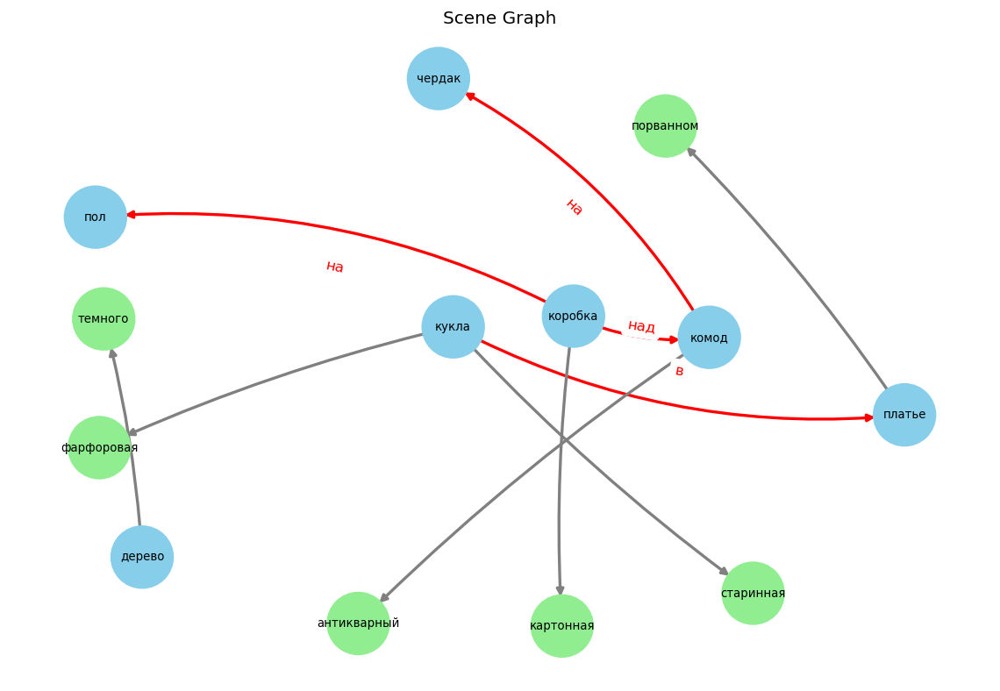


{"src_text": "На столе стоит большая глинавая ваза светло-голубого цвета, с изящными узорами. Она выглядит очень элегантно и стильно.", "norm_text": "На столе стоит большая элегантная стильная светло-голубая глиняная ваза с изящными узорами.", "objects": ["стол", "ваза", "узор"], "attributes": {"ваза": ["-", "большая", "глиняная", "голубая", "светло", "стильная", "элегантная"], "узор": ["изящными"]}, "relations": [["ваза", "на", "стол"]]}



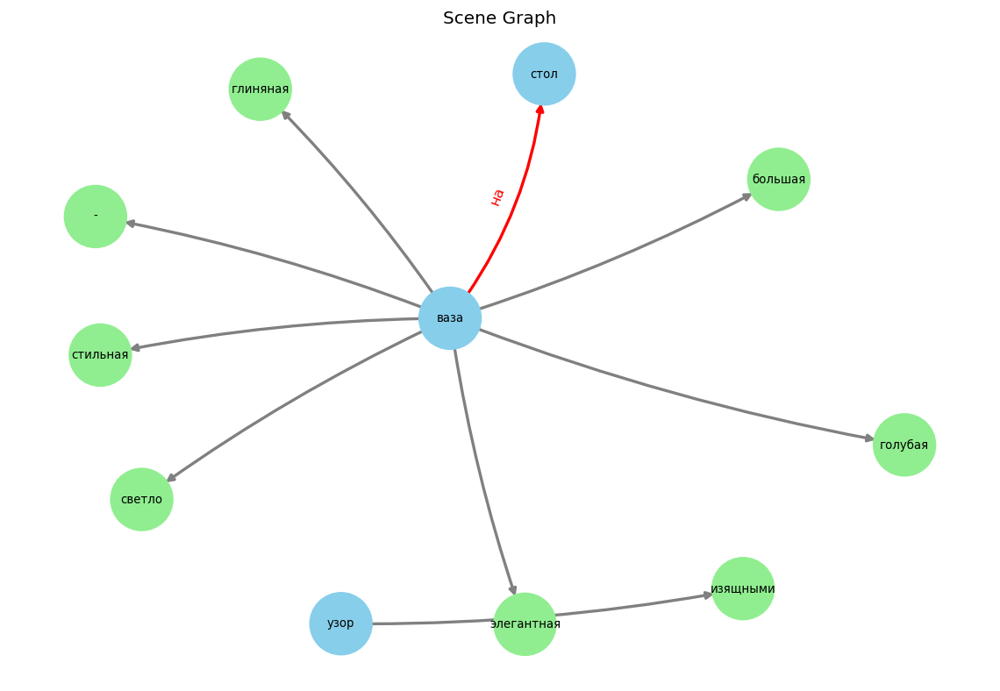


{"src_text": "На стуле лежит светлый плед из шерсти, мягкий и уютный. Рядом стоит металлическая подставка для капельницы, массивная и устойчивая.", "norm_text": "На стуле лежит светлый мягкий уютный шерстяной плед. Рядом стоит массивная устойчивая металлическая подставка для капельницы.", "objects": ["стул", "плед", "подставка", "капельница"], "attributes": {"плед": ["мягкий", "светлый", "уютный", "шерстяной"], "подставка": ["массивная", "металлическая", "устойчивая"]}, "relations": [["плед", "на", "стул"]]}



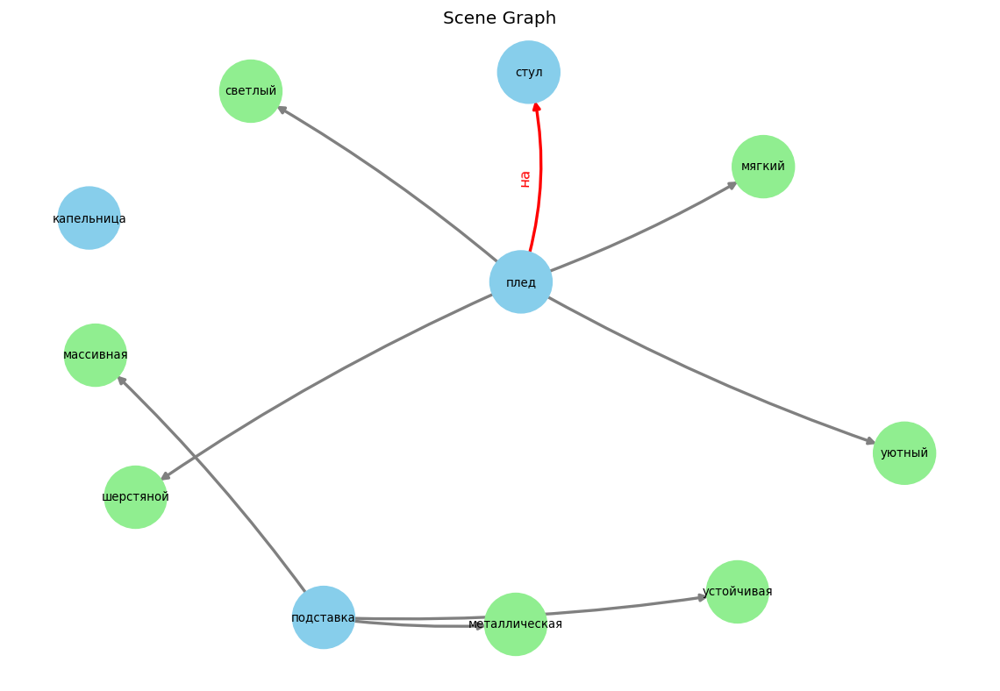

In [13]:
with open(f"dataset_text2json_spacy/dataset_{BATCH_NUM}.jsonl", "r", encoding="utf-8") as f:
    for i, line in enumerate(f, 1):
        print(line)
        data = json.loads(line)
        #print("\nsrc_text:", data.get("src_text", ""))
        #print("\nnorm_text:", data.get("norm_text", ""))
        #print("\nobjects:", data.get("objects", []))
        #print("\nattributes:")
        #for obj, attrs in data.get("attributes", {}).items():
        #    print(f"  {obj}: {attrs}")
        #print("\nrelations:")
        #for rel in data.get("relations", []):
        #    print(f"  {rel[0]} {rel[1]} {rel[2]}")
            
        G = build_scene_graph_sp(data.get("objects", []), data.get("attributes", {}), data.get("relations", []))
        draw_scene_graph_sp(G)            
        print()